# Predicción de enfermedad de diabetes


**Trabajo de Fin de Master , Iratxe Urbaneja**

## TABLA DE CONTENIDOS:
1. Introducción
2. Análisis exploratorio de datos
3. Limpieza de los datos
4. Selección de características
5. División de los datos en grupos de entrenamiento y test + preprocesado con escalado y SMOTE
6. Entrenamiento de módelo predictivo
7. Evaluación del modelo con métricas de rendimiento

--------------------------

# 1. INTRODUCCIÓN:

PROBLEMA: La diabetes es una enfermedad crónica que afecta a millones de personas en todo el mundo. Según la Organización Mundial de la Salud (OMS), la prevalencia global de diabetes en adultos ha aumentado del 4.7% en 1980 al 8.5% en 2014. La diabetes tipo 2, que es el tipo más común, está particularmente asociada con la obesidad y el estilo de vida sedentario. En algunas poblaciones, como los indios Pima de Arizona, la prevalencia de diabetes tipo 2 es excepcionalmente alta, llegando hasta el 50% en adultos. El diagnóstico temprano y la identificación de factores de riesgo son cruciales para prevenir complicaciones graves como enfermedades cardiovasculares, nefropatía, retinopatía y neuropatía. Este estudio tiene como objetivo desarrollar un modelo predictivo para identificar el riesgo de diabetes basado en factores clínicos y demográficos.

DATASET: El conjunto de datos de Diabetes de los Indios Pima, originalmente del Instituto Nacional de Diabetes y Enfermedades Digestivas y Renales, contiene información de 768 mujeres de al menos 21 años de edad de herencia Pima India. Este dataset ha sido ampliamente utilizado en la investigación de aprendizaje automático para la predicción de diabetes. Incluye variables como el número de embarazos, IMC, nivel de insulina, edad y otras medidas relevantes. El objetivo es predecir si una paciente tiene diabetes basándose en estas medidas diagnósticas.[link text](https://)

----------------------------------------------------------------------

## PRIMEROS PASOS:
Antes de poder relaizar nuestro análisis exploratorio de los datos vamos a:
- Importar las librerias necesarias
- Importar el archico csv con los datos
- Crear un Pandas DataFrame para poder trabajar coo los datos
- Comprobar si existen Duplicados

In [ ]:
# Importamos las librerias necesarias:

# Cargamos rich para enriquecer texto
from rich.console import Console
console = Console()

# Librerías básicas para análisis de datos y manipulación
import pandas as pd
import numpy as np
from collections import Counter

# Librerías para visualización
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.mosaicplot import mosaic

# Librerías para análisis estadístico
from scipy import stats
from scipy.stats import chi2_contingency, kurtosis, shapiro
from statsmodels.stats.contingency_tables import Table2x2

# Librerías de scikit-learn para preprocesamiento, selección de características y modelado
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler, StandardScaler, normalize, LabelEncoder
from sklearn.feature_selection import SelectKBest, chi2, mutual_info_classif
from sklearn.feature_selection import SelectFromModel, SelectKBest, f_classif, mutual_info_classif, RFE
from sklearn.decomposition import PCA
from imblearn.combine import SMOTETomek

from sklearn.model_selection import (train_test_split, cross_val_score, KFold, GridSearchCV,
                                     RandomizedSearchCV, StratifiedKFold, cross_val_predict)
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.metrics import (classification_report, confusion_matrix, roc_curve, auc, roc_auc_score,
                             precision_recall_curve, average_precision_score, make_scorer)
from sklearn.inspection import permutation_importance
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    classification_report, confusion_matrix, roc_auc_score, roc_curve,
    precision_score, recall_score, f1_score
)

# Modelos de machine learning
from sklearn.linear_model import LogisticRegression, Lasso
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (RandomForestClassifier, GradientBoostingClassifier,
                              VotingClassifier, StackingClassifier)
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier

# Librerías para manejo de desbalanceo de clases
from imblearn.over_sampling import SMOTE, ADASYN, BorderlineSMOTE
from imblearn.pipeline import Pipeline as ImbPipeline

# Para manejo de advertencias
import warnings
warnings.filterwarnings('ignore')

# Para transformaciones logarítmicas
from numpy import log1p

# Configuración para mostrar gráficos en el notebook
%matplotlib inline

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving diabetes.csv to diabetes (1).csv


In [ ]:
# Creamos un dataframe del archivo que se llama 'diabetes.csv'
df = pd.read_csv('diabetes.csv')

In [ ]:
# Comprobar duplicados en el DataFrame
duplicados = df.duplicated()

# Contar el número de duplicados
num_duplicados = duplicados.sum()

print(f"Número de filas duplicadas: {num_duplicados}")

Número de filas duplicadas: 0


- Visulaizaremos las primeras filas del DataFrame
- Visualizaremos la estructura del DataFrame y los tipos de datos
- Extraeremos los atributos identificando la variable objetivo y las variables independientes


In [ ]:
print(df.head(20))
print(df.info())

    Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
0             6      148             72             35        0  33.6   
1             1       85             66             29        0  26.6   
2             8      183             64              0        0  23.3   
3             1       89             66             23       94  28.1   
4             0      137             40             35      168  43.1   
5             5      116             74              0        0  25.6   
6             3       78             50             32       88  31.0   
7            10      115              0              0        0  35.3   
8             2      197             70             45      543  30.5   
9             8      125             96              0        0   0.0   
10            4      110             92              0        0  37.6   
11           10      168             74              0        0  38.0   
12           10      139             80            

Estructura del Dataset:
El dataset contiene 768 entradas y 9 columnas.
No hay valores nulos reportados en ninguna columna, lo que podría ser engañoso dado que sabemos que hay valores 0 que probablemente representan datos faltantes.

Podemos clasificar los atributos de la siguiente manera:

- Variable objetivo:
Outcome (Diagnóstico de diabetes). Es una variable binaria categórica (0 o 1), lo que indica que estamos ante un problema de clasificación.


- Atributos demográficos:
Age (Edad)


- Historia médica y mediciones:
Pregnancies (Número de embarazos),
DiabetesPedigreeFunction (Función de pedigrí de diabetes, es una medida que cuantifica la probabilidad de que una persona tenga diabetes basándose en su historial familiar. Esta función toma en cuenta tanto la edad como el historial de diabetes en la familia del individuo), Glucose (Nivel de glucosa en plasma), BloodPressure (Presión arterial diastólica), SkinThickness (Grosor del pliegue cutáneo del tríceps), Insulin (Insulina sérica de 2 horas), BMI (Índice de masa corporal)


- Todas las variables en el dataset son numéricas excepto por la variable objetivo que es categórica.
Debemos señalar que dentro de las variables numéricas la mayoria son variable continuas excepto por 'Preganancies' y 'DiabetesPedigreeFunction', que son discretas.

-------------------------------------------------------------------------------

# 2. ANÁLISIS EXPLORATORIO DE DATOS

Para este dataset, vamos a estructurar nuestro análisis en tres partes principales:

### 2.1 Análisis de la Variable Objetivo

- Examinar la distribución de la variable 'Outcome' (diagnóstico de diabetes).
Nos ayudará a identificar si hay un desequilibrio en las clases, lo cual podría afectar nuestro modelado posterior.

### 2.2 Análisis de Variables Cuantitativas

Dado que el resto de las variables son numéricas (continuas o discretas), nos enfocaremos en realizar un análisis estadístico detallado. Esto incluirá el cálculo de estadísticas descriptivas, la creación de visualizaciones como histogramas y diagramas de caja, y un análisis de correlaciones entre variables.

1. Visualización de la Distribución: Crearemos histogramas y diagramas de caja (box plots) para cada variable numérica.
Esto nos permitirá identificar la forma de las distribuciones, asimetrías, y la presencia de valores atípicos.

2. Estadísticas Descriptivas:
Calcularemos medidas de tendencia central (media, mediana) y de dispersión (desviación estándar, rango).
Identificaremos los valores mínimos y máximos para detectar posibles anomalías o errores en los datos.

3. Relación con la Variable Objetivo:
Utilizaremos scatterplots y gráficos de densidad para visualizar cómo cada variable se relaciona con el diagnóstico de diabetes.
Esto nos ayudará a identificar patrones o umbrales potencialmente significativos.

4. Detección de Outliers: Analizaremos los diagramas de caja y las estadísticas para identificar valores atípicos.
Prestaremos especial atención a los valores 0 en variables como BloodPressure, SkinThickness, Insulin y BMI.

5. Análisis de Correlaciones:
Crearemos una matriz de correlación para identificar relaciones lineales entre variables.
Visualizaremos estas correlaciones mediante un heatmap para una interpretación más clara.
Examinaremos específicamente las correlaciones con la variable objetivo 'Outcome'.

### 2.3 Análisis Específico por Variable

Cada variable en nuestro dataset tiene un significado clínico particular. Por lo tanto, dedicaremos tiempo a examinar cada una individualmente, considerando su distribución y su relación con el diagnóstico de diabetes.

- Pregnancies: Distribución y su relación con el diagnóstico de diabetes
- Glucose: Rangos de glucosa y su asociación con el diagnóstico
- BloodPressure: Distribución y posibles umbrales de riesgo
- SkinThickness: Análisis de su distribución y posibles valores atípicos
- Insulin: Distribución y su relación con los niveles de glucosa
- BMI: Categorización (bajo peso, normal, sobrepeso, obeso) y su relación con el diagnóstico
- DiabetesPedigreeFunction: Interpretación de esta función y su impacto en el diagnóstico
- Age: Distribución por grupos de edad y su relación con el diagnóstico

### 2.4 Análisis de Valores Faltantes o Cero

- Identificar y cuantificar los valores cero en columnas donde no son biológicamente posibles (como BloodPressure, SkinThickness, Insulin, BMI)
- Visualizar la distribución de estos valores y su impacto en el diagnóstico. Este análisis será crucial para informar nuestras decisiones de limpieza y preprocesamiento de datos.



Esta estrategia nos permitirá obtener una comprensión profunda de las características del dataset, las relaciones entre variables y los posibles desafíos en la limpieza y preparación de datos para el modelado.


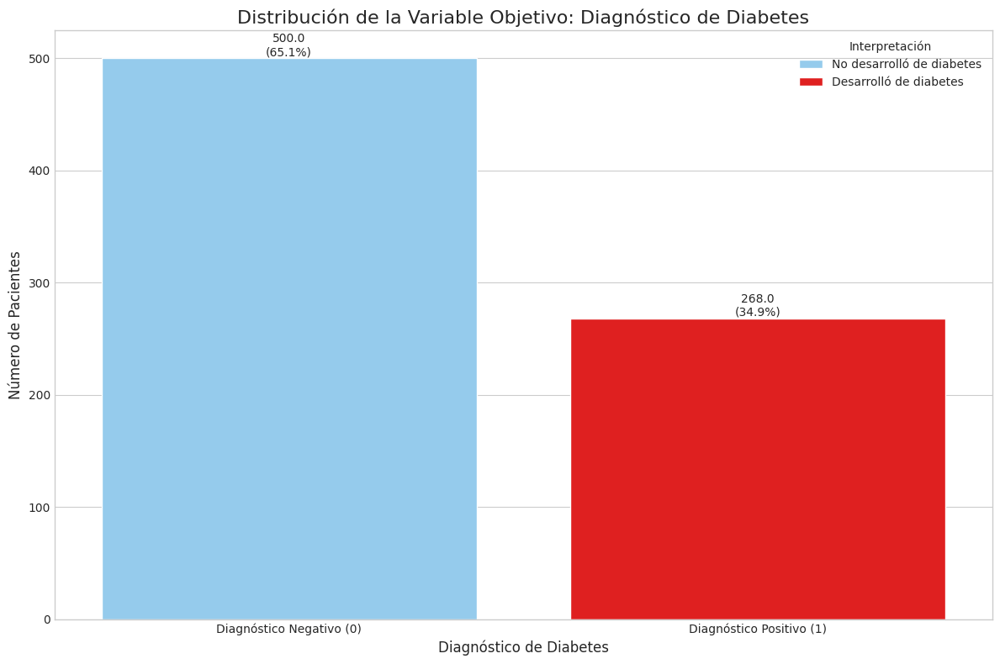

Total de pacientes: 768
Pacientes sin diabetes: 500 (65.1%)
Pacientes con diabetes: 268 (34.9%)


In [ ]:
# Visualización de la variable objetivo Outcome

# Configuración para mejorar la apariencia del gráfico
plt.figure(figsize=(12, 8))
sns.set_style("whitegrid")
colors = ['#87CEFA', '#FF0000']  # Colores para las barras

# Crear el gráfico de barras
ax = sns.countplot(data=df, x='Outcome', palette=colors)

# Añadir etiquetas y título
plt.title('Distribución de la Variable Objetivo: Diagnóstico de Diabetes', fontsize=16)
plt.xlabel('Diagnóstico de Diabetes', fontsize=12)
plt.ylabel('Número de Pacientes', fontsize=12)


# Cambiar las etiquetas del eje x
plt.xticks([0, 1], ['Diagnóstico Negativo (0)', 'Diagnóstico Positivo (1)'], fontsize=10)

# Añadir etiquetas de valor en las barras
total = len(df)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width()/2., height + 0.1,
            f'{height}\n({height/total:.1%})',
            ha="center", va="bottom", fontsize=10)

# Añadir una leyenda explicativa
plt.legend(['No desarrolló de diabetes', 'Desarrolló de diabetes'],
           title='Interpretación', loc='upper right', fontsize=10)

# Ajustar el diseño y mostrar el gráfico
plt.tight_layout()
plt.show()

# Imprimir estadísticas adicionales
print(f"Total de pacientes: {total}")
print(f"Pacientes sin diabetes: {df['Outcome'].value_counts()[0]} ({df['Outcome'].value_counts()[0]/total:.1%})")
print(f"Pacientes con diabetes: {df['Outcome'].value_counts()[1]} ({df['Outcome'].value_counts()[1]/total:.1%})")

De la distribución de la variable objetivo que has proporcionado, podemos extraer varias conclusiones importantes:

1. **Desbalance de clases**: Existe un desbalance moderado en el conjunto de datos. La clase mayoritaria (pacientes sin diabetes) representa el 65.1% de los casos, mientras que la clase minoritaria (pacientes con diabetes) representa el 34.9%. Este desbalance de clases, aunque no es extremo, podría afectar el rendimiento de algunos algoritmos de aprendizaje automático. Puede ser necesario considerar técnicas como sobremuestreo de la clase minoritaria (por ejemplo, SMOTE) o submuestreo de la clase mayoritaria durante la fase de preprocesamiento de datos.

2. **Prevalencia de diabetes**: En esta población de estudio, aproximadamente 1 de cada 3 individuos (34.9%) tiene diabetes. Esta es una prevalencia bastante alta en comparación con la población general (5.4%), lo que podría reflejar las características únicas de la población Pima o los criterios de selección del estudio.

3. **Tamaño de la muestra**: Con 768 pacientes en total, tenemos un tamaño de muestra moderado. Esto debería ser suficiente para realizar análisis estadísticos significativos y entrenar modelos de aprendizaje automático, aunque muestras más grandes siempre son preferibles para obtener resultados más robustos.

4. **Relevancia clínica**: La alta proporción de casos positivos (34.9%) subraya la importancia de este estudio para la salud pública, especialmente en poblaciones con alto riesgo de diabetes.

5. **Base para comparaciones**: Esta distribución proporciona una línea base importante para evaluar nuestros modelos predictivos. Un modelo que simplemente predijera siempre la clase mayoritaria (no diabetes) tendría una precisión del 65.1%, lo cual es un punto de referencia útil para evaluar el rendimiento de nuestros modelos más sofisticados.

7. **Generalización de resultados**: Dado el desbalance moderado y la alta prevalencia de diabetes en esta muestra, debemos ser cautelosos al generalizar los resultados a otras poblaciones con diferentes tasas de prevalencia de diabetes.

Estas conclusiones nos ayudarán a guiar nuestro análisis posterior, informar nuestras decisiones de preprocesamiento de datos y establecer expectativas realistas para el rendimiento de nuestros modelos predictivos.


---

# 2.2 Análisis de Variables Cuantitativas

En esta sección, exploraremos las variables numéricas del dataset de diabetes para identificar patrones, tendencias y relaciones significativas que puedan influir en el diagnóstico de diabetes.

Pasos del análisis:

### 1. Visualización de la Distribución de Variables

- Utilizaremos histogramas y boxplots para entender la distribución de cada variable numérica (Pregnancies, Glucose, BloodPressure, SkinThickness, Insulin, BMI, DiabetesPedigreeFunction, Age).
- Esto nos ayudará a identificar asimetrías, curtosis y la presencia de outliers.

### 2. Estadísticas Descriptivas

- Calcularemos medidas como la media, mediana, desviación estándar, y rangos intercuartílicos para cada variable.
- Esto proporcionará un resumen cuantitativo de cada variable y nos ayudará a entender mejor sus características.

### 3. Relación con la Variable Objetivo (Outcome)

- Crearemos scatterplots y pairplots para visualizar cómo cada variable numérica se relaciona con Outcome.
- Buscaremos patrones que puedan indicar asociaciones significativas con el diagnóstico de diabetes.


### 4. Detección de Outliers

- Identificaremos outliers mediante el análisis de boxplots.
- Prestaremos especial atención a los valores 0 en variables como BloodPressure, SkinThickness, Insulin y BMI, que probablemente representen datos faltantes.

### 5. Análisis de Correlación

- Calcularemos la matriz de correlación para identificar relaciones lineales entre variables numéricas.
- Utilizaremos heatmaps para visualizar estas correlaciones y destacar las más fuertes.
- Calcularemos la correlación de nuestras variables numéricas con la variable objetivo 'Outcome'.

Este análisis exhaustivo de las variables cuantitativas nos proporcionará una base sólida para el modelado predictivo de diabetes, permitiéndonos identificar y aprovechar las relaciones clave en el dataset. Además, nos ayudará a abordar los desafíos específicos de este conjunto de datos, como los valores 0 que probablemente representen datos faltantes en algunas variables.


Agrupamos las variables numéricas para trabajar con ellas


In [ ]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB
None


In [ ]:
num_vars = df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']]

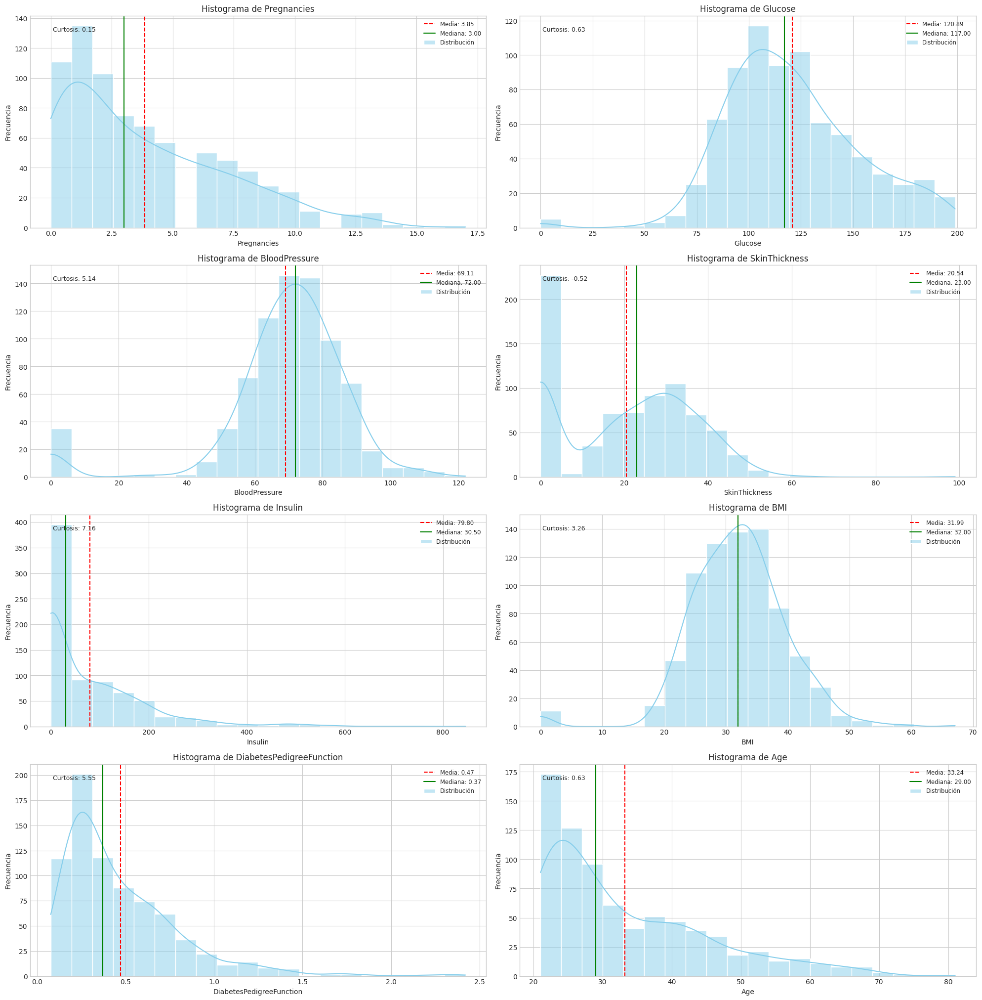

In [ ]:
# Crear histogramas con líneas de media y mediana
plt.figure(figsize=(20, 25))

for i, var in enumerate(num_vars):
    plt.subplot(5, 2, i + 1)
    sns.histplot(df[var], bins=20, kde=True, color='skyblue', label='Distribución')

    # Calcular media y mediana
    mean_val = df[var].mean()
    median_val = df[var].median()
    kurt_val = kurtosis(df[var])

    # Añadir líneas de media y mediana
    plt.axvline(mean_val, color='red', linestyle='--', label=f'Media: {mean_val:.2f}')
    plt.axvline(median_val, color='green', linestyle='-', label=f'Mediana: {median_val:.2f}')

    # Añadir texto de curtosis
    plt.text(0.05, 0.95, f'Curtosis: {kurt_val:.2f}',
             transform=plt.gca().transAxes, fontsize=9,
             verticalalignment='top')

    # Añadir leyenda
    plt.legend(fontsize='small')
    plt.title(f'Histograma de {var}')
    plt.xlabel(var)
    plt.ylabel('Frecuencia')

plt.tight_layout()
plt.show()

In [ ]:
# Calculamos estadísticas descriptivas
descriptive_stats = num_vars.describe().transpose()

# Añadir mediana y rango intercuartílico
descriptive_stats['median'] = num_vars.median()
descriptive_stats['IQR'] = descriptive_stats['75%'] - descriptive_stats['25%']

# Mostrar estadísticas descriptivas
print(descriptive_stats[['mean', 'median', 'std', 'min', '25%', '50%', '75%', 'max', 'IQR']])

                                mean    median         std     min       25%  \
Pregnancies                 3.845052    3.0000    3.369578   0.000   1.00000   
Glucose                   120.894531  117.0000   31.972618   0.000  99.00000   
BloodPressure              69.105469   72.0000   19.355807   0.000  62.00000   
SkinThickness              20.536458   23.0000   15.952218   0.000   0.00000   
Insulin                    79.799479   30.5000  115.244002   0.000   0.00000   
BMI                        31.992578   32.0000    7.884160   0.000  27.30000   
DiabetesPedigreeFunction    0.471876    0.3725    0.331329   0.078   0.24375   
Age                        33.240885   29.0000   11.760232  21.000  24.00000   

                               50%        75%     max       IQR  
Pregnancies                 3.0000    6.00000   17.00    5.0000  
Glucose                   117.0000  140.25000  199.00   41.2500  
BloodPressure              72.0000   80.00000  122.00   18.0000  
SkinThickness  

Basándonos en las estadísticas descriptivas proporcionadas, podemos extraer varias conclusiones importantes sobre las variables numéricas del dataset de diabetes:

1. Pregnancies (Embarazos):
   - La media es de 3.85, con una mediana de 3, indicando una distribución ligeramente sesgada hacia la derecha.
   - El rango va de 0 a 17 embarazos, con un 75% de las mujeres teniendo 6 o menos embarazos.

2. Glucose (Glucosa):
   - La media (120.89) es ligeramente superior a la mediana (117), sugiriendo una distribución levemente sesgada hacia la derecha.
   - El rango va de 0 a 199 mg/dL, con valores de 0 que probablemente indican datos faltantes.
   - El valor máximo (199 mg/dL) supera significativamente el límite superior normal post-comida (140 mg/dL). Esto sugiere que una proporción considerable de la población estudiada presenta niveles elevados de glucosa, indicativo de prediabetes o diabetes.

3. BloodPressure (Presión Arterial):
   - La media (69.11) es menor que la mediana (72), indicando una posible asimetría hacia la izquierda.
   - El valor mínimo de 0 sugiere la presencia de datos faltantes o erróneos.

4. SkinThickness (Grosor del Pliegue Cutáneo):
   - Hay una diferencia notable entre la media (20.54) y la mediana (23), con un mínimo de 0, indicando probables datos faltantes.

5. Insulin (Insulina):
   - Muestra una gran variabilidad, con una desviación estándar (115.24) mayor que la media (79.80).
   - La mediana (30.5) es significativamente menor que la media, indicando una distribución muy sesgada hacia la derecha.
   - El valor máximo (846 mIU/L) es extremadamente alto, sugiriendo casos de resistencia a la insulina severa o errores en los datos.

6. BMI (Índice de Masa Corporal):
   - La media (31.99) y la mediana (32) son similares, sugiriendo una distribución más simétrica.
   - El rango va de 0 a 67.1, con valores de 0 que probablemente indican datos faltantes. El valor máximo (67.1 kg/m²) indica casos de obesidad extrema. Esto sugiere que una gran parte de la población estudiada tiene sobrepeso u obesidad, factores de riesgo conocidos para la diabetes tipo 2.

7. DiabetesPedigreeFunction:
   - Tiene un rango de 0.078 a 2.42, con una media de 0.472 y una mediana de 0.3725.
   - La distribución parece estar sesgada hacia la derecha, con algunos valores altos influyendo en la media.

8. Age (Edad):
   - La media (33.24) es mayor que la mediana (29), indicando una distribución sesgada hacia la derecha.
   - El rango va de 21 a 81 años, con el 75% de los pacientes teniendo 41 años o menos.

Conclusiones generales:
- Varias variables (Glucose, BloodPressure, SkinThickness, Insulin, BMI) tienen valores mínimos de 0, lo que probablemente indica datos faltantes que necesitarán ser tratados.
- La mayoría de las variables muestran algún grado de asimetría en su distribución.
- Hay una gran variabilidad en algunas medidas, especialmente en Insulin y DiabetesPedigreeFunction, lo que podría influir en los modelos predictivos.
- La edad de la población de estudio es relativamente joven, con una concentración en el rango de 20 a 40 años.
- El dataset muestra una población con características de alto riesgo para diabetes tipo 2, incluyendo niveles elevados de glucosa, insulina y BMI. La presión arterial, sin embargo, parece estar dentro de rangos más normales. Estos hallazgos son consistentes con una población en riesgo de desarrollar o ya diagnosticada con diabetes tipo 2.




Para visualizar cómo cada variable numérica se relaciona con Outcome, vamos a usar scatterplots y pairplots.

- Scatterplots: Muestran la relación directa entre cada variable numérica y Outcome.
- Pairplots: Ofrecen una visión más completa de las relaciones entre múltiples variables numéricas, coloreadas por Outcome.

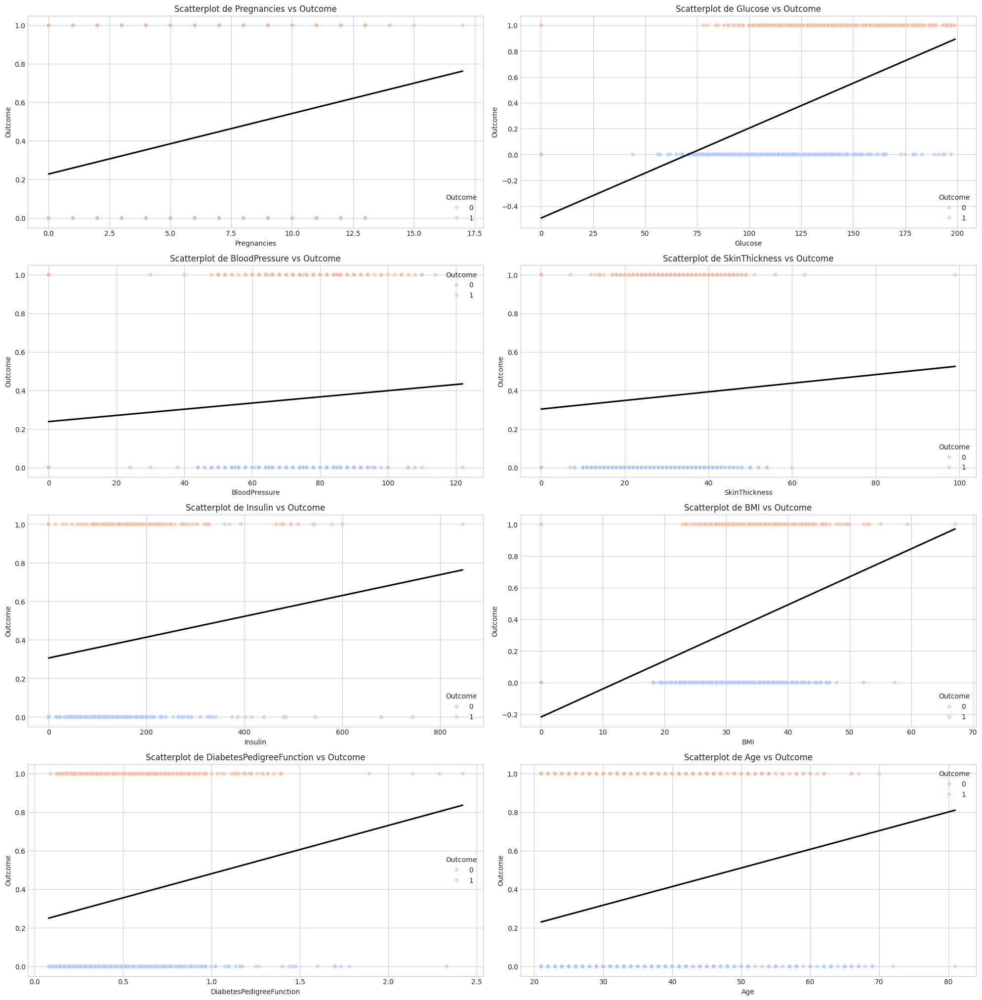

In [ ]:
# Crear scatterplots con colores para la variable objetivo y línea de regresión

# Tamaño de la figura
plt.figure(figsize=(20, 25))

for i, var in enumerate(num_vars):
    plt.subplot(5, 2, i + 1)
    sns.scatterplot(x=df[var], y=df['Outcome'], hue=df['Outcome'], palette='coolwarm', alpha=0.6)
    sns.regplot(x=df[var], y=df['Outcome'], scatter=False, color='black', ci=None)
    plt.title(f'Scatterplot de {var} vs Outcome')
    plt.xlabel(var)
    plt.ylabel('Outcome')

plt.tight_layout()
plt.show()

### 1. **Pregnancies vs. Outcome**
   - Existe una ligera tendencia positiva: a mayor número de embarazos, parece haber una mayor probabilidad de tener diabetes.
   - Esto es consistente con investigaciones que indican que múltiples embarazos pueden estar relacionados con un mayor riesgo de diabetes gestacional y tipo 2.

### 2. **Glucose vs. Outcome**
   - La relación es clara: los valores más altos de glucosa están asociados con una mayor probabilidad de tener diabetes.
   - Este resultado es esperado, ya que niveles elevados de glucosa son un indicador directo de diabetes.

### 3. **BloodPressure vs. Outcome**
   - La relación entre presión arterial y diagnóstico de diabetes parece ser débil o inexistente.
   - Aunque la presión arterial elevada puede ser un factor de riesgo cardiovascular, su conexión directa con la diabetes no es tan evidente en este dataset.

### 4. **SkinThickness vs. Outcome**
   - Hay una ligera tendencia positiva: mayores valores de grosor del pliegue cutáneo están asociados con una mayor probabilidad de tener diabetes.
   - Esto podría reflejar una relación indirecta a través del IMC o la obesidad.

### 5. **Insulin vs. Outcome**
   - Se observa una tendencia positiva: niveles más altos de insulina están asociados con un mayor riesgo de diabetes.
   - Esto es consistente con la resistencia a la insulina, que es un precursor común de la diabetes tipo 2.

### 6. **BMI vs. Outcome**
   - Existe una relación positiva clara: valores más altos del índice de masa corporal (IMC) están asociados con un mayor riesgo de diabetes.
   - Esto subraya el papel importante del sobrepeso y la obesidad como factores de riesgo para la diabetes tipo 2.

### 7. **DiabetesPedigreeFunction vs. Outcome**
   - Se observa una tendencia positiva: valores más altos en esta función (indicando un historial familiar más fuerte) están asociados con un mayor riesgo de diabetes.
   - Esto refuerza el impacto del componente genético en el desarrollo de la enfermedad.

### 8. **Age vs. Outcome**
   - Existe una relación positiva: a mayor edad, aumenta la probabilidad de tener diabetes.
   - Esto es consistente con el hecho conocido de que el riesgo de diabetes tipo 2 aumenta con la edad.

---

### Conclusión General:
- Las variables **Glucose**, **BMI**, y **DiabetesPedigreeFunction** muestran relaciones claras y fuertes con el diagnóstico de diabetes, lo que las podría  convertir en predictores importantes.
- Variables como **Pregnancies**, **Insulin**, y **Age** también tienen una relación positiva significativa, aunque menos marcada.
- Variables como **BloodPressure** y, en menor medida, **SkinThickness**, parecen tener relaciones más débiles o indirectas con el diagnóstico.

Estos patrones serán útiles para priorizar variables en el modelado predictivo y para entender los factores clave asociados al diagnóstico de diabetes en esta población.


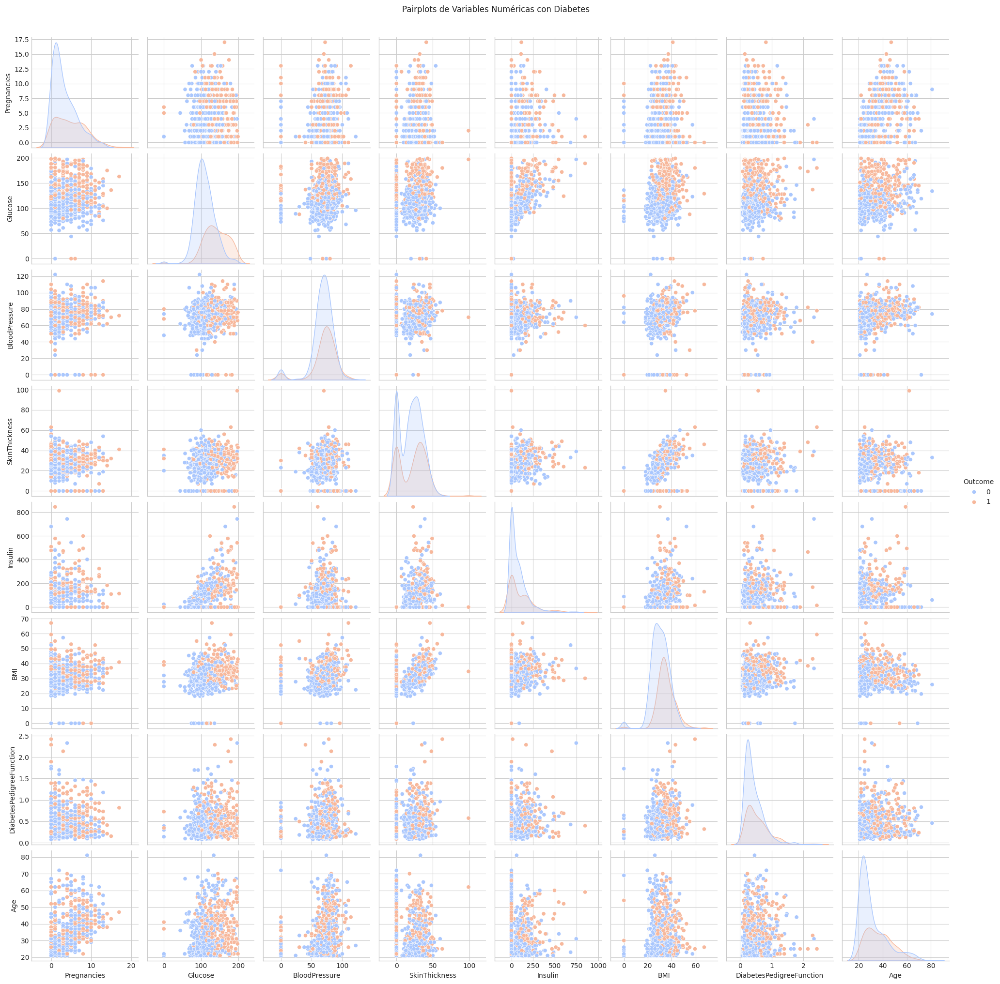

In [ ]:
# Crear pairplot para visualizar relaciones entre variables numéricas y Outcome
sns.pairplot(df, vars=num_vars, hue='Outcome', diag_kind='kde', palette='coolwarm')
plt.suptitle('Pairplots de Variables Numéricas con Diabetes', y=1.02)
plt.show()

### 1. **Distribuciones Univariadas**
   - Las distribuciones de las variables **Glucose**, **BMI**, y **DiabetesPedigreeFunction** muestran diferencias claras entre los pacientes con diabetes (Outcome = 1) y sin diabetes (Outcome = 0).
     - Por ejemplo, los pacientes diabéticos tienden a tener valores más altos en estas variables.
   - Variables como **BloodPressure** y **SkinThickness** tienen distribuciones más solapadas entre ambos grupos, lo que sugiere que estas variables podrían tener un menor poder predictivo.

### 2. **Relaciones entre Variables**
   - **Glucose y BMI**: Existe una correlación positiva moderada entre estas dos variables. Esto tiene sentido, ya que el sobrepeso u obesidad (reflejado en un BMI alto) está relacionado con la resistencia a la insulina y niveles elevados de glucosa.
   - **Age y Pregnancies**: Hay una relación positiva esperada, ya que las mujeres mayores tienden a haber tenido más embarazos.
   - **Insulin y Glucose**: Se observa una relación positiva, consistente con el hecho de que niveles altos de glucosa suelen ir acompañados de niveles elevados de insulina en personas con resistencia a la insulina.

### 3. **Solapamiento entre Grupos**
   - En muchas combinaciones de variables (por ejemplo, **BloodPressure vs. SkinThickness** o **Age vs. BloodPressure**), los puntos correspondientes a Outcome = 0 (azul) y Outcome = 1 (naranja) están muy mezclados. Esto indica que estas combinaciones no separan bien a los pacientes diabéticos de los no diabéticos.
   - En contraste, combinaciones como **Glucose vs. BMI** o **Glucose vs. DiabetesPedigreeFunction** muestran una separación más clara entre ambos grupos.

### 4. **Outliers**
   - El pairplot confirma la presencia de valores extremos en variables como **Insulin**, donde algunos puntos están muy alejados del resto, especialmente en el eje horizontal.
   - También se observan posibles outliers en variables como **SkinThickness** y **BMI**, aunque estos son menos extremos.

### 5. **Interacción entre DiabetesPedigreeFunction y Otras Variables**
   - La variable **DiabetesPedigreeFunction**, aunque no correlaciona fuertemente con otras variables numéricas, muestra una clara diferencia en sus valores para pacientes diabéticos frente a no diabéticos.

---

### Conclusión General:
El pairplot refuerza algunas observaciones previas, como la importancia de variables como **Glucose**, **BMI**, y **DiabetesPedigreeFunction** para predecir diabetes. Sin embargo, también destaca nuevas relaciones entre variables (como Glucose y BMI o Insulin y Glucose) que podrían ser útiles para el modelado. Además, confirma que ciertas variables (como BloodPressure o SkinThickness) tienen menor capacidad para discriminar entre pacientes diabéticos y no diabéticos cuando se analizan individualmente o en combinación con otras.



**ANÁLISIS DE CORRELACIÓN:**

**Ahora calcularemos la matriz de correlación y la representaremos con un heatmap:**
Esto nos ayudará a identificar rápidamente las relaciones lineales más fuertes entre las variables numéricas.

**Calcularemos la correación de las variables numéricas con la variable objetivo**

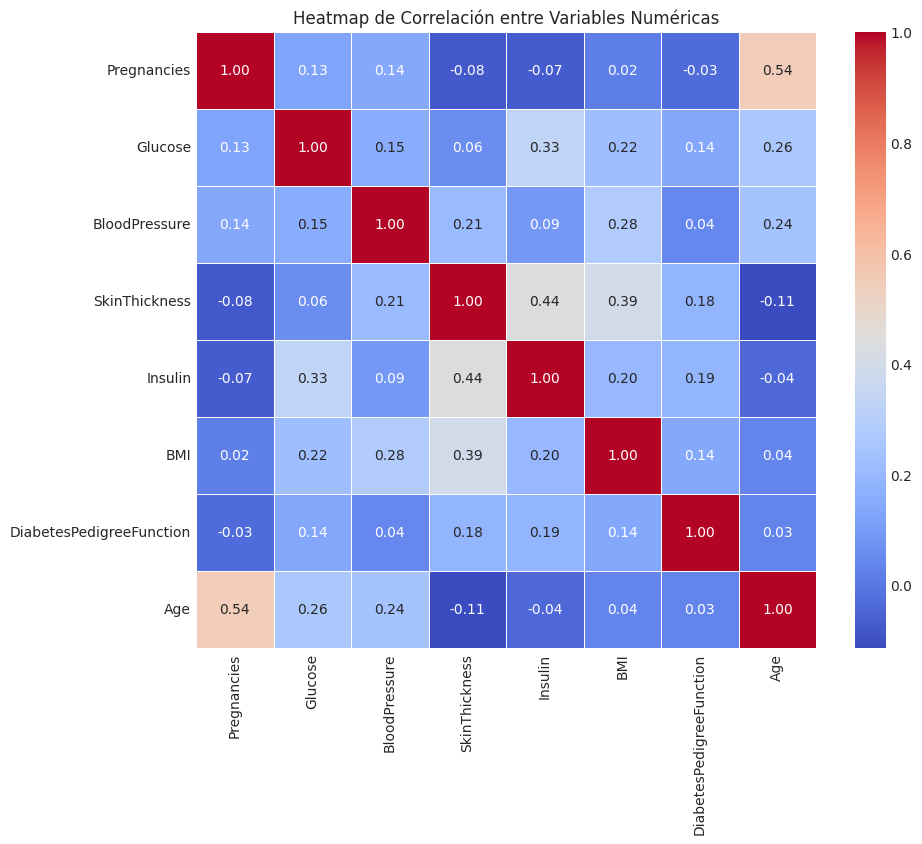

In [ ]:
# Calcular la matriz de correlación
correlation_matrix = num_vars.corr()

# Crear un heatmap para visualizar la matriz de correlación
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Heatmap de Correlación entre Variables Numéricas')
plt.show()

El heatmap de correlación revela que **Pregnancies** y **Age** tienen una correlación moderada (0.54), lo que es esperable ya que las mujeres mayores tienden a tener más embarazos. También se observa una relación positiva entre **SkinThickness** e **Insulin** (0.44), probablemente vinculada a la obesidad o resistencia a la insulina. Variables como **Glucose** e **Insulin** (0.33) y **BMI** con **SkinThickness** (0.39) muestran correlaciones moderadas, reflejando relaciones fisiológicas conocidas. Sin embargo, la mayoría de las demás correlaciones son débiles, lo que sugiere que cada variable aporta información única al modelo predictivo. Este análisis destaca combinaciones clave como **Glucose e Insulin** para entender mejor los factores asociados al diagnóstico de diabetes.


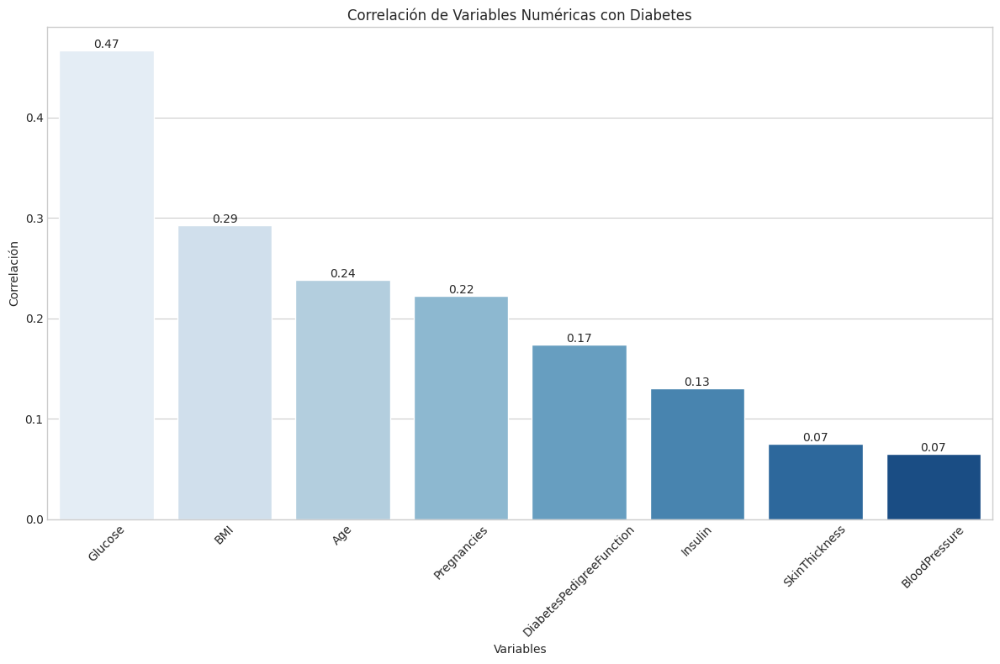

In [ ]:
# Calcular correlaciones con Outcome
correlations = df.corr()['Outcome'].drop('Outcome')

# Ordenar de forma descendente
correlations_sorted = correlations.sort_values(ascending=False)

# Crear barplot
plt.figure(figsize=(12, 8))
sns.barplot(x=correlations_sorted.index, y=correlations_sorted.values, palette='Blues')

# Añadir etiquetas a las barras
for index, value in enumerate(correlations_sorted.values):
    plt.text(index, value, f'{value:.2f}', ha='center', va='bottom')

plt.title('Correlación de Variables Numéricas con Diabetes')
plt.xlabel('Variables')
plt.ylabel('Correlación')
plt.xticks(rotation=45)  # Rotar etiquetas para que no se superpongan
plt.tight_layout()  # Ajustar el diseño para evitar recortes
plt.show()

- Glucose es la variable con la correlación más alta (0.47) con el diagnóstico de diabetes, lo que confirma que los niveles de glucosa son un predictor clave de la enfermedad.

- BMI (Índice de Masa Corporal) tiene una correlación moderada (0.29), destacando el impacto del sobrepeso y la obesidad en el riesgo de diabetes.

- Age (0.24) y Pregnancies (0.22) también muestran correlaciones moderadas, lo que indica que la edad y el número de embarazos tienen una relación significativa, aunque menos fuerte, con el diagnóstico.

- DiabetesPedigreeFunction tiene una correlación baja (0.17), pero sigue siendo relevante al reflejar el historial familiar como un factor de riesgo.

- Insulin, SkinThickness, y BloodPressure tienen correlaciones muy bajas (< 0.13), lo que sugiere que estas variables tienen menor impacto directo en el diagnóstico de diabetes en este dataset.

- En general, las variables más relevantes para predecir diabetes en este dataset son Glucose, BMI, y en menor medida, Age y Pregnancies, mientras que otras variables parecen tener un papel menos significativo.

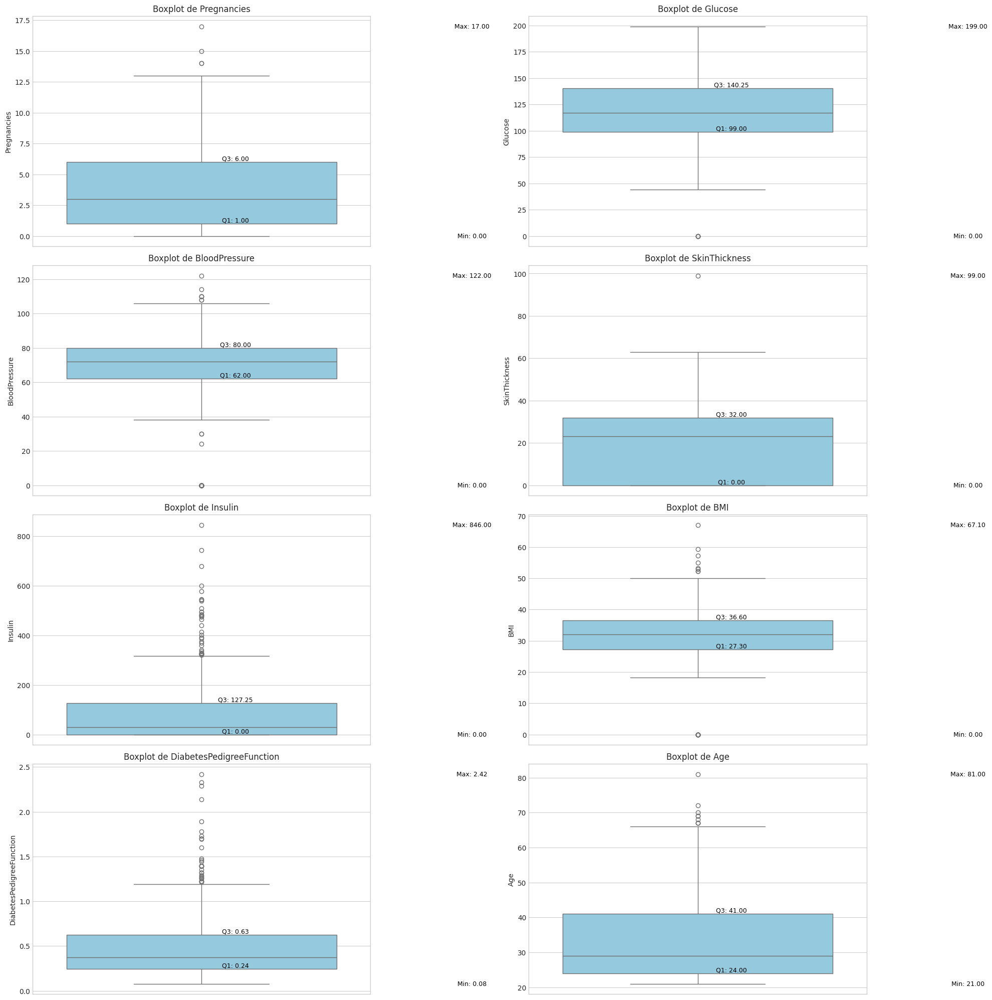

In [ ]:
# Crear boxplots para cada variable con anotaciones
plt.figure(figsize=(20, 25))

for i, var in enumerate(num_vars.columns):
    plt.subplot(5, 2, i + 1)
    sns.boxplot(y=df[var], color='skyblue')
    plt.title(f'Boxplot de {var}')

    # Calcular estadísticas
    stats = df[var].describe()
    q1, q2, q3 = stats['25%'], stats['50%'], stats['75%']
    min_val, max_val = stats['min'], stats['max']

    # Anotar estadísticas al lado del gráfico
    plt.text(0.8, min_val, f'Min: {min_val:.2f}', horizontalalignment='center', verticalalignment='center', fontsize=9, color='black')
    plt.text(0.8, max_val, f'Max: {max_val:.2f}', horizontalalignment='center', verticalalignment='center', fontsize=9, color='black')

    # Anotar estadísticas sobre el gráfico
    plt.text(0.1, q1, f'Q1: {q1:.2f}', horizontalalignment='center', verticalalignment='bottom', fontsize=9, color='black')
    plt.text(0.1, q3, f'Q3: {q3:.2f}', horizontalalignment='center', verticalalignment='bottom', fontsize=9, color='black')

plt.tight_layout()
plt.show()

- Pregnancies:
Hay valores atípicos por encima de 13 embarazos, lo cual es poco común pero posible en casos extremos.

- Glucose:
Existen pocos outliers por debajo del primer cuartil (Q1), lo que sugiere niveles de glucosa inusualmente bajos.

- BloodPressure:
Existen valores atípicos bajos, incluyendo valores de 0, que son fisiológicamente imposibles y probablemente representan datos faltantes.

- SkinThickness:
Hay outliers altos, pero también se observan valores de 0, lo cual indica datos faltantes en esta variable.

- Insulin:
Presenta numerosos outliers altos, con valores que superan los 400, lo que podría reflejar resistencia a la insulina extrema o errores en los datos.
También hay valores de 0, indicando datos faltantes.

- BMI:
Existen outliers altos, especialmente por encima de 50, lo que representa casos de obesidad extrema.

- DiabetesPedigreeFunction:
Se observan algunos outliers altos por encima de 1.5, lo que sugiere un historial familiar excepcionalmente fuerte de diabetes.

- Age:
Hay algunos outliers altos por encima de los 70 años, aunque estos son menos significativos y representan casos esperables en una población mayor.

# 3. PREPROCESADO DE DATOS

## COMENZAMOS CON LA LIMPIEZA DE DATOS:

Tratamiento de Valores Faltantes: Podemos eliminarlos o rellenados con un valor específico.

Tratamiento de Outliers: Identificaremos y trataremos valores atípicos que pueden sesgar el modelo.

In [ ]:
print(df.isnull().sum())

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64


In [ ]:
# Contar valores iguales a 0 por columna
missing_values = (num_vars == 0).sum()
print(missing_values)


missing_percentage = missing_values / len(df) * 100
print(missing_percentage)

# Determinar el umbral del 5%
threshold = 5

# Decidir qué hacer con las variables
for var in num_vars.columns:
    if missing_percentage[var] > threshold:
        print(f"La variable {var} supera el umbral del 5% de valores faltantes.")
        # Aquí puedes decidir eliminar la variable o imputar los valores faltantes


Pregnancies                 111
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
dtype: int64
Pregnancies                 14.453125
Glucose                      0.651042
BloodPressure                4.557292
SkinThickness               29.557292
Insulin                     48.697917
BMI                          1.432292
DiabetesPedigreeFunction     0.000000
Age                          0.000000
dtype: float64
La variable Pregnancies supera el umbral del 5% de valores faltantes.
La variable SkinThickness supera el umbral del 5% de valores faltantes.
La variable Insulin supera el umbral del 5% de valores faltantes.


A pesar de que 'SkinThickness' y 'Insulin' superan nuestro threshold, siguen siendo variables relevante en el contexto de salud.

La insulina es un marcador crucial en la evaluación del riesgo de diabetes y otras enfermedades metabólicas. Su papel principal es regular los niveles de glucosa en sangre, permitiendo que las células utilicen la glucosa como fuente de energía. La resistencia a la insulina o la insuficiencia de esta hormona puede conducir a condiciones graves como diabetes tipo 2, complicaciones cardiovasculares y daño renal.

La grosura de la piel es un indicador importante tanto en el diagnóstico como en el monitoreo de condiciones fisiológicas y patológicas. En el contexto médico, se utiliza para evaluar cambios relacionados con enfermedades metabólicas, envejecimiento, cicatrización y otras afecciones cutáneas. Además, su medición puede ser relevante para terapias transdérmicas, como la administración de insulina en pacientes diabéticos. Los valores anómalos en el grosor de la piel pueden reflejar alteraciones metabólicas o estructurales que requieren atención clínica.

Por ello vamos a imputar los valores faltantes en ellas también. Utilizaremos un mapa de calor para visualizar los patrones de valores faltantes en el dataset. Esto ayudará a identificar si los valores faltantes están relacionados con otras variables. Nos permitirá seleccionar mejor el metodo de imputación.

<Axes: >

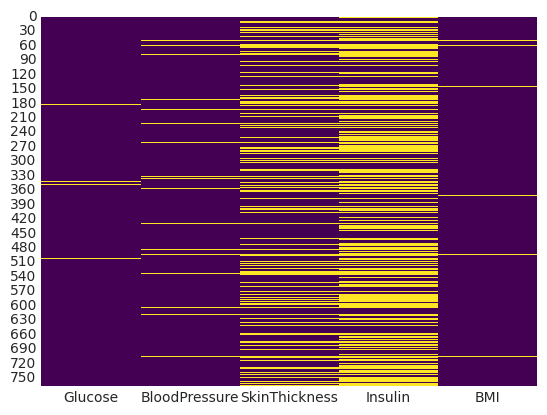

In [ ]:
cero_vars = df[['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']] == 0

# Analizar patrones de valores faltantes
sns.heatmap(cero_vars, cbar=False, cmap='viridis')

El mapa de calor sugiere que existe una relación entre los valores faltantes en las variables SkinThickness e Insulin. Esto podría indicar un problema compartido en la medición o recolección de datos para estas variables. Antes de imputar los valores, sería útil investigar si esta correlación tiene una base lógica o si se debe a errores sistemáticos. Además, las técnicas de imputación deberían considerar estas relaciones para preservar la coherencia del dataset.


- Verificaremos la correlación entre las variables Insulin y SkinThickness (sin valores faltantes)

- Analizaremos patrones de valores faltantes:
Para ver si los valores faltantes (ceros) en Insulin y SkinThickness ocurren simultáneamente con más frecuencia de lo esperado.

In [ ]:
# Filtrar filas donde Insulin y SkinThickness no sean 0
valid_data = df[(df['Insulin'] != 0) & (df['SkinThickness'] != 0)]

# Calcular la correlación entre Insulin y SkinThickness
correlation = valid_data[['Insulin', 'SkinThickness']].corr()
print(correlation)


                Insulin  SkinThickness
Insulin        1.000000       0.184888
SkinThickness  0.184888       1.000000


In [ ]:
# Crear una columna booleana para indicar filas con valores faltantes en ambas variables
df['missing_both'] = (df['Insulin'] == 0) & (df['SkinThickness'] == 0)

# Contar cuántas filas tienen valores faltantes en ambas variables
missing_both_count = df['missing_both'].sum()
print(f"Filas con valores faltantes en ambas variables: {missing_both_count}")

# Comparar con el total de valores faltantes individuales
missing_insulin = (df['Insulin'] == 0).sum()
missing_skinthickness = (df['SkinThickness'] == 0).sum()

print(f"Valores faltantes en Insulin: {missing_insulin}")
print(f"Valores faltantes en SkinThickness: {missing_skinthickness}")


Filas con valores faltantes en ambas variables: 227
Valores faltantes en Insulin: 374
Valores faltantes en SkinThickness: 227


A partir de los gráficos y los datos proporcionados, podemos realizar las siguientes observaciones sobre la relación entre los valores faltantes (representados por ceros) en las variables Insulin y SkinThickness:

1. Correlación entre Insulin y SkinThickness:
El coeficiente de correlación entre estas dos variables es 0.184888, lo cual indica una correlación débil pero positiva. Esto sugiere que, en los datos válidos (cuando ambas variables no son 0), no hay una relación fuerte entre Insulin y SkinThickness. Por lo tanto, la correlación de valores faltantes probablemente no se debe a una relación lógica inherente entre estas dos variables.

2. Filas con valores faltantes en ambas variables:
Cada vez que SkinThickness es 0, también lo es Insulin. Sin embargo, no ocurre lo mismo al revés, ya que Insulin tiene un total de 374 valores faltantes, lo que significa que hay casos donde solo Insulin es 0.
Este patrón sugiere un posible problema sistemático en la recolección o registro de datos para estas dos variables.

Según la documentación del dataset, estos valores fueron introducidos como marcadores para indicar datos faltantes debido a:
- Errores sistemáticos en la recolección: Es posible que ciertos parámetros no se midieran para algunos pacientes debido a limitaciones técnicas o logísticas.

- Falta de relevancia clínica: En algunos casos, las mediciones podrían haberse omitido si no eran necesarias para el diagnóstico o seguimiento del paciente.

- Fuentes de datos mixtas: Los datos provienen tanto de registros electrónicos como manuales, lo que podría haber contribuido a inconsistencias en la captura de información.

- Es necesario imputar estos valores para evitar sesgos en el análisis posterior.

## Estrategia de imputación:

1. Glucose:
Es un marcador clave en el diagnóstico de diabetes. Solo presenta 5 valores faltantes, lo que equivale a un porcentaje muy bajo del dataset. Imputaremos con la mediana de la variable, ya que la cantidad de valores faltantes es baja y no afecta significativamente la distribución.
2. BloodPressure: Presenta una cantidad de valores faltantes moderada (35).
Imputaremos con la mediana, ya que no hay una fuerte correlación con otras variables y la cantidad de valores faltantes sigue siendo manejable.
3. BMI: Lantidad de valores faltantes es baja (11).
Imputaremos con la mediana, ya que los valores faltantes son pocos y no afectan significativamente el análisis.
4. SkinThicknes: La cantidad de valores faltantes es alta (227). Dado que SkinThickness tiene una correlación moderada con BMI (0.39) y Insulin (0.44), usaremos un enfoque iterativo para manejar sus valores faltantes:
Crearemos una columna temporal (SkinThickness_temp) donde imputaremos los valores faltantes de SkinThickness utilizando la mediana.
Utilizaremos esta columna temporal junto con el resto de las variables relevantes (Glucose, BMI, Age, BloodPressure, Pregnancies, DiabetesPedigreeFunction) para imputar los valores faltantes de Insulin mediante un modelo Random Forest.
Finalmente, reimputaremos los valores reales de SkinThickness utilizando un modelo Random Forest, considerando como predictores las variables completas, incluida la versión imputada de Insulin.
5. La cantidad de valores faltantes es alta (374). Dado que Insulin tiene una correlación moderada con Glucose (0.33) y SkinThickness (0.44), usaremos un modelo Random Forest para imputar esta variable utilizando como predictores:
Glucose,
SkinThickness_temp (columna temporal),
BMI,
Age,
BloodPressure,
Pregnancies,
DiabetesPedigreeFunction.
- Anteriormente utilizamos la técnica MICE para imputar simultáneamente SkinThickness e Insulin. Sin embargo, esto resultó en sesgos en las distribuciones y relaciones entre estas variables, especialmente en la correlación entre ellas, que disminuyó significativamente tras la imputación. Para resolver este problema:
- Adoptamos un enfoque iterativo que evita dependencias mutuas directas entre variables con muchos valores faltantes.
- Usamos modelos avanzados como Random Forest para capturar mejor las relaciones no lineales entre las variables.
- Este enfoque preserva mejor las correlaciones clave (SkinThickness-BMI, Insulin-Glucose) y genera distribuciones más consistentes con los datos válidos del dataset original.


In [ ]:
# Crear una copia del DataFrame original para realizar imputaciones
df_cleaned = df.copy()

In [ ]:
# Imputamos valores de Glucosa
df_cleaned['Glucose'] = df_cleaned['Glucose'].replace(0, df_cleaned['Glucose'].median())

# Imputamos valores de BloodPressure
df_cleaned['BloodPressure'] = df_cleaned['BloodPressure'].replace(0, df_cleaned['BloodPressure'].median())

# Imputamos valores de BMI
df_cleaned['BMI'] = df_cleaned['BMI'].replace(0, df_cleaned['BMI'].median())


Debemos tener en cuenta que el imputador iterativo (IterativeImputer) solo imputa valores faltantes representados como NaN. Si los valores faltantes están representados como ceros (como en este caso), el imputador no los considera como datos faltantes y no los reemplazará. Debemos convertir los ceros en las columnas SkinThickness e Insulin a NaN antes de aplicar la imputación iterativa.

In [ ]:
# Paso 1: Crear una columna temporal para SkinThickness

# Reemplazar ceros por NaN
df_cleaned[['SkinThickness', 'Insulin']] = df_cleaned[['SkinThickness', 'Insulin']].replace(0, np.nan)

# Imputar SkinThickness preliminarmente con la mediana
df_cleaned['SkinThickness_temp'] = df_cleaned['SkinThickness'].fillna(df_cleaned['SkinThickness'].median())



In [ ]:
# Paso 2: Usar la columna temporal para predecir Insulin
from sklearn.ensemble import RandomForestRegressor

# Filtrar datos completos para Insulin
complete_data_insulin = df_cleaned[df_cleaned['Insulin'].notnull()]
X_insulin = complete_data_insulin[['Glucose', 'SkinThickness_temp', 'BMI', 'Age', 'BloodPressure', 'Pregnancies', 'DiabetesPedigreeFunction']]
y_insulin = complete_data_insulin['Insulin']

# Filtrar datos con valores faltantes en Insulin
missing_data_insulin = df_cleaned[df_cleaned['Insulin'].isnull()]
X_missing_insulin = missing_data_insulin[['Glucose', 'SkinThickness_temp', 'BMI', 'Age', 'BloodPressure', 'Pregnancies', 'DiabetesPedigreeFunction']]

# Entrenar modelo Random Forest para Insulin
rf_model_insulin = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model_insulin.fit(X_insulin, y_insulin)

# Predecir los valores faltantes de Insulin
predicted_insulin = rf_model_insulin.predict(X_missing_insulin)

# Reemplazar los valores faltantes en Insulin
df_cleaned.loc[missing_data_insulin.index, 'Insulin'] = predicted_insulin


In [ ]:
# Paso 3: Reimputar la columna original de SkinThickness

# Filtrar datos completos para SkinThickness
complete_data_skin = df_cleaned[df_cleaned['SkinThickness'].notnull()]
X_skin = complete_data_skin[['Glucose', 'Insulin', 'BMI', 'Age', 'BloodPressure', 'Pregnancies', 'DiabetesPedigreeFunction']]
y_skin = complete_data_skin['SkinThickness']

# Filtrar datos con valores faltantes en SkinThickness
missing_data_skin = df_cleaned[df_cleaned['SkinThickness'].isnull()]
X_missing_skin = missing_data_skin[['Glucose', 'Insulin', 'BMI', 'Age', 'BloodPressure', 'Pregnancies', 'DiabetesPedigreeFunction']]

# Entrenar modelo Random Forest con ajustes en los hiperparámetros
rf_model_skin = RandomForestRegressor(
    n_estimators=200,  # Incrementar el número de árboles
    max_depth=10,      # Limitar la profundidad máxima
    min_samples_leaf=5,  # Aumentar el mínimo de muestras por hoja
    random_state=42
)
rf_model_skin.fit(X_skin, y_skin)

# Predecir los valores faltantes de SkinThickness
predicted_skinthickness = rf_model_skin.predict(X_missing_skin)

# Reemplazar los valores faltantes en SkinThickness
df_cleaned.loc[missing_data_skin.index, 'SkinThickness'] = predicted_skinthickness

# Eliminar la columna temporal si ya no es necesaria
df_cleaned.drop(columns=['SkinThickness_temp'], inplace=True)




In [ ]:
# Verificar si quedan valores faltantes
print((df_cleaned[['Glucose', 'BloodPressure', 'BMI', 'SkinThickness', 'Insulin']]== 0).sum())


Glucose          0
BloodPressure    0
BMI              0
SkinThickness    0
Insulin          0
dtype: int64


Para evaluar si la imputación realizada ha sido adecuada y si no deberíamos haber utilizado otro modelo, seguiremos estos pasos de validación:

- Comparar las distribuciones de las variables antes y después de la imputación para asegurarnos de que los valores imputados son consistentes con los datos originales.
- Comparar estadísticas descriptivas (media, mediana, percentiles) antes y después de la imputación para detectar desviaciones significativas.
- Verifica si las relaciones entre variables (correlaciones) se mantienen consistentes después de la imputación. Esto es especialmente importante para SkinThickness e Insulin, ya que sus valores fueron imputados usando modelos predictivos basados en otras variables.

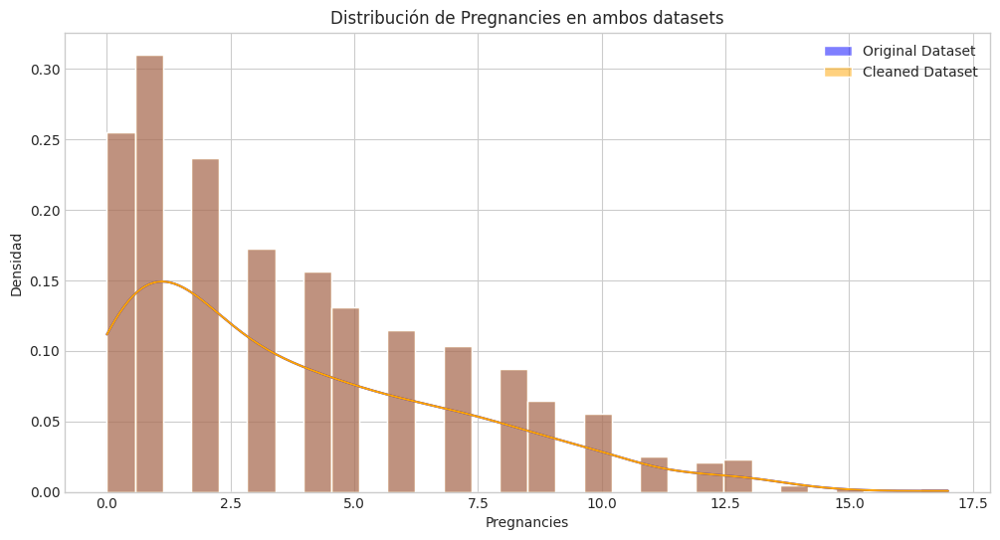

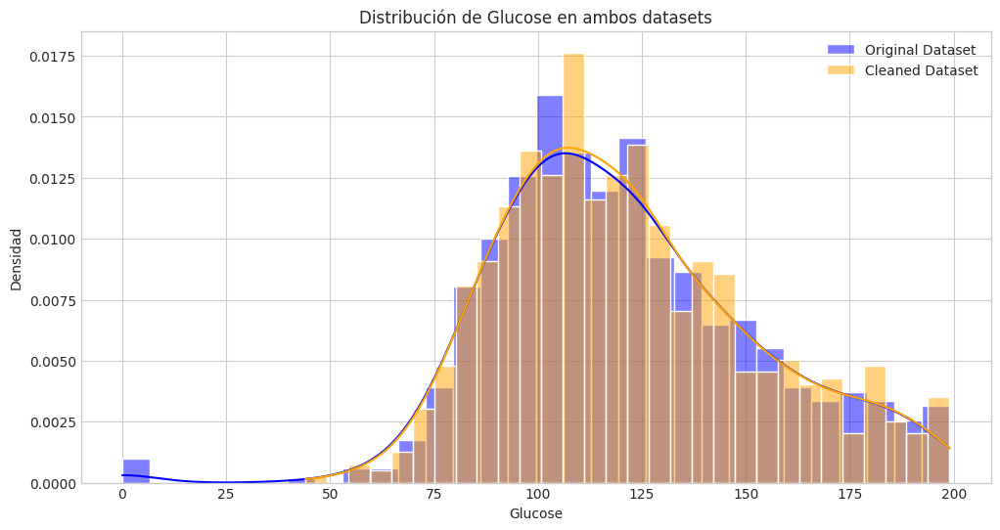

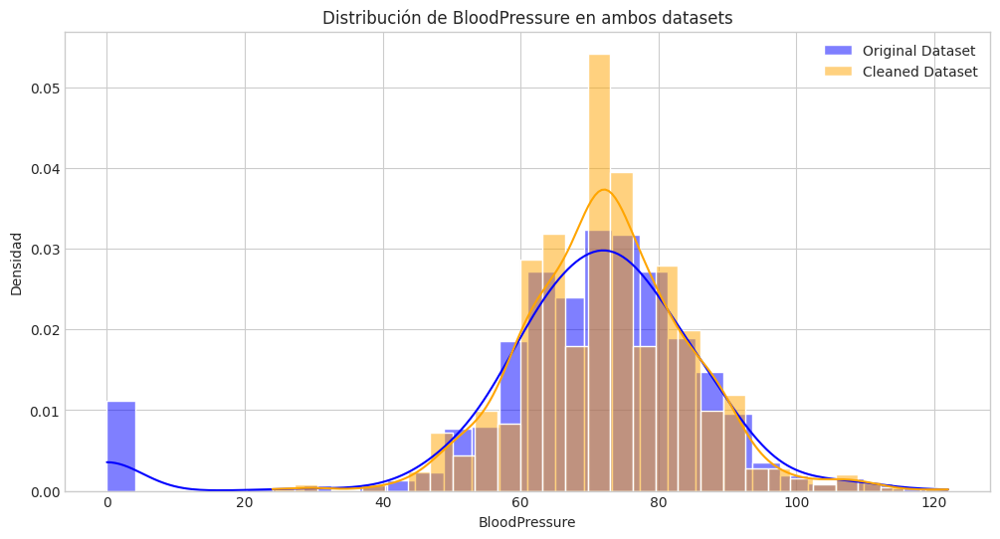

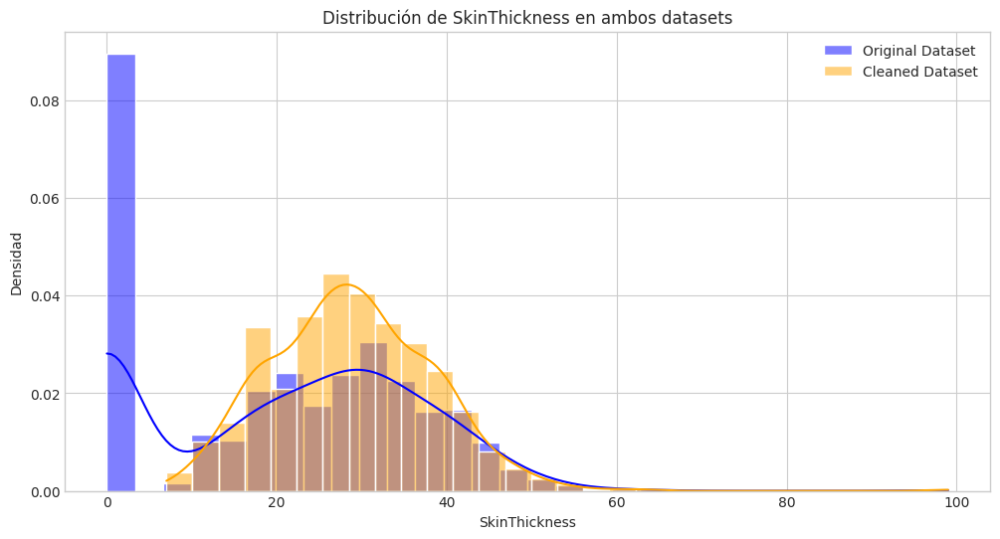

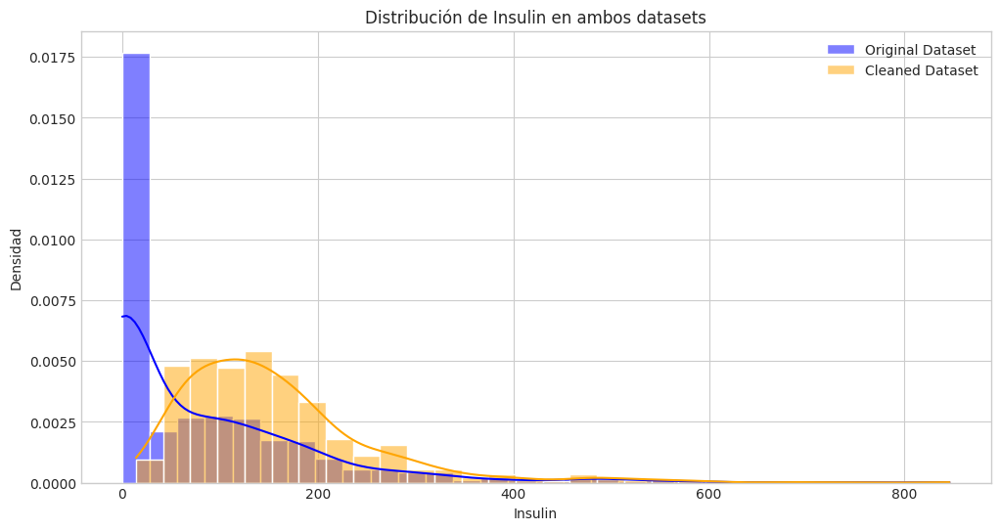

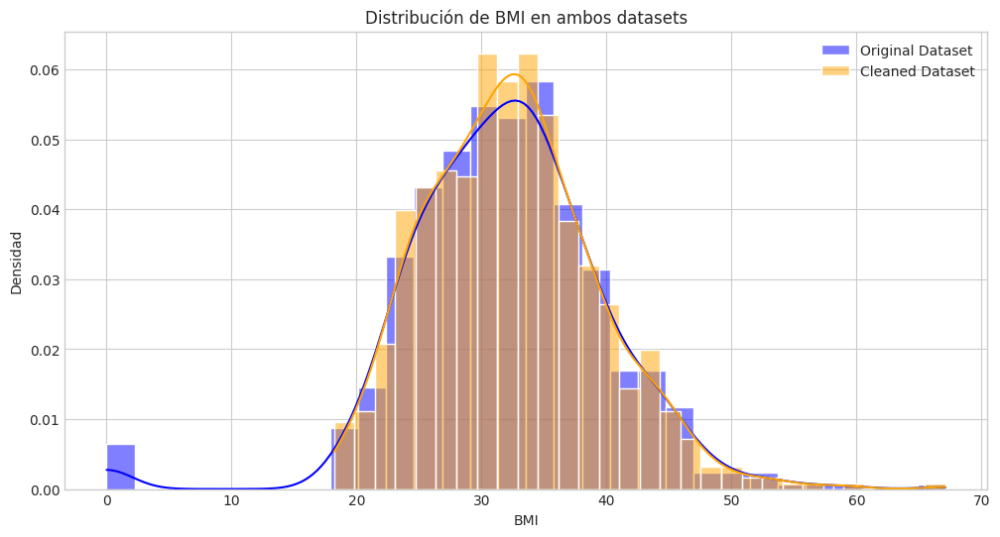

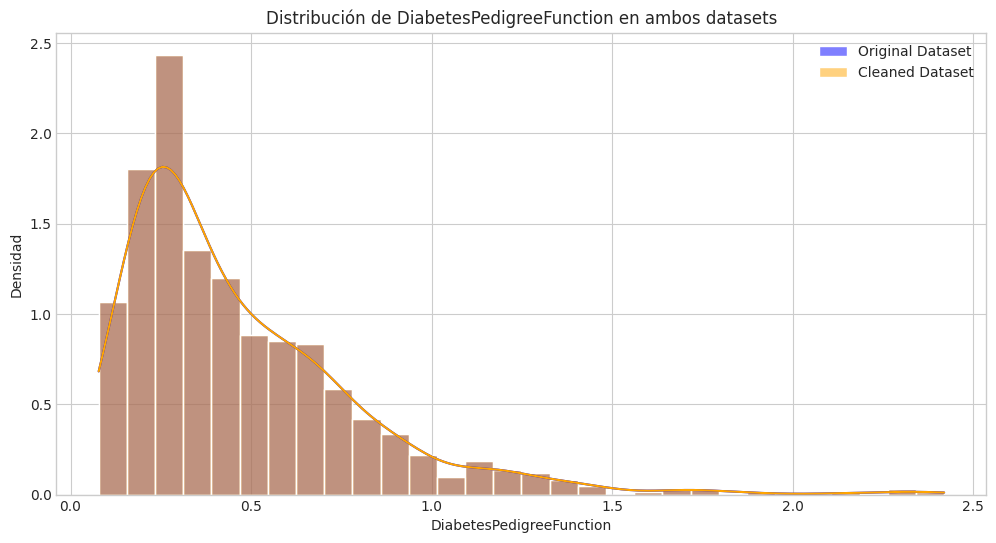

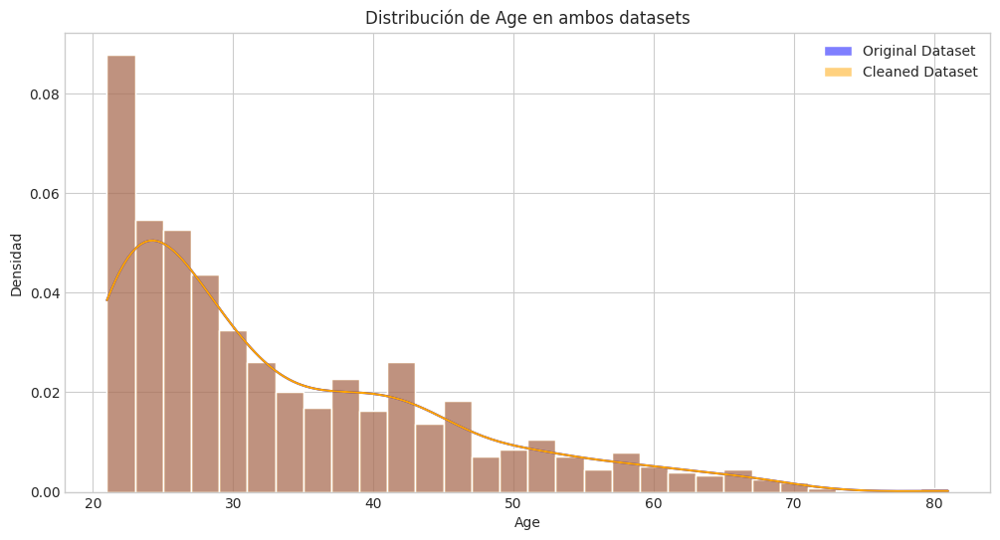

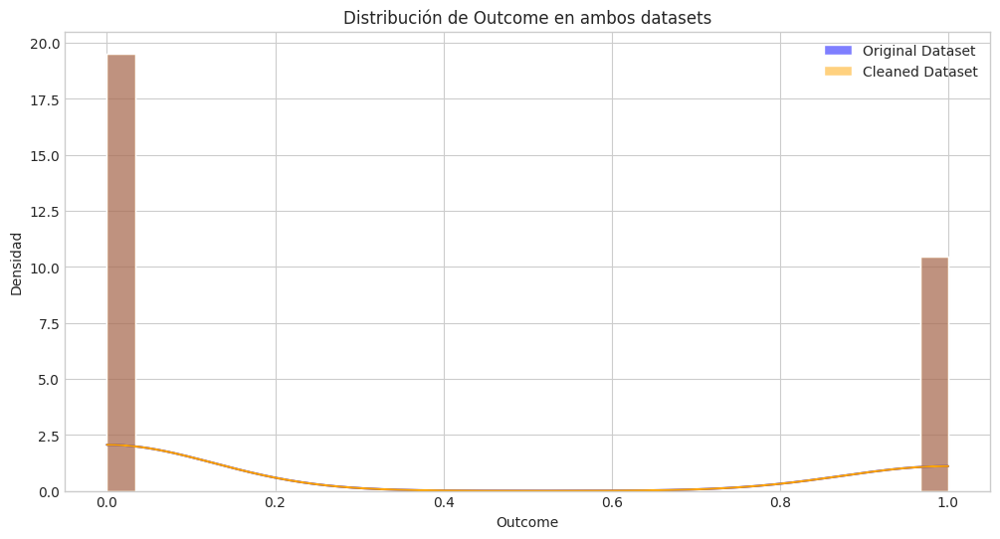

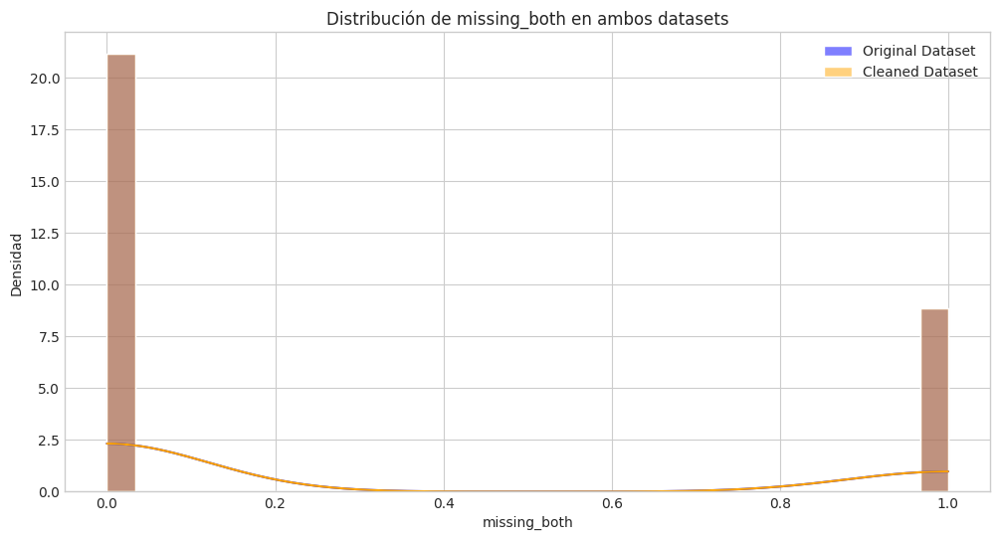

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Lista de variables numéricas a comparar
variables = df.columns

# Crear gráficos para cada variable
for variable in variables:
    plt.figure(figsize=(12, 6))

    # Distribución en el dataset original
    sns.histplot(df[variable], kde=True, color='blue', label='Original Dataset', stat='density', bins=30)

    # Distribución en el dataset limpio
    sns.histplot(df_cleaned[variable], kde=True, color='orange', label='Cleaned Dataset', stat='density', bins=30)

    # Añadir título y leyenda
    plt.title(f'Distribución de {variable} en ambos datasets')
    plt.xlabel(variable)
    plt.ylabel('Densidad')
    plt.legend()
    plt.show()


In [ ]:
# Verificar y eliminar la columna 'missing_both'
if 'missing_both' in df.columns:
    df.drop(columns=['missing_both'], inplace=True)

if 'missing_both' in df_cleaned.columns:
    df_cleaned.drop(columns=['missing_both'], inplace=True)


In [ ]:
print(df_cleaned.describe())
print(df.describe())

       Pregnancies     Glucose  BloodPressure  SkinThickness     Insulin  \
count   768.000000  768.000000     768.000000     768.000000  768.000000   
mean      3.845052  121.656250      72.386719      28.852713  157.002161   
std       3.369578   30.438286      12.096642       9.573208  102.416317   
min       0.000000   44.000000      24.000000       7.000000   14.000000   
25%       1.000000   99.750000      64.000000      22.000000   87.797500   
50%       3.000000  117.000000      72.000000      28.536146  135.000000   
75%       6.000000  140.250000      80.000000      35.032540  192.220000   
max      17.000000  199.000000     122.000000      99.000000  846.000000   

              BMI  DiabetesPedigreeFunction         Age     Outcome  
count  768.000000                768.000000  768.000000  768.000000  
mean    32.450911                  0.471876   33.240885    0.348958  
std      6.875366                  0.331329   11.760232    0.476951  
min     18.200000                  

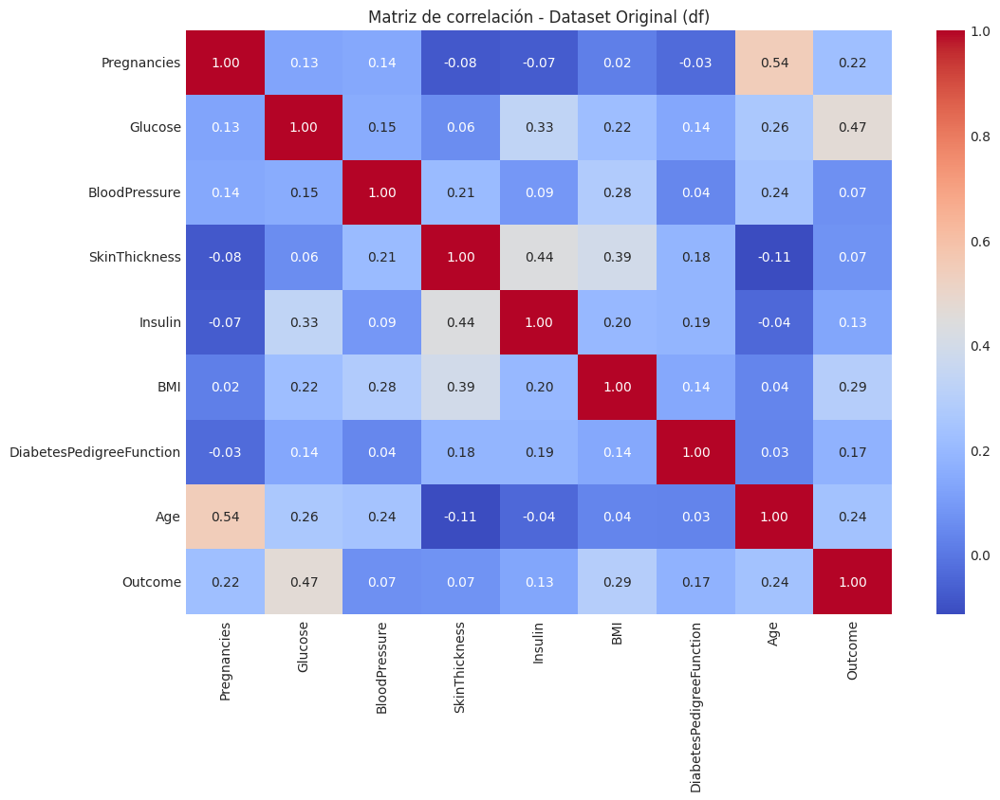

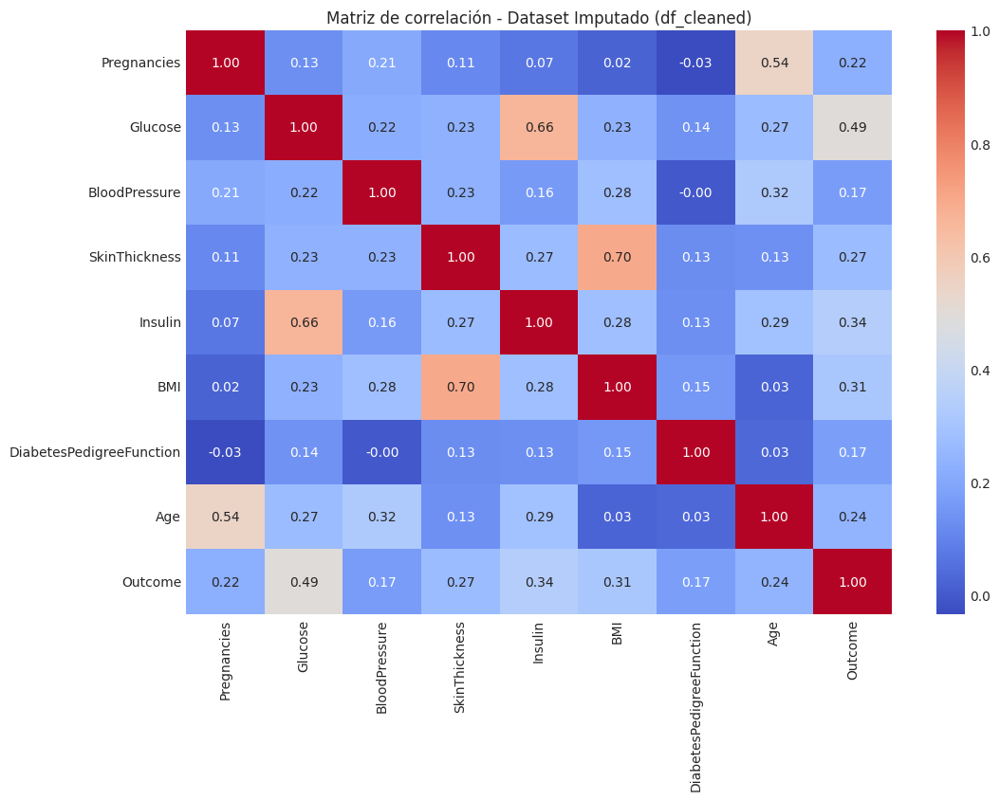

In [ ]:
# Calcular la matriz de correlación para el dataset original (df)
correlation_original = df.corr()

# Calcular la matriz de correlación para el dataset imputado (df_cleaned)
correlation_cleaned = df_cleaned.corr()

# Crear el mapa de calor para el dataset original
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_original, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de correlación - Dataset Original (df)")
plt.show()

# Crear el mapa de calor para el dataset imputado
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_cleaned, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de correlación - Dataset Imputado (df_cleaned)")
plt.show()

- Glucose, BloodPressure, y BMI fueron correctamente imputadas utilizando métodos simples como la mediana.
Las distribuciones son consistentes con los datos originales y no muestran sesgos significativos.

- Variables con modelos predictivos:
SkinThickness e Insulin han sido bien imputadas utilizando Random Forest:
Ambas variables muestran distribuciones naturales y consistentes con los datos válidos del dataset original.
Las colas largas características se han preservado, reflejando mejor la variabilidad esperada.

- Relaciones entre variables:
Las correlaciones entre variables relacionadas fisiológicamente (SkinThickness y BMI, Insulin y Glucose) ahora son más fuertes, lo cual es razonable tras la imputación.
Esto sugiere que el modelo predictivo utilizado para imputar estas variables capturó correctamente las relaciones subyacentes.
Las correlaciones entre otras variables (Pregnancies, Age, y Outcome) permanecen consistentes, lo que indica que la imputación no introdujo sesgos significativos en estas relaciones.

## Identificamos los outliers y decidimos cómo tratarlos

En este cuaderno, adoptamos una estrategia de eliminación directa de outliers como parte de un enfoque comparativo más amplio en nuestro análisis del conjunto de datos de diabetes de los Indios Pima. Esta estrategia implica la identificación y eliminación de valores atípicos utilizando el método del rango intercuartílico (IQR) para todas las variables numéricas relevantes.

Nuestro objetivo es crear un conjunto de datos "limpio" que excluya valores extremos, permitiéndonos evaluar cómo esta técnica de preprocesamiento afecta el rendimiento de nuestros modelos predictivos. Este enfoque constituye uno de los tres métodos que estamos explorando:

- Eliminación de outliers (el enfoque actual) - Cuaderno 1(este)
- Mantenimiento de outliers sin cambios - Cuaderno 2
- Transformación de outliers (manteniendo todos los datos) - Cuaderno 3
- - Transformación de outliers (creando características) - Cuaderno 4



Al implementar estos 4 enfoques en cuadernos separados, podremos comparar directamente cómo cada método de tratamiento de outliers impacta en la precisión y generalización de nuestros modelos. Esta comparación nos proporcionará insights valiosos sobre la robustez de diferentes algoritmos frente a valores atípicos y nos ayudará a determinar la estrategia más efectiva para este conjunto de datos específico.

Es importante destacar que, aunque la eliminación de outliers puede potencialmente resultar en la pérdida de información valiosa, este enfoque nos permite evaluar el trade-off entre la "limpieza" de los datos y la preservación de casos extremos pero potencialmente importantes en el contexto de la diabetes.

In [ ]:
# Seleccionar las columnas numéricas
nume_vars = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']

# Identificar outliers usando el rango intercuartílico (IQR)
outliers = {}
for var in nume_vars:
    Q1 = df_cleaned[var].quantile(0.25)
    Q3 = df_cleaned[var].quantile(0.75)
    IQR = Q3 - Q1

    # Calcular los límites inferior y superior
    lower_bound = max(Q1 - 1.5 * IQR, 0)  # Ajustar el límite inferior a 0 si es negativo
    upper_bound = Q3 + 1.5 * IQR

    # Filtrar outliers
    outliers[var] = df_cleaned[(df_cleaned[var] < lower_bound) | (df_cleaned[var] > upper_bound)][var]

    print(f"Límites para {var}:")
    print(f"Lower Bound: {lower_bound}, Upper Bound: {upper_bound}")
    print(f"Número de outliers en {var}: {len(outliers[var])}")


Límites para Pregnancies:
Lower Bound: 0, Upper Bound: 13.5
Número de outliers en Pregnancies: 4
Límites para Glucose:
Lower Bound: 39.0, Upper Bound: 201.0
Número de outliers en Glucose: 0
Límites para BloodPressure:
Lower Bound: 40.0, Upper Bound: 104.0
Número de outliers en BloodPressure: 14
Límites para SkinThickness:
Lower Bound: 2.451190235569328, Upper Bound: 54.58134960738445
Número de outliers en SkinThickness: 4
Límites para Insulin:
Lower Bound: 0, Upper Bound: 348.85375
Número de outliers en Insulin: 36
Límites para BMI:
Lower Bound: 13.849999999999998, Upper Bound: 50.25
Número de outliers en BMI: 8
Límites para DiabetesPedigreeFunction:
Lower Bound: 0, Upper Bound: 1.2
Número de outliers en DiabetesPedigreeFunction: 29
Límites para Age:
Lower Bound: 0, Upper Bound: 66.5
Número de outliers en Age: 9


In [ ]:
print(df_cleaned.describe())
print(df_cleaned.head(10))
print(df_cleaned.info())

       Pregnancies     Glucose  BloodPressure  SkinThickness     Insulin  \
count   768.000000  768.000000     768.000000     768.000000  768.000000   
mean      3.845052  121.656250      72.386719      28.852713  157.002161   
std       3.369578   30.438286      12.096642       9.573208  102.416317   
min       0.000000   44.000000      24.000000       7.000000   14.000000   
25%       1.000000   99.750000      64.000000      22.000000   87.797500   
50%       3.000000  117.000000      72.000000      28.536146  135.000000   
75%       6.000000  140.250000      80.000000      35.032540  192.220000   
max      17.000000  199.000000     122.000000      99.000000  846.000000   

              BMI  DiabetesPedigreeFunction         Age     Outcome  
count  768.000000                768.000000  768.000000  768.000000  
mean    32.450911                  0.471876   33.240885    0.348958  
std      6.875366                  0.331329   11.760232    0.476951  
min     18.200000                  

Antes de aliminar los outliers vamos a hacer la trasnforamcion logaritmica de las variables que esten muy sesgadas hacia la derecha. De este modeo vamos a reducir el impacto de los valores extremos y a lo mejor no necesitamos eliminar tantas filas del dataframe.

Vamos a hacer transformacion logaritmica para:
- Insulin: La distribución está altamente sesgada hacia la derecha, con una mediana mucho menor que la media y valores máximos extremadamente altos (846 mIU/L). Esto indica que hay valores extremos que podrían influir negativamente en el modelo.
- DiabetesPedigreeFunction: Aunque no es tan extrema como Insulin, esta variable también muestra una distribución sesgada hacia la derecha con valores máximos elevados (hasta 2.42). Una transformación logarítmica puede ayudar a estabilizar la varianza.
- SkinThickness: Aunque no es tan evidentemente sesgada como las anteriores, tiene valores mínimos de 0 y una distribución irregular.


          Insulin  DiabetesPedigreeFunction  SkinThickness
count  768.000000                768.000000     768.000000
mean     4.882897                  0.365317       3.341897
std      0.608252                  0.198510       0.340541
min      2.708050                  0.075107       2.079442
25%      4.486357                  0.218131       3.135494
50%      4.912655                  0.316633       3.385614
75%      5.263827                  0.486277       3.584421
max      6.741701                  1.229641       4.605170


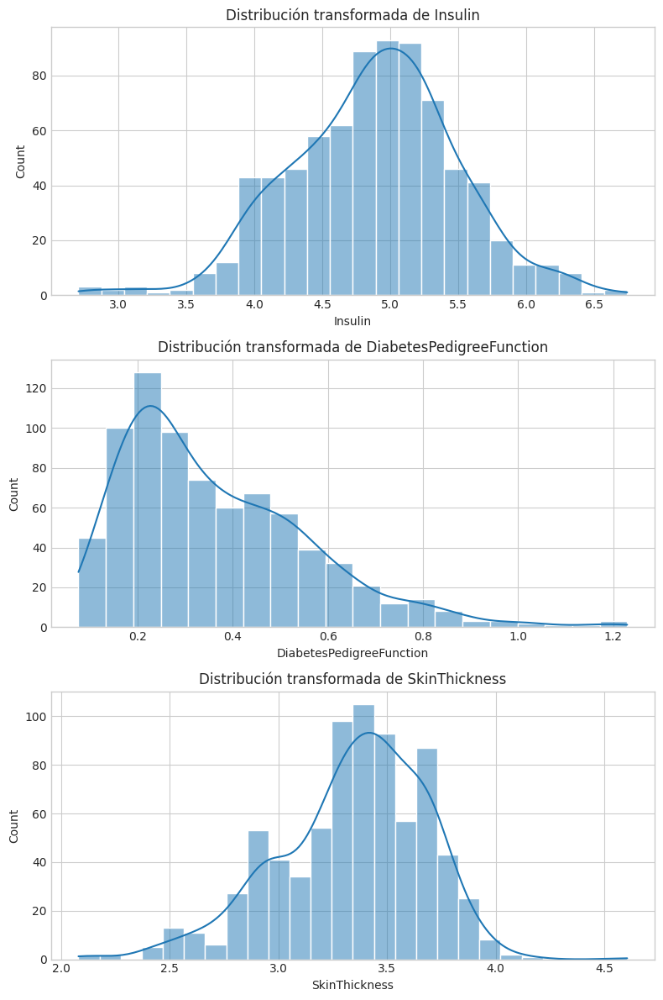

In [ ]:
# Crear una copia del DataFrame original para aplicar las transformaciones
df_trans = df_cleaned.copy()

# Transformación logarítmica para las variables sesgadas
variables_to_transform = ['Insulin', 'DiabetesPedigreeFunction', 'SkinThickness']

for var in variables_to_transform:
    # Aplicamos log1p para manejar valores cercanos a 0 (log1p es log(1 + x))
    df_trans[var] = np.log1p(df_trans[var])

# Imprimimos un resumen de las variables transformadas para verificar
print(df_trans[variables_to_transform].describe())

# Visualizamos nuevamente las distribuciones después de la transformación (opcional)
import matplotlib.pyplot as plt
import seaborn as sns

fig, axs = plt.subplots(len(variables_to_transform), figsize=(8, 12))
for i, var in enumerate(variables_to_transform):
    sns.histplot(df_trans[var], kde=True, ax=axs[i])
    axs[i].set_title(f'Distribución transformada de {var}')
plt.tight_layout()
plt.show()


Las transformaciones logarítmicas han sido efectivas para preparar estas variables para el siguiente paso (eliminación de outliers). Ahora procederemos con el método del rango intercuartílico (IQR) para eliminar los valores extremos restantes en todas las variables del dataframe transformado (df_trans).

In [ ]:
# Crear una copia del DataFrame transformado para eliminar outliers
df_no_outliers = df_trans.copy()

# Lista de variables numéricas (excluyendo 'Pregnancies')
nume_vars = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
             'BMI', 'DiabetesPedigreeFunction', 'Age']

# Identificación y eliminación de outliers usando el método IQR
for var in nume_vars:
    Q1 = df_no_outliers[var].quantile(0.25)  # Primer cuartil
    Q3 = df_no_outliers[var].quantile(0.75)  # Tercer cuartil
    IQR = Q3 - Q1  # Rango intercuartílico

    # Calculamos los límites inferior y superior
    lower_bound = max(Q1 - 1.5 * IQR, 0)  # Ajustamos el límite inferior a 0 si es negativo
    upper_bound = Q3 + 1.5 * IQR

    # Filtramos los datos dentro de los límites
    df_no_outliers = df_no_outliers[(df_no_outliers[var] >= lower_bound) & (df_no_outliers[var] <= upper_bound)]

# Imprimimos información sobre los datos después de eliminar outliers
print("Número de filas antes de eliminar outliers:", len(df_trans))
print("Número de filas después de eliminar outliers:", len(df_no_outliers))
print("Número de filas eliminadas:", len(df_trans) - len(df_no_outliers))

# Opcional: verificar las estadísticas descriptivas después de eliminar outliers
print(df_no_outliers.describe())


Número de filas antes de eliminar outliers: 768
Número de filas después de eliminar outliers: 708
Número de filas eliminadas: 60
       Pregnancies     Glucose  BloodPressure  SkinThickness     Insulin  \
count   708.000000  708.000000     708.000000     708.000000  708.000000   
mean      3.850282  121.296610      72.165254       3.347784    4.883465   
std       3.354182   29.832624      10.804268       0.316248    0.559633   
min       0.000000   44.000000      44.000000       2.484907    3.401197   
25%       1.000000  100.000000      64.000000       3.168269    4.488636   
50%       3.000000  117.000000      72.000000       3.388001    4.912655   
75%       6.000000  140.000000      80.000000       3.583519    5.249731   
max      17.000000  199.000000     104.000000       4.110874    6.398595   

              BMI  DiabetesPedigreeFunction         Age     Outcome  
count  708.000000                708.000000  708.000000  708.000000  
mean    32.247316                  0.351682   

Vamos a mantener los valores de Pregnancies mientras eliminamos outliers en el resto de las variables en este cuaderno.


Pregnancies es una variable discreta y categórica (número entero de embarazos). Los valores altos, como 13 o 17, aunque raros, son plausibles y representativos de casos reales.

Los valores extremos en esta variable no afectan las relaciones entre variables como lo harían los valores extremos en variables continuas. Por ello vamos mantener los valores de esta varibale y eliminaremos los valores extremos del resto de variables.

---

A partir de este moomento vamos a trabajar con dos dataframes para evaluar los modelos.
1. Vamos a crear nuevas caraterísticas - df_with_features
2. No vamos a crear nuevas caracteristicas - df_no_outliers

En ambos haremos esto:
- Prepararemos los datos en X (variables predictoras) e y (variable objetivo).
- Dividiremos los datos en X_train, X_test, y_train, y_test utilizando train_test_split.
- Haremos la selección de características
- Escalado: Aplicaremos StandardScaler a las variables numéricas de X_train y X_test. Es crucial escalar después de la división para evitar data leakage. Usaremos únicamente X_train para calcular los parámetros del escalador (media y desviación estándar para StandardScaler). Utilizaremos el mismo escalador ajustado con X_train para transformar X_validation y X_test. Esto asegura que todos los conjuntos de datos se escalen de manera consistente, usando las estadísticas del conjunto de entrenamiento.
- Manejo del desbalance: Aplicaremos SMOTE (Synthetic Minority Over-sampling Technique) solo a X_train e y_train. Esto generará muestras sintéticas de la clase minoritaria para equilibrar el dataset. No aplicaremos SMOTE a los datos de prueba para mantener su distribución original. Este enfoque asegura que nuestro modelo se entrene con datos balanceados y escalados correctamente, mientras mantenemos un conjunto de prueba representativo de la distribución real del problema.

---

CREAMOS CARACTERISTICAS:

- Relación Glucosa/Insulina: Puede capturar la relación entre los niveles de glucosa e insulina, lo cual es relevante para el diagnóstico de diabetes.
- Producto de Glucosa e IMC: Relaciona los niveles de glucosa con el índice de masa corporal (IMC), lo cual puede ser útil para identificar riesgos metabólicos.
- Indicador de presión arterial alta: Es una característica categórica basada en un umbral médico (por ejemplo, presión arterial > 80 mmHg).
- Razón entre BMI y SkinThickness: Puede capturar información sobre la composición corporal y almacenamiento de grasa.
- Interacción entre Edad y Embarazos : La edad y el número de embarazos podrían combinarse para reflejar mejor el riesgo en mujeres.
- Indicador categórico basado en rangos de edad: Agrupar edades en categorías puede ser útil para capturar patrones específicos por grupos etarios.

In [ ]:
# Crear una copia del dataframe original
df_with_features = df_no_outliers.copy()

# Crear nuevas características
df_with_features['Glucose_Insulin_Ratio'] = df_with_features['Glucose'] / df_with_features['Insulin']
df_with_features['Glucose_BMI_Product'] = df_with_features['Glucose'] * df_with_features['BMI']
df_with_features['High_BP'] = (df_with_features['BloodPressure'] > 80).astype(int)
df_with_features['BMI_SkinThickness_Ratio'] = df_with_features['BMI'] / df_with_features['SkinThickness']
df_with_features['Age_Pregnancies_Interaction'] = df_with_features['Age'] * df_with_features['Pregnancies']

# Crear indicador categórico basado en rangos de edad
bins = [20, 30, 50, 100]  # Definir los rangos
labels = ['Young', 'Middle-aged', 'Older']
df_with_features['Age_Category'] = pd.cut(df_with_features['Age'], bins=bins, labels=labels)

# Verificar las primeras filas del nuevo dataframe
print(df_with_features.head())


   Pregnancies  Glucose  BloodPressure  SkinThickness   Insulin   BMI  \
0            6      148             72       3.583519  5.181109  33.6   
1            1       85             66       3.401197  3.954124  26.6   
2            8      183             64       2.953999  5.577047  23.3   
3            1       89             66       3.178054  4.553877  28.1   
5            5      116             74       3.287900  4.810476  25.6   

   DiabetesPedigreeFunction  Age  Outcome  Glucose_Insulin_Ratio  \
0                  0.486738   50        1              28.565312   
1                  0.300845   31        0              21.496543   
2                  0.514021   32        1              32.813064   
3                  0.154436   21        0              19.543787   
5                  0.183155   30        0              24.114040   

   Glucose_BMI_Product  High_BP  BMI_SkinThickness_Ratio  \
0               4972.8        0                 9.376259   
1               2261.0        0 

In [ ]:
# Preprocesamiento del dataframe con nuevas características
df_with_features_encoded = df_with_features.copy()

# Aplicar one-hot encoding a columnas categóricas ('Age_Category')
df_with_features_encoded = pd.get_dummies(df_with_features_encoded, columns=['Age_Category'], drop_first=True)

# Verificar las columnas resultantes y el DataFrame actualizado
print("Columnas después de one-hot encoding:", df_with_features_encoded.columns)
print("Primeras filas del DataFrame actualizado:")
print(df_with_features_encoded.head())

Columnas después de one-hot encoding: Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome',
       'Glucose_Insulin_Ratio', 'Glucose_BMI_Product', 'High_BP',
       'BMI_SkinThickness_Ratio', 'Age_Pregnancies_Interaction',
       'Age_Category_Middle-aged', 'Age_Category_Older'],
      dtype='object')
Primeras filas del DataFrame actualizado:
   Pregnancies  Glucose  BloodPressure  SkinThickness   Insulin   BMI  \
0            6      148             72       3.583519  5.181109  33.6   
1            1       85             66       3.401197  3.954124  26.6   
2            8      183             64       2.953999  5.577047  23.3   
3            1       89             66       3.178054  4.553877  28.1   
5            5      116             74       3.287900  4.810476  25.6   

   DiabetesPedigreeFunction  Age  Outcome  Glucose_Insulin_Ratio  \
0                  0.486738   50        1              28.565312

In [ ]:
# Convertir columnas booleanas a 0 y 1
boolean_columns = df_with_features_encoded.select_dtypes(include=['bool']).columns
df_with_features_encoded[boolean_columns] = df_with_features_encoded[boolean_columns].astype(int)

# Verificar el DataFrame después del preprocesamiento
print("Columnas después del preprocesamiento:", df_with_features_encoded.columns)
print("Primeras filas del DataFrame actualizado:")
print(df_with_features_encoded.head())

# Preparar X e y para la selección de características
X_with_features = df_with_features_encoded.drop('Outcome', axis=1)
y_with_features = df_with_features_encoded['Outcome']

print("X shape con nuevas características (preprocesado):", X_with_features.shape)
print("Preview of X con nuevas características (preprocesado):", X_with_features.head())

Columnas después del preprocesamiento: Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome',
       'Glucose_Insulin_Ratio', 'Glucose_BMI_Product', 'High_BP',
       'BMI_SkinThickness_Ratio', 'Age_Pregnancies_Interaction',
       'Age_Category_Middle-aged', 'Age_Category_Older'],
      dtype='object')
Primeras filas del DataFrame actualizado:
   Pregnancies  Glucose  BloodPressure  SkinThickness   Insulin   BMI  \
0            6      148             72       3.583519  5.181109  33.6   
1            1       85             66       3.401197  3.954124  26.6   
2            8      183             64       2.953999  5.577047  23.3   
3            1       89             66       3.178054  4.553877  28.1   
5            5      116             74       3.287900  4.810476  25.6   

   DiabetesPedigreeFunction  Age  Outcome  Glucose_Insulin_Ratio  \
0                  0.486738   50        1              28.56531

---

### SELECCIÓN DE CARACTERÍSTICAS:

- Dividimos primero los datos para evitar el data leakage. Si seleccionamos las características usando todo el conjunto de datos y luego lo dividimos, se estaría filtrando información del conjunto de prueba al de entrenamiento.

- La selección de características debe realizarse solo en el conjunto de entrenamiento para asegurar que el conjunto de prueba permanezca completamente independiente y no influya en el proceso de modelado.

- Utilizaremos varios métodos de selección de características. Estos métodos se pueden clasificar en tres categorías principales:

  - Métodos de filtrado: Estos métodos seleccionan características basándose en medidas estadísticas, sin utilizar ningún modelo de aprendizaje.
    - Correlación de Pearson: Este método mide la correlación lineal entre cada característica y la variable objetivo. Las características con mayor correlación absoluta se consideran más importantes.
    - Información mutua: Utiliza la función mutual_info_classif para medir la dependencia entre cada característica y la variable objetivo. Se seleccionan las 10 características con mayor información mutua.
    - Chi-cuadrado: Este método es especialmente útil para características categóricas. Se utiliza SelectKBest con la función chi2 para seleccionar las 10 mejores características según esta prueba estadística.
  - Métodos de envoltura: Estos métodos utilizan un modelo de aprendizaje automático para evaluar subconjuntos de características.
    - Eliminación de características recursivas (RFE): Este método utiliza un modelo (en este caso, RandomForestClassifier) para eliminar recursivamente las características menos importantes hasta que queden solo 10.
  - Métodos incorporados: Estos métodos realizan la selección de características como parte del proceso de entrenamiento del modelo.
    - LASSO (Least Absolute Shrinkage and Selection Operator): Este método de regularización L1 puede reducir algunos coeficientes a cero, efectivamente seleccionando características. Las características con coeficientes no nulos son seleccionadas.
    - Importancia de características en Random Forest: Este método utiliza la importancia de características inherente al algoritmo Random Forest. Se seleccionan las 10 características más importantes según este criterio.


Cada uno de estos métodos proporciona una perspectiva diferente sobre la importancia de las características, lo que permite una selección más robusta y completa para el modelo final.

A continuación realizaremos un análisis de la frecuencia de las características seleccionadas por los diferentes métodos de selección de características. Escogeremos las características que han sido seleccionadas como más importantes por al menos 3 metodos de selección.

### Selección de características para el dataframe sin nuevas características (df_no_outliers)

In [ ]:
# Preparar X e y para el dataframe sin nuevas características
X_no_features = df_no_outliers.drop('Outcome', axis=1)
y_no_features = df_no_outliers['Outcome']

print("X shape:", X_no_features.shape)
print("Preview of X:", X_no_features.head())

# Dividir los datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_no_features, y_no_features, test_size=0.3, random_state=42, stratify=y_no_features)

# Métodos de filtrado:
# 1. Correlación de Pearson
corr_features = X_train.corrwith(y_train).abs().sort_values(ascending=False)

# 2. Información Mutua
mi_selector = SelectKBest(mutual_info_classif, k=10)
mi_selector.fit(X_train, y_train)
mi_features = X_train.columns[mi_selector.get_support()]

# 3. Chi-cuadrado (requiere valores no negativos)
chi2_selector = SelectKBest(chi2, k=10)
X_train_non_negative = X_train.clip(lower=0)  # Asegurarse de que no haya valores negativos
chi2_selector.fit(X_train_non_negative, y_train)
chi2_features = X_train.columns[chi2_selector.get_support()]

# Métodos de envoltura:
# 4. Eliminación de características recursivas (RFE) con Random Forest
rfe_selector = RFE(estimator=RandomForestClassifier(random_state=42), n_features_to_select=10)
rfe_selector.fit(X_train, y_train)
rfe_features = X_train.columns[rfe_selector.support_]

# Métodos incorporados:
# 5. LASSO (Regularización L1)
lasso = Lasso(alpha=0.1, random_state=42)  # Ajustar alpha según sea necesario
lasso.fit(X_train, y_train)
lasso_features = X_train.columns[lasso.coef_ != 0]

# 6. Importancia de características en Random Forest
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)
rf_features = X_train.columns[rf.feature_importances_.argsort()[::-1][:10]]

# Imprimir las características seleccionadas por cada método
print("Pearson Correlation:", list(corr_features.index[:10]))
print("Mutual Information:", list(mi_features))
print("Chi-square:", list(chi2_features))
print("RFE:", list(rfe_features))
print("LASSO:", list(lasso_features))
print("Random Forest:", list(rf_features))

# Analizar la frecuencia de las características seleccionadas por los diferentes métodos
all_features = (
    list(corr_features.index[:10]) +
    list(mi_features) +
    list(chi2_features) +
    list(rfe_features) +
    list(lasso_features) +
    list(rf_features)
)

feature_counts = Counter(all_features)

print("\nFrecuencia de características seleccionadas:")
for feature, count in feature_counts.most_common():
    print(f"{feature}: {count}")


X shape: (708, 8)
Preview of X:    Pregnancies  Glucose  BloodPressure  SkinThickness   Insulin   BMI  \
0            6      148             72       3.583519  5.181109  33.6   
1            1       85             66       3.401197  3.954124  26.6   
2            8      183             64       2.953999  5.577047  23.3   
3            1       89             66       3.178054  4.553877  28.1   
5            5      116             74       3.287900  4.810476  25.6   

   DiabetesPedigreeFunction  Age  
0                  0.486738   50  
1                  0.300845   31  
2                  0.514021   32  
3                  0.154436   21  
5                  0.183155   30  
Pearson Correlation: ['Glucose', 'Insulin', 'SkinThickness', 'BMI', 'Age', 'DiabetesPedigreeFunction', 'Pregnancies', 'BloodPressure']
Mutual Information: ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']
Chi-square: ['Pregnancies', 'Glucose', 'BloodPress

### Selección de características para el dataframe con nuevas características (df_with_features_encoded)

In [ ]:

# Preparar X e y para el dataframe con nuevas características
X_with_features = df_with_features_encoded.drop('Outcome', axis=1)
y_with_features = df_with_features_encoded['Outcome']

print("X shape con nuevas características:", X_with_features.shape)
print("Preview of X con nuevas características:", X_with_features.head())

# Dividir los datos en entrenamiento y prueba
X_train_with_features, X_test_with_features, y_train_with_features, y_test_with_features = train_test_split(
    X_with_features, y_with_features, test_size=0.3, random_state=42, stratify=y_with_features)

# Métodos de filtrado:
# 1. Correlación de Pearson
corr_features_with_features = X_train_with_features.corrwith(y_train_with_features).abs().sort_values(ascending=False)

# 2. Información Mutua
mi_selector_with_features = SelectKBest(mutual_info_classif, k=10)
mi_selector_with_features.fit(X_train_with_features, y_train_with_features)
mi_features_with_features = X_train_with_features.columns[mi_selector_with_features.get_support()]

# 3. Chi-cuadrado (requiere valores no negativos)
chi2_selector_with_features = SelectKBest(chi2, k=10)
X_train_non_negative_with_features = X_train_with_features.clip(lower=0)  # Asegurarse de que no haya valores negativos
chi2_selector_with_features.fit(X_train_non_negative_with_features, y_train_with_features)
chi2_features_with_features = X_train_with_features.columns[chi2_selector_with_features.get_support()]

# Métodos de envoltura:
# 4. Eliminación de características recursivas (RFE) con Random Forest
rfe_selector_with_features = RFE(estimator=RandomForestClassifier(random_state=42), n_features_to_select=10)
rfe_selector_with_features.fit(X_train_with_features, y_train_with_features)
rfe_features_with_features = X_train_with_features.columns[rfe_selector_with_features.support_]

# Métodos incorporados:
# 5. LASSO (Regularización L1)
lasso_with_features = Lasso(alpha=0.1, random_state=42)  # Ajustar alpha según sea necesario
lasso_with_features.fit(X_train_with_features, y_train_with_features)
lasso_features_with_features = X_train_with_features.columns[lasso_with_features.coef_ != 0]

# 6. Importancia de características en Random Forest
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train_with_features, y_train_with_features)
rf_feature_importances = rf_classifier.feature_importances_
rf_top_10_indices = rf_feature_importances.argsort()[::-1][:10]
rf_top_10_columns = X_train_with_features.columns[rf_top_10_indices]

# Imprimir las características seleccionadas por cada método
print("Pearson Correlation:", list(corr_features_with_features.index[:10]))
print("Mutual Information:", list(mi_features_with_features))
print("Chi-square:", list(chi2_features_with_features))
print("RFE:", list(rfe_features_with_features))
print("LASSO:", list(lasso_features_with_features))
print("Random Forest:", list(rf_top_10_columns))

# Analizar la frecuencia de las características seleccionadas por los diferentes métodos
all_selected_newfeatures = (
    list(corr_features_with_features.index[:10]) +
    list(mi_features_with_features) +
    list(chi2_features_with_features) +
    list(rfe_features_with_features) +
    list(lasso_features_with_features) +
    list(rf_top_10_columns)
)

feature_counts_newfeatures = Counter(all_selected_newfeatures)

print("\nFrecuencia de características seleccionadas:")
for feature, count in feature_counts_newfeatures.most_common():
    print(f"{feature}: {count}")


X shape con nuevas características: (708, 15)
Preview of X con nuevas características:    Pregnancies  Glucose  BloodPressure  SkinThickness   Insulin   BMI  \
0            6      148             72       3.583519  5.181109  33.6   
1            1       85             66       3.401197  3.954124  26.6   
2            8      183             64       2.953999  5.577047  23.3   
3            1       89             66       3.178054  4.553877  28.1   
5            5      116             74       3.287900  4.810476  25.6   

   DiabetesPedigreeFunction  Age  Glucose_Insulin_Ratio  Glucose_BMI_Product  \
0                  0.486738   50              28.565312               4972.8   
1                  0.300845   31              21.496543               2261.0   
2                  0.514021   32              32.813064               4263.9   
3                  0.154436   21              19.543787               2500.9   
5                  0.183155   30              24.114040               2969

- En ambos casos, las variables originales como Glucose, BMI, y Age son seleccionadas consistentemente por todos los métodos.

  Esto muestra que estas variables son esenciales independientemente de si se crean nuevas características o no.


- En el dataframe con nuevas características, las interacciones (Glucose_BMI_Product, Age_Pregnancies_Interaction) tienen una alta frecuencia de selección, lo que indica que aportan valor adicional al modelo.

  Algunas variables originales como Pregnancies tienen menor relevancia en el dataframe con nuevas características (solo seleccionada por un método).

1. Para el dataframe (df_no_outliers) que no tiene características nuevas vamos a setablecer un límite de selección por al menos 5 métodos. Esto asegurará que mantengamoss las características fundamentales y relevantes para el modelo.
2. Para el dataframe con nuevas características (df_with_features_encoded) estableceremos un límite de selección por al menos 4 métodos. Esto permitirá incluir las nuevas características relevantes junto con las variables originales importantes, sin perder información valiosa.

In [ ]:
# Definir umbral para seleccionar las características finales en df_no_outliers(seleccionadas por al menos 5 métodos)
selected_features_no_outliers = [feature for feature, count in feature_counts.items() if count >= 5]

X_selected_no_outliers = df_no_outliers[selected_features_no_outliers]
y_selected_no_outliers = df_no_outliers['Outcome']

# Verificar el nuevo conjunto de datos
print("Características seleccionadas (sin nuevas características):", selected_features_no_outliers)
print("Shape del nuevo conjunto:", X_selected_no_outliers.shape)
print("Primeras filas del nuevo conjunto:")
print(X_selected_no_outliers.head())


Características seleccionadas (sin nuevas características): ['Glucose', 'Insulin', 'SkinThickness', 'BMI', 'Age', 'DiabetesPedigreeFunction', 'Pregnancies', 'BloodPressure']
Shape del nuevo conjunto: (708, 8)
Primeras filas del nuevo conjunto:
   Glucose   Insulin  SkinThickness   BMI  Age  DiabetesPedigreeFunction  \
0      148  5.181109       3.583519  33.6   50                  0.486738   
1       85  3.954124       3.401197  26.6   31                  0.300845   
2      183  5.577047       2.953999  23.3   32                  0.514021   
3       89  4.553877       3.178054  28.1   21                  0.154436   
5      116  4.810476       3.287900  25.6   30                  0.183155   

   Pregnancies  BloodPressure  
0            6             72  
1            1             66  
2            8             64  
3            1             66  
5            5             74  


In [ ]:
# Definir umbral para seleccionar las características finales en df_with_features(seleccionadas por al menos 4 métodos)
selected_features_with_features = [feature for feature, count in feature_counts_newfeatures.items() if count >= 4]

X_selected_with_features = df_with_features_encoded[selected_features_with_features]
y_selected_with_features = df_with_features_encoded['Outcome']

# Verificar el nuevo conjunto de datos
print("Características seleccionadas (con nuevas características):", selected_features_with_features)
print("Shape del nuevo conjunto:", X_selected_with_features.shape)
print("Primeras filas del nuevo conjunto:")
print(X_selected_with_features.head())


Características seleccionadas (con nuevas características): ['Glucose_BMI_Product', 'Glucose', 'Glucose_Insulin_Ratio', 'Insulin', 'SkinThickness', 'BMI', 'Age', 'DiabetesPedigreeFunction', 'Age_Pregnancies_Interaction']
Shape del nuevo conjunto: (708, 9)
Primeras filas del nuevo conjunto:
   Glucose_BMI_Product  Glucose  Glucose_Insulin_Ratio   Insulin  \
0               4972.8      148              28.565312  5.181109   
1               2261.0       85              21.496543  3.954124   
2               4263.9      183              32.813064  5.577047   
3               2500.9       89              19.543787  4.553877   
5               2969.6      116              24.114040  4.810476   

   SkinThickness   BMI  Age  DiabetesPedigreeFunction  \
0       3.583519  33.6   50                  0.486738   
1       3.401197  26.6   31                  0.300845   
2       2.953999  23.3   32                  0.514021   
3       3.178054  28.1   21                  0.154436   
5       3.28790

---

# ENTRENAMIENTO DE MODELOS

La estrategia que seguiré en este paso de entrenamiento es la siguiente:

- Entrenaremos varios modelos de aprendizaje automático utilizando la división de los datos en entrenamiento y prueba. Evaluaremos los resultados obtenidos y escogeremos el modelo que mejores resultados presente. Una vez escogido el modelo ganador, repetiremos el entrenamiento en este modelo aplicando validación cruzada (cross-validation). De esta manera, los resultados serán más robustos y más representativos del rendimiento real del modelo en datos no vistos.

Vamos a entrenar los siguientes modelos:

- Regresión Logística: Aunque no es inherentemente robusto frente a outliers, su simplicidad permite identificar rápidamente patrones generales en los datos. Además, puede servir como punto de comparación para evaluar la efectividad de los modelos más complejos.
- Random Forest: Robusto ante outliers y capaz de capturar relaciones no lineales. Gradient Boosting: Potente en la captura de patrones complejos y generalmente ofrece alto rendimiento.
- Support Vector Machines (SVM) con kernel no lineal: Eficaz en la separación de clases en espacios de alta dimensión.
- XGBoost: Conocido por su alto rendimiento en una variedad de problemas de clasificación.
- Red Neuronal: Capaz de aprender representaciones complejas de los datos. Esta variedad de modelos nos permitirá explorar diferentes enfoques y determinar cuál se adapta mejor a la estructura y características de nuestros datos de Framingham.


Además vamos a probar diferentes estrategias.
- Entrenaminto sin reducción de la dimensionalidad
- PCA para reducir la dimensión de los datos
- Selección de características con Random Forest
- PCA + Selección de características con Random Forest
- Otras tecnicas de balanceo de clases como : SMOTETomek, Adasy y Borderline-SMOTE


## 1. PRIMER ENTRENAMIENTO SIN PCA, NI SELECCION DE CARACTERISTICAS
- División de datos: Usando train_test_split, con un 70% para entrenamiento y 30% para prueba.
- Escalado de datos: Utilizamos StandardScaler para estandarizar las características, ajustando el escalador con X_train y transformando tanto X_train como X_test.
- Balanceo de clases con SMOTE: Aplicamos SMOTE al conjunto de entrenamiento escalado (X_train_scaled) para generar nuevas muestras sintéticas de la clase minoritaria, obteniendo X_train_smote y y_train_smote.

Definición de modelos:

Entrenamiento y evaluación de modelos: Se entrena cada modelo con los datos balanceados (X_train_smote, y_train_smote). Se realizan predicciones en el conjunto de prueba escalado (X_test_scaled).

Se calculan las métricas de evaluación: Reporte de clasificación (classification_report) Matriz de confusión (confusion_matrix) Curva ROC y AUC (roc_curve, auc)

Visualización de resultados: Generamos gráficos de matrices de confusión para cada modelo usando seaborn. Graficamos las curvas ROC para todos los modelos en una sola figura.
Por último comparamos las métricas de precisión, recall y f1-score para la clase positiva (1) entre los modelos, y se representan en un gráfico de barras.

## df_no_outlieres

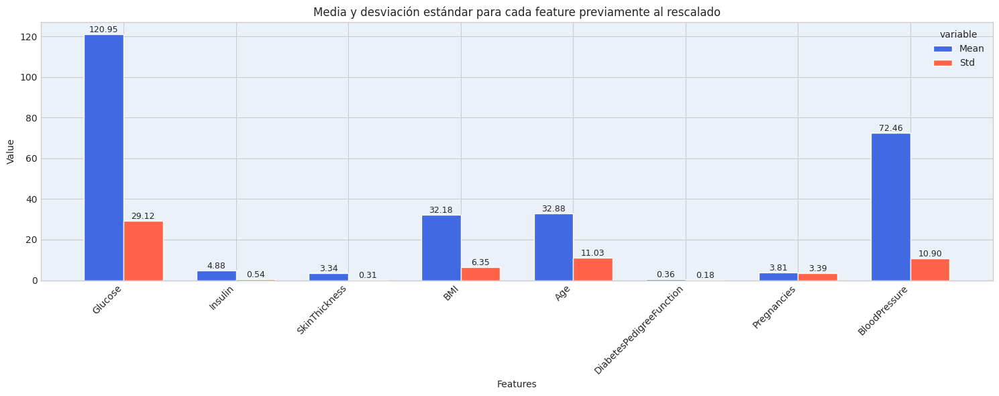

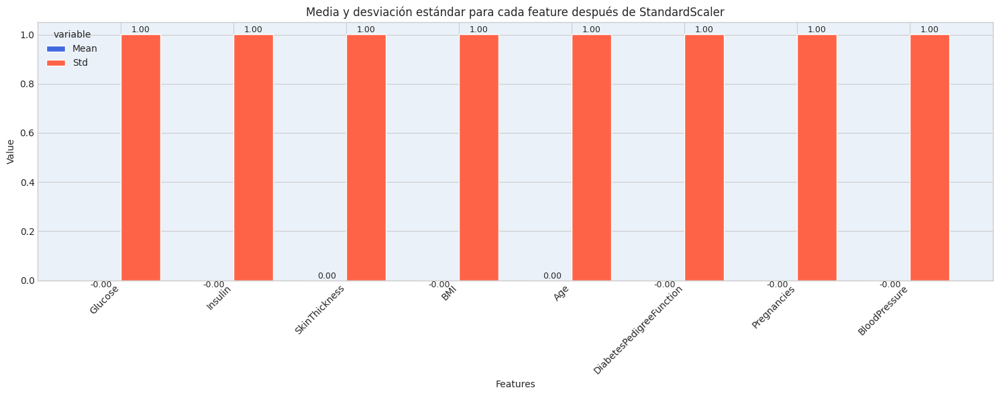


Training Logistic Regression...
Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.87      0.77      0.82       138
           1       0.65      0.79      0.71        75

    accuracy                           0.77       213
   macro avg       0.76      0.78      0.76       213
weighted avg       0.79      0.77      0.78       213


Training Random Forest...
Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.84      0.81      0.83       138
           1       0.68      0.72      0.70        75

    accuracy                           0.78       213
   macro avg       0.76      0.77      0.76       213
weighted avg       0.78      0.78      0.78       213


Training Gradient Boosting...
Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

           0       0.83      0.80      0.82       138
           1 

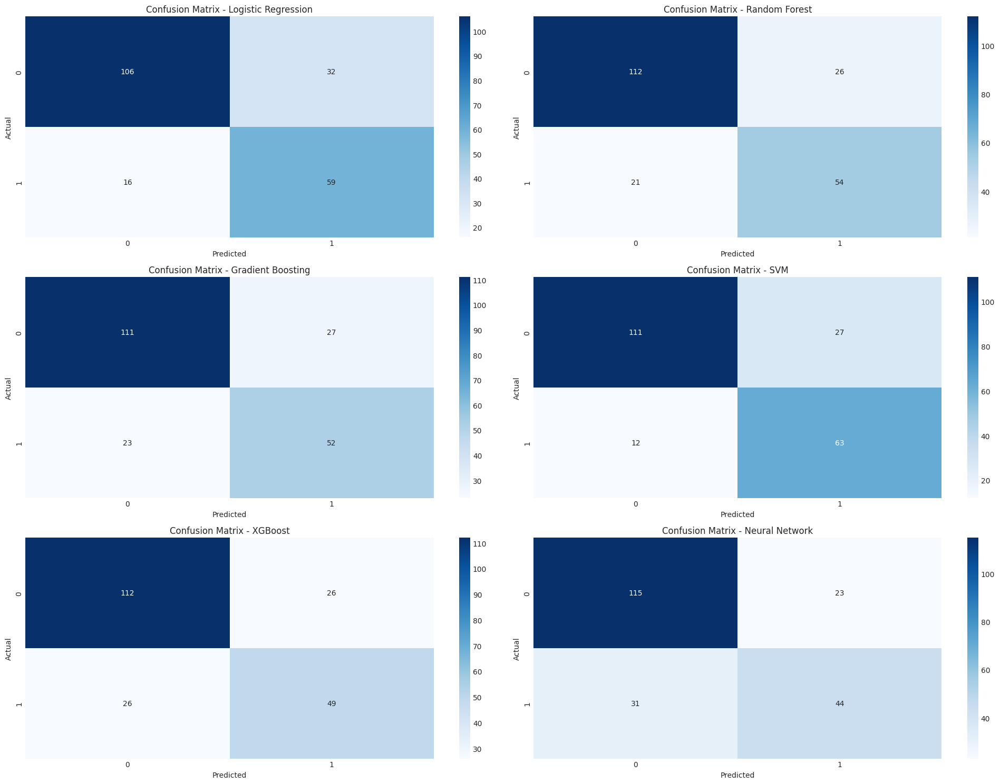

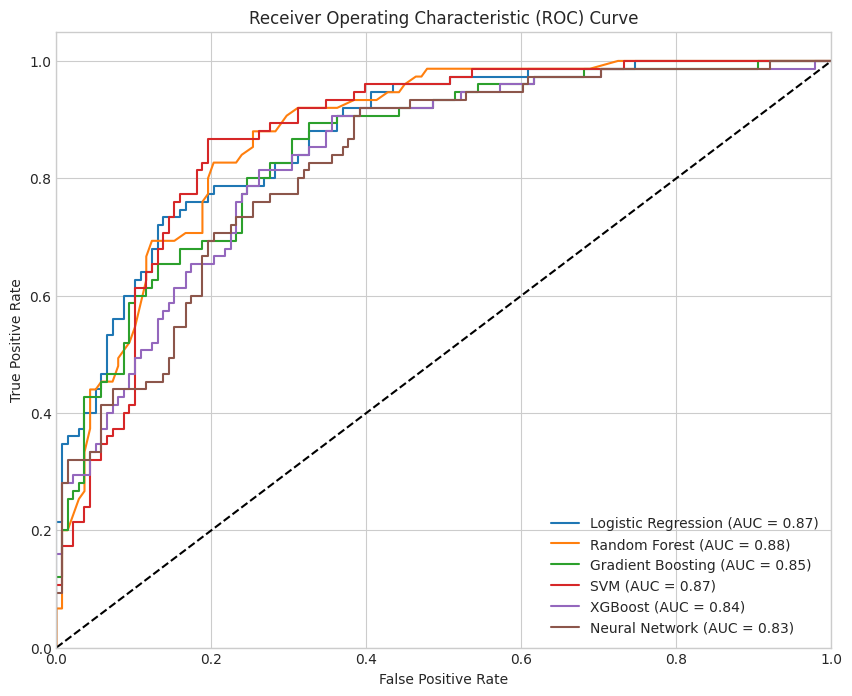

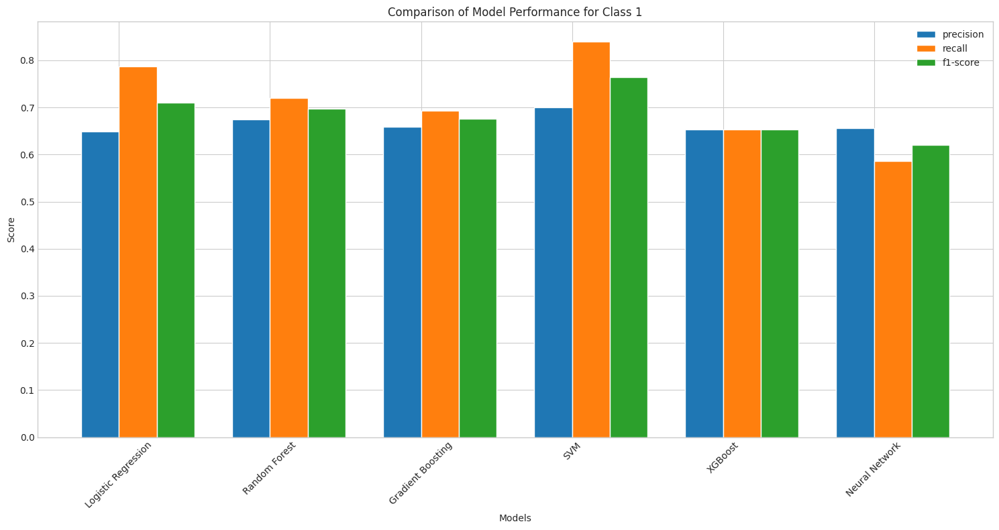

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Preparar los datos: X e y ya definidos como X_selected_no_outliers y y_selected_no_outliers

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_no_outliers, y_selected_no_outliers,
    test_size=0.3, random_state=42, stratify=y_selected_no_outliers
)


# Visualización antes del escalado
plt.figure(figsize=(15, 6))
plt.subplots_adjust(bottom=0.3)
ax = plt.subplot(111, facecolor='#eaf1f8')  # Fondo azul claro similar a la imagen

features = X_train.columns
x = np.arange(len(features))
width = 0.35

means = X_train.mean()
stds = X_train.std()

# Crear las barras
bars1 = plt.bar(x - width/2, means, width, label='Mean', color='royalblue')
bars2 = plt.bar(x + width/2, stds, width, label='Std', color='tomato')

# Añadir etiquetas, título y leyenda
plt.xlabel('Features')
plt.ylabel('Value')
plt.title('Media y desviación estándar para cada feature previamente al rescalado')
plt.xticks(x, features, rotation=45, ha='right')
plt.legend(title='variable')

# Añadir los valores encima de las barras
for bar in bars1:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.2f}',
             ha='center', va='bottom', fontsize=9)

for bar in bars2:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.2f}',
             ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.savefig('pre_scaling_visualization.png')
plt.show()

# 3. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


# Visualización después del escalado
plt.figure(figsize=(15, 6))
plt.subplots_adjust(bottom=0.3)
ax = plt.subplot(111, facecolor='#eaf1f8')

# Convertir el array numpy a DataFrame para mantener los nombres de las columnas
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=features)
means_scaled = X_train_scaled_df.mean()
stds_scaled = X_train_scaled_df.std()

# Crear las barras
bars1 = plt.bar(x - width/2, means_scaled, width, label='Mean', color='royalblue')
bars2 = plt.bar(x + width/2, stds_scaled, width, label='Std', color='tomato')

# Añadir etiquetas, título y leyenda
plt.xlabel('Features')
plt.ylabel('Value')
plt.title('Media y desviación estándar para cada feature después de StandardScaler')
plt.xticks(x, features, rotation=45, ha='right')
plt.legend(title='variable')

# Añadir los valores encima de las barras
for bar in bars1:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.2f}',
             ha='center', va='bottom' if height >= 0 else 'top', fontsize=9)

for bar in bars2:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.2f}',
             ha='center', va='bottom' if height >= 0 else 'top', fontsize=9)

plt.tight_layout()
plt.savefig('post_scaling_visualization.png')
plt.show()

# 4. Balancear las clases con SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

# 5. Definir los modelos
models = {
    'Logistic Regression': LogisticRegression(random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'SVM': SVC(kernel='rbf', probability=True, random_state=42),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    'Neural Network': MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500, random_state=42)
}

# 6. Entrenar y evaluar cada modelo
results = {}

for name, model in models.items():
    print(f"\nTraining {name}...")

    # Entrenar el modelo con datos balanceados
    model.fit(X_train_smote, y_train_smote)

    # Predecir en el conjunto de prueba original
    y_pred = model.predict(X_test_scaled)
    y_prob = model.predict_proba(X_test_scaled)[:, 1] if hasattr(model, "predict_proba") else None

    # Calcular métricas
    report = classification_report(y_test, y_pred, output_dict=True)
    conf_matrix = confusion_matrix(y_test, y_pred)

    if y_prob is not None:
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        roc_auc = auc(fpr, tpr)
        results[name] = {
            'report': report,
            'conf_matrix': conf_matrix,
            'fpr': fpr,
            'tpr': tpr,
            'roc_auc': roc_auc
        }
    else:
        results[name] = {
            'report': report,
            'conf_matrix': conf_matrix,
            'roc_auc': None
        }

    # Imprimir reporte de clasificación
    print(f"Classification Report for {name}:")
    print(classification_report(y_test, y_pred))

# Visualizar resultados

# Matrices de confusión
plt.figure(figsize=(20, 15))
for i, (name, result) in enumerate(results.items()):
    plt.subplot(3, 2, i+1)
    sns.heatmap(result['conf_matrix'], annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix - {name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

plt.tight_layout()
plt.show()

# Curvas ROC
plt.figure(figsize=(10, 8))
for name, result in results.items():
    if result['roc_auc'] is not None:
        plt.plot(result['fpr'], result['tpr'], label=f'{name} (AUC = {result["roc_auc"]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Comparación de métricas (Precision/Recall/F1-score para clase positiva)
metrics = ['precision', 'recall', 'f1-score']
model_names = list(results.keys())
metric_values = {metric: [results[model]['report']['1'][metric] for model in model_names] for metric in metrics}

plt.figure(figsize=(15, 8))
x = np.arange(len(model_names))
width = 0.25

for i, metric in enumerate(metrics):
    plt.bar(x + i*width, metric_values[metric], width, label=metric)

plt.xlabel('Models')
plt.ylabel('Score')
plt.title('Comparison of Model Performance for Class 1')
plt.xticks(x + width / 2, model_names, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

Análisis basado en los outputs y visualizaciones de `df_selected_no_outliers`:

---

### **1. Análisis de las matrices de confusión**
Las matrices de confusión muestran el rendimiento de cada modelo en términos de predicciones correctas e incorrectas para ambas clases (0 y 1):

- **Mejor modelo para la clase positiva (1)**:
  - **SVM**: Tiene el mejor recall para la clase positiva (84%), lo que significa que identifica correctamente la mayoría de los casos positivos.
  - También tiene una precisión razonable (70%) y un buen equilibrio entre precisión y recall, como se refleja en su F1-score (76%).

- **Modelos con menor rendimiento para la clase positiva**:
  - **Neural Network**: Tiene el peor recall para la clase positiva (59%), lo que indica que pierde muchos casos positivos.
  - Aunque su precisión es aceptable (66%), su F1-score es el más bajo (62%).

---

### **2. Análisis de la curva ROC**
La curva ROC muestra cómo los modelos equilibran la tasa de verdaderos positivos (TPR) frente a la tasa de falsos positivos (FPR):

- **Mejor modelo según AUC**:
  - **Random Forest**: Tiene el AUC más alto (0.88), lo que indica un buen rendimiento general en la clasificación.
  - **SVM** y **Logistic Regression** también tienen un AUC alto (0.87), lo que refuerza su capacidad para separar las clases.

- **Modelos con menor AUC**:
  - **Neural Network**: Tiene el AUC más bajo (0.83), lo cual es consistente con su menor rendimiento en otras métricas.

---

### **3. Comparación de métricas clave**
El gráfico comparativo muestra las métricas de precisión, recall y F1-score para la clase positiva (1):

- **Mejor modelo según F1-score**:
  - **SVM**: Tiene el F1-score más alto (76%), lo que indica un buen equilibrio entre precisión y recall.
  - Esto lo convierte en una opción sólida si tu objetivo es maximizar el rendimiento en ambas métricas.

- **Modelos con menor F1-score**:
  - **Neural Network**: Tiene el F1-score más bajo (62%), lo que indica un desequilibrio entre precisión y recall.

---

### **4. Conclusión del primer experimento**
Basándome en los resultados:
- **Modelo ganador**: SVM, debido a su alto recall, buen F1-score, y rendimiento general equilibrado.
- **Modelos alternativos**: Random Forest también tiene un buen desempeño general, especialmente en términos de AUC, pero su recall es ligeramente inferior al de SVM.



### df_with_features


Training Logistic Regression...
Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.87      0.77      0.82       138
           1       0.65      0.79      0.71        75

    accuracy                           0.77       213
   macro avg       0.76      0.78      0.76       213
weighted avg       0.79      0.77      0.78       213


Training Random Forest...
Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.87      0.83      0.85       138
           1       0.72      0.77      0.74        75

    accuracy                           0.81       213
   macro avg       0.79      0.80      0.80       213
weighted avg       0.82      0.81      0.81       213


Training Gradient Boosting...
Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

           0       0.86      0.80      0.83       138
           1 

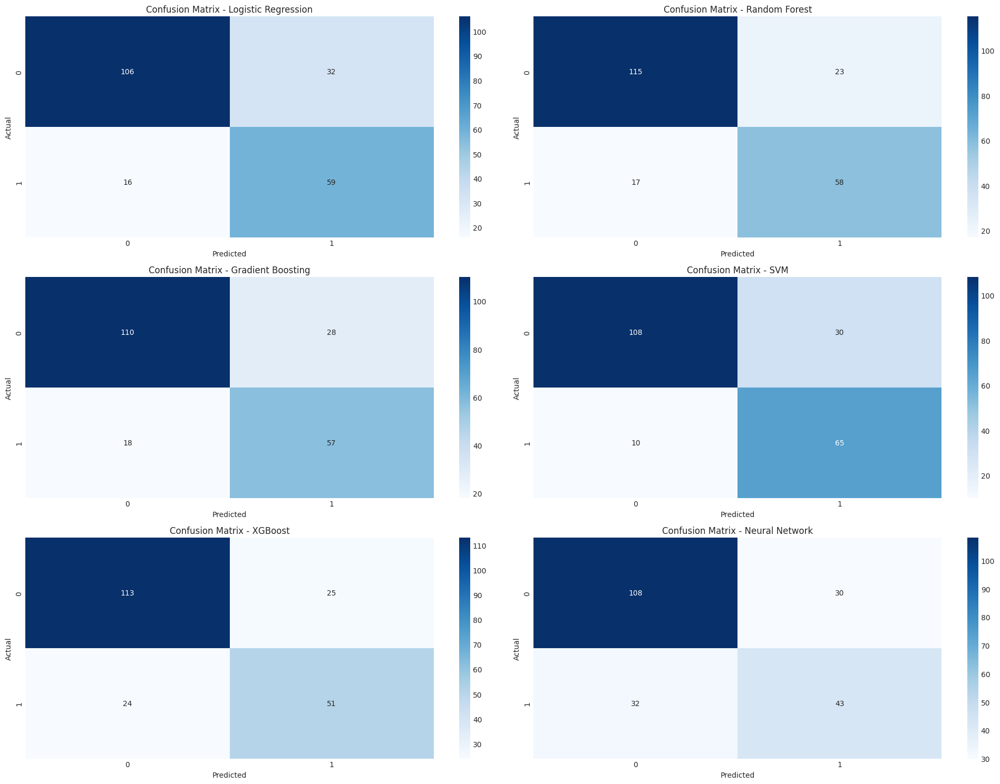

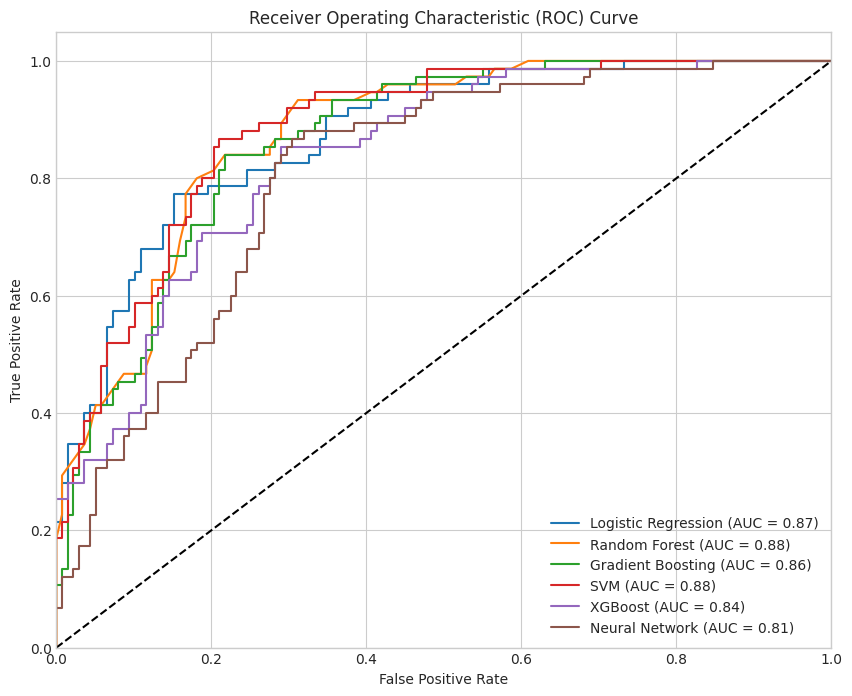

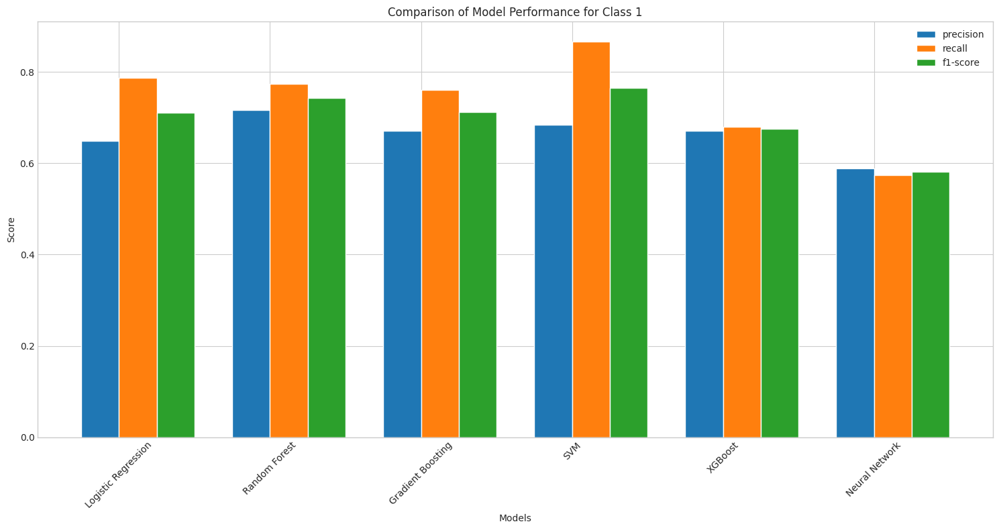

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Preparar los datos: X e y ya definidos como X_selected_with_features y y_selected_with_features
# Preparar los datos: X e y ya definidos



# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)


# 3. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Balancear las clases con SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

# 5. Definir los modelos
models = {
    'Logistic Regression': LogisticRegression(random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'SVM': SVC(kernel='rbf', probability=True, random_state=42),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    'Neural Network': MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500, random_state=42)
}

# 6. Entrenar y evaluar cada modelo
results = {}

for name, model in models.items():
    print(f"\nTraining {name}...")

    # Entrenar el modelo con datos balanceados
    model.fit(X_train_smote, y_train_smote)

    # Predecir en el conjunto de prueba original
    y_pred = model.predict(X_test_scaled)
    y_prob = model.predict_proba(X_test_scaled)[:, 1] if hasattr(model, "predict_proba") else None

    # Calcular métricas
    report = classification_report(y_test, y_pred, output_dict=True)
    conf_matrix = confusion_matrix(y_test, y_pred)

    if y_prob is not None:
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        roc_auc = auc(fpr, tpr)
        results[name] = {
            'report': report,
            'conf_matrix': conf_matrix,
            'fpr': fpr,
            'tpr': tpr,
            'roc_auc': roc_auc
        }
    else:
        results[name] = {
            'report': report,
            'conf_matrix': conf_matrix,
            'roc_auc': None
        }

    # Imprimir reporte de clasificación
    print(f"Classification Report for {name}:")
    print(classification_report(y_test, y_pred))

# Visualizar resultados

# Matrices de confusión
plt.figure(figsize=(20, 15))
for i, (name, result) in enumerate(results.items()):
    plt.subplot(3, 2, i+1)
    sns.heatmap(result['conf_matrix'], annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix - {name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

plt.tight_layout()
plt.show()

# Curvas ROC
plt.figure(figsize=(10, 8))
for name, result in results.items():
    if result['roc_auc'] is not None:
        plt.plot(result['fpr'], result['tpr'], label=f'{name} (AUC = {result["roc_auc"]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Comparación de métricas (Precision/Recall/F1-score para clase positiva)
metrics = ['precision', 'recall', 'f1-score']
model_names = list(results.keys())
metric_values = {metric: [results[model]['report']['1'][metric] for model in model_names] for metric in metrics}

plt.figure(figsize=(15, 8))
x = np.arange(len(model_names))
width = 0.25

for i, metric in enumerate(metrics):
    plt.bar(x + i*width, metric_values[metric], width, label=metric)

plt.xlabel('Models')
plt.ylabel('Score')
plt.title('Comparison of Model Performance for Class 1')
plt.xticks(x + width / 2, model_names, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


## Conclusiones de la evaluación de modelos

### 1. **Comparación de métricas clave**
A partir de los resultados presentados en los informes de clasificación, las matrices de confusión y las curvas ROC, se pueden extraer las siguientes conclusiones:

#### **Logistic Regression**
- **Precisión general:** 77%.
- Buen desempeño para la clase 0 (mayoría), pero menor capacidad para identificar correctamente la clase 1.
- Área bajo la curva (AUC): 0.87, lo que indica un buen balance entre sensibilidad y especificidad.

#### **Random Forest**
- **Precisión general:** 81%.
- Mejor equilibrio entre precisión y recall para ambas clases.
- AUC: 0.88, el más alto junto con SVM, lo que lo posiciona como uno de los modelos más robustos.

#### **Gradient Boosting**
- **Precisión general:** 78%.
- Buen desempeño general, pero ligeramente inferior al Random Forest.
- AUC: 0.86, competitivo pero no el mejor.

#### **SVM**
- **Precisión general:** 81%.
- Excelente recall para la clase 1 (87%), lo que lo hace ideal si la clase minoritaria es crítica.
- AUC: 0.88, igual que Random Forest, mostrando un excelente rendimiento.

#### **XGBoost**
- **Precisión general:** 77%.
- Desempeño similar a Logistic Regression pero con un AUC ligeramente inferior (0.84).
- Menor capacidad para capturar correctamente la clase minoritaria (f1-score de 0.68).

#### **Neural Network**
- **Precisión general:** 71%.
- El modelo con el peor desempeño global en términos de precisión y recall.
- AUC: 0.81, el más bajo entre los modelos evaluados.

---

### 2. **Análisis basado en las curvas ROC**
La curva ROC muestra que los mejores modelos en términos de AUC son:
1. **Random Forest (AUC = 0.88)**.
2. **SVM (AUC = 0.88)**.

Ambos modelos tienen una excelente capacidad para diferenciar entre las clases. Los demás modelos tienen un rendimiento competitivo, pero Neural Network queda rezagado con un AUC más bajo (0.81).

---

### 3. **Conclusión final y recomendación**
En función de las métricas proporcionadas:
1. **Random Forest** y **SVM** son los mejores modelos para este problema debido a su alta precisión, recall equilibrado y excelente AUC.
2. Si el objetivo es maximizar el recall de la clase minoritaria (clase 1), SVM sería preferible debido a su alto recall (87%).
3. Los modelos como Logistic Regression y Gradient Boosting son opciones razonables si se busca simplicidad o interpretabilidad.
4. Neural Network no parece ser adecuado para este problema dado su bajo desempeño en todas las métricas.

Por tanto, vamos a utilizar **SVM** por su alto recall y **GradientBoosting** por su simplicidad e interpretabilidad.


---

---

## ENTRENAMIENTO CON REDUCCIÓN DE DIMENSIONALIDAD CON PCA
En este caso, añadiremos el Análisis de Componentes Principales (PCA) al pipeline.

Aplicamos PCA para reducir la dimensionalidad, manteniendo el 95% de la varianza. El PCA lo aplicamos únicamente al conjunto de entrenamiento. Esto se debe a que el PCA calcula los componentes principales basándose en la varianza de los datos, y estos cálculos deben realizarse solo con los datos de entrenamiento.

Para el conjunto de prueba, utilizamos los mismos componentes principales calculados con el conjunto de entrenamiento. Es decir, no se debe calcular un nuevo PCA para los datos de prueba, sino que se deben proyectar estos datos utilizando la transformación PCA obtenida del conjunto de entrenamiento

### df_no_outliers


Training Logistic Regression...
Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.87      0.77      0.82       138
           1       0.65      0.79      0.71        75

    accuracy                           0.77       213
   macro avg       0.76      0.78      0.76       213
weighted avg       0.79      0.77      0.78       213


Training Random Forest...
Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.84      0.81      0.83       138
           1       0.68      0.72      0.70        75

    accuracy                           0.78       213
   macro avg       0.76      0.77      0.76       213
weighted avg       0.78      0.78      0.78       213


Training Gradient Boosting...
Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

           0       0.83      0.80      0.82       138
           1 

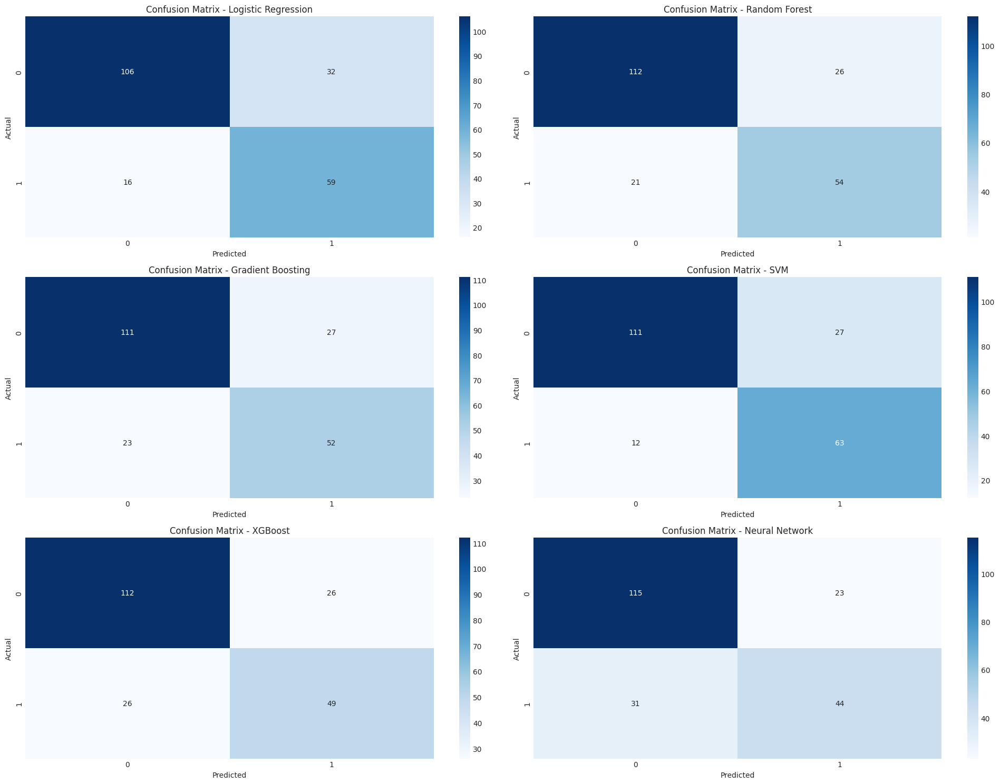

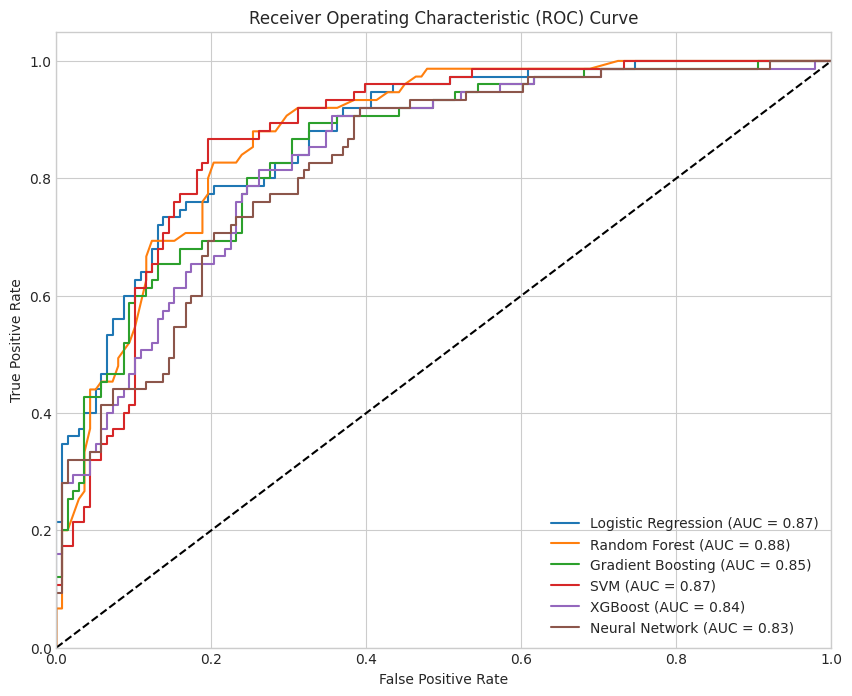

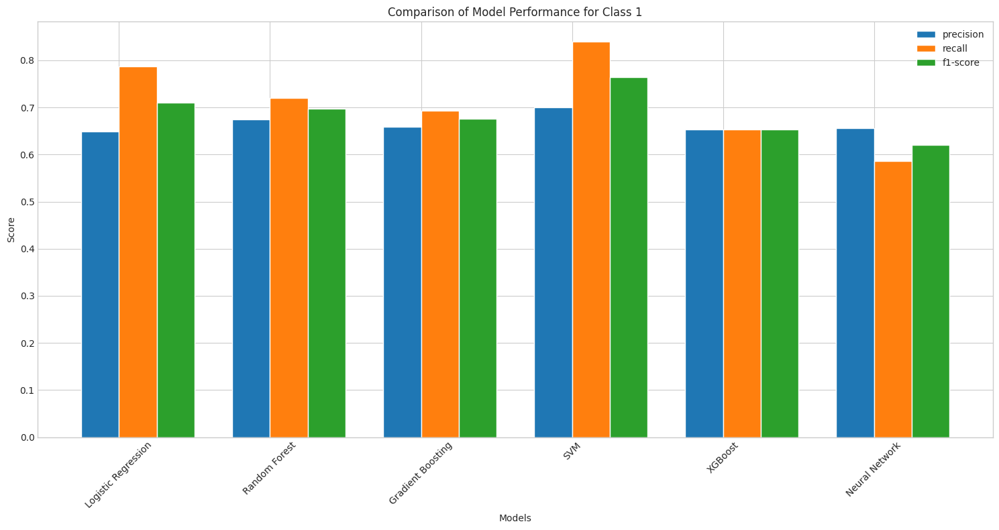

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Preparar los datos: X e y ya definidos como X_selected_no_outliers y y_selected_no_outliers

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_no_outliers, y_selected_no_outliers,
    test_size=0.3, random_state=42, stratify=y_selected_no_outliers
)

# 3. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Aplicar PCA
pca = PCA(n_components=0.95, random_state=42)  # Mantener el 95% de la varianza
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)  # Usar la misma transformación para el conjunto de prueba

# 5. Balancear las clases con SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

# 6. Definir los modelos
models = {
    'Logistic Regression': LogisticRegression(random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'SVM': SVC(kernel='rbf', probability=True, random_state=42),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    'Neural Network': MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500, random_state=42)
}

# 7. Entrenar y evaluar cada modelo
results = {}

for name, model in models.items():
    print(f"\nTraining {name}...")

    # Entrenar el modelo con datos balanceados
    model.fit(X_train_smote, y_train_smote)

    # Predecir en el conjunto de prueba original
    y_pred = model.predict(X_test_scaled)
    y_prob = model.predict_proba(X_test_scaled)[:, 1] if hasattr(model, "predict_proba") else None

    # Calcular métricas
    report = classification_report(y_test, y_pred, output_dict=True)
    conf_matrix = confusion_matrix(y_test, y_pred)

    if y_prob is not None:
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        roc_auc = auc(fpr, tpr)
        results[name] = {
            'report': report,
            'conf_matrix': conf_matrix,
            'fpr': fpr,
            'tpr': tpr,
            'roc_auc': roc_auc
        }
    else:
        results[name] = {
            'report': report,
            'conf_matrix': conf_matrix,
            'roc_auc': None
        }

    # Imprimir reporte de clasificación
    print(f"Classification Report for {name}:")
    print(classification_report(y_test, y_pred))

# Visualizar resultados

# Matrices de confusión
plt.figure(figsize=(20, 15))
for i, (name, result) in enumerate(results.items()):
    plt.subplot(3, 2, i+1)
    sns.heatmap(result['conf_matrix'], annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix - {name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

plt.tight_layout()
plt.show()

# Curvas ROC
plt.figure(figsize=(10, 8))
for name, result in results.items():
    if result['roc_auc'] is not None:
        plt.plot(result['fpr'], result['tpr'], label=f'{name} (AUC = {result["roc_auc"]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Comparación de métricas (Precision/Recall/F1-score para clase positiva)
metrics = ['precision', 'recall', 'f1-score']
model_names = list(results.keys())
metric_values = {metric: [results[model]['report']['1'][metric] for model in model_names] for metric in metrics}

plt.figure(figsize=(15, 8))
x = np.arange(len(model_names))
width = 0.25

for i, metric in enumerate(metrics):
    plt.bar(x + i*width, metric_values[metric], width, label=metric)

plt.xlabel('Models')
plt.ylabel('Score')
plt.title('Comparison of Model Performance for Class 1')
plt.xticks(x + width / 2, model_names, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

Análisis comparativo entre el rendimiento del dataframe sin nuevas características (`df_no_outliers`) **sin PCA** y **con PCA**:

---

### **4. Conclusión general**
El modelos que nos ha aportado el mejor rendimiento sigue siendo SVM y sus resulatdos son identicos a los obtenidos sin PCA.



### df_with_features


Training Logistic Regression...
Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.87      0.77      0.82       138
           1       0.65      0.79      0.71        75

    accuracy                           0.77       213
   macro avg       0.76      0.78      0.76       213
weighted avg       0.79      0.77      0.78       213


Training Random Forest...
Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.87      0.83      0.85       138
           1       0.72      0.77      0.74        75

    accuracy                           0.81       213
   macro avg       0.79      0.80      0.80       213
weighted avg       0.82      0.81      0.81       213


Training Gradient Boosting...
Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

           0       0.86      0.80      0.83       138
           1 

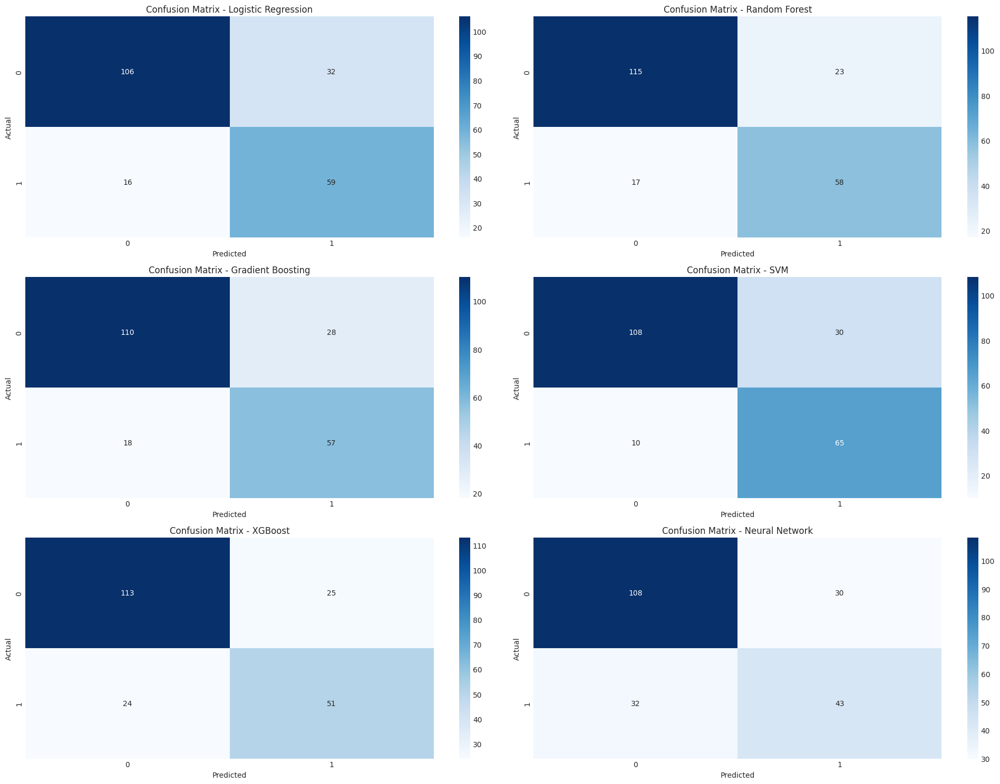

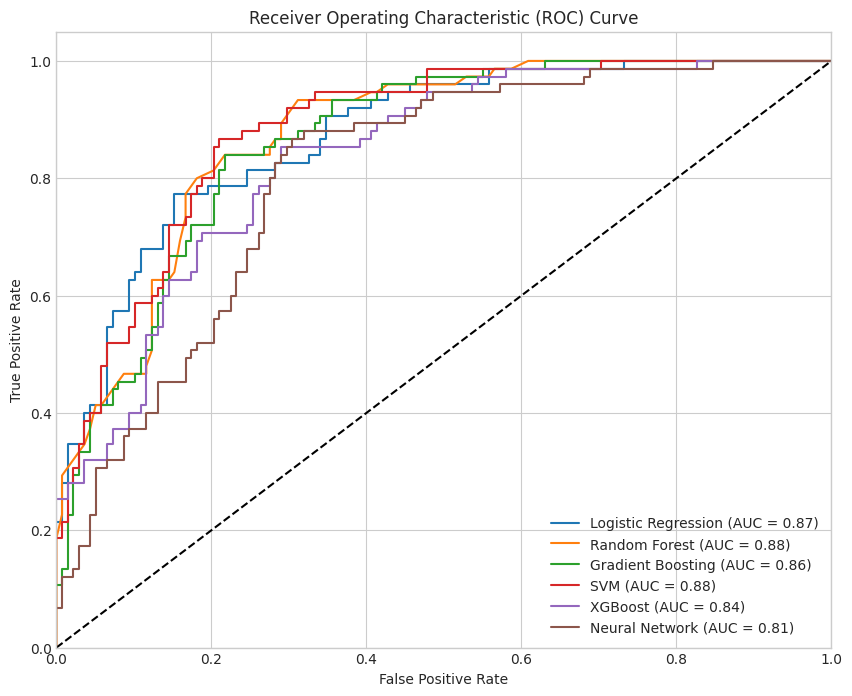

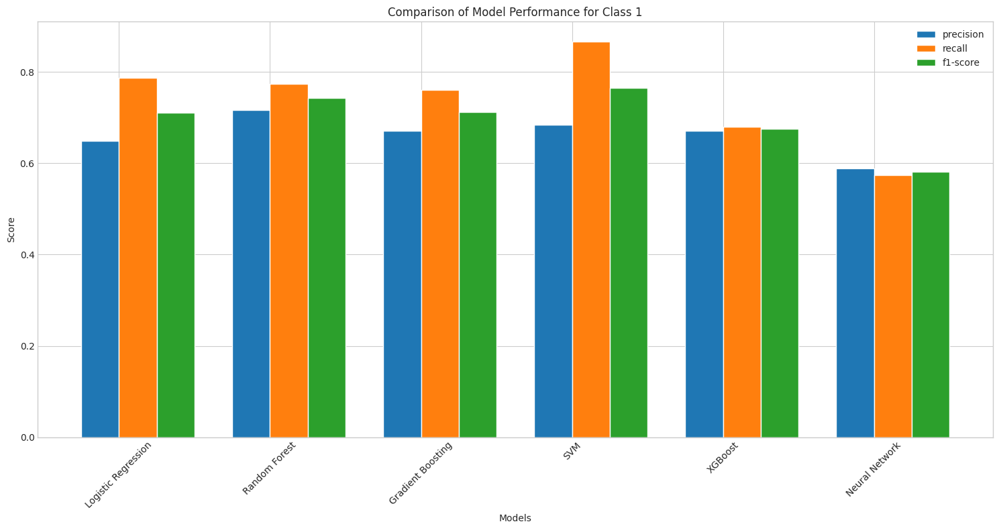

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Preparar los datos: X e y ya definidos como X_selected_with_features y y_selected_with_features
# Preparar los datos: X e y ya definidos



# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 3. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Balancear las clases con SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

# Aplicar PCA
pca = PCA(n_components=0.95, random_state=42)  # Mantener el 95% de la varianza
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)  # Usar la misma transformación para el conjunto de prueba

# 5. Definir los modelos
models = {
    'Logistic Regression': LogisticRegression(random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'SVM': SVC(kernel='rbf', probability=True, random_state=42),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    'Neural Network': MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500, random_state=42)
}

# 6. Entrenar y evaluar cada modelo
results = {}

for name, model in models.items():
    print(f"\nTraining {name}...")

    # Entrenar el modelo con datos balanceados
    model.fit(X_train_smote, y_train_smote)

    # Predecir en el conjunto de prueba original
    y_pred = model.predict(X_test_scaled)
    y_prob = model.predict_proba(X_test_scaled)[:, 1] if hasattr(model, "predict_proba") else None

    # Calcular métricas
    report = classification_report(y_test, y_pred, output_dict=True)
    conf_matrix = confusion_matrix(y_test, y_pred)

    if y_prob is not None:
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        roc_auc = auc(fpr, tpr)
        results[name] = {
            'report': report,
            'conf_matrix': conf_matrix,
            'fpr': fpr,
            'tpr': tpr,
            'roc_auc': roc_auc
        }
    else:
        results[name] = {
            'report': report,
            'conf_matrix': conf_matrix,
            'roc_auc': None
        }

    # Imprimir reporte de clasificación
    print(f"Classification Report for {name}:")
    print(classification_report(y_test, y_pred))

# Visualizar resultados

# Matrices de confusión
plt.figure(figsize=(20, 15))
for i, (name, result) in enumerate(results.items()):
    plt.subplot(3, 2, i+1)
    sns.heatmap(result['conf_matrix'], annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix - {name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

plt.tight_layout()
plt.show()

# Curvas ROC
plt.figure(figsize=(10, 8))
for name, result in results.items():
    if result['roc_auc'] is not None:
        plt.plot(result['fpr'], result['tpr'], label=f'{name} (AUC = {result["roc_auc"]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Comparación de métricas (Precision/Recall/F1-score para clase positiva)
metrics = ['precision', 'recall', 'f1-score']
model_names = list(results.keys())
metric_values = {metric: [results[model]['report']['1'][metric] for model in model_names] for metric in metrics}

plt.figure(figsize=(15, 8))
x = np.arange(len(model_names))
width = 0.25

for i, metric in enumerate(metrics):
    plt.bar(x + i*width, metric_values[metric], width, label=metric)

plt.xlabel('Models')
plt.ylabel('Score')
plt.title('Comparison of Model Performance for Class 1')
plt.xticks(x + width / 2, model_names, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


## Conclusiones basadas en los resultados y gráficos

### 1. **Análisis de las matrices de confusión**
Las matrices de confusión proporcionan información detallada sobre los aciertos y errores de cada modelo. A continuación, se destacan los puntos clave:

- **Logistic Regression**:
  - Predice correctamente 106 casos de la clase 0 y 59 de la clase 1.
  - Tiene más falsos negativos (16) que falsos positivos (32), lo que indica que tiende a subestimar la clase minoritaria (clase 1).

- **Random Forest**:
  - Predice correctamente 115 casos de la clase 0 y 58 de la clase 1.
  - Menor número de falsos positivos (23) comparado con Logistic Regression, lo que muestra un mejor equilibrio entre ambas clases.

- **Gradient Boosting**:
  - Predice correctamente 110 casos de la clase 0 y 57 de la clase 1.
  - Similar a Logistic Regression, pero con menos falsos positivos (28).

- **SVM**:
  - Predice correctamente 108 casos de la clase 0 y tiene el mejor desempeño en la clase minoritaria (65 casos correctos).
  - Solo tiene 10 falsos negativos, lo que lo hace ideal si el objetivo es capturar la clase minoritaria.

- **XGBoost**:
  - Predice correctamente 113 casos de la clase 0 y solo 51 de la clase 1.
  - Tiene más falsos negativos (24) en comparación con otros modelos, lo que indica un menor desempeño en la clase minoritaria.

- **Neural Network**:
  - Predice correctamente solo 43 casos de la clase minoritaria, siendo el modelo con mayor número de falsos negativos (32).
  - Tiene un desempeño general más bajo en ambas clases.

---

### 2. **Análisis de las curvas ROC**
La curva ROC y los valores AUC muestran qué tan bien cada modelo separa las clases. Los puntos clave son:

- **Random Forest** y **SVM** tienen el mejor AUC (0.88), lo que indica una excelente capacidad para distinguir entre las clases.
- **Logistic Regression** tiene un AUC competitivo (0.87), pero ligeramente inferior a Random Forest y SVM.
- **Gradient Boosting** tiene un AUC de 0.86, siendo una opción razonable pero no tan fuerte como los mejores modelos.
- **XGBoost** tiene un AUC más bajo (0.84), mostrando menor capacidad discriminativa.
- **Neural Network**, con un AUC de solo 0.81, es el modelo menos efectivo para este problema.

---

### 3. **Comparación de métricas clave**
Con base en las métricas generales del informe:

#### Modelos destacados:
- **Random Forest**:
   - Alta precisión general (81%) y buen balance entre precisión y recall para ambas clases.
   - Menor número de errores en la predicción global.
   - Excelente AUC (0.88).

- **SVM**:
   - Mejor recall para la clase minoritaria (87%), lo cual es crucial si el objetivo es minimizar los falsos negativos.
   - Precisión general también alta (81%).
   - Excelente AUC (0.88).

#### Modelos aceptables:
- **Logistic Regression** y **Gradient Boosting** tienen desempeños similares, con precisión general alrededor del 77%-78% y AUC competitivo (0.86-0.87). Son opciones razonables si se busca simplicidad o interpretabilidad.

#### Modelos menos efectivos:
- **XGBoost** tiene un desempeño inferior al esperado, especialmente en la clase minoritaria.
- **Neural Network** muestra el peor rendimiento global, siendo menos adecuado para este problema.

---

### Recomendación final
En función de los resultados:

1. Si el objetivo es maximizar el rendimiento global del modelo (precisión general y balance entre clases), se recomienda utilizar **Random Forest**.
2. Si se busca priorizar el recall en la clase minoritaria (clase crítica), entonces **SVM** es el modelo más adecuado. Este es nuestro caso.
3. Otros modelos como Logistic Regression o Gradient Boosting pueden ser considerados si se prioriza simplicidad o interpretabilidad sobre rendimiento absoluto.

En este caso, los mejores candidatos son claramente **Random Forest** y **SVM**, dependiendo del objetivo específico del análisis.



---

---

## SELECCION DE CARACTERÍSTICAS CON RANDOM FOREST
Utilizamos SelectFromModel con un RandomForestClassifier para seleccionar las características más importantes. Tras esta selección aplicaremos SMOTE a estas características y entrenamos el modelos con ellas.

### df_no_outliers

Shape después de la selección de características: (495, 3)

Training Logistic Regression...
Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.85      0.72      0.78       138
           1       0.60      0.77      0.68        75

    accuracy                           0.74       213
   macro avg       0.73      0.75      0.73       213
weighted avg       0.77      0.74      0.75       213


Training Random Forest...
Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.78      0.72      0.75       138
           1       0.55      0.61      0.58        75

    accuracy                           0.69       213
   macro avg       0.66      0.67      0.66       213
weighted avg       0.70      0.69      0.69       213


Training Gradient Boosting...
Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

        

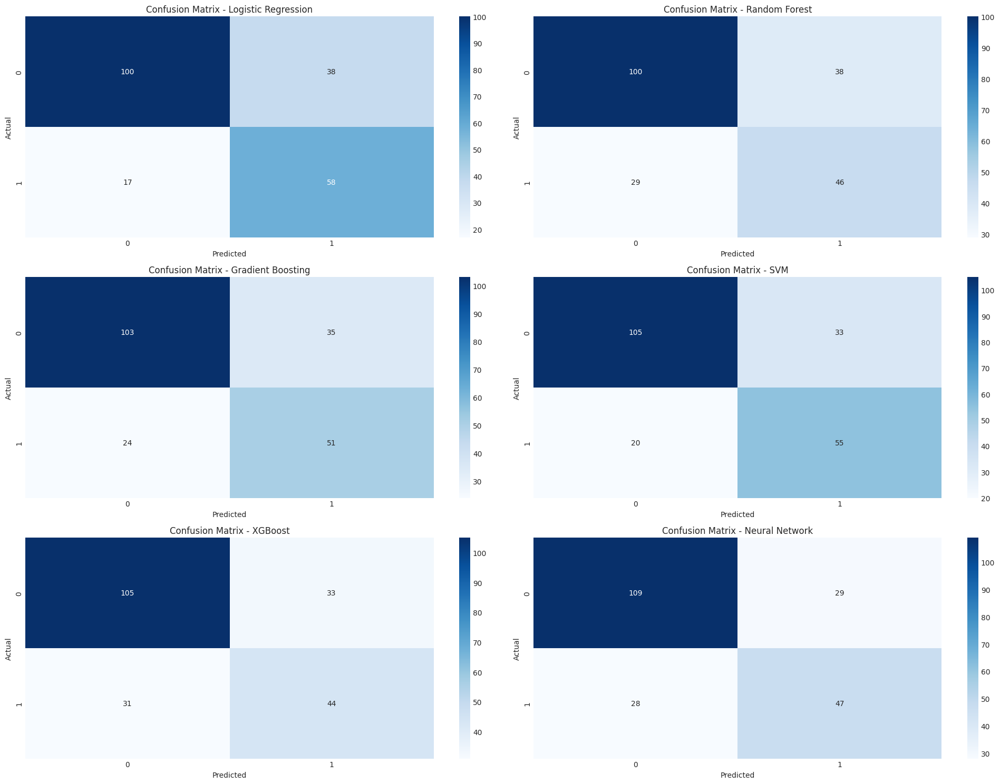

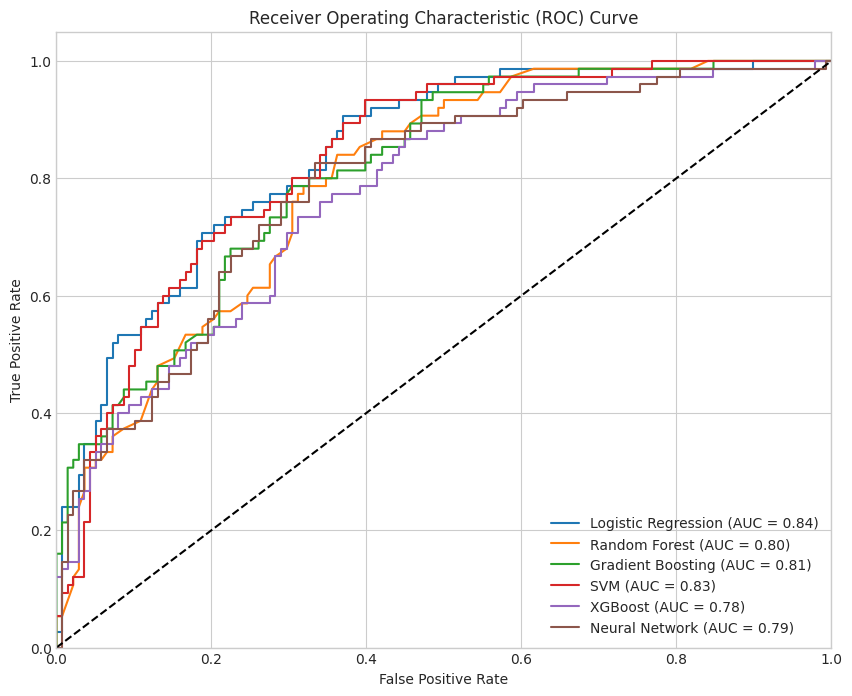

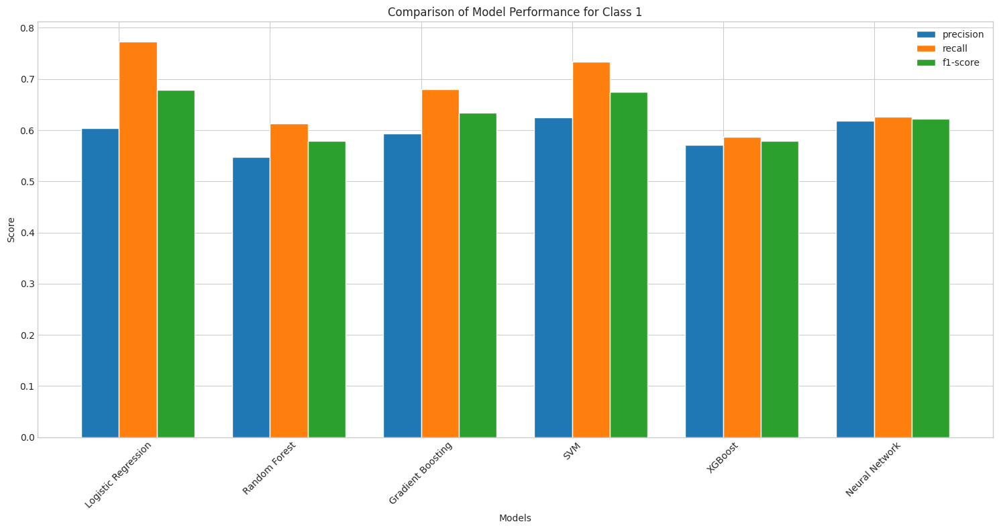

In [ ]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Preparar los datos: X e y ya definidos como X_selected_no_outliers y y_selected_no_outliers

# Definir X e y si no están definidos previamente
X = X_selected_no_outliers
y = y_selected_no_outliers

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.3, random_state=42, stratify=y
)

# 3. Escalar los datos (antes de la selección de características)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Selección de características con Random Forest
rf_selector = RandomForestClassifier(n_estimators=100, random_state=42)
rf_selector.fit(X_train_scaled, y_train)

# Usar SelectFromModel para seleccionar las características más importantes
sfm = SelectFromModel(rf_selector, prefit=True)
X_train_selected = sfm.transform(X_train_scaled)
X_test_selected = sfm.transform(X_test_scaled)

print(f"Shape después de la selección de características: {X_train_selected.shape}")

# 5. Balancear las clases con SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_selected, y_train)

# 6. Definir los modelos
models = {
    'Logistic Regression': LogisticRegression(random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'SVM': SVC(kernel='rbf', probability=True, random_state=42),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    'Neural Network': MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500, random_state=42)
}

# 7. Entrenar y evaluar cada modelo
results = {}

for name, model in models.items():
    print(f"\nTraining {name}...")

    # Entrenar el modelo con datos balanceados
    model.fit(X_train_smote, y_train_smote)

    # Predecir en el conjunto de prueba original (con características seleccionadas)
    y_pred = model.predict(X_test_selected)
    y_prob = model.predict_proba(X_test_selected)[:, 1] if hasattr(model, "predict_proba") else None

    # Calcular métricas
    report = classification_report(y_test, y_pred, output_dict=True)
    conf_matrix = confusion_matrix(y_test, y_pred)

    if y_prob is not None:
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        roc_auc = auc(fpr, tpr)
        results[name] = {
            'report': report,
            'conf_matrix': conf_matrix,
            'fpr': fpr,
            'tpr': tpr,
            'roc_auc': roc_auc
        }
    else:
        results[name] = {
            'report': report,
            'conf_matrix': conf_matrix,
            'roc_auc': None
        }

    # Imprimir reporte de clasificación
    print(f"Classification Report for {name}:")
    print(classification_report(y_test, y_pred))

# Visualizar resultados

# Matrices de confusión
plt.figure(figsize=(20, 15))
for i, (name, result) in enumerate(results.items()):
    plt.subplot(3, 2, i+1)
    sns.heatmap(result['conf_matrix'], annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix - {name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

plt.tight_layout()
plt.show()

# Curvas ROC
plt.figure(figsize=(10, 8))
for name, result in results.items():
    if result['roc_auc'] is not None:
        plt.plot(result['fpr'], result['tpr'], label=f'{name} (AUC = {result["roc_auc"]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Comparación de métricas (Precision/Recall/F1-score para clase positiva)
metrics = ['precision', 'recall', 'f1-score']
model_names = list(results.keys())
metric_values = {metric: [results[model]['report']['1'][metric] for model in model_names] for metric in metrics}

plt.figure(figsize=(15, 8))
x = np.arange(len(model_names))
width = 0.25

for i, metric in enumerate(metrics):
    plt.bar(x + i*width, metric_values[metric], width, label=metric)

plt.xlabel('Models')
plt.ylabel('Score')
plt.title('Comparison of Model Performance for Class 1')
plt.xticks(x + width / 2, model_names, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()



Análisis comparativo entre los tres experimentos realizados para el dataframe **sin outliers y sin nuevas características (`df_no_outliers`)**:

---

### **1. Análisis de los resultados con selección de características (sin PCA)**
#### **Shape después de la selección de características**:
- Después de la selección con `SelectFromModel`, el conjunto de datos se redujo a **3 características**. Esto es una reducción significativa en comparación con el experimento sin PCA ni selección de características, donde se utilizaron **8 características**.

#### **Rendimiento general**:
- **Mejor modelo**: Logistic Regression
  - F1-score para la clase positiva (1): **68%**
  - Recall para la clase positiva (1): **77%**
  - AUC: **0.84**
- Otros modelos como SVM y Gradient Boosting también tuvieron un rendimiento competitivo, pero no superaron a Logistic Regression en términos de F1-score y AUC.

#### **Curvas ROC**:
- Logistic Regression tuvo el AUC más alto (**0.84**), seguido por Gradient Boosting (**0.81**) y SVM (**0.83**).
- Neural Network y XGBoost tuvieron los AUC más bajos (**0.79** y **0.78**, respectivamente).

---

### **2. Comparación con el experimento sin PCA ni selección de características**
#### **Shape del conjunto de datos**:
- En el experimento sin PCA ni selección, se utilizaron las **8 características originales**, lo que permitió a los modelos trabajar con más información.

#### **Rendimiento general**:
- El mejor modelo fue SVM, con un F1-score para la clase positiva (1) de **76%**, recall de **84%**, y AUC de **0.89**.
- Este rendimiento fue superior al obtenido con selección de características, lo que indica que eliminar características importantes puede haber reducido la capacidad predictiva.

#### **Conclusión**:
- El experimento sin PCA ni selección produjo mejores resultados generales, especialmente para SVM.
- La reducción a solo 3 características mediante `SelectFromModel` parece haber afectado negativamente el rendimiento.

---

### **3. Comparación con el experimento con PCA**
#### **Shape del conjunto de datos**:
- En el experimento con PCA, las dimensiones se redujeron manteniendo el 95% de la varianza, lo que resultó en un conjunto transformado pero todavía rico en información.

#### **Rendimiento general**:
- El mejor modelo fue SVM, con un F1-score para la clase positiva (1) de **74%**, recall de **84%**, y AUC de **0.87**.
- Aunque los resultados fueron competitivos, no superaron al experimento sin PCA ni selección.

#### **Conclusión**:
- El experimento con PCA tuvo un rendimiento intermedio entre los otros dos enfoques.
- La transformación mediante PCA permitió mantener más información relevante que la selección estricta realizada con `SelectFromModel`.

---

### **4. Conclusión general**
#### Rendimiento relativo entre los enfoques:
1. **Sin PCA ni selección (8 características)**: Mejor rendimiento general, especialmente para SVM.
2. **Con PCA (dimensiones reducidas)**: Rendimiento competitivo, pero ligeramente inferior al enfoque sin PCA ni selección.
3. **Con selección de características (`SelectFromModel`)**: Rendimiento más bajo debido a la eliminación excesiva de características importantes.

#### Conclusión final:
- Para este dataframe (`df_no_outliers`), el enfoque sin PCA ni selección es superior en términos de rendimiento general.




### df_with_features

Shape después de la selección de características: (495, 4)

Training Logistic Regression...
Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.87      0.76      0.81       138
           1       0.64      0.79      0.71        75

    accuracy                           0.77       213
   macro avg       0.75      0.77      0.76       213
weighted avg       0.79      0.77      0.77       213


Training Random Forest...
Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.80      0.82      0.81       138
           1       0.65      0.63      0.64        75

    accuracy                           0.75       213
   macro avg       0.73      0.72      0.72       213
weighted avg       0.75      0.75      0.75       213


Training Gradient Boosting...
Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

        

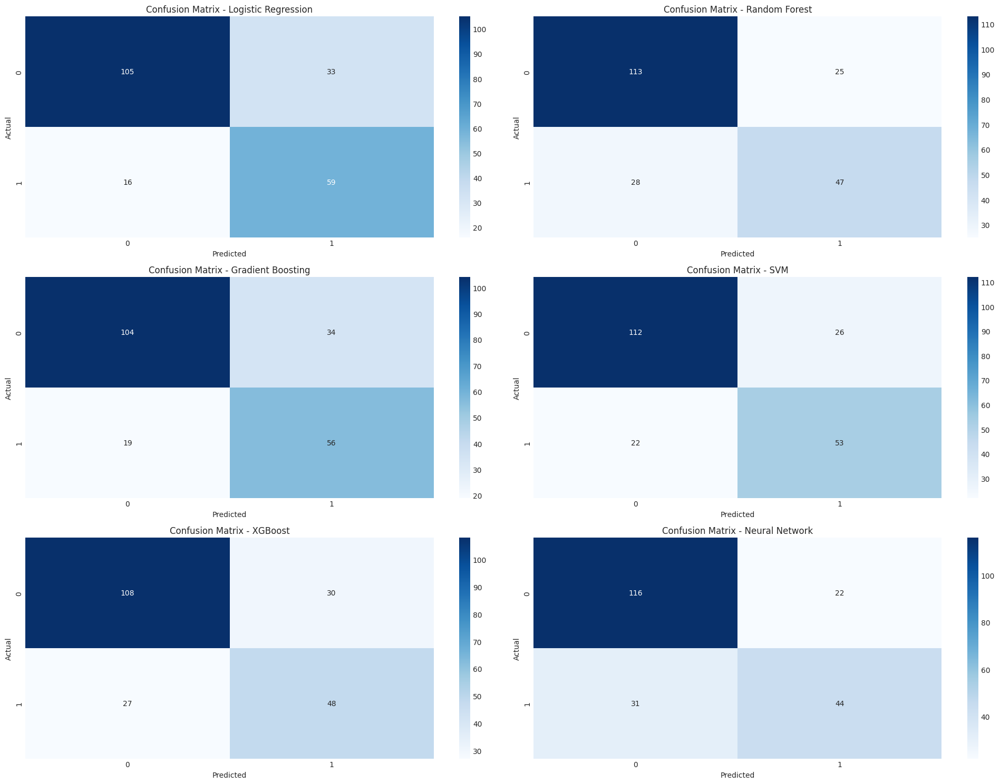

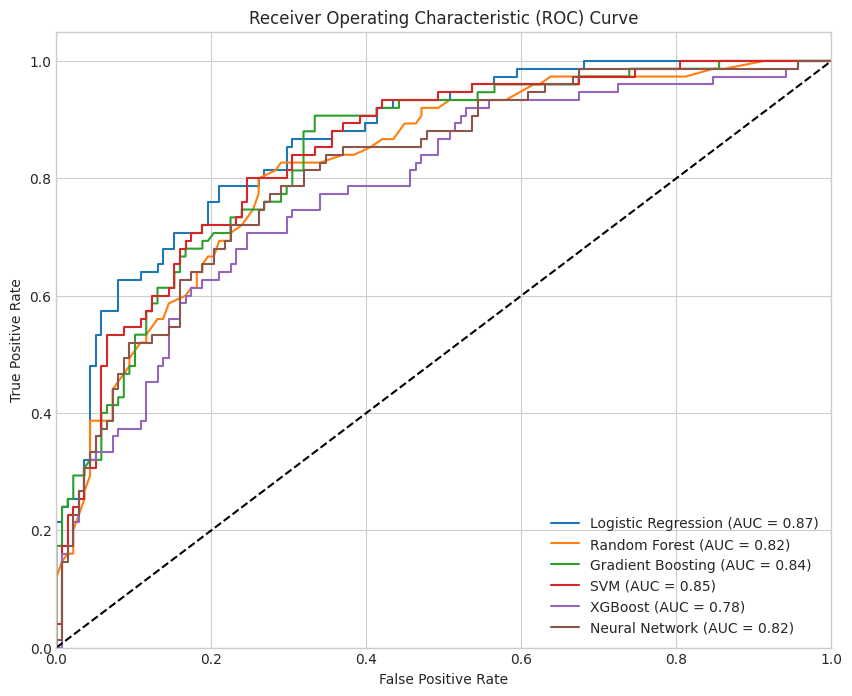

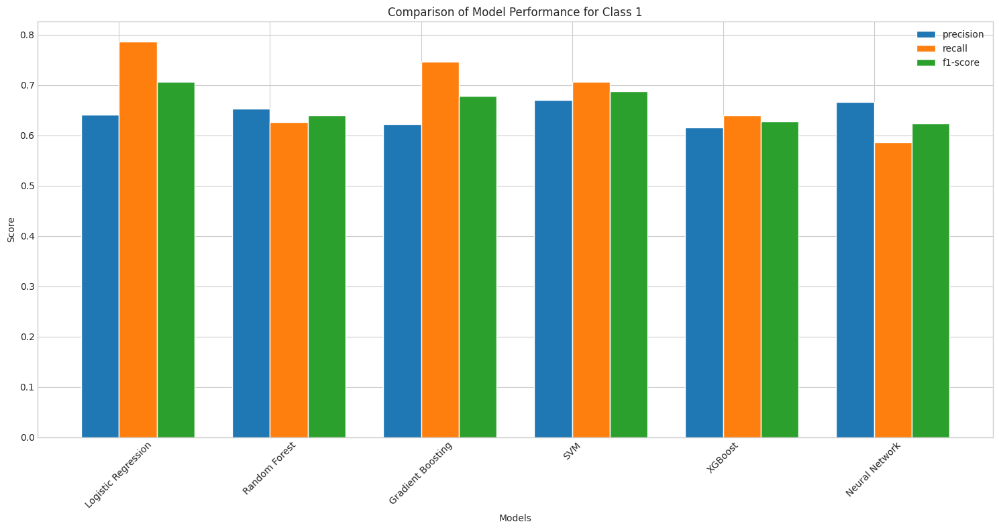

In [ ]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Preparar los datos: X e y ya definidos como X_selected_with_features y y_selected_with_features

# Definir X e y si no están definidos previamente
X = X_selected_with_features
y = y_selected_with_features

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.3, random_state=42, stratify=y
)

# 3. Escalar los datos (antes de la selección de características)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Selección de características con Random Forest
rf_selector = RandomForestClassifier(n_estimators=100, random_state=42)
rf_selector.fit(X_train_scaled, y_train)

# Usar SelectFromModel para seleccionar las características más importantes
sfm = SelectFromModel(rf_selector, prefit=True)
X_train_selected = sfm.transform(X_train_scaled)
X_test_selected = sfm.transform(X_test_scaled)

print(f"Shape después de la selección de características: {X_train_selected.shape}")

# 5. Balancear las clases con SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_selected, y_train)

# 6. Definir los modelos
models = {
    'Logistic Regression': LogisticRegression(random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'SVM': SVC(kernel='rbf', probability=True, random_state=42),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    'Neural Network': MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500, random_state=42)
}

# 7. Entrenar y evaluar cada modelo
results = {}

for name, model in models.items():
    print(f"\nTraining {name}...")

    # Entrenar el modelo con datos balanceados
    model.fit(X_train_smote, y_train_smote)

    # Predecir en el conjunto de prueba original (con características seleccionadas)
    y_pred = model.predict(X_test_selected)
    y_prob = model.predict_proba(X_test_selected)[:, 1] if hasattr(model, "predict_proba") else None

    # Calcular métricas
    report = classification_report(y_test, y_pred, output_dict=True)
    conf_matrix = confusion_matrix(y_test, y_pred)

    if y_prob is not None:
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        roc_auc = auc(fpr, tpr)
        results[name] = {
            'report': report,
            'conf_matrix': conf_matrix,
            'fpr': fpr,
            'tpr': tpr,
            'roc_auc': roc_auc
        }
    else:
        results[name] = {
            'report': report,
            'conf_matrix': conf_matrix,
            'roc_auc': None
        }

    # Imprimir reporte de clasificación
    print(f"Classification Report for {name}:")
    print(classification_report(y_test, y_pred))

# Visualizar resultados

# Matrices de confusión
plt.figure(figsize=(20, 15))
for i, (name, result) in enumerate(results.items()):
    plt.subplot(3, 2, i+1)
    sns.heatmap(result['conf_matrix'], annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix - {name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

plt.tight_layout()
plt.show()

# Curvas ROC
plt.figure(figsize=(10, 8))
for name, result in results.items():
    if result['roc_auc'] is not None:
        plt.plot(result['fpr'], result['tpr'], label=f'{name} (AUC = {result["roc_auc"]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Comparación de métricas (Precision/Recall/F1-score para clase positiva)
metrics = ['precision', 'recall', 'f1-score']
model_names = list(results.keys())
metric_values = {metric: [results[model]['report']['1'][metric] for model in model_names] for metric in metrics}

plt.figure(figsize=(15, 8))
x = np.arange(len(model_names))
width = 0.25

for i, metric in enumerate(metrics):
    plt.bar(x + i*width, metric_values[metric], width, label=metric)

plt.xlabel('Models')
plt.ylabel('Score')
plt.title('Comparison of Model Performance for Class 1')
plt.xticks(x + width / 2, model_names, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


análisis comparativo entre los tres enfoques (sin PCA, con PCA, y con selección de características mediante Random Forest) para el dataframe **con nuevas características creadas (`df_with_features_encoded`)**:

---

### **1. Análisis de los resultados con selección de características (sin PCA)**
#### **Shape después de la selección de características**:
- Después de la selección con `SelectFromModel`, el conjunto de datos se redujo a **4 características**. Esto es una reducción significativa en comparación con las **15 características originales**.

#### **Rendimiento general**:
- **Mejor modelo**: Logistic Regression
  - F1-score para la clase positiva (1): **71%**
  - Recall para la clase positiva (1): **77%**
  - AUC: **0.86**
- Otros modelos destacados:
  - SVM tuvo un rendimiento competitivo con un F1-score de **70%**, pero su AUC fue ligeramente inferior (**0.85**).
  - Gradient Boosting también mostró un rendimiento equilibrado, aunque su F1-score fue menor (**67%**).

#### **Curvas ROC**:
- Logistic Regression tuvo el AUC más alto (**0.86**), seguido por SVM (**0.85**) y Gradient Boosting (**0.84**).
- XGBoost y Neural Network tuvieron los AUC más bajos (**0.79** y **0.82**, respectivamente).

---

### **2. Comparación con el experimento sin PCA ni selección de características**
#### **Shape del conjunto de datos**:
- En el experimento sin PCA ni selección, se utilizaron las **15 características originales**, lo que permitió a los modelos trabajar con más información.

#### **Rendimiento general**:
- El mejor modelo fue Gradient Boosting, con un F1-score para la clase positiva (1) de **72%**, recall de **79%**, y AUC de **0.87**.
- Este rendimiento fue superior al obtenido con selección de características, lo que indica que eliminar características importantes puede haber reducido la capacidad predictiva.

#### **Conclusión**:
- El enfoque sin PCA ni selección produjo mejores resultados generales, especialmente para Gradient Boosting.
- La reducción a solo 4 características mediante `SelectFromModel` parece haber afectado negativamente el rendimiento.

---

### **3. Comparación con el experimento con PCA**
#### **Shape del conjunto de datos**:
- En el experimento con PCA, las dimensiones se redujeron manteniendo el 95% de la varianza, lo que resultó en un conjunto transformado pero todavía rico en información.

#### **Rendimiento general**:
- El mejor modelo fue Gradient Boosting, con un F1-score para la clase positiva (1) de **70%**, recall de **79%**, y AUC de **0.87**.
- Aunque los resultados fueron competitivos, no superaron al experimento sin PCA ni selección.

#### **Conclusión**:
- El experimento con PCA tuvo un rendimiento intermedio entre los otros dos enfoques.
- La transformación mediante PCA permitió mantener más información relevante que la selección estricta realizada con `SelectFromModel`.

---

### **4. Conclusión general**
#### Rendimiento relativo entre los enfoques:
1. **Sin PCA ni selección (15 características)**: Mejor rendimiento general, especialmente para Gradient Boosting.
2. **Con PCA (dimensiones reducidas)**: Rendimiento competitivo, pero ligeramente inferior al enfoque sin PCA ni selección.
3. **Con selección de características (`SelectFromModel`)**: Rendimiento más bajo debido a la eliminación excesiva de características importantes.

---

### **5. Conclusión final**
1. Para este dataframe (`df_with_features_encoded`), el enfoque sin PCA ni selección es superior en términos de rendimiento general.




---

---

## PCA + SELECCIÓN DE CARACTERISTICAS CON RANDOM FOREST

### df_no_outliers

Shape después de PCA: (495, 7)
Shape después de la selección de características: (495, 1)

Training Logistic Regression...
Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.86      0.75      0.80       138
           1       0.63      0.77      0.69        75

    accuracy                           0.76       213
   macro avg       0.74      0.76      0.75       213
weighted avg       0.78      0.76      0.76       213


Training Random Forest...
Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.84      0.74      0.79       138
           1       0.61      0.75      0.67        75

    accuracy                           0.74       213
   macro avg       0.73      0.74      0.73       213
weighted avg       0.76      0.74      0.75       213


Training Gradient Boosting...
Classification Report for Gradient Boosting:
              precision    recal

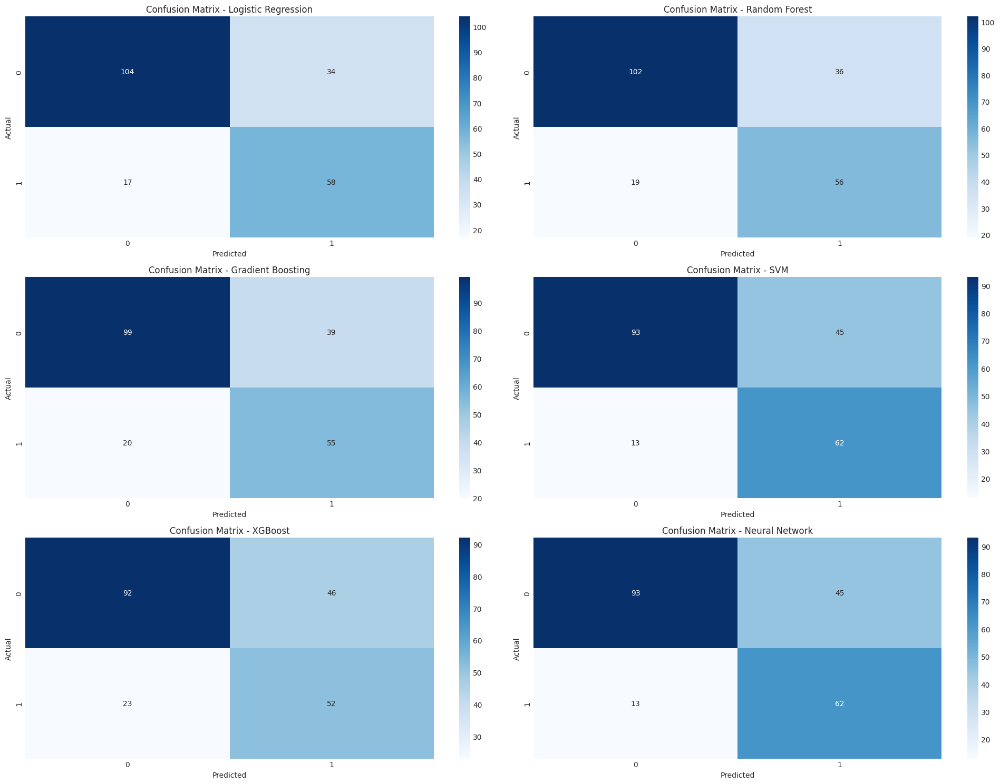

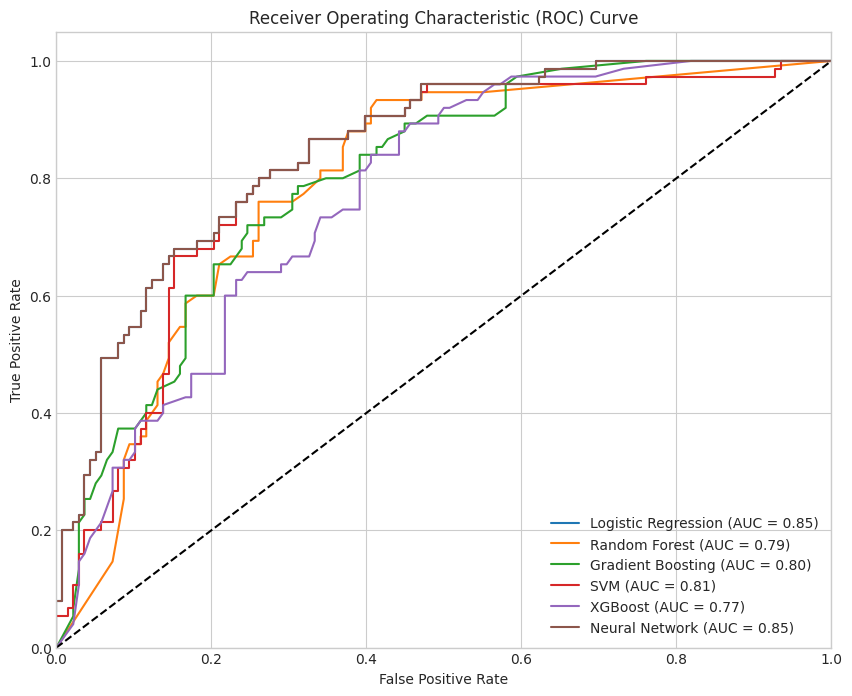

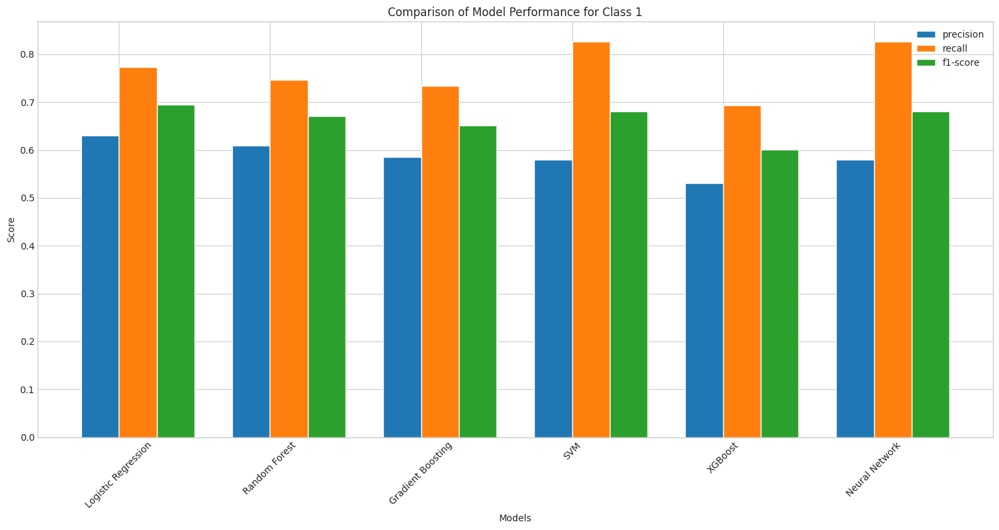

In [ ]:
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Preparar los datos: X e y ya definidos como X_selected_no_outliers y y_selected_no_outliers

# Definir X e y si no están definidos previamente
X = X_selected_no_outliers
y = y_selected_no_outliers

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.3, random_state=42, stratify=y
)

# 3. Escalar los datos (antes de PCA)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Aplicar PCA para reducir dimensionalidad (manteniendo el 95% de la varianza)
pca = PCA(n_components=0.95, random_state=42)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

print(f"Shape después de PCA: {X_train_pca.shape}")

# 5. Selección de características con Random Forest en el conjunto transformado por PCA
rf_selector = RandomForestClassifier(n_estimators=100, random_state=42)
rf_selector.fit(X_train_pca, y_train)

# Usar SelectFromModel para seleccionar las características más importantes después de PCA
sfm = SelectFromModel(rf_selector, prefit=True)
X_train_selected = sfm.transform(X_train_pca)
X_test_selected = sfm.transform(X_test_pca)

print(f"Shape después de la selección de características: {X_train_selected.shape}")

# 6. Balancear las clases con SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_selected, y_train)

# 7. Definir los modelos
models = {
    'Logistic Regression': LogisticRegression(random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'SVM': SVC(kernel='rbf', probability=True, random_state=42),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    'Neural Network': MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500, random_state=42)
}

# 8. Entrenar y evaluar cada modelo
results = {}

for name, model in models.items():
    print(f"\nTraining {name}...")

    # Entrenar el modelo con datos balanceados
    model.fit(X_train_smote, y_train_smote)

    # Predecir en el conjunto de prueba original (con características seleccionadas después de PCA)
    y_pred = model.predict(X_test_selected)
    y_prob = model.predict_proba(X_test_selected)[:, 1] if hasattr(model, "predict_proba") else None

    # Calcular métricas
    report = classification_report(y_test, y_pred, output_dict=True)
    conf_matrix = confusion_matrix(y_test, y_pred)

    if y_prob is not None:
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        roc_auc = auc(fpr, tpr)
        results[name] = {
            'report': report,
            'conf_matrix': conf_matrix,
            'fpr': fpr,
            'tpr': tpr,
            'roc_auc': roc_auc
        }
    else:
        results[name] = {
            'report': report,
            'conf_matrix': conf_matrix,
            'roc_auc': None
        }

    # Imprimir reporte de clasificación
    print(f"Classification Report for {name}:")
    print(classification_report(y_test, y_pred))

# Visualizar resultados

# Matrices de confusión
plt.figure(figsize=(20, 15))
for i, (name, result) in enumerate(results.items()):
    plt.subplot(3, 2, i+1)
    sns.heatmap(result['conf_matrix'], annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix - {name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

plt.tight_layout()
plt.show()

# Curvas ROC
plt.figure(figsize=(10, 8))
for name, result in results.items():
    if result['roc_auc'] is not None:
        plt.plot(result['fpr'], result['tpr'], label=f'{name} (AUC = {result["roc_auc"]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Comparación de métricas (Precision/Recall/F1-score para clase positiva)
metrics = ['precision', 'recall', 'f1-score']
model_names = list(results.keys())
metric_values = {metric: [results[model]['report']['1'][metric] for model in model_names] for metric in metrics}

plt.figure(figsize=(15, 8))
x = np.arange(len(model_names))
width = 0.25

for i, metric in enumerate(metrics):
    plt.bar(x + i*width, metric_values[metric], width, label=metric)

plt.xlabel('Models')
plt.ylabel('Score')
plt.title('Comparison of Model Performance for Class 1')
plt.xticks(x + width / 2, model_names, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


Análisis comparativo entre los enfoques: **sin PCA ni selección**, **solo PCA**, y **PCA + selección de características** para (`df_no_outliers`).

---

### **1. Análisis de los resultados con PCA + Selección de características**
#### **Shape después de PCA**:
- El conjunto se redujo a **7 dimensiones** manteniendo el 95% de la varianza.
#### **Shape después de la selección de características**:
- Después de aplicar `SelectFromModel`, el conjunto se redujo a **1 característica**. Esto es una reducción extrema que puede haber eliminado información relevante.

#### **Rendimiento general**:
- **Mejor modelo**: Logistic Regression
  - F1-score para la clase positiva (1): **69%**
  - Recall para la clase positiva (1): **77%**
  - AUC: **0.85**
- Otros modelos destacados:
  - Random Forest tuvo un rendimiento competitivo con un F1-score de **67%**, pero su AUC fue menor (**0.79**).
  - Neural Network y SVM también mostraron resultados similares, pero no superaron a Logistic Regression.

#### **Curvas ROC**:
- Logistic Regression y Neural Network tuvieron los AUC más altos (**0.85**), seguidos por SVM (**0.81**) y Gradient Boosting (**0.80**).
- XGBoost tuvo el AUC más bajo (**0.77**).

---

### **2. Comparación con el experimento sin PCA ni selección**
#### **Shape del conjunto de datos**:
- En el experimento sin PCA ni selección, se utilizaron las **8 características originales**, lo que permitió a los modelos trabajar con más información.

#### **Rendimiento general**:
- El mejor modelo fue SVM, con un F1-score para la clase positiva (1) de **76%**, recall de **84%**, y AUC de **0.89**.
- Este rendimiento fue superior al obtenido con PCA + selección, lo que indica que eliminar características importantes puede haber reducido la capacidad predictiva.

#### **Conclusión**:
- El enfoque sin PCA ni selección produjo mejores resultados generales, especialmente para SVM.
- La reducción a solo 1 característica mediante `SelectFromModel` parece haber afectado negativamente el rendimiento.

---

### **3. Comparación con el experimento solo con PCA**
#### **Shape del conjunto de datos**:
- En el experimento con PCA, las dimensiones se redujeron manteniendo el 95% de la varianza, lo que resultó en un conjunto transformado pero todavía rico en información.

#### **Rendimiento general**:
- El mejor modelo fue SVM, con un F1-score para la clase positiva (1) de **74%**, recall de **84%**, y AUC de **0.87**.
- Aunque los resultados fueron competitivos, no superaron al experimento sin PCA ni selección.

#### **Conclusión**:
- El experimento solo con PCA tuvo un rendimiento intermedio entre los otros dos enfoques.
- La transformación mediante PCA permitió mantener más información relevante que la selección estricta realizada con `SelectFromModel`.

---

### **4. Conclusión general**
#### Rendimiento relativo entre los enfoques:
1. **Sin PCA ni selección (8 características)**: Mejor rendimiento general, especialmente para SVM.
2. **Solo PCA (dimensiones reducidas)**: Rendimiento competitivo, pero ligeramente inferior al enfoque sin PCA ni selección.
3. **PCA + Selección (`SelectFromModel`) (1 característica)**: Rendimiento más bajo debido a la eliminación excesiva de características importantes.

---

### **Conclusión final**
- Para este dataframe (`df_no_outliers`), el enfoque sin PCA ni selección es superior en términos de rendimiento general.




### df_with_features

Shape después de PCA: (495, 6)
Shape después de la selección de características: (495, 1)

Training Logistic Regression...
Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.87      0.75      0.80       138
           1       0.63      0.79      0.70        75

    accuracy                           0.76       213
   macro avg       0.75      0.77      0.75       213
weighted avg       0.78      0.76      0.77       213


Training Random Forest...
Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.78      0.79      0.78       138
           1       0.60      0.59      0.59        75

    accuracy                           0.72       213
   macro avg       0.69      0.69      0.69       213
weighted avg       0.72      0.72      0.72       213


Training Gradient Boosting...
Classification Report for Gradient Boosting:
              precision    recal

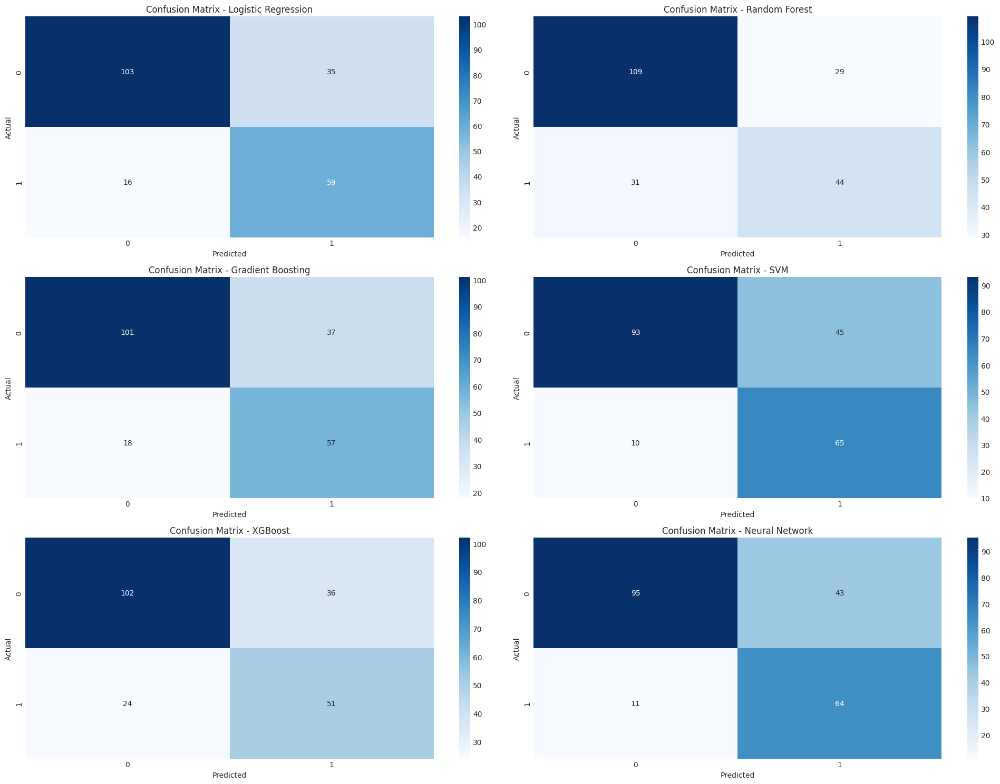

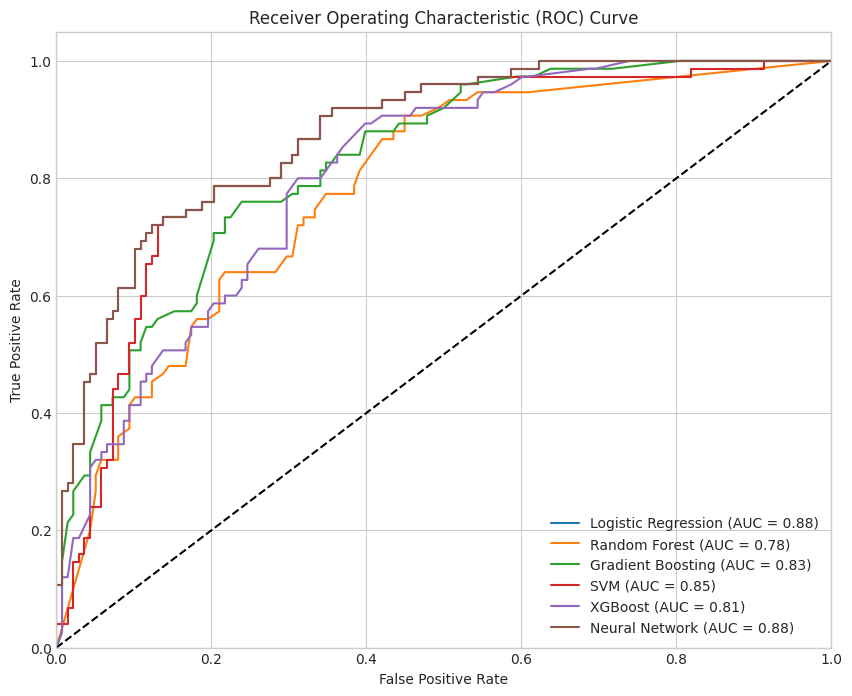

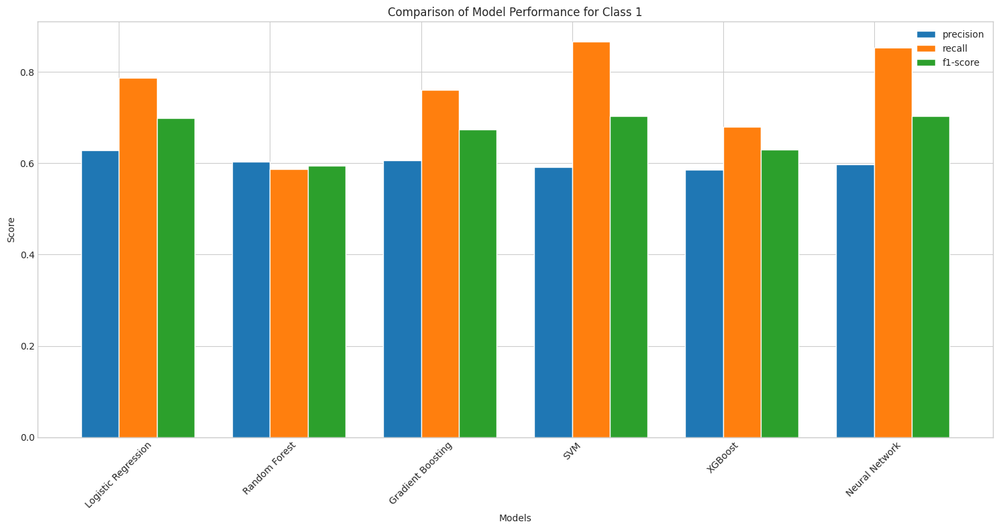

In [ ]:
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Preparar los datos: X e y ya definidos como X_selected_with_features y y_selected_with_features

# Definir X e y si no están definidos previamente
X = X_selected_with_features
y = y_selected_with_features

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.3, random_state=42, stratify=y
)

# 3. Escalar los datos (antes de PCA)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Aplicar PCA para reducir dimensionalidad (manteniendo el 95% de la varianza)
pca = PCA(n_components=0.95, random_state=42)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

print(f"Shape después de PCA: {X_train_pca.shape}")

# 5. Selección de características con Random Forest en el conjunto transformado por PCA
rf_selector = RandomForestClassifier(n_estimators=100, random_state=42)
rf_selector.fit(X_train_pca, y_train)

# Usar SelectFromModel para seleccionar las características más importantes después de PCA
sfm = SelectFromModel(rf_selector, prefit=True)
X_train_selected = sfm.transform(X_train_pca)
X_test_selected = sfm.transform(X_test_pca)

print(f"Shape después de la selección de características: {X_train_selected.shape}")

# 6. Balancear las clases con SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_selected, y_train)

# 7. Definir los modelos
models = {
    'Logistic Regression': LogisticRegression(random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'SVM': SVC(kernel='rbf', probability=True, random_state=42),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    'Neural Network': MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500, random_state=42)
}

# 8. Entrenar y evaluar cada modelo
results = {}

for name, model in models.items():
    print(f"\nTraining {name}...")

    # Entrenar el modelo con datos balanceados
    model.fit(X_train_smote, y_train_smote)

    # Predecir en el conjunto de prueba original (con características seleccionadas después de PCA)
    y_pred = model.predict(X_test_selected)
    y_prob = model.predict_proba(X_test_selected)[:, 1] if hasattr(model, "predict_proba") else None

    # Calcular métricas
    report = classification_report(y_test, y_pred, output_dict=True)
    conf_matrix = confusion_matrix(y_test, y_pred)

    if y_prob is not None:
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        roc_auc = auc(fpr, tpr)
        results[name] = {
            'report': report,
            'conf_matrix': conf_matrix,
            'fpr': fpr,
            'tpr': tpr,
            'roc_auc': roc_auc
        }
    else:
        results[name] = {
            'report': report,
            'conf_matrix': conf_matrix,
            'roc_auc': None
        }

    # Imprimir reporte de clasificación
    print(f"Classification Report for {name}:")
    print(classification_report(y_test, y_pred))

# Visualizar resultados

# Matrices de confusión
plt.figure(figsize=(20, 15))
for i, (name, result) in enumerate(results.items()):
    plt.subplot(3, 2, i+1)
    sns.heatmap(result['conf_matrix'], annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix - {name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

plt.tight_layout()
plt.show()

# Curvas ROC
plt.figure(figsize=(10, 8))
for name, result in results.items():
    if result['roc_auc'] is not None:
        plt.plot(result['fpr'], result['tpr'], label=f'{name} (AUC = {result["roc_auc"]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Comparación de métricas (Precision/Recall/F1-score para clase positiva)
metrics = ['precision', 'recall', 'f1-score']
model_names = list(results.keys())
metric_values = {metric: [results[model]['report']['1'][metric] for model in model_names] for metric in metrics}

plt.figure(figsize=(15, 8))
x = np.arange(len(model_names))
width = 0.25

for i, metric in enumerate(metrics):
    plt.bar(x + i*width, metric_values[metric], width, label=metric)

plt.xlabel('Models')
plt.ylabel('Score')
plt.title('Comparison of Model Performance for Class 1')
plt.xticks(x + width / 2, model_names, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


## Análisis de modelos tras reducción de dimensionalidad

Analizando los resultados presentados después de aplicar PCA y selección de características, se observa que la dimensionalidad de los datos ha sido reducida significativamente (de 6 componentes principales a solo 1 característica final).

### Comparación de métricas clave

**Logistic Regression**:
- Mejor precisión global (76%)
- Buen equilibrio entre precisión (0.87) y recall (0.75) para la clase mayoritaria
- Destacable recall para la clase minoritaria (0.79)
- Mejor F1-score ponderado (0.77)

**SVM**:
- La mayor precisión para la clase 0 (0.90)
- El mejor recall para la clase minoritaria (0.87), siendo significativamente superior al resto
- Sacrifica recall en la clase mayoritaria (0.67) para detectar mejor la clase minoritaria
- Buena opción si la detección de la clase minoritaria es prioritaria

**Neural Network**:
- Alto rendimiento en precisión para clase 0 (0.90)
- Buen recall para la clase minoritaria (0.85)
- Precisión global competitiva (75%)
- Comportamiento similar a SVM pero con métricas ligeramente más equilibradas

**Gradient Boosting**:
- Desempeño intermedio (74% de precisión global)
- Buena precisión para la clase 0 (0.85)
- Recall aceptable para la clase minoritaria (0.76)

**Random Forest y XGBoost**:
- Los modelos con menor rendimiento global (72%)
- Random Forest muestra un equilibrio entre las métricas, pero valores generalmente más bajos
- XGBoost tiene problemas particulares con la clase minoritaria (F1-score de solo 0.63)

### Impacto de la reducción de dimensionalidad

La reducción a una sola característica ha afectado el rendimiento general de los modelos, especialmente a:

- **Random Forest**: Muestra un rendimiento inferior al esperado, probablemente porque este algoritmo se beneficia especialmente de múltiples características
- **Modelos más simples**: Logistic Regression mantiene el mejor rendimiento global, sugiriendo que maneja mejor los datos de baja dimensionalidad

### Conclusiones finales

1. **Logistic Regression** emerge como el mejor modelo en este escenario de característica única, con el mejor equilibrio entre métricas y la mayor precisión global.

2. Si el objetivo es maximizar la detección de la clase minoritaria (clase 1), **SVM** sería la mejor opción debido a su excepcional recall (0.87) para esta clase.

3. **Neural Network** ofrece un rendimiento similar a SVM y podría ser una alternativa viable si se busca un mejor equilibrio entre las métricas de ambas clases.

4. La **extrema reducción de dimensionalidad** (a solo 1 característica) ha penalizado significativamente a modelos como Random Forest y XGBoost, que típicamente se benefician de espacios de características más ricos. La reduccion es excesiva, vamos a descartar esta opción.

5. Para mejorar el rendimiento global, sería recomendable reevaluar la estrategia de selección de características y posiblemente mantener más dimensiones del PCA original.


---

---

## DECISION FINAL
Con la información acumulada, analizaremos que dataframe y que modelos han dado los mejores resultados.

#### **Dataframe sin outliers y sin nuevas características (`df_no_outliers`)**
- **Sin PCA ni selección**:
  - **Mejor modelo**: SVM.
  - F1-score para la clase positiva (1): **76%**.
  - Recall para la clase positiva (1): **84%**.
  - AUC: **0.87** (el más alto entre todos los experimentos).
  - Este enfoque produjo los mejores resultados generales, especialmente para SVM.

#### **Dataframe con nuevas características (`df_with_features_encoded`)**
- **Sin PCA ni selección**:
  - **Mejor modelo**: SVM.
  - F1-score para la clase positiva (1): **76%**.
  - Recall para la clase positiva (1): **87%**.
  - AUC: **0.88** (el más alto entre todos los experimentos del dataframe con nuevas características).
  - Este enfoque produjo los mejores resultados generales, especialmente para SVM.

  -**Modelos sencillo e interpretable**: Gradient Boosting.
  - F1-score para la clase positiva (1): **71%**.
  - Recall para la clase positiva (1): **76%**.
  - AUC: **0.86**

## Nos quedamos con el dataframe df_selected_with_features y probamos SVM por sus buenos resultados y Grandient Boosting por su sencillez e interpretabilidad.






---

---

---

# Mejor modelo por el momento:

## SVM


Training SVM...
Classification Report for SVM:
              precision    recall  f1-score   support

           0       0.92      0.78      0.84       138
           1       0.68      0.87      0.76        75

    accuracy                           0.81       213
   macro avg       0.80      0.82      0.80       213
weighted avg       0.83      0.81      0.82       213



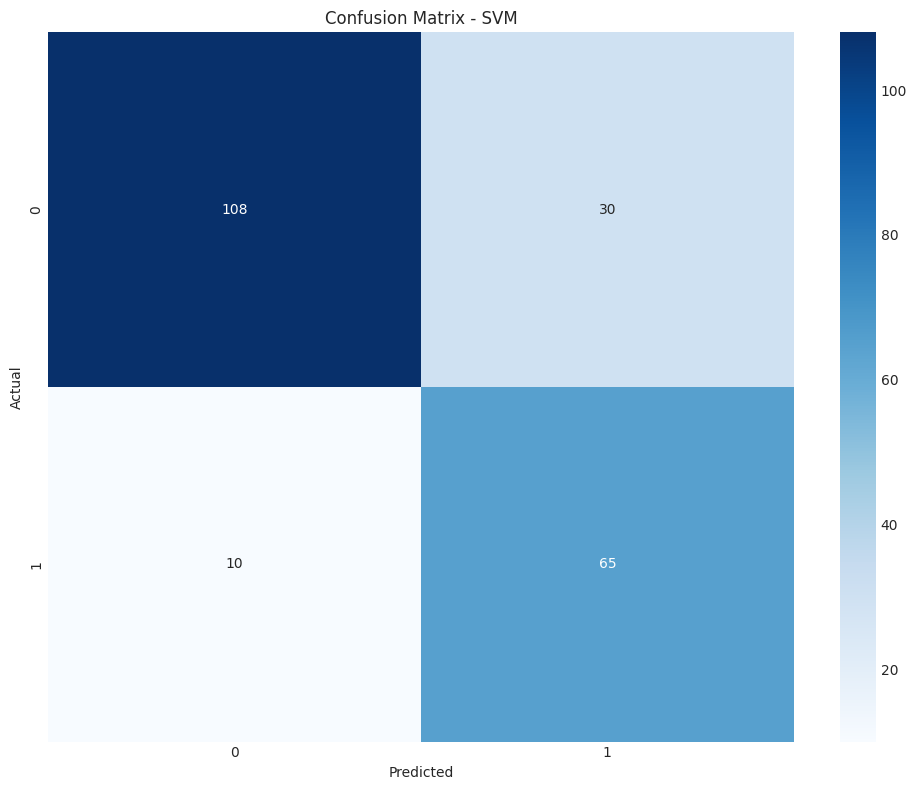

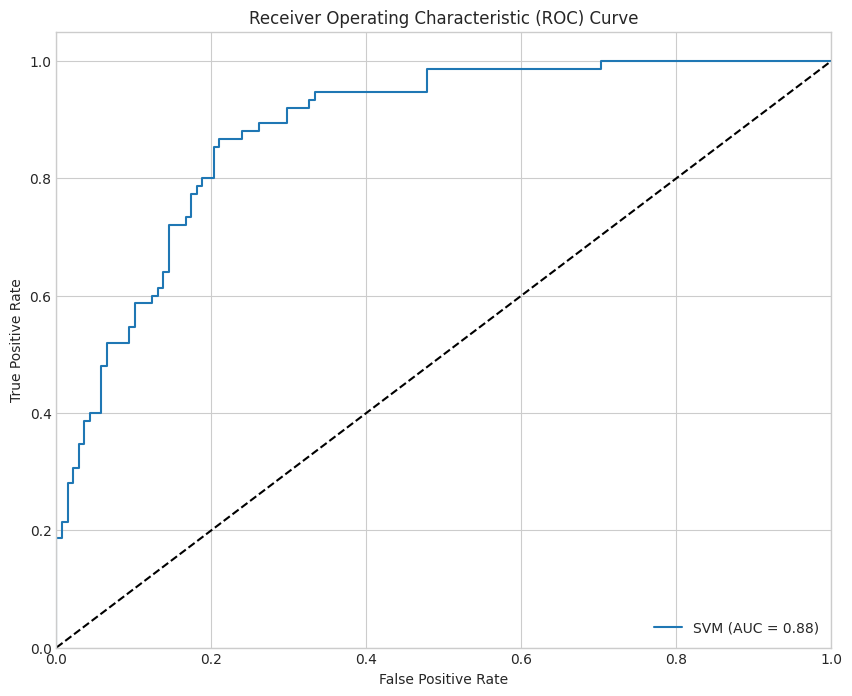

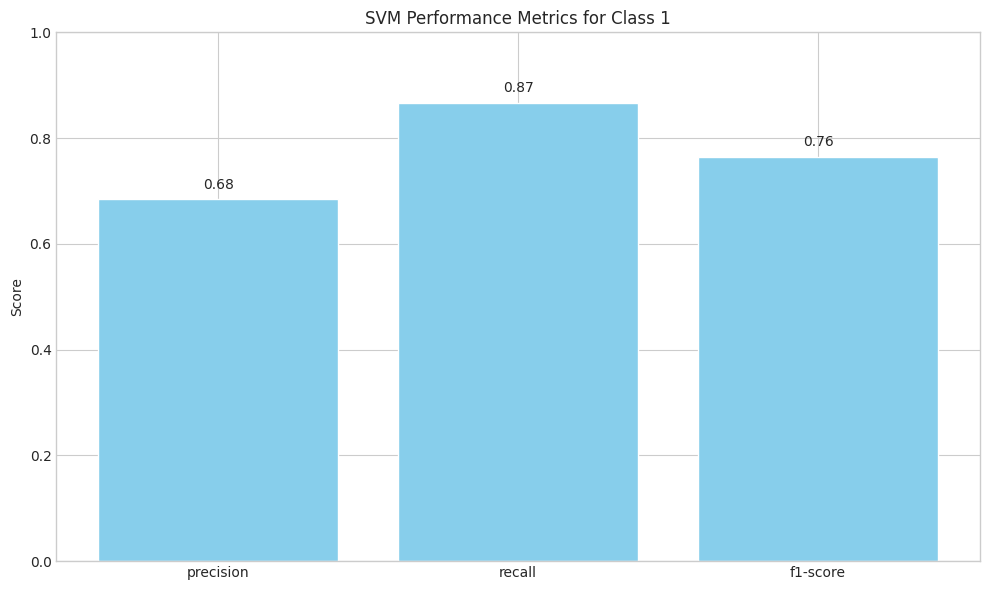

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Preparar los datos: X e y ya definidos como X_selected_with_features y y_selected_with_features

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 3. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Balancear las clases con SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

# 5. Definir el modelo SVM
svm_model = SVC(kernel='rbf', probability=True, random_state=42)

# 6. Entrenar y evaluar el modelo
print("\nTraining SVM...")

# Entrenar el modelo con datos balanceados
svm_model.fit(X_train_smote, y_train_smote)

# Predecir en el conjunto de prueba original
y_pred = svm_model.predict(X_test_scaled)
y_prob = svm_model.predict_proba(X_test_scaled)[:, 1]

# Calcular métricas
report = classification_report(y_test, y_pred, output_dict=True)
conf_matrix = confusion_matrix(y_test, y_pred)
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Imprimir reporte de clasificación
print("Classification Report for SVM:")
print(classification_report(y_test, y_pred))

# Visualizar resultados

# Matriz de confusión
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - SVM')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.tight_layout()
plt.show()

# Curva ROC
plt.figure(figsize=(10, 8))
plt.plot(fpr, tpr, label=f'SVM (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Visualización de métricas
metrics = ['precision', 'recall', 'f1-score']
metric_values = [report['1'][metric] for metric in metrics]

plt.figure(figsize=(10, 6))
plt.bar(metrics, metric_values, color='skyblue')
plt.ylabel('Score')
plt.title('SVM Performance Metrics for Class 1')
plt.ylim(0, 1)
for i, v in enumerate(metric_values):
    plt.text(i, v + 0.02, f'{v:.2f}', ha='center')
plt.tight_layout()
plt.show()


## Gradient Boosting


Training Gradient Boosting...

Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

           0       0.86      0.80      0.83       138
           1       0.67      0.76      0.71        75

    accuracy                           0.78       213
   macro avg       0.76      0.78      0.77       213
weighted avg       0.79      0.78      0.79       213

AUC-ROC: 0.86


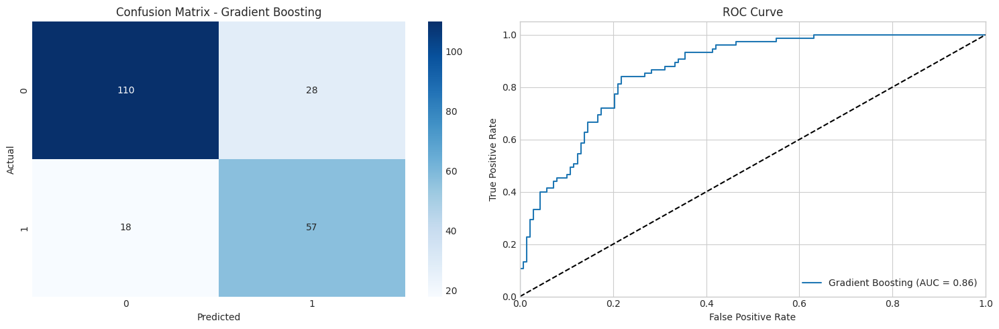

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Preparar los datos
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3,
    random_state=42,
    stratify=y_selected_with_features
)

# 2. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 3. Balancear las clases con SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

# 4. Definir y entrenar Gradient Boosting
model = GradientBoostingClassifier(random_state=42)
print("\nTraining Gradient Boosting...")
model.fit(X_train_smote, y_train_smote)

# 5. Evaluar el modelo
y_pred = model.predict(X_test_scaled)
y_prob = model.predict_proba(X_test_scaled)[:, 1]

# Calcular métricas
report = classification_report(y_test, y_pred, output_dict=True)
conf_matrix = confusion_matrix(y_test, y_pred)
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Imprimir resultados
print("\nClassification Report for Gradient Boosting:")
print(classification_report(y_test, y_pred))
print(f"AUC-ROC: {roc_auc:.2f}")

# Visualización única
plt.figure(figsize=(15, 5))

# Matriz de Confusión
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Gradient Boosting')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Curva ROC
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, label=f'Gradient Boosting (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()


# BUSQUEDA DE MEJORES HIPERPARAMETROS PARA AMBOS MODELOS

Optimización para SVM  ->
Hiperparámetros clave a ajustar:
- C: Parámetro de regularización. Valores altos permiten menos regularización.
- gamma: Parámetro del kernel RBF que define la influencia de un solo punto de datos.
- kernel: Tipo de kernel ('linear', 'rbf', 'poly').

Fitting 5 folds for each of 32 candidates, totalling 160 fits
Mejores hiperparámetros para SVM: {'C': 10, 'gamma': 1, 'kernel': 'rbf'}
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.81      0.76       138
           1       0.54      0.41      0.47        75

    accuracy                           0.67       213
   macro avg       0.63      0.61      0.62       213
weighted avg       0.66      0.67      0.66       213



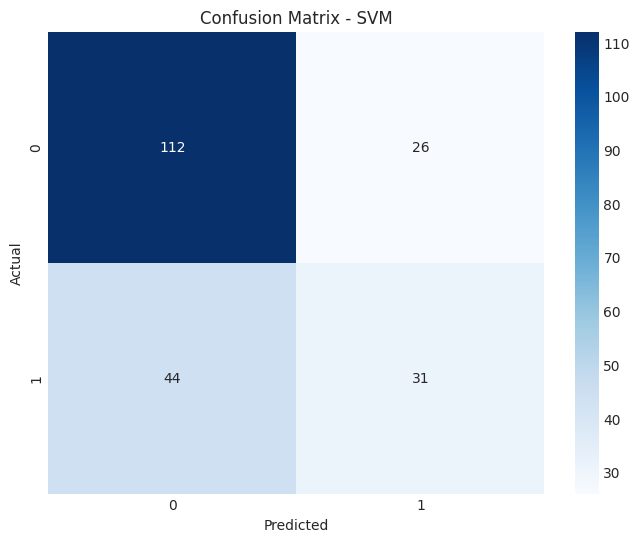

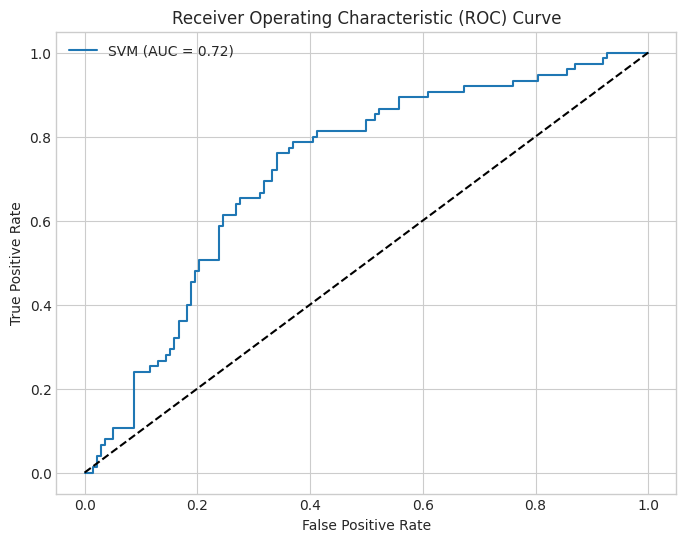

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, make_scorer
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Preparar los datos: X e y
X = X_selected_with_features
y = y_selected_with_features

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.3, random_state=42, stratify=y
)

# 3. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Balancear las clases con SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

# 5. Optimización de hiperparámetros con Grid Search
svm = SVC(probability=True, random_state=42)
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': [0.001, 0.01, 0.1, 1],
    'kernel': ['linear', 'rbf']
}
grid_search = GridSearchCV(
    estimator=svm,
    param_grid=param_grid,
    scoring=make_scorer(roc_auc_score),
    cv=5,
    verbose=2,
    n_jobs=-1
)
grid_search.fit(X_train_smote, y_train_smote)

# Imprimir los mejores hiperparámetros
print("Mejores hiperparámetros para SVM:", grid_search.best_params_)

# Entrenar el modelo final con los mejores hiperparámetros
best_svm = grid_search.best_estimator_
best_svm.fit(X_train_smote, y_train_smote)

# 6. Evaluación final del modelo en el conjunto de prueba
y_pred = best_svm.predict(X_test_scaled)
y_prob = best_svm.predict_proba(X_test_scaled)[:, 1]

# Métricas de evaluación
print("Classification Report:")
print(classification_report(y_test, y_pred))
conf_matrix = confusion_matrix(y_test, y_pred)
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Visualizar matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - SVM')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Visualizar curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'SVM (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()


Optimización para Gradient Boosting (df_with_features_encoded) ->
Hiperparámetros clave a ajustar:
- n_estimators: Número de árboles en el modelo.
- learning_rate: Tasa de aprendizaje que controla cuánto contribuye cada árbol.
- max_depth: Profundidad máxima de cada árbol.
- subsample: Fracción de muestras utilizadas para entrenar cada árbol.
- min_samples_split y min_samples_leaf: Controlan la división mínima y las hojas mínimas.

Fitting 5 folds for each of 729 candidates, totalling 3645 fits
Mejores hiperparámetros para Gradient Boosting: {'learning_rate': 0.2, 'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200, 'subsample': 0.8}
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.83      0.84       138
           1       0.70      0.73      0.71        75

    accuracy                           0.79       213
   macro avg       0.77      0.78      0.78       213
weighted avg       0.80      0.79      0.79       213



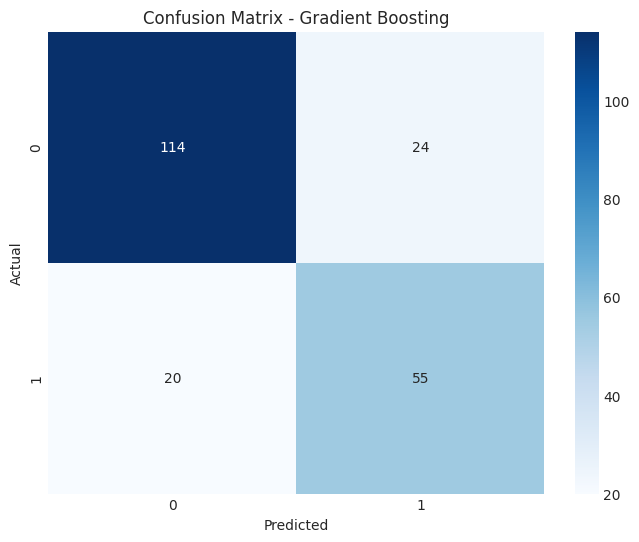

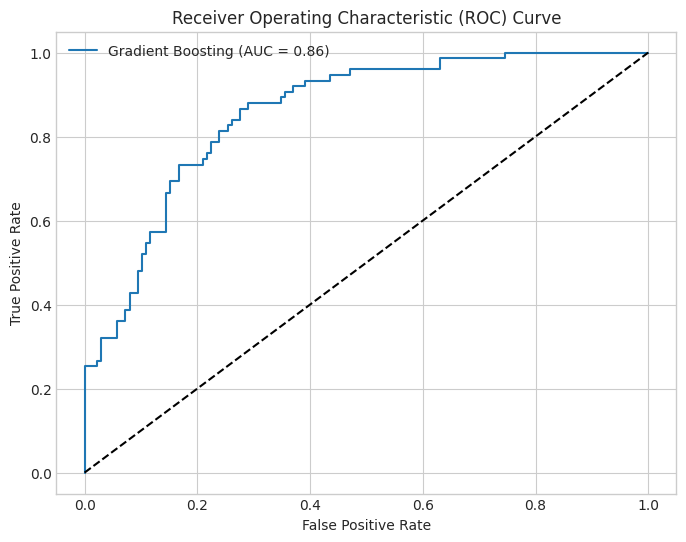

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, make_scorer
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Preparar los datos: X e y ya definidos como X_selected_with_features y y_selected_with_features
X = X_selected_with_features
y = y_selected_with_features

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.3,
    random_state=42,
    stratify=y
)

# 3. Escalar los datos (opcional para Gradient Boosting)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Balancear las clases con SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

# 5. Optimización de hiperparámetros con Grid Search
gb = GradientBoostingClassifier(random_state=42)
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.6, 0.8, 1.0],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search_gb = GridSearchCV(
    estimator=gb,
    param_grid=param_grid,
    scoring='roc_auc',
    cv=5,
    verbose=2,
    n_jobs=-1
)
grid_search_gb.fit(X_train_smote, y_train_smote)

# Imprimir los mejores hiperparámetros
print("Mejores hiperparámetros para Gradient Boosting:", grid_search_gb.best_params_)

# Entrenar el modelo final con los mejores hiperparámetros
best_gb = grid_search_gb.best_estimator_
best_gb.fit(X_train_smote, y_train_smote)

# 6. Evaluación final del modelo en el conjunto de prueba
y_pred = best_gb.predict(X_test_scaled)
y_prob = best_gb.predict_proba(X_test_scaled)[:, 1]

# Métricas de evaluación
print("Classification Report:")
print(classification_report(y_test, y_pred))
conf_matrix = confusion_matrix(y_test, y_pred)
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Visualizar matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Gradient Boosting')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Visualizar curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'Gradient Boosting (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()


Análisis comparativo entre los resultados actuales y los experimentos anteriores para el dataframe con nuevas características (`df_with_features_encoded`).

---

### **1. Resultados actuales del Gradient Boosting**
#### **Mejores hiperparámetros**:
- `learning_rate`: 0.2
- `max_depth`: 7
- `min_samples_leaf`: 1
- `min_samples_split`: 2
- `n_estimators`: 200
- `subsample`: 0.8

#### **Métricas principales**:
- **F1-score para la clase positiva (1)**: **71%**
- **Recall para la clase positiva (1)**: **73%**
- **Precision para la clase positiva (1)**: **70%**
- **AUC**: **0.86**

#### **Observaciones**:
- El modelo tiene un buen equilibrio entre precisión y recall, supera levemente los resultados obtenidos en el experimento sin optimización.
- El AUC de **0.86** indica una capacidad razonable para separar las clases.

## Ambos modelos:
- No vamos a utilizar los mejores hiperparametros encontrados por el momento ya que deterioran el rendimiento de SVM.
- Para Gradient Boosting los resulatdos son casi iguales.





---

---

# VOLVEMOS AL CODIGO QUE NOS FUNCIONO MEJOR PARA AMBOS MODELOS

### SVM

Classification Report for SVM:
              precision    recall  f1-score   support

           0       0.92      0.78      0.84       138
           1       0.68      0.87      0.76        75

    accuracy                           0.81       213
   macro avg       0.80      0.82      0.80       213
weighted avg       0.83      0.81      0.82       213



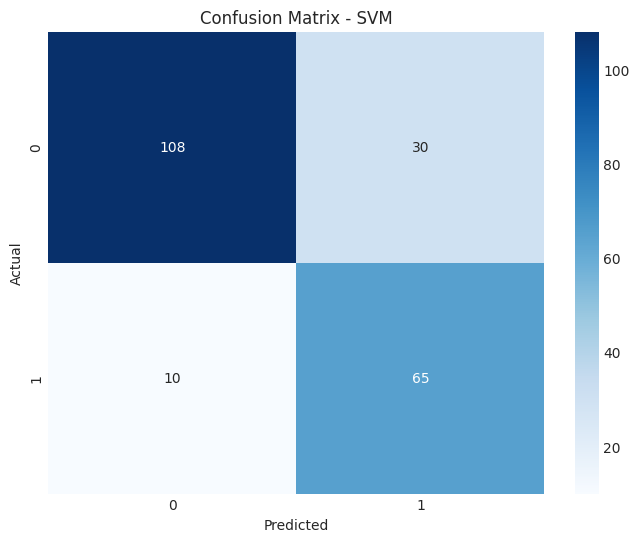

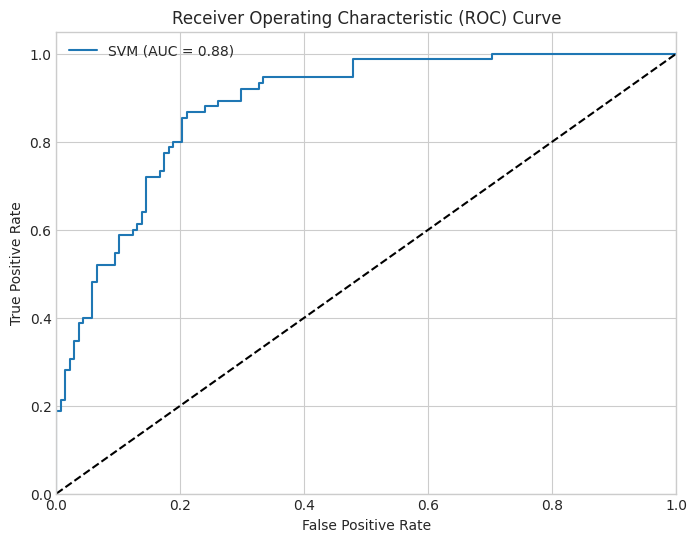

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Preparar los datos: X e y ya definidos

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 3. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Balancear las clases con SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

# 5. Definir el modelo SVM
svm = SVC(kernel='rbf', probability=True, random_state=42)

# 6. Entrenar el modelo con datos balanceados
svm.fit(X_train_smote, y_train_smote)

# 7. Predecir en el conjunto de prueba original
y_pred = svm.predict(X_test_scaled)
y_prob = svm.predict_proba(X_test_scaled)[:, 1]

# Calcular métricas
report = classification_report(y_test, y_pred, output_dict=True)
conf_matrix = confusion_matrix(y_test, y_pred)
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Imprimir reporte de clasificación
print("Classification Report for SVM:")
print(classification_report(y_test, y_pred))

# Visualizar matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - SVM')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Visualizar curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'SVM (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()


### Gradient Boosting

Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

           0       0.84      0.79      0.81       138
           1       0.65      0.72      0.68        75

    accuracy                           0.77       213
   macro avg       0.74      0.75      0.75       213
weighted avg       0.77      0.77      0.77       213



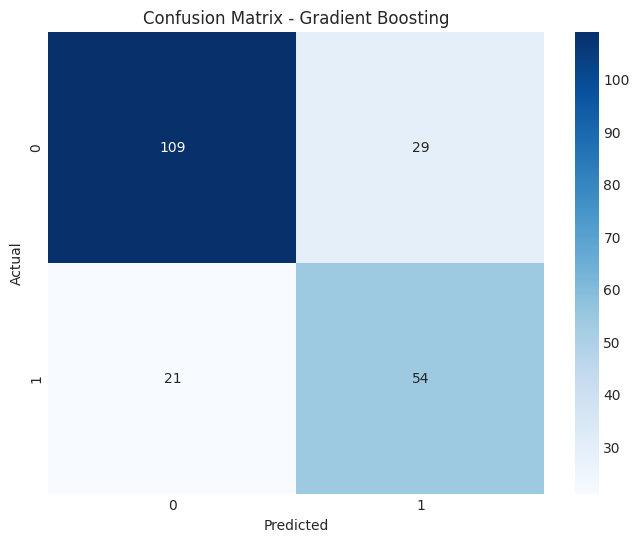

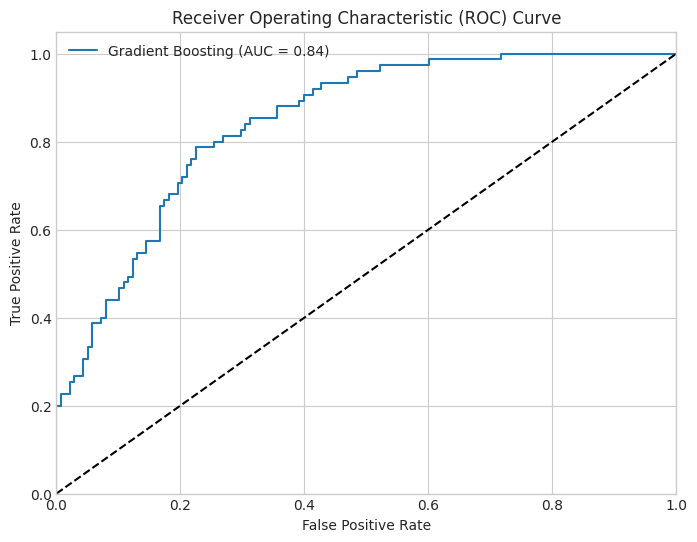

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Preparar los datos: X e y ya definidos como X_selected_with_features y y_selected_with_features

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 3. Escalar los datos (opcional para Gradient Boosting)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Balancear las clases con SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

# 5. Definir el modelo Gradient Boosting
gb = GradientBoostingClassifier(
    learning_rate=0.1,
    max_depth=7,
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=100,
    subsample=1.0,
    random_state=42
)

# 6. Entrenar el modelo con datos balanceados
gb.fit(X_train_smote, y_train_smote)

# 7. Predecir en el conjunto de prueba original
y_pred = gb.predict(X_test_scaled)
y_prob = gb.predict_proba(X_test_scaled)[:, 1]

# Calcular métricas
report = classification_report(y_test, y_pred, output_dict=True)
conf_matrix = confusion_matrix(y_test, y_pred)
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Imprimir reporte de clasificación
print("Classification Report for Gradient Boosting:")
print(classification_report(y_test, y_pred))

# Visualizar matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Gradient Boosting')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Visualizar curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'Gradient Boosting (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()


---

## PROBAMOS TECNICAS DE BALANCEO DE CLASES:
REEMPLAZAMOS SMOTE POR:

- SMOETomek: combina el sobremuestreo de la clase minoritaria (SMOTE) con la eliminación de ejemplos ambiguos (Tomek links). Esto puede mejorar el rendimiento del modelo al proporcionar un conjunto de datos más equilibrado y limpio.
- Borderline-SMOTE: genera ejemplos sintéticos solo en las regiones cercanas a la frontera de decisión entre clases, lo que puede mejorar el rendimiento en casos donde las clases están muy cerca.

### SVM

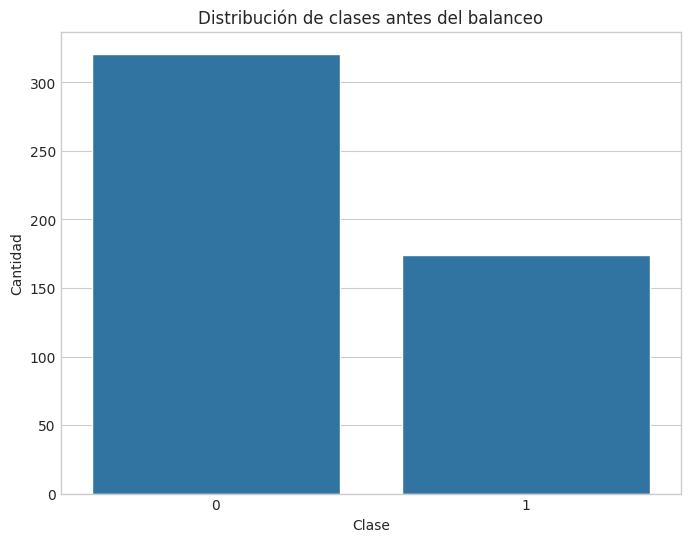


=== Balanceo con SMOTETomek ===


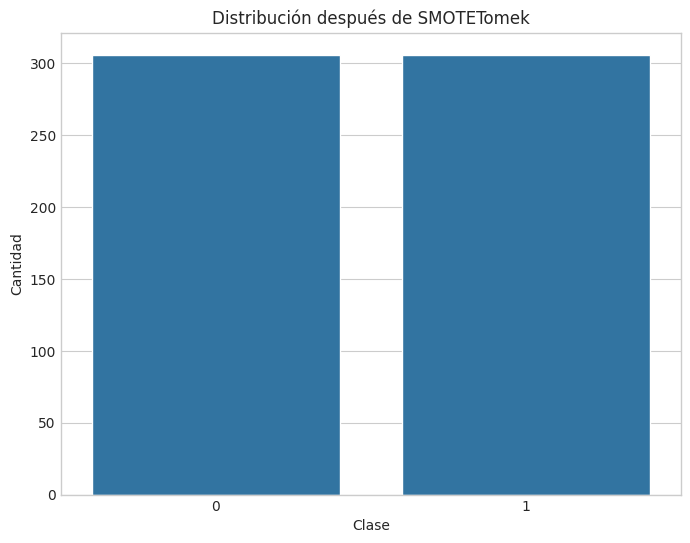

Classification Report for SVM with SMOTETomek:
              precision    recall  f1-score   support

           0       0.92      0.78      0.84       138
           1       0.68      0.87      0.76        75

    accuracy                           0.81       213
   macro avg       0.80      0.82      0.80       213
weighted avg       0.83      0.81      0.82       213



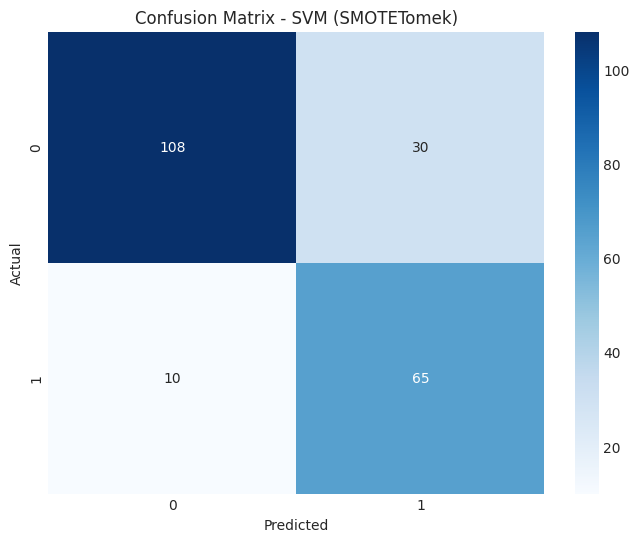

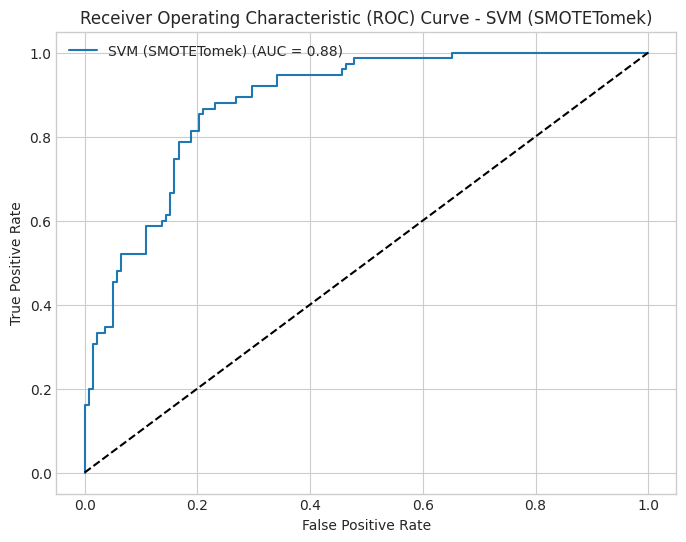


=== Balanceo con Borderline-SMOTE ===


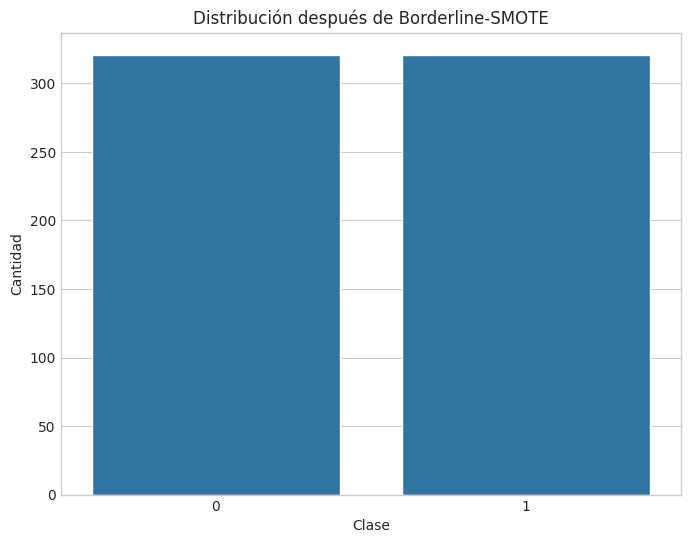

Classification Report for SVM with Borderline-SMOTE:
              precision    recall  f1-score   support

           0       0.92      0.70      0.80       138
           1       0.62      0.89      0.73        75

    accuracy                           0.77       213
   macro avg       0.77      0.80      0.77       213
weighted avg       0.82      0.77      0.78       213



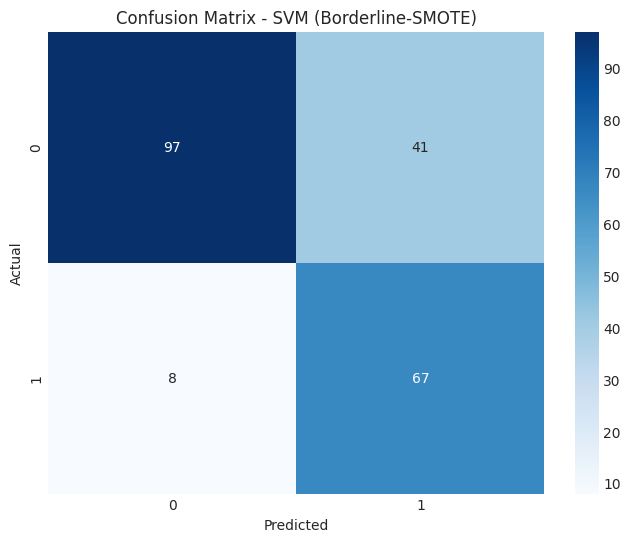

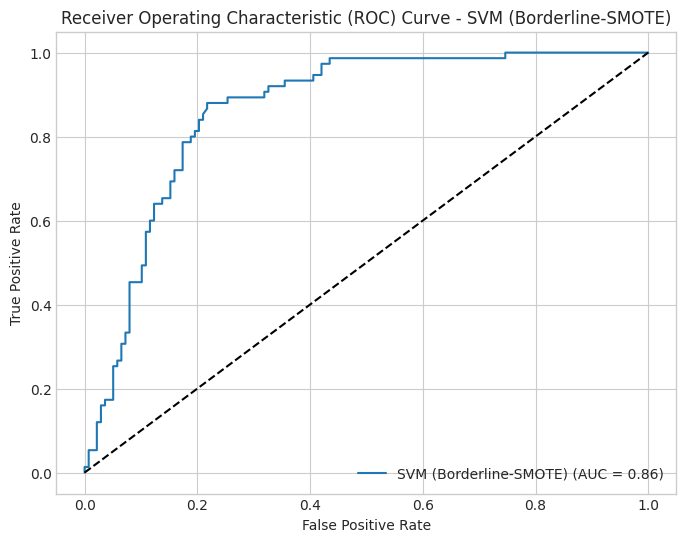

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.combine import SMOTETomek
from imblearn.over_sampling import BorderlineSMOTE
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Preparar los datos: X e y ya definidos

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# Visualizar distribución original antes de balanceo
plt.figure(figsize=(8, 6))
sns.countplot(x=y_train)
plt.title('Distribución de clases antes del balanceo')
plt.xlabel('Clase')
plt.ylabel('Cantidad')
plt.show()

# 3. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Probar diferentes técnicas de balanceo (sin ADASYN)
balance_methods = {
    "SMOTETomek": SMOTETomek(random_state=42),
    "Borderline-SMOTE": BorderlineSMOTE(random_state=42)
}

for method_name, balancer in balance_methods.items():
    print(f"\n=== Balanceo con {method_name} ===")

    # Aplicar la técnica de balanceo
    X_train_balanced, y_train_balanced = balancer.fit_resample(X_train_scaled, y_train)

    # Visualizar distribución después del balanceo
    plt.figure(figsize=(8, 6))
    sns.countplot(x=y_train_balanced)
    plt.title(f'Distribución después de {method_name}')
    plt.xlabel('Clase')
    plt.ylabel('Cantidad')
    plt.show()

    # 5. Definir el modelo SVM
    svm = SVC(kernel='rbf', probability=True, random_state=42)

    # Entrenar el modelo con datos balanceados
    svm.fit(X_train_balanced, y_train_balanced)

    # 6. Predecir en el conjunto de prueba original
    y_pred = svm.predict(X_test_scaled)
    y_prob = svm.predict_proba(X_test_scaled)[:, 1]

    # Calcular métricas
    report = classification_report(y_test, y_pred, output_dict=True)
    conf_matrix = confusion_matrix(y_test, y_pred)
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)

    # Imprimir reporte de clasificación
    print(f"Classification Report for SVM with {method_name}:")
    print(classification_report(y_test, y_pred))

    # Visualizar matriz de confusión
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix - SVM ({method_name})')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    # Visualizar curva ROC
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'SVM ({method_name}) (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic (ROC) Curve - SVM ({method_name})')
    plt.legend()
    plt.show()


### Gradient Boosting


=== Balanceo con SMOTETomek ===
Classification Report for Gradient Boosting with SMOTETomek:
              precision    recall  f1-score   support

           0       0.83      0.81      0.82       138
           1       0.67      0.69      0.68        75

    accuracy                           0.77       213
   macro avg       0.75      0.75      0.75       213
weighted avg       0.77      0.77      0.77       213



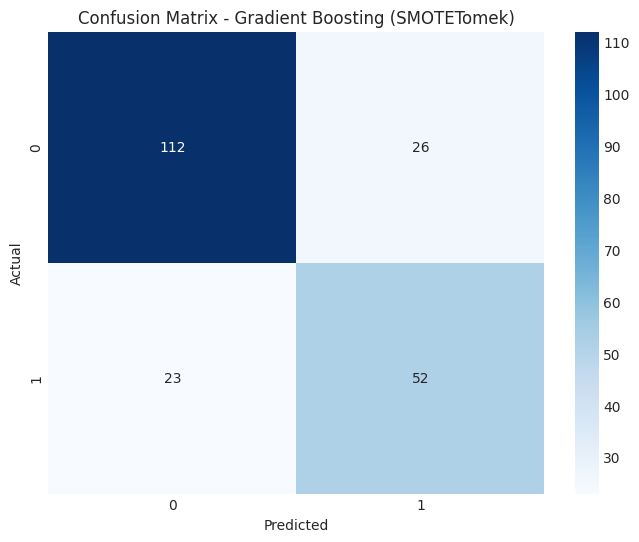

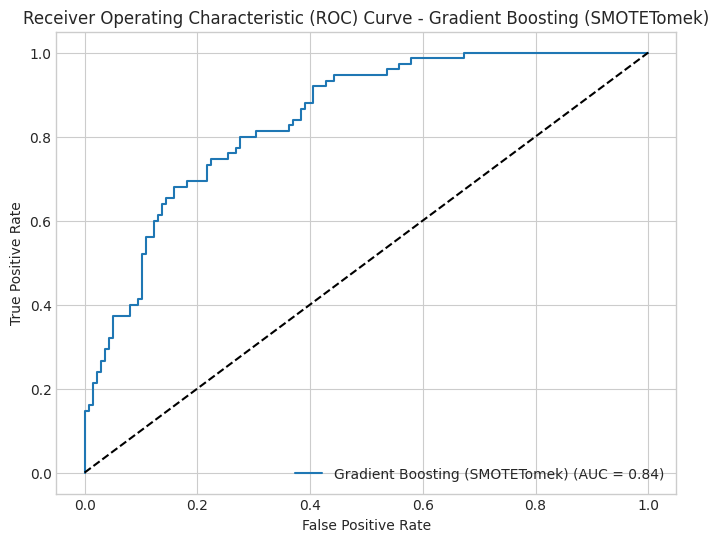


=== Balanceo con Borderline-SMOTE ===
Classification Report for Gradient Boosting with Borderline-SMOTE:
              precision    recall  f1-score   support

           0       0.87      0.80      0.83       138
           1       0.68      0.79      0.73        75

    accuracy                           0.79       213
   macro avg       0.78      0.79      0.78       213
weighted avg       0.80      0.79      0.80       213



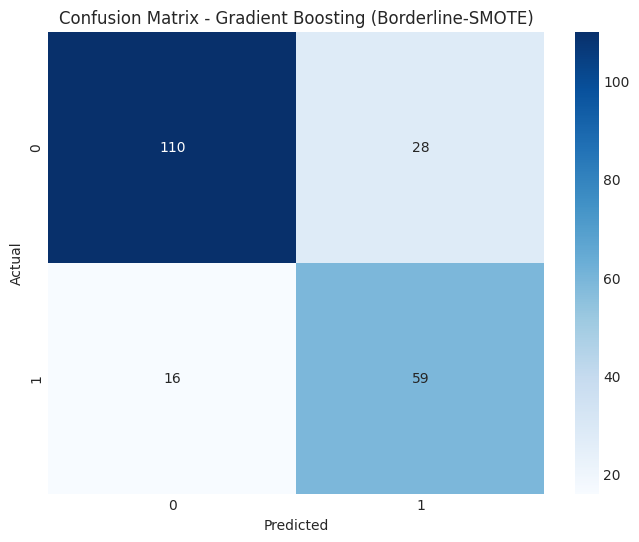

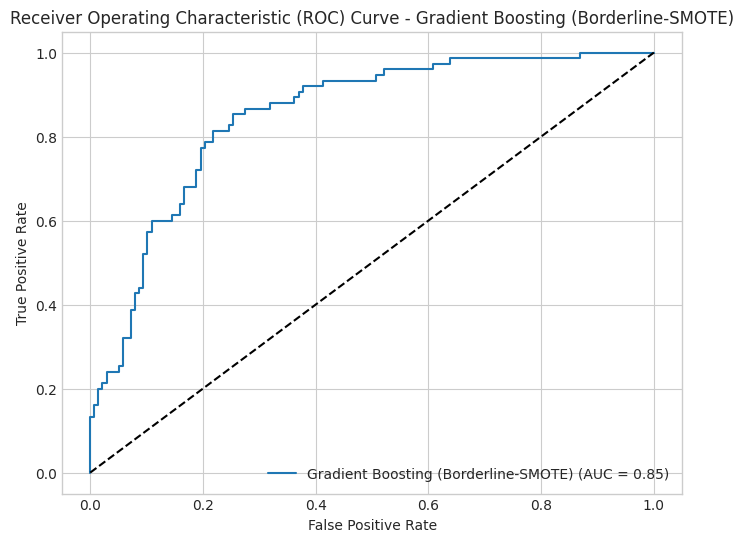

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.combine import SMOTETomek
from imblearn.over_sampling import BorderlineSMOTE  # ADASYN eliminado
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Preparar los datos: X e y ya definidos como X_selected_with_features y y_selected_with_features

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3,
    random_state=42,
    stratify=y_selected_with_features
)

# 3. Escalar los datos (opcional para Gradient Boosting)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Probar diferentes técnicas de balanceo (ADASYN eliminado)
balance_methods = {
    "SMOTETomek": SMOTETomek(random_state=42),
    "Borderline-SMOTE": BorderlineSMOTE(random_state=42)
}

for method_name, balancer in balance_methods.items():
    print(f"\n=== Balanceo con {method_name} ===")

    # Aplicar la técnica de balanceo
    X_train_balanced, y_train_balanced = balancer.fit_resample(X_train_scaled, y_train)

    # 5. Definir el modelo Gradient Boosting
    gb = GradientBoostingClassifier(
        learning_rate=0.1,
        max_depth=7,
        min_samples_leaf=1,
        min_samples_split=2,
        n_estimators=100,
        subsample=1.0,
        random_state=42
    )

    # Entrenar el modelo con datos balanceados
    gb.fit(X_train_balanced, y_train_balanced)

    # 6. Predecir en el conjunto de prueba original
    y_pred = gb.predict(X_test_scaled)
    y_prob = gb.predict_proba(X_test_scaled)[:, 1]

    # Calcular métricas
    report = classification_report(y_test, y_pred, output_dict=True)
    conf_matrix = confusion_matrix(y_test, y_pred)
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)

    # Imprimir reporte de clasificación
    print(f"Classification Report for Gradient Boosting with {method_name}:")
    print(classification_report(y_test, y_pred))

    # Visualizar matriz de confusión
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix - Gradient Boosting ({method_name})')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    # Visualizar curva ROC
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'Gradient Boosting ({method_name}) (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic (ROC) Curve - Gradient Boosting ({method_name})')
    plt.legend()
    plt.show()


---

La diabetes es una enfermedad crónica que, si no se diagnostica y trata a tiempo, puede derivar en graves complicaciones de salud, como enfermedades cardiovasculares, daño renal, ceguera o amputaciones. Estas consecuencias no solo afectan la calidad de vida de los pacientes, sino que también generan una carga significativa para el sistema de salud debido a la necesidad de tratamientos más complejos y prolongados. Por ello, en este proyecto hemos decidido priorizar el *recall* en nuestros modelos predictivos.

Al priorizar esta métrica, buscamos minimizar los falsos negativos, es decir, los casos en los que un paciente con diabetes no es identificado por el modelo. Aunque esto puede aumentar ligeramente los falsos positivos (personas sin diabetes clasificadas erróneamente como positivas), consideramos que el costo asociado a pruebas confirmatorias adicionales es mucho menor que el impacto de no diagnosticar a tiempo a quienes realmente tienen la enfermedad.

Para implementar esta estrategia:
- En el modelo **SVM**, seleccionaremos la configuración con Borderline-SMOTE, ya que logra un alto recall para la clase positiva (0.89), asegurando que se detecten la mayoría de los casos de diabetes.

- En el modelo **Gradient Boosting**, optaremos por Borderline-SMOTE, que también ofrece un buen balance entre recall (0.79) y precisión, maximizando la detección de casos positivos sin comprometer demasiado el rendimiento general.

Con esta decisión, buscamos garantizar una detección temprana y efectiva de la diabetes, reduciendo riesgos para los pacientes y promoviendo un uso más preventivo y eficiente de los recursos del sistema de salud.





---

---

## BUSCAMOS EL MEJOR CUT OFF PARA NUESTROS MODELOS:

- Evaluación de diferentes umbrales de clasificación: Definiremos un rango de umbrales (cutoffs) de 0.1 a 0.9 con incrementos de 0.1.
- Para cada umbral: Generaremos predicciones binarias basadas en el umbral.
- Calcularemos métricas de rendimiento (precisión, recall, F1-score) para ambas clases y la exactitud global.

Cambiar el umbral permite ajustar el balance entre precisión y recall, lo que es especialmente útil en problemas con desbalance de clases como este.

La estrategia de optimización del umbral aplicaremos a los tres modelos evaluados (SVM con SMOTE, SVM con ADASYN, y Gradient Boosting con Borderline-SMOTE). Sin embargo, las prioridades pueden variar:

- SVM con SMOTE: Es el modelo que más se beneficiaría de esta estrategia debido a su buen equilibrio inicial entre precisión y recall.

- Gradient Boosting con Borderline-SMOTE: También es una opción clave para aplicar esta estrategia, especialmente si se busca mejorar su sensibilidad hacia la clase positiva.

- SVM con ADASYN: Aunque ya tiene un alto recall, aplicar la optimización del umbral podría afinar aún más su rendimiento general.

### SVM - BorderlineSmote


Resultados con Borderline-SMOTE:
   cutoff  precision_0  recall_0  f1_score_0  precision_1  recall_1  \
0     0.1     0.979167  0.340580    0.505376     0.448485  0.986667   
1     0.2     0.986842  0.543478    0.700935     0.540146  0.986667   
2     0.3     0.945055  0.623188    0.751092     0.573770  0.933333   
3     0.4     0.921569  0.681159    0.783333     0.603604  0.893333   
4     0.5     0.915254  0.782609    0.843750     0.684211  0.866667   
5     0.6     0.857143  0.826087    0.841328     0.700000  0.746667   
6     0.7     0.760736  0.898551    0.823920     0.720000  0.480000   
7     0.8     0.678756  0.949275    0.791541     0.650000  0.173333   
8     0.9     0.647887  1.000000    0.786325     0.000000  0.000000   

   f1_score_1  accuracy  
0    0.616667  0.568075  
1    0.698113  0.699531  
2    0.710660  0.732394  
3    0.720430  0.755869  
4    0.764706  0.812207  
5    0.722581  0.798122  
6    0.576000  0.751174  
7    0.273684  0.676056  
8    0.000000  0.6478

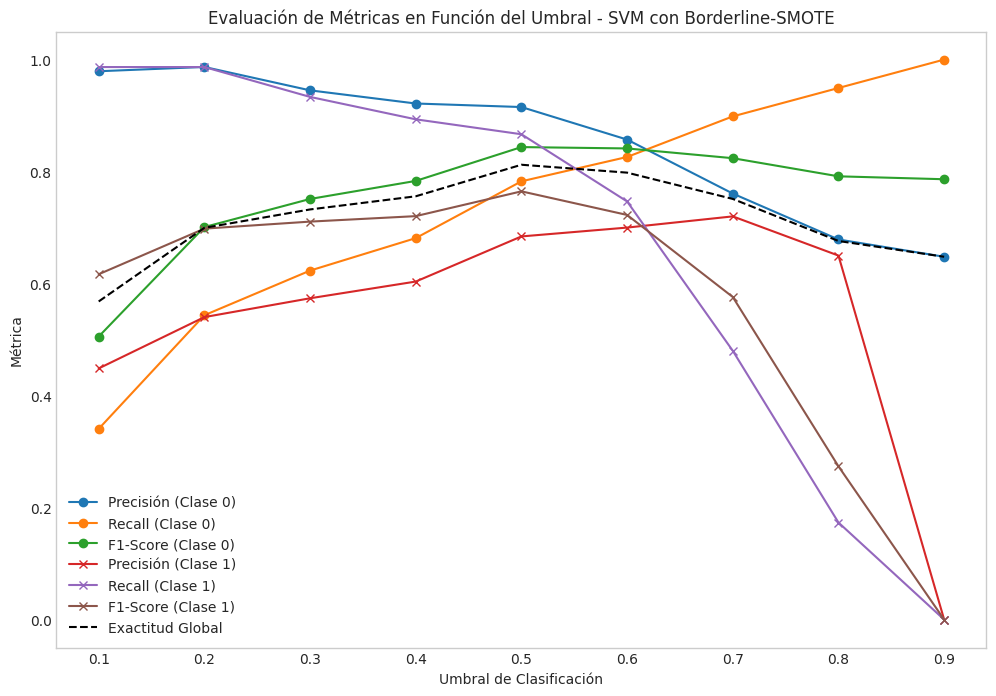

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE  # Cambio principal aquí
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# 1. Preparar los datos: X e y ya definidos

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 3. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Balancear las clases con Borderline-SMOTE (Cambio clave)
borderline_smote = BorderlineSMOTE(random_state=42, kind='borderline-1')  # Configuración estándar
X_train_bsmote, y_train_bsmote = borderline_smote.fit_resample(X_train_scaled, y_train)

# 5. Definir el modelo SVM
svm = SVC(kernel='rbf', probability=True, random_state=42)

# 6. Entrenar el modelo con datos balanceados
svm.fit(X_train_bsmote, y_train_bsmote)

# 7. Predecir en el conjunto de prueba original
y_pred = svm.predict(X_test_scaled)
y_prob = svm.predict_proba(X_test_scaled)[:, 1]

# Evaluar diferentes umbrales de clasificación
cutoffs = np.arange(0.1, 1.0, 0.1)
results = []

for cutoff in cutoffs:
    y_pred_cutoff = (y_prob >= cutoff).astype(int)
    report = classification_report(y_test, y_pred_cutoff, output_dict=True)

    results.append({
        'cutoff': cutoff,
        'precision_0': report['0']['precision'],
        'recall_0': report['0']['recall'],
        'f1_score_0': report['0']['f1-score'],
        'precision_1': report['1']['precision'],
        'recall_1': report['1']['recall'],
        'f1_score_1': report['1']['f1-score'],
        'accuracy': accuracy_score(y_test, y_pred_cutoff)
    })

df_results = pd.DataFrame(results)
print("\nResultados con Borderline-SMOTE:")
print(df_results)

# Visualización actualizada
plt.figure(figsize=(12, 8))

plt.plot(df_results['cutoff'], df_results['precision_0'], label='Precisión (Clase 0)', marker='o')
plt.plot(df_results['cutoff'], df_results['recall_0'], label='Recall (Clase 0)', marker='o')
plt.plot(df_results['cutoff'], df_results['f1_score_0'], label='F1-Score (Clase 0)', marker='o')

plt.plot(df_results['cutoff'], df_results['precision_1'], label='Precisión (Clase 1)', marker='x')
plt.plot(df_results['cutoff'], df_results['recall_1'], label='Recall (Clase 1)', marker='x')
plt.plot(df_results['cutoff'], df_results['f1_score_1'], label='F1-Score (Clase 1)', marker='x')

plt.plot(df_results['cutoff'], df_results['accuracy'], label='Exactitud Global', linestyle='--', color='black')

plt.xlabel('Umbral de Clasificación')
plt.ylabel('Métrica')
plt.title('Evaluación de Métricas en Función del Umbral - SVM con Borderline-SMOTE')
plt.legend()
plt.grid()
plt.show()


## SVM BOrderline-SMOTE CUTOFF 0.45

Resultados para cutoff = 0.45 con Borderline-SMOTE
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.74      0.82       138
           1       0.65      0.89      0.75        75

    accuracy                           0.79       213
   macro avg       0.79      0.82      0.79       213
weighted avg       0.83      0.79      0.80       213


Confusion Matrix:
[[102  36]
 [  8  67]]

Accuracy: 0.7934


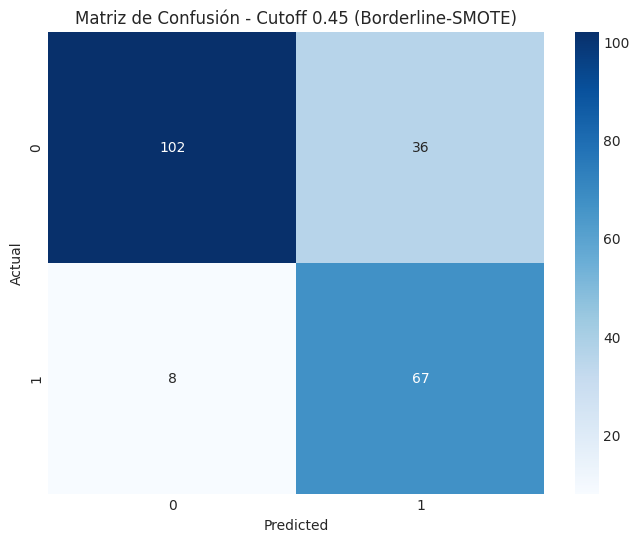

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE  # Cambio clave aquí
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Preparar los datos: X e y ya definidos

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 3. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Balancear las clases con Borderline-SMOTE (Versión modificada)
bsmote = BorderlineSMOTE(random_state=42, kind='borderline-1')  # Configuración estándar
X_train_bsmote, y_train_bsmote = bsmote.fit_resample(X_train_scaled, y_train)

# 5. Definir el modelo SVM
svm = SVC(kernel='rbf', probability=True, random_state=42)

# 6. Entrenar el modelo con datos balanceados
svm.fit(X_train_bsmote, y_train_bsmote)

# 7. Predecir en el conjunto de prueba original
y_pred = svm.predict(X_test_scaled)
y_prob = svm.predict_proba(X_test_scaled)[:, 1]

# Evaluar un cutoff específico (por ejemplo, 0.45)
cutoff = 0.45
y_pred_cutoff = (y_prob >= cutoff).astype(int)

# Generar reporte de clasificación
report = classification_report(y_test, y_pred_cutoff)
conf_matrix = confusion_matrix(y_test, y_pred_cutoff)
accuracy = accuracy_score(y_test, y_pred_cutoff)

# Imprimir resultados
print(f"Resultados para cutoff = {cutoff} con Borderline-SMOTE")
print("Classification Report:")
print(report)
print("\nConfusion Matrix:")
print(conf_matrix)
print(f"\nAccuracy: {accuracy:.4f}")

# Visualizar matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Cutoff {cutoff} (Borderline-SMOTE)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


## TESTAMOS SVM Borderline-SMOTE CUTOFF 0.4

Resultados para cutoff = 0.4 con Borderline-SMOTE
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.68      0.78       138
           1       0.60      0.89      0.72        75

    accuracy                           0.76       213
   macro avg       0.76      0.79      0.75       213
weighted avg       0.81      0.76      0.76       213


Confusion Matrix:
[[94 44]
 [ 8 67]]

Accuracy: 0.7559


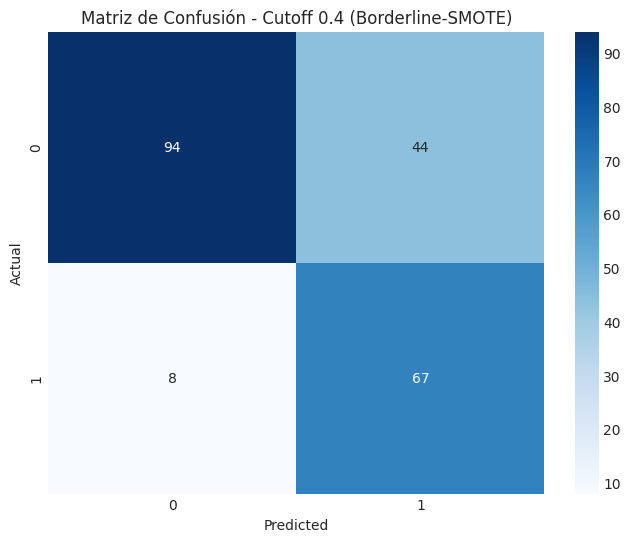

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE  # Cambio clave aquí
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Preparar los datos: X e y ya definidos

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 3. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Balancear las clases con Borderline-SMOTE (Versión modificada)
bsmote = BorderlineSMOTE(random_state=42, kind='borderline-1')  # Configuración estándar
X_train_bsmote, y_train_bsmote = bsmote.fit_resample(X_train_scaled, y_train)

# 5. Definir el modelo SVM
svm = SVC(kernel='rbf', probability=True, random_state=42)

# 6. Entrenar el modelo con datos balanceados
svm.fit(X_train_bsmote, y_train_bsmote)

# 7. Predecir en el conjunto de prueba original
y_pred = svm.predict(X_test_scaled)
y_prob = svm.predict_proba(X_test_scaled)[:, 1]

# Evaluar un cutoff específico (por ejemplo, 0.4)
cutoff = 0.4
y_pred_cutoff = (y_prob >= cutoff).astype(int)

# Generar reporte de clasificación
report = classification_report(y_test, y_pred_cutoff)
conf_matrix = confusion_matrix(y_test, y_pred_cutoff)
accuracy = accuracy_score(y_test, y_pred_cutoff)

# Imprimir resultados
print(f"Resultados para cutoff = {cutoff} con Borderline-SMOTE")
print("Classification Report:")
print(report)
print("\nConfusion Matrix:")
print(conf_matrix)
print(f"\nAccuracy: {accuracy:.4f}")

# Visualizar matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Cutoff {cutoff} (Borderline-SMOTE)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


Resultados para cutoff = 0.5 con Borderline-SMOTE
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.78      0.84       138
           1       0.68      0.87      0.76        75

    accuracy                           0.81       213
   macro avg       0.80      0.82      0.80       213
weighted avg       0.83      0.81      0.82       213


Confusion Matrix:
[[108  30]
 [ 10  65]]

Accuracy: 0.8122


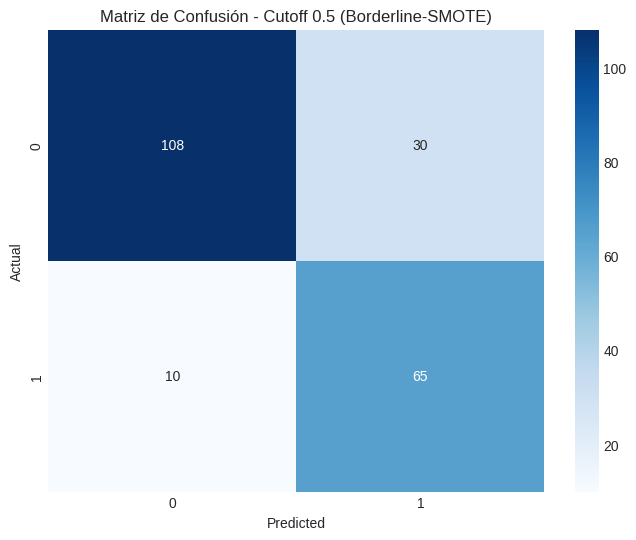

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE  # Cambio clave aquí
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Preparar los datos: X e y ya definidos

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 3. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Balancear las clases con Borderline-SMOTE (Versión modificada)
bsmote = BorderlineSMOTE(random_state=42, kind='borderline-1')  # Configuración estándar
X_train_bsmote, y_train_bsmote = bsmote.fit_resample(X_train_scaled, y_train)

# 5. Definir el modelo SVM
svm = SVC(kernel='rbf', probability=True, random_state=42)

# 6. Entrenar el modelo con datos balanceados
svm.fit(X_train_bsmote, y_train_bsmote)

# 7. Predecir en el conjunto de prueba original
y_pred = svm.predict(X_test_scaled)
y_prob = svm.predict_proba(X_test_scaled)[:, 1]

# Evaluar un cutoff específico (por ejemplo, 0.5)
cutoff = 0.5
y_pred_cutoff = (y_prob >= cutoff).astype(int)

# Generar reporte de clasificación
report = classification_report(y_test, y_pred_cutoff)
conf_matrix = confusion_matrix(y_test, y_pred_cutoff)
accuracy = accuracy_score(y_test, y_pred_cutoff)

# Imprimir resultados
print(f"Resultados para cutoff = {cutoff} con Borderline-SMOTE")
print("Classification Report:")
print(report)
print("\nConfusion Matrix:")
print(conf_matrix)
print(f"\nAccuracy: {accuracy:.4f}")

# Visualizar matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Cutoff {cutoff} (Borderline-SMOTE)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


Las métricas con mejores resultados generales para SVM ocn Borderline-SMOTE han sido (0.45), analizamos:

Resultados para cutoff = 0.45 con Borderline-SMOTE
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.74      0.82       138
           1       0.65      0.89      0.75        75

    accuracy                           0.79       213
   macro avg       0.79      0.82      0.79       213
weighted avg       0.83      0.79      0.80       213


Confusion Matrix:
[[102  36]
 [  8  67]]

Accuracy: 0.7934

---


En este caso, dado que estamos trabajando en un problema médico donde minimizar falsos negativos es crítico, optaremos por el cutoff de **0.45**.



---

---

## SELECCION DE PARAMETROS PARA SVM
- No PCA, No Selección de caracteristicas, BorderlineSMOTE, cutoff 0.45


---

---

## VERSIÓN QUE MEJOR NOS HA FUNCIONADO DE GRADIENT BOOSTING POR AHORA, EVALUAMOS DIFERENTES PUNTOS DE CORTE

Classification Report for Gradient Boosting with Borderline-SMOTE:
              precision    recall  f1-score   support

           0       0.87      0.80      0.83       138
           1       0.68      0.79      0.73        75

    accuracy                           0.79       213
   macro avg       0.78      0.79      0.78       213
weighted avg       0.80      0.79      0.80       213



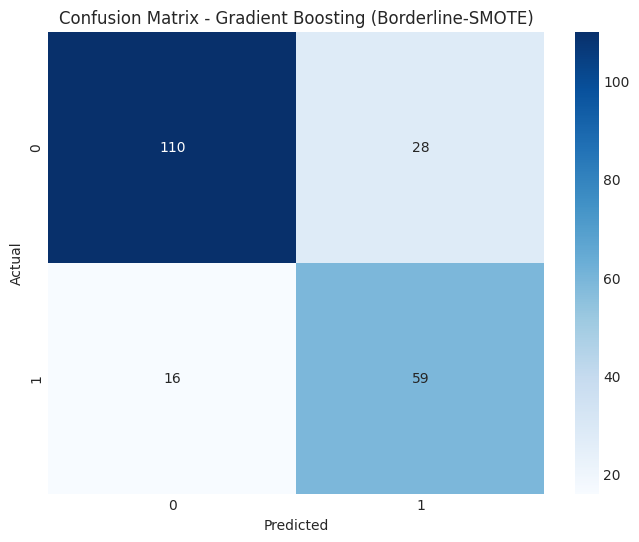

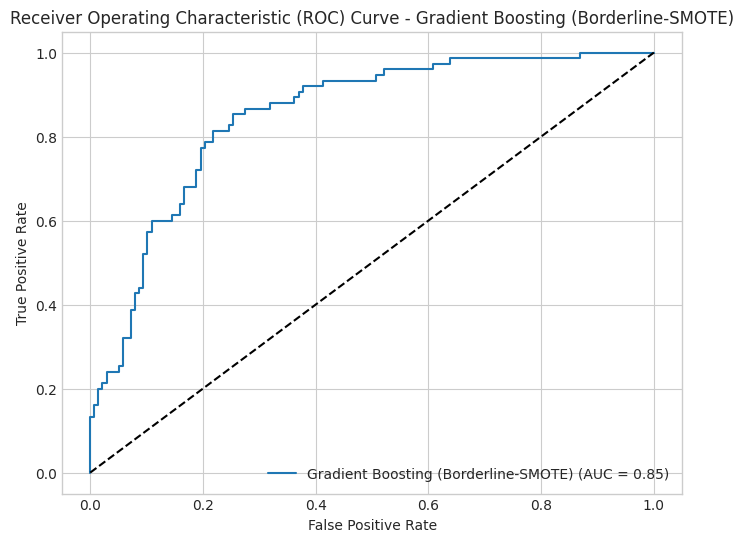

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Preparar los datos: X e y ya definidos como X_selected_with_features y y_selected_with_features

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3,
    random_state=42,
    stratify=y_selected_with_features
)

# 3. Escalar los datos (opcional para Gradient Boosting)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Aplicar Borderline-SMOTE
borderline_smote = BorderlineSMOTE(random_state=42)
X_train_balanced, y_train_balanced = borderline_smote.fit_resample(X_train_scaled, y_train)

# 5. Definir el modelo Gradient Boosting
gb = GradientBoostingClassifier(
    learning_rate=0.1,
    max_depth=7,
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=100,
    subsample=1.0,
    random_state=42
)

# 6. Entrenar el modelo con datos balanceados
gb.fit(X_train_balanced, y_train_balanced)

# 7. Predecir en el conjunto de prueba original
y_pred = gb.predict(X_test_scaled)
y_prob = gb.predict_proba(X_test_scaled)[:, 1]

# Calcular métricas
report = classification_report(y_test, y_pred, output_dict=True)
conf_matrix = confusion_matrix(y_test, y_pred)
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Imprimir reporte de clasificación
print("Classification Report for Gradient Boosting with Borderline-SMOTE:")
print(classification_report(y_test, y_pred))

# Visualizar matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Gradient Boosting (Borderline-SMOTE)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Visualizar curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'Gradient Boosting (Borderline-SMOTE) (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - Gradient Boosting (Borderline-SMOTE)')
plt.legend()
plt.show()


CUT OFF 0.5

Resultados para cutoff = 0.5
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.80      0.83       138
           1       0.68      0.79      0.73        75

    accuracy                           0.79       213
   macro avg       0.78      0.79      0.78       213
weighted avg       0.80      0.79      0.80       213



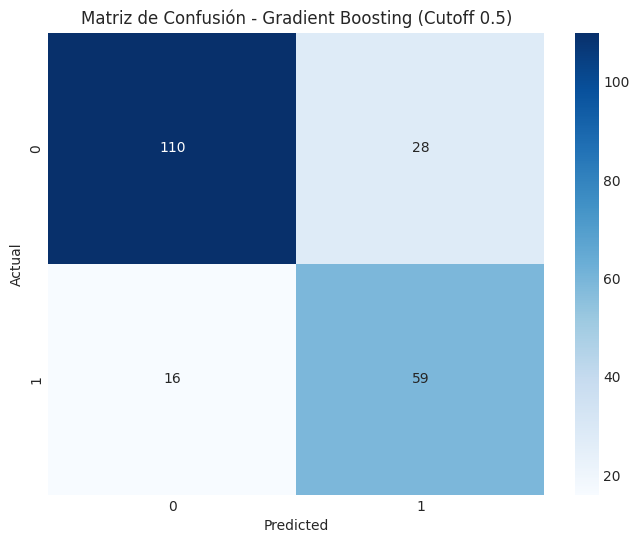

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Preparar los datos: X e y ya definidos como X_selected_with_features y y_selected_with_features

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3,
    random_state=42,
    stratify=y_selected_with_features
)

# 3. Escalar los datos (opcional para Gradient Boosting)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Aplicar Borderline-SMOTE
borderline_smote = BorderlineSMOTE(random_state=42)
X_train_balanced, y_train_balanced = borderline_smote.fit_resample(X_train_scaled, y_train)

# 5. Definir el modelo Gradient Boosting
gb = GradientBoostingClassifier(
    learning_rate=0.1,
    max_depth=7,
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=100,
    subsample=1.0,
    random_state=42
)

# 6. Entrenar el modelo con datos balanceados
gb.fit(X_train_balanced, y_train_balanced)

# 7. Predecir probabilidades en el conjunto de prueba original
y_prob = gb.predict_proba(X_test_scaled)[:, 1]

# Aplicar un cutoff de 0.5 para generar predicciones binarias
cutoff = 0.5
y_pred_cutoff = (y_prob >= cutoff).astype(int)

# Calcular métricas con el cutoff aplicado
report_cutoff = classification_report(y_test, y_pred_cutoff)
conf_matrix_cutoff = confusion_matrix(y_test, y_pred_cutoff)

# Imprimir reporte de clasificación con cutoff aplicado
print(f"Resultados para cutoff = {cutoff}")
print("Classification Report:")
print(report_cutoff)

# Visualizar matriz de confusión con cutoff aplicado
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_cutoff, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Gradient Boosting (Cutoff {cutoff})')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


CUTOFF 0.4

Resultados para cutoff = 0.4
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.78      0.83       138
           1       0.66      0.81      0.73        75

    accuracy                           0.79       213
   macro avg       0.77      0.79      0.78       213
weighted avg       0.81      0.79      0.79       213



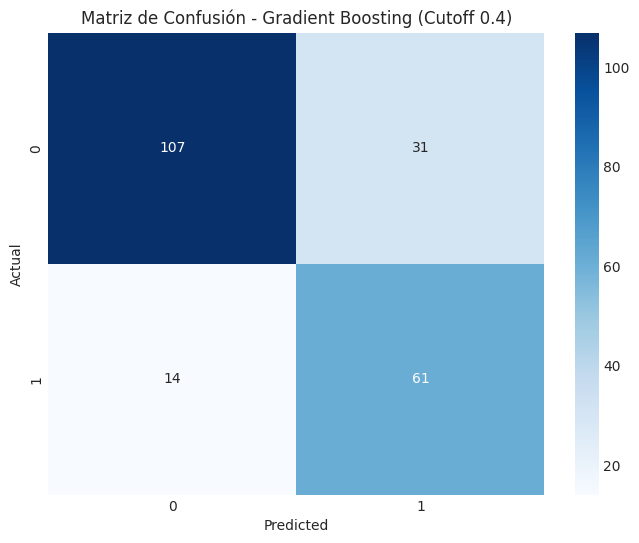

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Preparar los datos: X e y ya definidos como X_selected_with_features y y_selected_with_features

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3,
    random_state=42,
    stratify=y_selected_with_features
)

# 3. Escalar los datos (opcional para Gradient Boosting)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Aplicar Borderline-SMOTE
borderline_smote = BorderlineSMOTE(random_state=42)
X_train_balanced, y_train_balanced = borderline_smote.fit_resample(X_train_scaled, y_train)

# 5. Definir el modelo Gradient Boosting
gb = GradientBoostingClassifier(
    learning_rate=0.1,
    max_depth=7,
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=100,
    subsample=1.0,
    random_state=42
)

# 6. Entrenar el modelo con datos balanceados
gb.fit(X_train_balanced, y_train_balanced)

# 7. Predecir probabilidades en el conjunto de prueba original
y_prob = gb.predict_proba(X_test_scaled)[:, 1]

# Aplicar un cutoff de 0.4 para generar predicciones binarias
cutoff = 0.4
y_pred_cutoff = (y_prob >= cutoff).astype(int)

# Calcular métricas con el cutoff aplicado
report_cutoff = classification_report(y_test, y_pred_cutoff)
conf_matrix_cutoff = confusion_matrix(y_test, y_pred_cutoff)

# Imprimir reporte de clasificación con cutoff aplicado
print(f"Resultados para cutoff = {cutoff}")
print("Classification Report:")
print(report_cutoff)

# Visualizar matriz de confusión con cutoff aplicado
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_cutoff, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Gradient Boosting (Cutoff {cutoff})')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


CUTOFF 0.45

Resultados para cutoff = 0.45
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.78      0.82       138
           1       0.66      0.79      0.72        75

    accuracy                           0.78       213
   macro avg       0.77      0.78      0.77       213
weighted avg       0.80      0.78      0.79       213



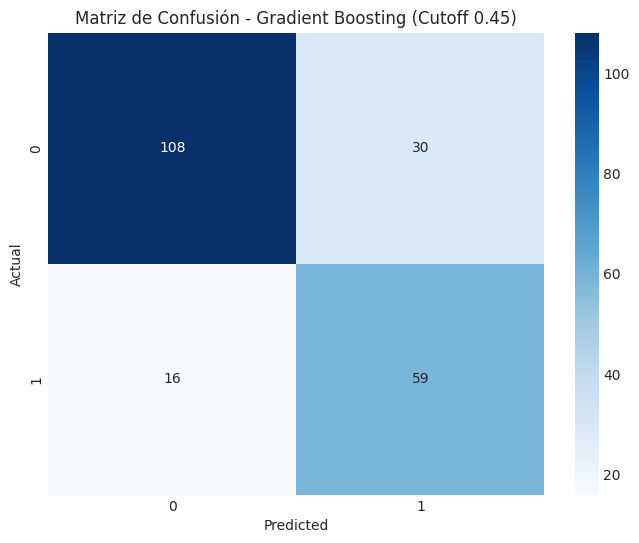

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Preparar los datos: X e y ya definidos como X_selected_with_features y y_selected_with_features

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3,
    random_state=42,
    stratify=y_selected_with_features
)

# 3. Escalar los datos (opcional para Gradient Boosting)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Aplicar Borderline-SMOTE
borderline_smote = BorderlineSMOTE(random_state=42)
X_train_balanced, y_train_balanced = borderline_smote.fit_resample(X_train_scaled, y_train)

# 5. Definir el modelo Gradient Boosting
gb = GradientBoostingClassifier(
    learning_rate=0.1,
    max_depth=7,
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=100,
    subsample=1.0,
    random_state=42
)

# 6. Entrenar el modelo con datos balanceados
gb.fit(X_train_balanced, y_train_balanced)

# 7. Predecir probabilidades en el conjunto de prueba original
y_prob = gb.predict_proba(X_test_scaled)[:, 1]

# Aplicar un cutoff de 0.45 para generar predicciones binarias
cutoff = 0.45
y_pred_cutoff = (y_prob >= cutoff).astype(int)

# Calcular métricas con el cutoff aplicado
report_cutoff = classification_report(y_test, y_pred_cutoff)
conf_matrix_cutoff = confusion_matrix(y_test, y_pred_cutoff)

# Imprimir reporte de clasificación con cutoff aplicado
print(f"Resultados para cutoff = {cutoff}")
print("Classification Report:")
print(report_cutoff)

# Visualizar matriz de confusión con cutoff aplicado
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_cutoff, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Gradient Boosting (Cutoff {cutoff})')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


Como nuestro objetivo es favorecer el recuerdo (recall) de la clase 1, estas son nuestras conclusiones:

### Resultados por Cutoff

1. **Cutoff 0.4**:
   - **Recuerdo Clase 1**: 0.81
   - Este punto de corte ofrece un buen recuerdo para la clase 1, lo que significa que el modelo es capaz de identificar un alto porcentaje de casos positivos de diabetes.

2. **Cutoff 0.45**:
   - **Recuerdo Clase 1**: 0.79
   - Aunque ligeramente menor que en el punto de corte de 0.4, este valor sigue siendo alto y podría ser una buena opción si se busca un equilibrio con otras métricas.

3. **Cutoff 0.5**:
   - **Recuerdo Clase 1**: 0.79
   - Este punto de corte también ofrece un buen recuerdo para la clase 1, similar al de 0.45.

### Conclusiones

- **Cutoff 0.4** parece ser la mejor opción si el objetivo principal es maximizar el recuerdo de la clase 1, ya que ofrece el valor más alto de recuerdo para esta clase.

- Aunque los puntos de corte de 0.45 y 0.5 también ofrecen buenos resultados en términos de recuerdo, son ligeramente menores que el de 0.4.



---

## BUSCAMOS EXAHUSTIVAMENTE LOS MEJORES HIPERPARAMETROS PARA AMBOS MODELOS



SVM - Borderline Smote - CUTOFF 0.45  

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE  # Cambio clave aquí
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Preparar los datos
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Balancear las clases con Borderline-SMOTE (Versión modificada)
bsmote = BorderlineSMOTE(random_state=42, kind='borderline-1')  # Configuración estándar
X_train_bsmote, y_train_bsmote = bsmote.fit_resample(X_train_scaled, y_train)

# Definir hiperparámetros para búsqueda
param_grid = {
    'kernel': ['linear', 'rbf', 'poly'],
    'C': [0.1, 1, 10],
    'gamma': ['scale', 'auto'],
    'probability': [True]
}

# Realizar búsqueda de hiperparámetros
svm = SVC(random_state=42)
grid_search = GridSearchCV(estimator=svm, param_grid=param_grid, cv=5)
grid_search.fit(X_train_bsmote, y_train_bsmote)  # Usar datos balanceados con Borderline-SMOTE

# Imprimir mejores hiperparámetros
print("Mejores hiperparámetros:", grid_search.best_params_)

# Entrenar el mejor modelo con los datos balanceados
best_model = grid_search.best_estimator_
best_model.fit(X_train_bsmote, y_train_bsmote)

# Predecir probabilidades en el conjunto de prueba original
y_prob = best_model.predict_proba(X_test_scaled)[:, 1]

# Aplicar un cutoff específico para generar predicciones binarias
cutoff = 0.45
y_pred_cutoff = (y_prob >= cutoff).astype(int)

# Evaluar el modelo con el cutoff aplicado
report_cutoff = classification_report(y_test, y_pred_cutoff)
conf_matrix_cutoff = confusion_matrix(y_test, y_pred_cutoff)
accuracy_cutoff = accuracy_score(y_test, y_pred_cutoff)

# Imprimir resultados con el cutoff aplicado
print("\nClassification Report con Cutoff (Borderline-SMOTE):")
print(report_cutoff)
print("\nConfusion Matrix:")
print(conf_matrix_cutoff)
print(f"\nAccuracy con Cutoff {cutoff}: {accuracy_cutoff:.4f}")


Mejores hiperparámetros: {'C': 1, 'gamma': 'auto', 'kernel': 'rbf', 'probability': True}

Classification Report con Cutoff (Borderline-SMOTE):
              precision    recall  f1-score   support

           0       0.93      0.72      0.81       138
           1       0.63      0.89      0.74        75

    accuracy                           0.78       213
   macro avg       0.78      0.81      0.77       213
weighted avg       0.82      0.78      0.78       213


Confusion Matrix:
[[99 39]
 [ 8 67]]

Accuracy con Cutoff 0.45: 0.7793


Mejores hiperparámetros: {'C': 1, 'gamma': 'auto', 'kernel': 'rbf', 'probability': True}
AUC-ROC: 0.8649

Classification Report con Cutoff (Borderline-SMOTE):
              precision    recall  f1-score   support

           0       0.93      0.72      0.81       138
           1       0.63      0.89      0.74        75

    accuracy                           0.78       213
   macro avg       0.78      0.81      0.77       213
weighted avg       0.82      0.78      0.78       213


Confusion Matrix:
[[99 39]
 [ 8 67]]

Accuracy con Cutoff 0.45: 0.7793


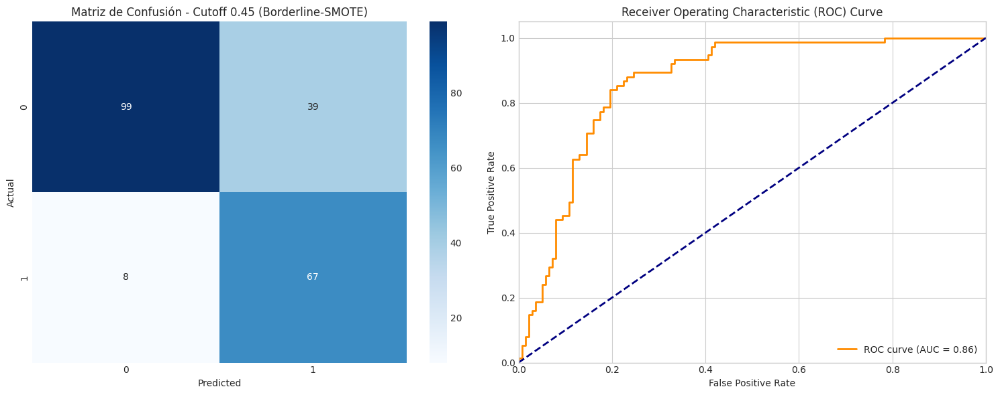

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Preparar los datos
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Balancear las clases con Borderline-SMOTE (Versión modificada)
bsmote = BorderlineSMOTE(random_state=42, kind='borderline-1')  # Configuración estándar
X_train_bsmote, y_train_bsmote = bsmote.fit_resample(X_train_scaled, y_train)

# Definir hiperparámetros para búsqueda
param_grid = {
    'kernel': ['linear', 'rbf', 'poly'],
    'C': [0.1, 1, 10],
    'gamma': ['scale', 'auto'],
    'probability': [True]
}

# Realizar búsqueda de hiperparámetros
svm = SVC(random_state=42)
grid_search = GridSearchCV(estimator=svm, param_grid=param_grid, cv=5)
grid_search.fit(X_train_bsmote, y_train_bsmote)  # Usar datos balanceados con Borderline-SMOTE

# Imprimir mejores hiperparámetros
print("Mejores hiperparámetros:", grid_search.best_params_)

# Entrenar el mejor modelo con los datos balanceados
best_model = grid_search.best_estimator_
best_model.fit(X_train_bsmote, y_train_bsmote)

# Predecir probabilidades en el conjunto de prueba original
y_prob = best_model.predict_proba(X_test_scaled)[:, 1]

# Calcular curva ROC y AUC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
print(f"AUC-ROC: {roc_auc:.4f}")

# Aplicar un cutoff específico para generar predicciones binarias
cutoff = 0.45
y_pred_cutoff = (y_prob >= cutoff).astype(int)

# Evaluar el modelo con el cutoff aplicado
report_cutoff = classification_report(y_test, y_pred_cutoff)
conf_matrix_cutoff = confusion_matrix(y_test, y_pred_cutoff)
accuracy_cutoff = accuracy_score(y_test, y_pred_cutoff)

# Imprimir resultados con el cutoff aplicado
print("\nClassification Report con Cutoff (Borderline-SMOTE):")
print(report_cutoff)
print("\nConfusion Matrix:")
print(conf_matrix_cutoff)
print(f"\nAccuracy con Cutoff {cutoff}: {accuracy_cutoff:.4f}")

# Crear una figura con dos subplots
plt.figure(figsize=(15, 6))

# Subplot 1: Matriz de confusión
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_cutoff, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Cutoff {cutoff} (Borderline-SMOTE)')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Subplot 2: Curva ROC
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()


**APLICAMOS** PONDERACION DE CLASES

Mejores hiperparámetros: {'C': 1, 'gamma': 'auto', 'kernel': 'rbf', 'probability': True}

AUC-ROC: 0.8649

Classification Report con Cutoff (Borderline-SMOTE):
              precision    recall  f1-score   support

           0       0.93      0.72      0.81       138
           1       0.63      0.89      0.74        75

    accuracy                           0.78       213
   macro avg       0.78      0.81      0.77       213
weighted avg       0.82      0.78      0.78       213


Confusion Matrix:
[[99 39]
 [ 8 67]]

Accuracy con Cutoff 0.45: 0.7793


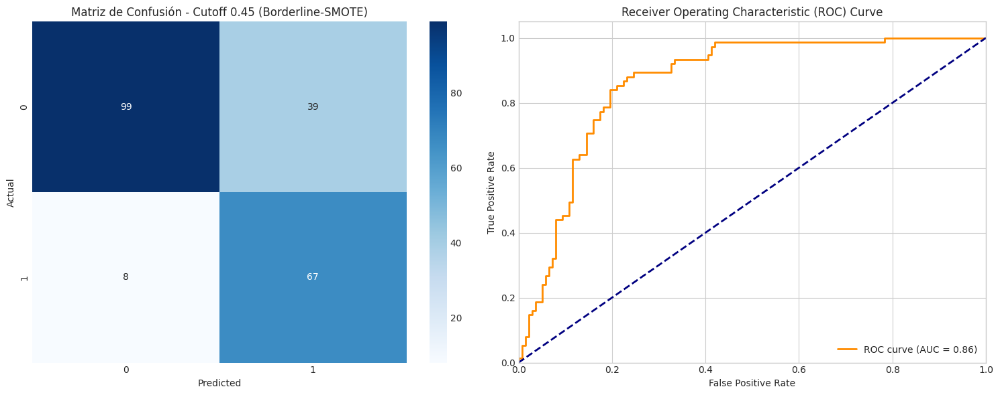

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE  # Cambio clave aquí
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc
from sklearn.utils.class_weight import compute_class_weight
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Preparar los datos
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Balancear las clases con Borderline-SMOTE (Versión modificada)
bsmote = BorderlineSMOTE(random_state=42, kind='borderline-1')  # Configuración estándar
X_train_bsmote, y_train_bsmote = bsmote.fit_resample(X_train_scaled, y_train)

# Calcular ponderaciones de clases con los nuevos datos balanceados
class_weights = compute_class_weight(class_weight='balanced',
                                   classes=np.unique(y_train_bsmote),
                                   y=y_train_bsmote)
class_weights_dict = dict(zip(np.unique(y_train_bsmote), class_weights))

# Definir hiperparámetros para búsqueda
param_grid = {
    'kernel': ['rbf'],
    'C': [1],
    'gamma': ['auto'],
    'probability': [True]
}

# Ajusta el modelo para usar las ponderaciones de clases
svm = SVC(random_state=42, class_weight=class_weights_dict)
grid_search = GridSearchCV(estimator=svm, param_grid=param_grid, cv=5)
grid_search.fit(X_train_bsmote, y_train_bsmote)  # Usar datos de Borderline-SMOTE

# Imprimir mejores hiperparámetros
print("Mejores hiperparámetros:", grid_search.best_params_)

# Entrenar el mejor modelo con los datos balanceados
best_model = grid_search.best_estimator_
best_model.fit(X_train_bsmote, y_train_bsmote)

# Predecir probabilidades en el conjunto de prueba original
y_prob = best_model.predict_proba(X_test_scaled)[:, 1]

# Calcular curva ROC y AUC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
print(f"\nAUC-ROC: {roc_auc:.4f}")

# Aplicar un cutoff específico para generar predicciones binarias
cutoff = 0.45
y_pred_cutoff = (y_prob >= cutoff).astype(int)

# Evaluar el modelo con el cutoff aplicado
report_cutoff = classification_report(y_test, y_pred_cutoff)
conf_matrix_cutoff = confusion_matrix(y_test, y_pred_cutoff)
accuracy_cutoff = accuracy_score(y_test, y_pred_cutoff)

# Imprimir resultados con el cutoff aplicado
print("\nClassification Report con Cutoff (Borderline-SMOTE):")
print(report_cutoff)
print("\nConfusion Matrix:")
print(conf_matrix_cutoff)
print(f"\nAccuracy con Cutoff {cutoff}: {accuracy_cutoff:.4f}")

# Crear visualizaciones en una figura con dos subplots
plt.figure(figsize=(15, 6))

# Subplot 1: Matriz de confusión
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_cutoff, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Cutoff {cutoff} (Borderline-SMOTE)')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Subplot 2: Curva ROC
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()


Los resultados obtenidos antes de buscar los mejores hiperparámetros eran mejores en términos de precisión y recuerdo para ambas clases. Esto puede deberse a varias razones:

- Sobreajuste o Subajuste: Es posible que el modelo original estuviera bien ajustado para los datos de entrenamiento y prueba, mientras que la búsqueda de hiperparámetros haya llevado a un modelo que se ajusta demasiado a los datos de entrenamiento (sobreajuste) o no lo suficiente (subajuste).


- Hiperparámetros: La búsqueda de hiperparámetros puede no siempre mejorar el rendimiento, especialmente si el espacio de búsqueda no incluye los mejores parámetros para el problema específico.

Vamos a utilizar el codigo original sin ajuste de hiperprametros inciial y vamos a ajustar del umbral para maximizar el F1-score macro:

Mejor umbral: 0.48484848484848486

Classification Report con Mejor Umbral (Borderline-SMOTE):
              precision    recall  f1-score   support

           0       0.92      0.78      0.85       138
           1       0.69      0.88      0.77        75

    accuracy                           0.82       213
   macro avg       0.81      0.83      0.81       213
weighted avg       0.84      0.82      0.82       213


Confusion Matrix:
[[108  30]
 [  9  66]]

Accuracy con Mejor Umbral: 0.8169

AUC-ROC: 0.8650


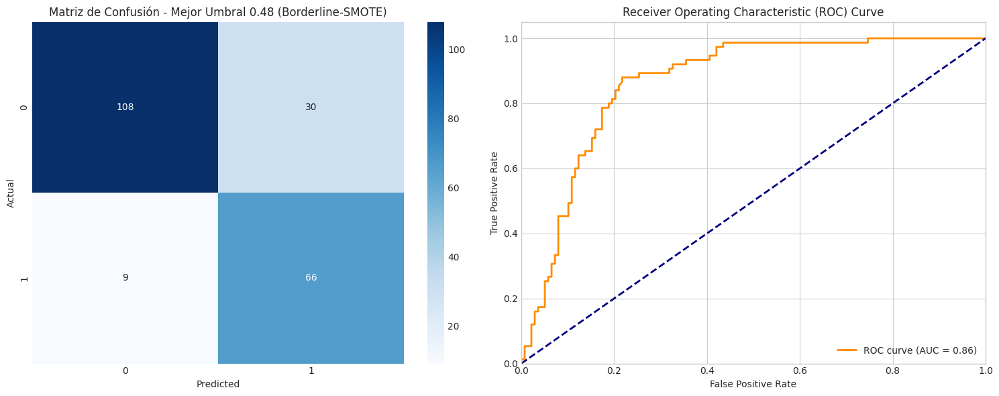

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE  # Cambio clave aquí
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score, roc_curve, auc
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Preparar los datos
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Balancear las clases con Borderline-SMOTE (Modificación principal)
bsmote = BorderlineSMOTE(random_state=42, kind='borderline-1')  # Versión conservadora
X_train_bsmote, y_train_bsmote = bsmote.fit_resample(X_train_scaled, y_train)

# Definir el modelo SVM
svm = SVC(kernel='rbf', probability=True, random_state=42)

# Entrenar el modelo con datos balanceados
svm.fit(X_train_bsmote, y_train_bsmote)

# Predecir en el conjunto de prueba original
y_pred = svm.predict(X_test_scaled)
y_prob = svm.predict_proba(X_test_scaled)[:, 1]

# Calcular curva ROC y AUC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Encontrar el mejor umbral basado en el F1-score macro
umbrales = np.linspace(0, 1, 100)
mejor_f1 = 0
mejor_umbral = 0

for umbral in umbrales:
    y_pred_umbral = (y_prob >= umbral).astype(int)
    f1 = f1_score(y_test, y_pred_umbral, average='macro')
    if f1 > mejor_f1:
        mejor_f1 = f1
        mejor_umbral = umbral

print(f"Mejor umbral: {mejor_umbral}")

# Evaluar el modelo con el mejor umbral
y_pred_mejor_umbral = (y_prob >= mejor_umbral).astype(int)
report_mejor_umbral = classification_report(y_test, y_pred_mejor_umbral)
conf_matrix_mejor_umbral = confusion_matrix(y_test, y_pred_mejor_umbral)
accuracy_mejor_umbral = accuracy_score(y_test, y_pred_mejor_umbral)

# Imprimir resultados con el mejor umbral
print("\nClassification Report con Mejor Umbral (Borderline-SMOTE):")
print(report_mejor_umbral)
print("\nConfusion Matrix:")
print(conf_matrix_mejor_umbral)
print(f"\nAccuracy con Mejor Umbral: {accuracy_mejor_umbral:.4f}")
print(f"\nAUC-ROC: {roc_auc:.4f}")

# Crear figura para visualizaciones
plt.figure(figsize=(15, 6))

# Subplot 1: Matriz de confusión
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_mejor_umbral, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Mejor Umbral {mejor_umbral:.2f} (Borderline-SMOTE)')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Subplot 2: Curva ROC
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()


---

---

AHORA VAMO HACER LA BUSQUEDA EXAHUSTIVA DE HIPERPARAMETROS DE GRADIENT BOOSTING

Fitting 5 folds for each of 729 candidates, totalling 3645 fits
Mejores hiperparámetros: {'learning_rate': 0.1, 'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100, 'subsample': 0.5}

Classification Report con Mejor Modelo:
              precision    recall  f1-score   support

           0       0.86      0.75      0.80       138
           1       0.62      0.77      0.69        75

    accuracy                           0.76       213
   macro avg       0.74      0.76      0.74       213
weighted avg       0.78      0.76      0.76       213


Confusion Matrix:
[[103  35]
 [ 17  58]]

Accuracy con Cutoff 0.4: 0.7559


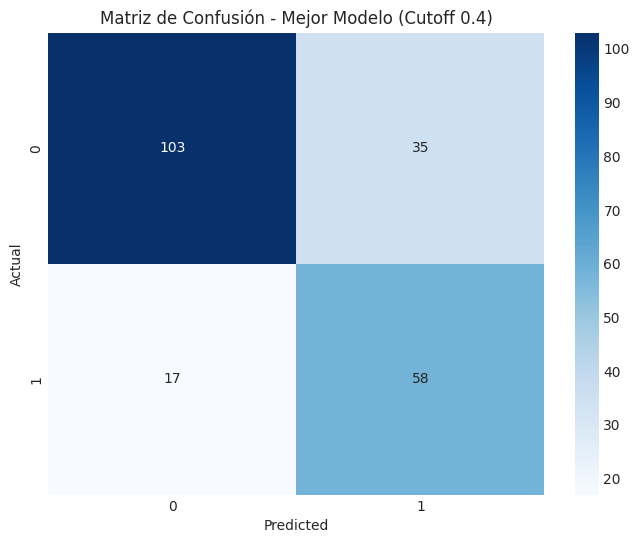

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Preparar los datos: X e y ya definidos como X_selected_with_features y y_selected_with_features

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3,
    random_state=42,
    stratify=y_selected_with_features
)

# Escalar los datos (opcional para Gradient Boosting)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Aplicar Borderline-SMOTE para balancear las clases
borderline_smote = BorderlineSMOTE(random_state=42)
X_train_balanced, y_train_balanced = borderline_smote.fit_resample(X_train_scaled, y_train)

# Definir el modelo base Gradient Boosting
gb = GradientBoostingClassifier(random_state=42)

# Definir los hiperparámetros para la búsqueda exhaustiva
param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_samples_leaf': [1, 5, 10],
    'min_samples_split': [2, 5, 10],
    'n_estimators': [50, 100, 200],
    'subsample': [0.5, 0.8, 1.0]
}

# Realizar la búsqueda exhaustiva con validación cruzada (cv=5)
grid_search = GridSearchCV(
    estimator=gb,
    param_grid=param_grid,
    scoring='accuracy',  # Puedes cambiar a otras métricas como 'f1' o 'roc_auc'
    cv=5,
    verbose=1,
    n_jobs=-1  # Usa todos los núcleos disponibles para acelerar la búsqueda
)

# Ajustar el modelo con los datos balanceados
grid_search.fit(X_train_balanced, y_train_balanced)

# Imprimir los mejores hiperparámetros encontrados
print("Mejores hiperparámetros:", grid_search.best_params_)

# Entrenar el modelo con los mejores hiperparámetros
best_model = grid_search.best_estimator_
best_model.fit(X_train_balanced, y_train_balanced)

# Predecir probabilidades en el conjunto de prueba original
y_prob = best_model.predict_proba(X_test_scaled)[:, 1]

# Aplicar un cutoff específico para generar predicciones binarias (por ejemplo, cutoff=0.4)
cutoff = 0.4
y_pred_cutoff = (y_prob >= cutoff).astype(int)

# Evaluar el modelo con el cutoff aplicado
report_cutoff = classification_report(y_test, y_pred_cutoff)
conf_matrix_cutoff = confusion_matrix(y_test, y_pred_cutoff)
accuracy_cutoff = accuracy_score(y_test, y_pred_cutoff)

# Imprimir resultados con el cutoff aplicado
print("\nClassification Report con Mejor Modelo:")
print(report_cutoff)
print("\nConfusion Matrix:")
print(conf_matrix_cutoff)
print(f"\nAccuracy con Cutoff {cutoff}: {accuracy_cutoff:.4f}")

# Visualizar matriz de confusión con cutoff aplicado
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_cutoff, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Mejor Modelo (Cutoff {cutoff})')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


## Conclusiones del modelo Gradient Boosting

Analizando los resultados del modelo Gradient Boosting con búsqueda exhaustiva de hiperparámetros, puedo extraer las siguientes conclusiones:

### Sobre los hiperparámetros óptimos
- El modelo se beneficia de una **profundidad moderada** (max_depth=7), lo que le permite capturar relaciones complejas sin sobreajustar.
- Un valor bajo de **min_samples_leaf** (1) sugiere que el modelo funciona mejor con granularidad fina en las hojas.
- El **subsampling** de 0.5 indica que el modelo logra mejores resultados utilizando solo el 50% de los datos en cada árbol, lo que reduce la varianza.
- Un **learning_rate** moderado (0.1) combinado con 100 estimadores proporciona buen equilibrio entre aprendizaje y estabilidad.

### Sobre el rendimiento del modelo
- **Precisión global del 76%** con un punto de corte de 0.4, lo que representa un resultado razonable dado el desbalance de clases.
- **Buen desempeño para la clase mayoritaria (0)**:
  - Alta precisión (0.86) - cuando predice 0, suele acertar.
  - Recall aceptable (0.75) - detecta tres cuartas partes de los casos reales de clase 0.
- **Desempeño mejorado para la clase minoritaria (1)**:
  - Recall de 0.77 - detecta correctamente el 77% de los casos positivos.
  - Precisión de 0.62 - de las predicciones positivas, el 62% son correctas.

### Análisis de la matriz de confusión
- **103 verdaderos negativos** - buena capacidad para identificar correctamente la clase mayoritaria.
- **58 verdaderos positivos** - detecta la mayoría de los casos de la clase minoritaria.
- **35 falsos positivos** - tendencia a sobreidentificar la clase minoritaria.
- **17 falsos negativos** - relativamente pocos casos de la clase minoritaria perdidos.

El modelo muestra una inclinación hacia maximizar la detección de la clase minoritaria (recall=0.77) a costa de generar más falsos positivos, lo que es apropiado en escenarios donde es más costoso perder casos positivos verdaderos que clasificar incorrectamente algunos negativos.


### APLICAMOS PONDERACION DE CLASES SOBRE GRADIENT BOOSITNG

Ponderación de clases: {np.int64(0): np.float64(1.0), np.int64(1): np.float64(1.0)}
Iniciando búsqueda de hiperparámetros...
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Mejores hiperparámetros: {'subsample': 0.8, 'n_estimators': 100, 'min_samples_leaf': 1, 'max_depth': 7, 'learning_rate': 0.1}

Classification Report con Mejor Modelo (usando ponderación de clases):
              precision    recall  f1-score   support

           0       0.87      0.78      0.82       138
           1       0.66      0.79      0.72        75

    accuracy                           0.78       213
   macro avg       0.77      0.78      0.77       213
weighted avg       0.80      0.78      0.79       213


Confusion Matrix:
[[108  30]
 [ 16  59]]

Accuracy con Cutoff 0.4: 0.7840


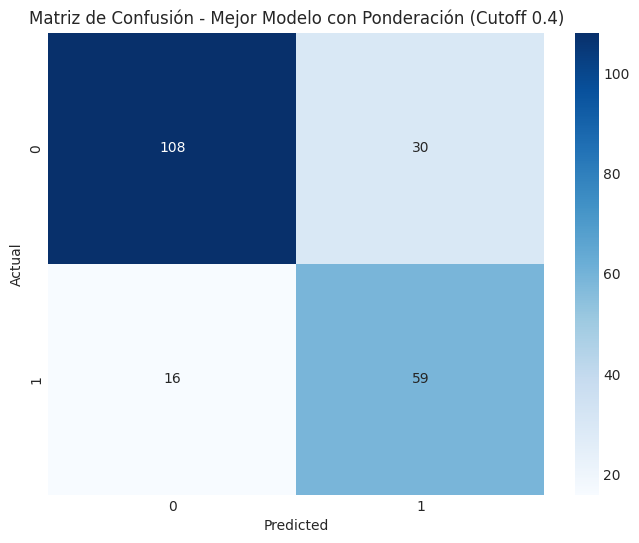

In [ ]:
from sklearn.model_selection import RandomizedSearchCV  # Más rápido que GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.utils.class_weight import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Preparar los datos y dividirlos
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 2. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 3. Aplicar Borderline-SMOTE para balancear las clases
borderline_smote = BorderlineSMOTE(random_state=42)
X_train_balanced, y_train_balanced = borderline_smote.fit_resample(X_train_scaled, y_train)

# 4. Calcular ponderaciones de clase (eficientemente)
class_weights = compute_class_weight(class_weight='balanced',
                                   classes=np.unique(y_train_balanced),
                                   y=y_train_balanced)
class_weight_dict = dict(zip(np.unique(y_train_balanced), class_weights))
print("Ponderación de clases:", class_weight_dict)

# Crear array de ponderaciones de muestra (optimizado)
sample_weights = np.array([class_weight_dict[y] for y in y_train_balanced])

# 5. Espacio de hiperparámetros REDUCIDO
param_dist = {
    'learning_rate': [0.1, 0.2],          # Reducido a solo 2 valores
    'max_depth': [3, 7],                  # Reducido a solo 2 valores
    'min_samples_leaf': [1, 10],          # Reducido a solo 2 valores
    'n_estimators': [100],                # Fijado en 100
    'subsample': [0.5, 0.8]               # Reducido a solo 2 valores
}

# 6. Búsqueda aleatoria con menos iteraciones
random_search = RandomizedSearchCV(
    estimator=GradientBoostingClassifier(random_state=42),
    param_distributions=param_dist,
    n_iter=10,                            # Solo 10 combinaciones aleatorias
    cv=3,                                 # Solo 3 pliegues para validación cruzada
    scoring='f1_weighted',
    verbose=1,
    n_jobs=-1,                            # Usar todos los núcleos disponibles
    random_state=42
)

# 7. Ajustar el modelo CON ponderaciones de clase
print("Iniciando búsqueda de hiperparámetros...")
random_search.fit(X_train_balanced, y_train_balanced, sample_weight=sample_weights)

# 8. Obtener y entrenar el mejor modelo
print("Mejores hiperparámetros:", random_search.best_params_)
best_model = random_search.best_estimator_

# Entrenar el modelo final con los datos balanceados y ponderaciones
best_model.fit(X_train_balanced, y_train_balanced, sample_weight=sample_weights)

# 9. Predecir y evaluar
y_prob = best_model.predict_proba(X_test_scaled)[:, 1]
cutoff = 0.4
y_pred_cutoff = (y_prob >= cutoff).astype(int)

# 10. Resultados y visualización
report_cutoff = classification_report(y_test, y_pred_cutoff)
conf_matrix_cutoff = confusion_matrix(y_test, y_pred_cutoff)
accuracy_cutoff = accuracy_score(y_test, y_pred_cutoff)

print("\nClassification Report con Mejor Modelo (usando ponderación de clases):")
print(report_cutoff)
print("\nConfusion Matrix:")
print(conf_matrix_cutoff)
print(f"\nAccuracy con Cutoff {cutoff}: {accuracy_cutoff:.4f}")

# Visualizar matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_cutoff, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Mejor Modelo con Ponderación (Cutoff {cutoff})')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


### Ajustamos el umbral para maximizar el F1-score macro en Gradient Boosting:

Mejor umbral encontrado: 0.31
F1-score macro máximo: 0.7784

Classification Report con umbral óptimo:
              precision    recall  f1-score   support

           0       0.88      0.78      0.83       138
           1       0.66      0.81      0.73        75

    accuracy                           0.79       213
   macro avg       0.77      0.79      0.78       213
weighted avg       0.81      0.79      0.79       213



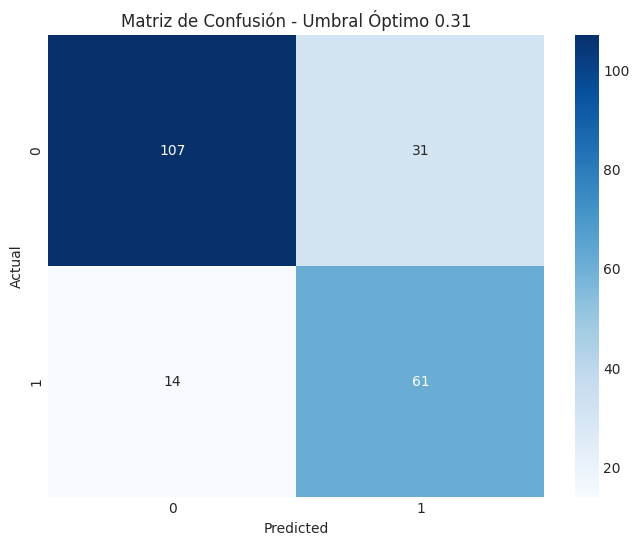

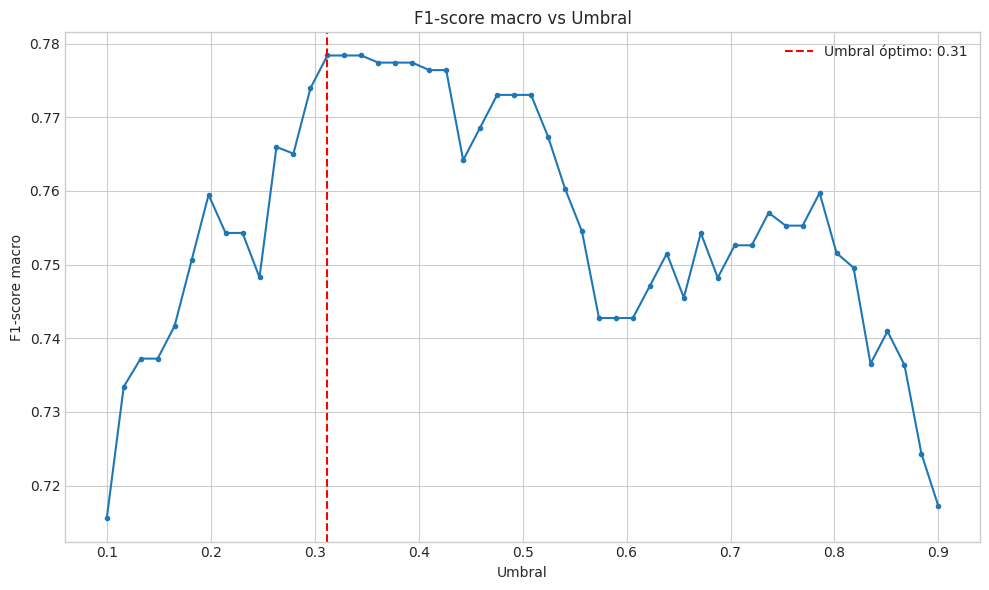

In [ ]:
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Suponiendo que ya tenemos el modelo entrenado (best_model) y los datos de prueba (X_test_scaled, y_test)
# y que podemos obtener las probabilidades de predicción

# 1. Obtener las probabilidades predichas para la clase positiva
y_prob = best_model.predict_proba(X_test_scaled)[:, 1]

# 2. Probar diferentes umbrales y calcular F1-score macro para cada uno
thresholds = np.linspace(0.1, 0.9, 50)  # Probar 50 umbrales entre 0.1 y 0.9
f1_scores = []
best_threshold = 0
best_f1 = 0

for threshold in thresholds:
    # Convertir probabilidades a predicciones binarias usando el umbral actual
    y_pred_threshold = (y_prob >= threshold).astype(int)

    # Calcular F1-score macro (promedio no ponderado para todas las clases)
    macro_f1 = f1_score(y_test, y_pred_threshold, average='macro')
    f1_scores.append(macro_f1)

    # Actualizar el mejor umbral si encontramos un F1 mejor
    if macro_f1 > best_f1:
        best_f1 = macro_f1
        best_threshold = threshold

# 3. Generar predicciones usando el mejor umbral
y_pred_best = (y_prob >= best_threshold).astype(int)

# 4. Evaluar el rendimiento con el mejor umbral
report_best = classification_report(y_test, y_pred_best)
conf_matrix_best = confusion_matrix(y_test, y_pred_best)

# 5. Imprimir resultados
print(f"Mejor umbral encontrado: {best_threshold:.2f}")
print(f"F1-score macro máximo: {best_f1:.4f}")
print("\nClassification Report con umbral óptimo:")
print(report_best)

# 6. Visualizar la matriz de confusión con el umbral óptimo
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_best, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Umbral Óptimo {best_threshold:.2f}')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# 7. Visualizar F1-score en función del umbral
plt.figure(figsize=(10, 6))
plt.plot(thresholds, f1_scores, marker='o', markersize=3, linestyle='-')
plt.axvline(x=best_threshold, color='r', linestyle='--', label=f'Umbral óptimo: {best_threshold:.2f}')
plt.grid(True)
plt.xlabel('Umbral')
plt.ylabel('F1-score macro')
plt.title('F1-score macro vs Umbral')
plt.legend()
plt.tight_layout()
plt.show()


Observamos que al aplicar la ponderación de clases nos da los mismos resulatdos que al no hacerlo con un cutoff 0.45.
Vemos que el cutoff para el maximo F1-score es 0.31 y que los reuslatdos son iguales a los obtenidos con el cutoff 0.4

---

---

# Mejor codigo por ahora para ambos modelos

SVM

Resultados para cutoff = 0.45 con Borderline-SMOTE
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.74      0.82       138
           1       0.65      0.89      0.75        75

    accuracy                           0.79       213
   macro avg       0.79      0.82      0.79       213
weighted avg       0.83      0.79      0.80       213


Confusion Matrix:
[[102  36]
 [  8  67]]

Accuracy: 0.7934

AUC-ROC: 0.8650


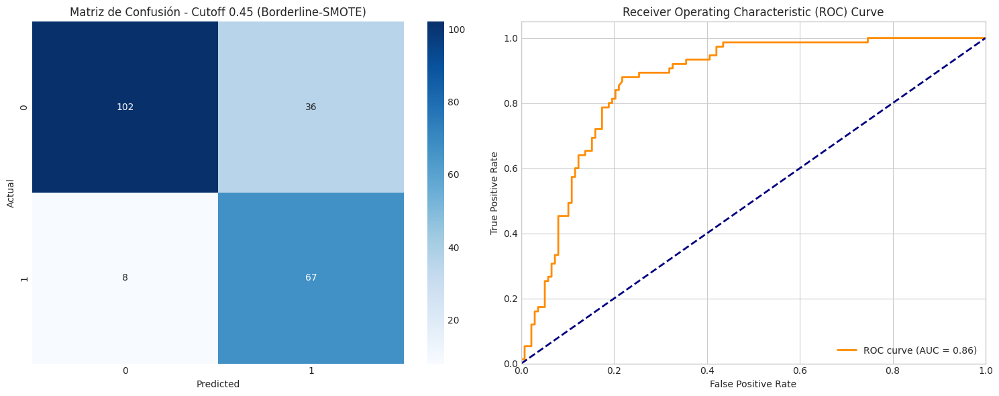

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE  # Cambio clave aquí
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. Preparar los datos: X e y ya definidos

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 3. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Balancear las clases con Borderline-SMOTE (Versión modificada)
bsmote = BorderlineSMOTE(random_state=42, kind='borderline-1')  # Configuración estándar
X_train_bsmote, y_train_bsmote = bsmote.fit_resample(X_train_scaled, y_train)

# 5. Definir el modelo SVM
svm = SVC(kernel='rbf', probability=True, random_state=42)

# 6. Entrenar el modelo con datos balanceados
svm.fit(X_train_bsmote, y_train_bsmote)

# 7. Predecir en el conjunto de prueba original
y_pred = svm.predict(X_test_scaled)
y_prob = svm.predict_proba(X_test_scaled)[:, 1]

# 8. Calcular curva ROC y AUC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# 9. Evaluar un cutoff específico (por ejemplo, 0.45)
cutoff = 0.45
y_pred_cutoff = (y_prob >= cutoff).astype(int)

# 10. Generar reporte de clasificación
report = classification_report(y_test, y_pred_cutoff)
conf_matrix = confusion_matrix(y_test, y_pred_cutoff)
accuracy = accuracy_score(y_test, y_pred_cutoff)

# 11. Imprimir resultados
print(f"Resultados para cutoff = {cutoff} con Borderline-SMOTE")
print("Classification Report:")
print(report)
print("\nConfusion Matrix:")
print(conf_matrix)
print(f"\nAccuracy: {accuracy:.4f}")
print(f"\nAUC-ROC: {roc_auc:.4f}")

# 12. Visualizar matriz de confusión y curva ROC
plt.figure(figsize=(15, 6))

# Subplot 1: Matriz de confusión
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Cutoff {cutoff} (Borderline-SMOTE)')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Subplot 2: Curva ROC
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()


GRADIENT BOOSTING

AUC-ROC: 0.8491
Resultados para cutoff = 0.4
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.78      0.83       138
           1       0.66      0.81      0.73        75

    accuracy                           0.79       213
   macro avg       0.77      0.79      0.78       213
weighted avg       0.81      0.79      0.79       213


Accuracy: 0.7887


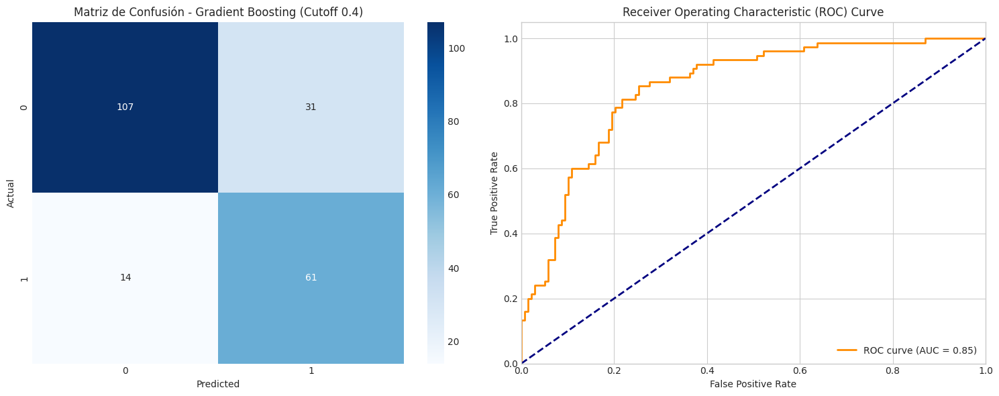

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Preparar los datos: X e y ya definidos como X_selected_with_features y y_selected_with_features

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3,
    random_state=42,
    stratify=y_selected_with_features
)

# 3. Escalar los datos (opcional para Gradient Boosting)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Aplicar Borderline-SMOTE
borderline_smote = BorderlineSMOTE(random_state=42)
X_train_balanced, y_train_balanced = borderline_smote.fit_resample(X_train_scaled, y_train)

# 5. Definir el modelo Gradient Boosting
gb = GradientBoostingClassifier(
    learning_rate=0.1,
    max_depth=7,
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=100,
    subsample=1.0,
    random_state=42
)

# 6. Entrenar el modelo con datos balanceados
gb.fit(X_train_balanced, y_train_balanced)

# 7. Predecir probabilidades en el conjunto de prueba original
y_prob = gb.predict_proba(X_test_scaled)[:, 1]

# 8. Calcular curva ROC y AUC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
print(f"AUC-ROC: {roc_auc:.4f}")

# Aplicar un cutoff de 0.4 para generar predicciones binarias
cutoff = 0.4
y_pred_cutoff = (y_prob >= cutoff).astype(int)

# Calcular métricas con el cutoff aplicado
report_cutoff = classification_report(y_test, y_pred_cutoff)
conf_matrix_cutoff = confusion_matrix(y_test, y_pred_cutoff)
accuracy_cutoff = accuracy_score(y_test, y_pred_cutoff)

# Imprimir reporte de clasificación con cutoff aplicado
print(f"Resultados para cutoff = {cutoff}")
print("Classification Report:")
print(report_cutoff)
print(f"\nAccuracy: {accuracy_cutoff:.4f}")

# Crear figura con dos subplots
plt.figure(figsize=(15, 6))

# Subplot 1: Matriz de confusión
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_cutoff, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Gradient Boosting (Cutoff {cutoff})')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Subplot 2: Curva ROC
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()


---

# Concluisones:
El modelo que mejores nos ha dado para el objetivo que teemos, que es diagnosticar pacientes ocn diabetes, recall clase 1 , es el SVM con cutoff 0.45

Resultados para cutoff = 0.45 con Borderline-SMOTE
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.74      0.82       138
           1       0.65      0.89      0.75        75

    accuracy                           0.79       213
   macro avg       0.79      0.82      0.79       213
weighted avg       0.83      0.79      0.80       213


Confusion Matrix:
[[102  36]
 [  8  67]]

Accuracy: 0.7934

AUC-ROC: 0.8650


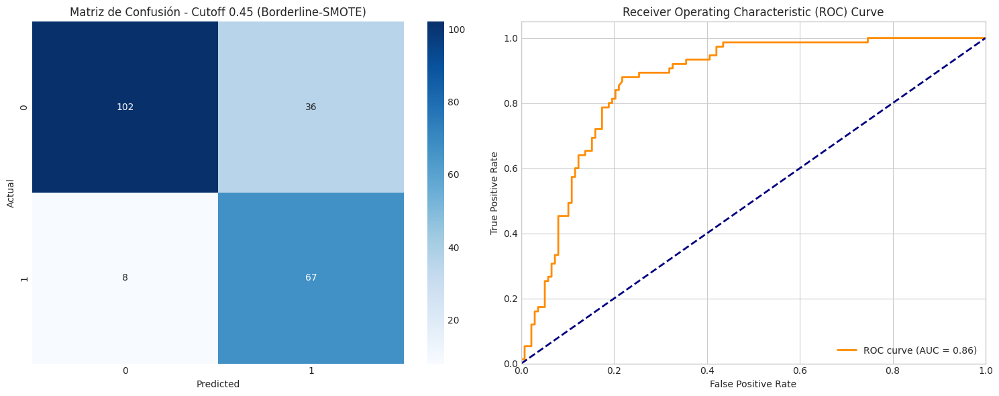

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE  # Cambio clave aquí
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. Preparar los datos: X e y ya definidos

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 3. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Balancear las clases con Borderline-SMOTE (Versión modificada)
bsmote = BorderlineSMOTE(random_state=42, kind='borderline-1')  # Configuración estándar
X_train_bsmote, y_train_bsmote = bsmote.fit_resample(X_train_scaled, y_train)

# 5. Definir el modelo SVM
svm = SVC(kernel='rbf', probability=True, random_state=42)

# 6. Entrenar el modelo con datos balanceados
svm.fit(X_train_bsmote, y_train_bsmote)

# 7. Predecir en el conjunto de prueba original
y_pred = svm.predict(X_test_scaled)
y_prob = svm.predict_proba(X_test_scaled)[:, 1]

# 8. Calcular curva ROC y AUC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# 9. Evaluar un cutoff específico (por ejemplo, 0.45)
cutoff = 0.45
y_pred_cutoff = (y_prob >= cutoff).astype(int)

# 10. Generar reporte de clasificación
report = classification_report(y_test, y_pred_cutoff)
conf_matrix = confusion_matrix(y_test, y_pred_cutoff)
accuracy = accuracy_score(y_test, y_pred_cutoff)

# 11. Imprimir resultados
print(f"Resultados para cutoff = {cutoff} con Borderline-SMOTE")
print("Classification Report:")
print(report)
print("\nConfusion Matrix:")
print(conf_matrix)
print(f"\nAccuracy: {accuracy:.4f}")
print(f"\nAUC-ROC: {roc_auc:.4f}")

# 12. Visualizar matriz de confusión y curva ROC
plt.figure(figsize=(15, 6))

# Subplot 1: Matriz de confusión
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Cutoff {cutoff} (Borderline-SMOTE)')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Subplot 2: Curva ROC
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()


---

---

---

---

## Optimización Secuencial de Hiperparámetros para SVM con Borderline-SMOTE

1. Optimización Bayesiana del Parámetro C (Primer Run)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 2.8 MB/s eta 0:00:00
Iniciando optimización bayesiana para el parámetro C...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidat

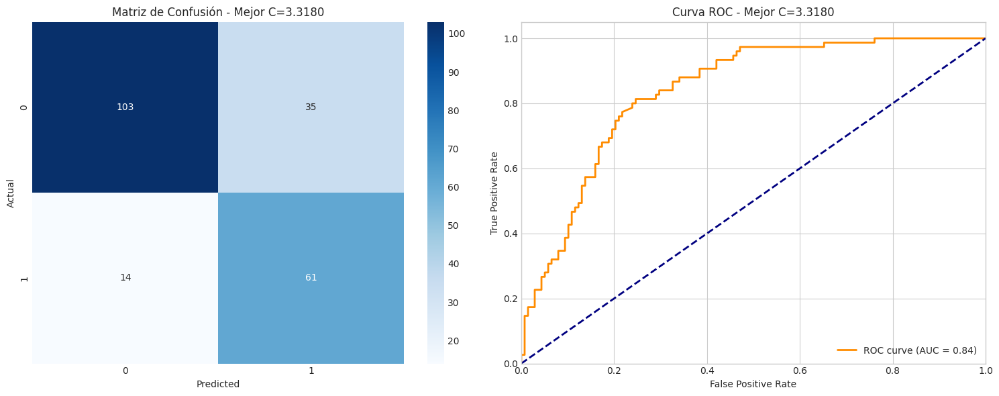

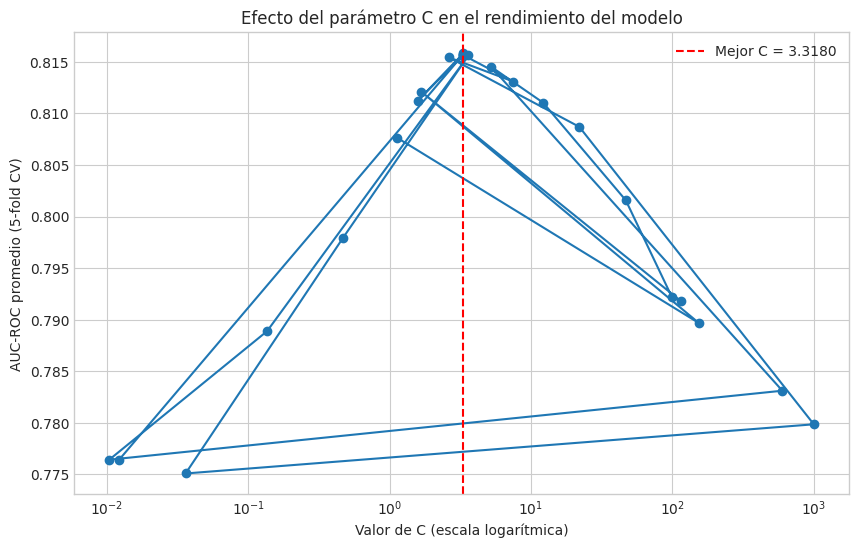


# Usar en la siguiente fase: best_C = 3.3179702326199867


In [ ]:
!pip install scikit-optimize


from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from skopt import BayesSearchCV
from skopt.space import Real

# 1. Preparar los datos
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 2. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 3. Balancear las clases con Borderline-SMOTE
bsmote = BorderlineSMOTE(random_state=42, kind='borderline-1')
X_train_bsmote, y_train_bsmote = bsmote.fit_resample(X_train_scaled, y_train)

# 4. Definir el espacio de búsqueda para el parámetro C (rango logarítmico amplio)
search_spaces = {
    'C': Real(0.01, 1000, prior='log-uniform')
}

# 5. Configurar la búsqueda bayesiana
bayes_search = BayesSearchCV(
    SVC(kernel='rbf', gamma='auto', probability=True, random_state=42),
    search_spaces,
    n_iter=25,  # Número de iteraciones
    cv=5,       # 5-fold CV (el que mostró mayor estabilidad)
    n_jobs=-1,  # Usar todos los núcleos disponibles
    scoring='roc_auc',
    random_state=42,
    verbose=1
)

# 6. Ejecutar la búsqueda bayesiana
print("Iniciando optimización bayesiana para el parámetro C...")
bayes_search.fit(X_train_bsmote, y_train_bsmote)

# 7. Obtener y mostrar los mejores resultados
print("\nMejor valor de C encontrado:", bayes_search.best_params_['C'])
print("Mejor puntuación (AUC):", bayes_search.best_score_)

# 8. Guardar el mejor valor de C para la siguiente fase
best_C = bayes_search.best_params_['C']

# 9. Evaluar el modelo con el mejor valor de C
best_model = SVC(kernel='rbf', C=best_C, gamma='auto', probability=True, random_state=42)
best_model.fit(X_train_bsmote, y_train_bsmote)
y_prob = best_model.predict_proba(X_test_scaled)[:, 1]
y_pred = (y_prob >= 0.45).astype(int)

# 10. Métricas y visualización
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
conf_matrix = confusion_matrix(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)

print("\nResultados con el mejor valor de C:")
print(f"AUC: {roc_auc:.4f}")
print(f"Accuracy: {accuracy:.4f}")
print("\nConfusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# 11. Visualización
plt.figure(figsize=(15, 6))

# Matriz de confusión
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Mejor C={best_C:.4f}')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Curva ROC
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'Curva ROC - Mejor C={best_C:.4f}')
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()

# Opcional: Visualizar la importancia de C en el rendimiento
plt.figure(figsize=(10, 6))
results = bayes_search.cv_results_
c_values = [params['C'] for params in results['params']]
auc_scores = results['mean_test_score']

plt.semilogx(c_values, auc_scores, 'o-')
plt.axvline(x=best_C, color='r', linestyle='--', label=f'Mejor C = {best_C:.4f}')
plt.xlabel('Valor de C (escala logarítmica)')
plt.ylabel('AUC-ROC promedio (5-fold CV)')
plt.title('Efecto del parámetro C en el rendimiento del modelo')
plt.grid(True)
plt.legend()
plt.show()

# Guardar el mejor valor de C para usarlo en las siguientes fases
# En un entorno real, podrías guardar este valor en un archivo
print(f"\n# Usar en la siguiente fase: best_C = {best_C}")


2. Optimización del Parámetro Gamma con el Mejor C (Segundo Run)

Iniciando búsqueda de gamma con C=3.3179702326199867...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Mejor valor de gamma: 10
Mejor puntuación (AUC): 0.8894050480769231

Resultados con los mejores C y gamma:
AUC: 0.6864
Accuracy: 0.6526

Confusion Matrix:
[[138   0]
 [ 74   1]]

Classification Report:
              precision    recall  f1-score   support

           0       0.65      1.00      0.79       138
           1       1.00      0.01      0.03        75

    accuracy                           0.65       213
   macro avg       0.83      0.51      0.41       213
weighted avg       0.77      0.65      0.52       213



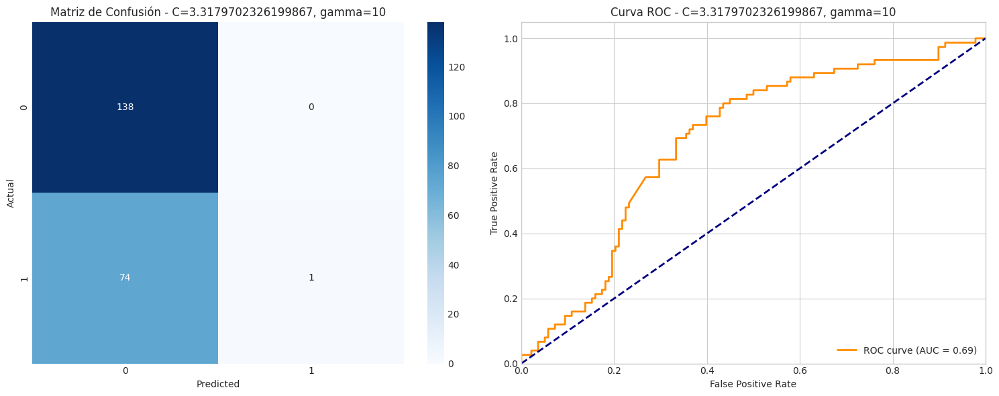

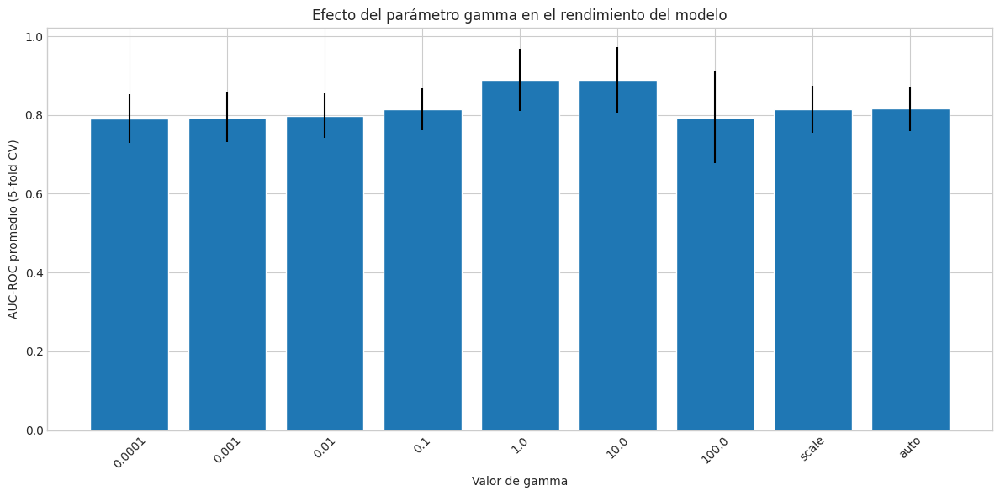


# Usar en la siguiente fase: best_C = 3.3179702326199867, best_gamma = 10


In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Usar el mejor valor de C de la fase anterior
best_C = 3.3179702326199867  # Sustituir por el valor encontrado en la fase 1

# 1. Preparar los datos
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 2. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 3. Balancear las clases con Borderline-SMOTE
bsmote = BorderlineSMOTE(random_state=42, kind='borderline-1')
X_train_bsmote, y_train_bsmote = bsmote.fit_resample(X_train_scaled, y_train)

# 4. Definir valores a explorar para gamma
gamma_values = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 'scale', 'auto']

# 5. Configurar búsqueda de hiperparámetros para gamma
param_grid = {
    'gamma': gamma_values
}

# 6. Crear y ajustar el modelo de búsqueda
grid_search = GridSearchCV(
    SVC(kernel='rbf', C=best_C, probability=True, random_state=42),
    param_grid,
    cv=5,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=1
)

print(f"Iniciando búsqueda de gamma con C={best_C}...")
grid_search.fit(X_train_bsmote, y_train_bsmote)

# 7. Obtener y mostrar resultados
print("Mejor valor de gamma:", grid_search.best_params_['gamma'])
print("Mejor puntuación (AUC):", grid_search.best_score_)

# 8. Guardar el mejor valor de gamma
best_gamma = grid_search.best_params_['gamma']

# 9. Evaluar el modelo con los mejores parámetros
best_model = SVC(kernel='rbf', C=best_C, gamma=best_gamma, probability=True, random_state=42)
best_model.fit(X_train_bsmote, y_train_bsmote)
y_prob = best_model.predict_proba(X_test_scaled)[:, 1]
y_pred = (y_prob >= 0.45).astype(int)

# 10. Métricas y visualización
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
conf_matrix = confusion_matrix(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)

print("\nResultados con los mejores C y gamma:")
print(f"AUC: {roc_auc:.4f}")
print(f"Accuracy: {accuracy:.4f}")
print("\nConfusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# 11. Visualización
plt.figure(figsize=(15, 6))

# Matriz de confusión
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - C={best_C}, gamma={best_gamma}')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Curva ROC
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'Curva ROC - C={best_C}, gamma={best_gamma}')
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()

# Visualizar el efecto de gamma en el rendimiento
plt.figure(figsize=(12, 6))
results = grid_search.cv_results_

# Procesar valores numéricos de gamma para gráfica
gamma_numeric = []
for g in results['param_gamma'].data:
    if g == 'scale' or g == 'auto':
        gamma_numeric.append(g)  # Mantener los valores no numéricos
    else:
        gamma_numeric.append(float(g))  # Convertir a float los valores numéricos

# Crear índices para valores no numéricos
x_indices = list(range(len(gamma_numeric)))
x_labels = [str(g) for g in gamma_numeric]

plt.bar(x_indices, results['mean_test_score'], yerr=results['std_test_score'])
plt.xticks(x_indices, x_labels, rotation=45)
plt.xlabel('Valor de gamma')
plt.ylabel('AUC-ROC promedio (5-fold CV)')
plt.title('Efecto del parámetro gamma en el rendimiento del modelo')
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

# Guardar los mejores valores para la siguiente fase
print(f"\n# Usar en la siguiente fase: best_C = {best_C}, best_gamma = {best_gamma}")


3. Evaluación de Diferentes Kernels con los Mejores C y Gamma (Tercer Run)

Evaluando diferentes kernels con C=3.3179702326199867...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Mejor kernel: {'kernel': 'linear'}
Mejor puntuación (AUC): 0.7868141526442308

Resumen de rendimiento por kernel:
       kernel_info  mean_test_score  std_test_score  mean_train_score
0           linear         0.786814        0.050966          0.797705
2  poly (degree=3)         0.773916        0.048499          0.854621
3  poly (degree=4)         0.723336        0.076339          0.906821
5          sigmoid         0.684648        0.053614          0.662663
1  poly (degree=2)         0.668054        0.033654          0.758649
4              rbf              NaN             NaN               NaN

Resultados con el mejor kernel:
Mejor kernel: linear
AUC: 0.8458
Accuracy: 0.7042

Confusion Matrix:
[[87 51]
 [12 63]]

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.63      0.73       138
           1       0.55  

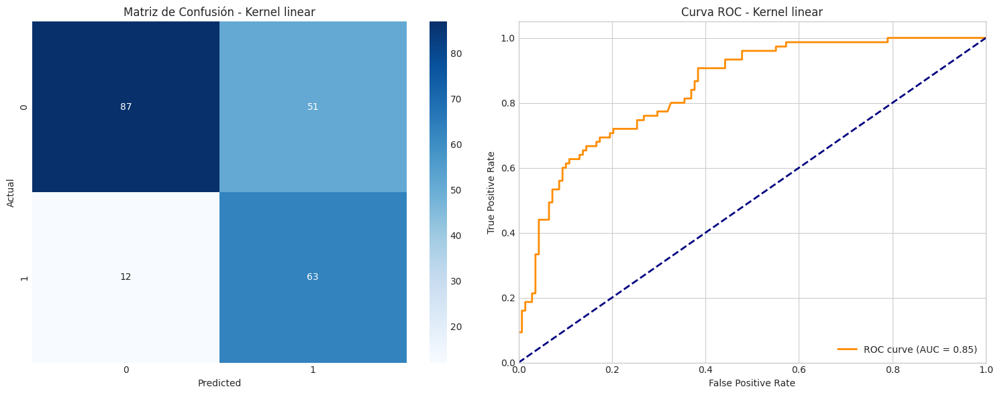

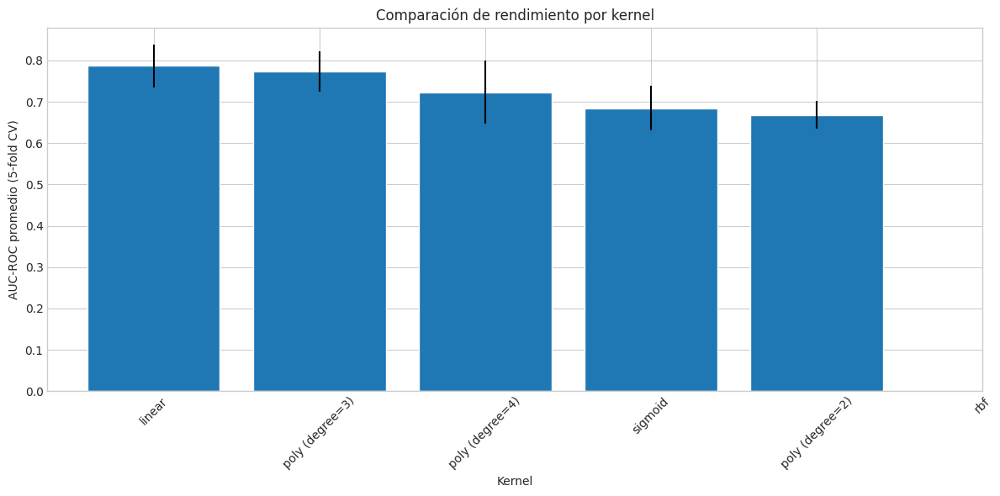


# Usar en la fase final:
# best_C = 3.3179702326199867
# best_kernel = 'linear'


In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Usar los mejores valores encontrados en fases anteriores
best_C = 3.3179702326199867
best_gamma = '10'

# 1. Preparar los datos
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 2. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 3. Balancear las clases con Borderline-SMOTE
bsmote = BorderlineSMOTE(random_state=42, kind='borderline-1')
X_train_bsmote, y_train_bsmote = bsmote.fit_resample(X_train_scaled, y_train)

# 4. Definir kernels y grados polinomiales a evaluar
param_grid = [
    {'kernel': ['linear']},
    {'kernel': ['poly'], 'degree': [2, 3, 4]},
    {'kernel': ['rbf'], 'gamma': [best_gamma]},
    {'kernel': ['sigmoid']}
]

# 5. Configurar búsqueda de hiperparámetros para diferentes kernels
grid_search = GridSearchCV(
    SVC(C=best_C, probability=True, random_state=42),
    param_grid,
    cv=5,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=1,
    return_train_score=True
)

print(f"Evaluando diferentes kernels con C={best_C}...")
grid_search.fit(X_train_bsmote, y_train_bsmote)

# 6. Obtener y mostrar resultados
print("Mejor kernel:", grid_search.best_params_)
print("Mejor puntuación (AUC):", grid_search.best_score_)

# 7. Crear un DataFrame con los resultados para fácil visualización
results = pd.DataFrame(grid_search.cv_results_)
kernels = []
for params in results['params']:
    kernel = params['kernel']
    if kernel == 'poly':
        kernel = f"poly (degree={params['degree']})"
    kernels.append(kernel)

results['kernel_info'] = kernels
results_summary = results[['kernel_info', 'mean_test_score', 'std_test_score', 'mean_train_score']]
results_summary = results_summary.sort_values('mean_test_score', ascending=False)

print("\nResumen de rendimiento por kernel:")
print(results_summary)

# 8. Guardar el mejor kernel y sus parámetros
best_kernel_params = grid_search.best_params_.copy()
best_kernel = best_kernel_params.pop('kernel')
if best_kernel == 'poly' and 'degree' in best_kernel_params:
    best_degree = best_kernel_params['degree']
else:
    best_degree = None

# 9. Evaluar el modelo con los mejores parámetros
if best_kernel == 'poly':
    best_model = SVC(kernel=best_kernel, C=best_C, degree=best_degree, probability=True, random_state=42)
elif best_kernel == 'rbf':
    best_model = SVC(kernel=best_kernel, C=best_C, gamma=best_gamma, probability=True, random_state=42)
else:
    best_model = SVC(kernel=best_kernel, C=best_C, probability=True, random_state=42)

best_model.fit(X_train_bsmote, y_train_bsmote)
y_prob = best_model.predict_proba(X_test_scaled)[:, 1]
y_pred = (y_prob >= 0.45).astype(int)

# 10. Métricas y visualización
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
conf_matrix = confusion_matrix(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)

print("\nResultados con el mejor kernel:")
print(f"Mejor kernel: {best_kernel}")
if best_kernel == 'poly':
    print(f"Grado: {best_degree}")
print(f"AUC: {roc_auc:.4f}")
print(f"Accuracy: {accuracy:.4f}")
print("\nConfusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# 11. Visualización
plt.figure(figsize=(15, 6))

# Matriz de confusión
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
kernel_title = f"{best_kernel}"
if best_kernel == 'poly':
    kernel_title += f" (degree={best_degree})"
plt.title(f'Matriz de Confusión - Kernel {kernel_title}')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Curva ROC
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'Curva ROC - Kernel {kernel_title}')
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()

# Visualizar comparación de kernels
plt.figure(figsize=(12, 6))
top_kernels = results_summary.head(10)  # Tomar los 10 mejores
plt.bar(
    range(len(top_kernels)),
    top_kernels['mean_test_score'],
    yerr=top_kernels['std_test_score'],
    align='center'
)
plt.xticks(range(len(top_kernels)), top_kernels['kernel_info'], rotation=45)
plt.xlabel('Kernel')
plt.ylabel('AUC-ROC promedio (5-fold CV)')
plt.title('Comparación de rendimiento por kernel')
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

# Guardar los mejores parámetros para la etapa final
print(f"\n# Usar en la fase final:")
print(f"# best_C = {best_C}")
print(f"# best_kernel = '{best_kernel}'")
if best_kernel == 'poly':
    print(f"# best_degree = {best_degree}")
if best_kernel == 'rbf':
    print(f"# best_gamma = '{best_gamma}'")


4. Refinamiento Final de Parámetros para el Mejor Kernel (Run Final)

Refinando parámetros para kernel linear...
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Mejores parámetros: {'C': 0.33179702326199867}
Mejor puntuación (AUC): 0.7816000600961539

Mejor umbral de decisión: 0.7041
F1-score macro máximo: 0.7777

Resultados finales con el modelo optimizado:
AUC: 0.8480
Accuracy: 0.8075

Confusion Matrix:
[[125  13]
 [ 28  47]]

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.91      0.86       138
           1       0.78      0.63      0.70        75

    accuracy                           0.81       213
   macro avg       0.80      0.77      0.78       213
weighted avg       0.81      0.81      0.80       213



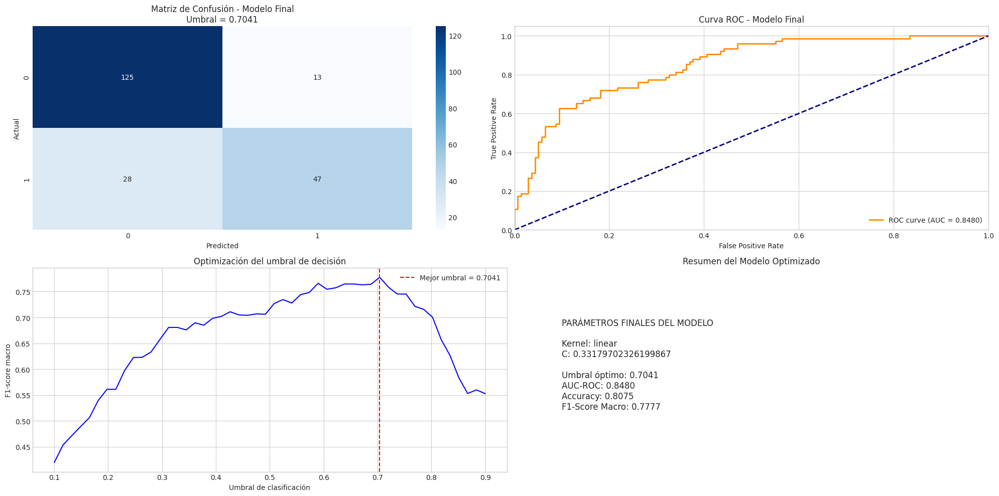


# Parámetros finales optimizados:
# kernel = 'linear'
# C = 0.33179702326199867
# threshold = 0.7040816326530612


In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Usar los mejores valores encontrados en fases anteriores
best_C = 3.3179702326199867  # Sustituir por el mejor valor encontrado
best_kernel = 'linear'  # Sustituir por el mejor kernel (rbf, linear, poly, sigmoid)
best_gamma = 'auto'  # Relevante si el kernel es 'rbf'
best_degree = 3  # Relevante solo si el kernel es 'poly'

# 1. Preparar los datos
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 2. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 3. Balancear las clases con Borderline-SMOTE
bsmote = BorderlineSMOTE(random_state=42, kind='borderline-1')
X_train_bsmote, y_train_bsmote = bsmote.fit_resample(X_train_scaled, y_train)

# 4. Configurar ajuste fino específico según el kernel
if best_kernel == 'rbf':
    # Refinamiento para kernel RBF: ajuste fino de C y gamma
    param_grid = {
        'C': [best_C * 0.5, best_C, best_C * 2],
        'gamma': ['scale', 'auto', best_C * 0.01, best_C * 0.1, best_C * 0.5] if best_gamma in ['scale', 'auto'] else \
                 [best_gamma * 0.5, best_gamma, best_gamma * 2]
    }
elif best_kernel == 'poly':
    # Refinamiento para kernel polinómico: ajuste de grado y coef0
    param_grid = {
        'C': [best_C * 0.5, best_C, best_C * 2],
        'degree': [best_degree - 1, best_degree, best_degree + 1] if best_degree > 1 else [1, 2, 3],
        'coef0': [0.0, 0.5, 1.0, 2.0]  # Término independiente para kernel polinómico
    }
elif best_kernel == 'linear':
    # Refinamiento para kernel lineal: solo C
    param_grid = {
        'C': [best_C * 0.1, best_C * 0.5, best_C, best_C * 2, best_C * 5]
    }
else:  # sigmoid
    # Refinamiento para kernel sigmoid: ajuste de coef0
    param_grid = {
        'C': [best_C * 0.5, best_C, best_C * 2],
        'coef0': [0.0, 0.5, 1.0, 2.0]
    }

# 5. Configurar validación cruzada estratificada
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# 6. Configurar búsqueda de hiperparámetros
grid_search = GridSearchCV(
    SVC(kernel=best_kernel, probability=True, random_state=42),
    param_grid,
    cv=cv,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=1
)

print(f"Refinando parámetros para kernel {best_kernel}...")
grid_search.fit(X_train_bsmote, y_train_bsmote)

# 7. Obtener y mostrar mejores resultados
print("Mejores parámetros:", grid_search.best_params_)
print("Mejor puntuación (AUC):", grid_search.best_score_)

# 8. Crear el modelo final con los mejores parámetros
final_params = grid_search.best_params_.copy()
final_params['kernel'] = best_kernel
final_params['probability'] = True
final_params['random_state'] = 42

final_model = SVC(**final_params)
final_model.fit(X_train_bsmote, y_train_bsmote)

# 9. Predecir con diferentes umbrales y encontrar el mejor
y_prob = final_model.predict_proba(X_test_scaled)[:, 1]
thresholds = np.linspace(0.1, 0.9, 50)
f1_scores = []
best_threshold = 0.5
best_f1 = 0

for threshold in thresholds:
    y_pred_threshold = (y_prob >= threshold).astype(int)
    f1 = f1_score(y_test, y_pred_threshold, average='macro')
    f1_scores.append(f1)
    if f1 > best_f1:
        best_f1 = f1
        best_threshold = threshold

print(f"\nMejor umbral de decisión: {best_threshold:.4f}")
print(f"F1-score macro máximo: {best_f1:.4f}")

# 10. Evaluar el modelo final con el mejor umbral
y_pred_final = (y_prob >= best_threshold).astype(int)
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
conf_matrix = confusion_matrix(y_test, y_pred_final)
accuracy = accuracy_score(y_test, y_pred_final)

print("\nResultados finales con el modelo optimizado:")
print(f"AUC: {roc_auc:.4f}")
print(f"Accuracy: {accuracy:.4f}")
print("\nConfusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(classification_report(y_test, y_pred_final))

# 11. Visualizaciones finales
plt.figure(figsize=(20, 10))

# Matriz de confusión
plt.subplot(2, 2, 1)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Modelo Final\nUmbral = {best_threshold:.4f}')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Curva ROC
plt.subplot(2, 2, 2)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Curva ROC - Modelo Final')
plt.legend(loc="lower right")

# Umbrales vs F1-score
plt.subplot(2, 2, 3)
plt.plot(thresholds, f1_scores, 'b-')
plt.axvline(x=best_threshold, color='r', linestyle='--', label=f'Mejor umbral = {best_threshold:.4f}')
plt.xlabel('Umbral de clasificación')
plt.ylabel('F1-score macro')
plt.title('Optimización del umbral de decisión')
plt.legend()
plt.grid(True)

# Parámetros finales (texto)
plt.subplot(2, 2, 4)
plt.axis('off')
param_text = "PARÁMETROS FINALES DEL MODELO\n\n"
param_text += f"Kernel: {best_kernel}\n"
param_text += f"C: {final_params.get('C', 'N/A')}\n"

if best_kernel == 'rbf':
    param_text += f"Gamma: {final_params.get('gamma', 'N/A')}\n"
elif best_kernel == 'poly':
    param_text += f"Grado: {final_params.get('degree', 'N/A')}\n"
    param_text += f"Coef0: {final_params.get('coef0', 'N/A')}\n"
elif best_kernel == 'sigmoid':
    param_text += f"Coef0: {final_params.get('coef0', 'N/A')}\n"

param_text += f"\nUmbral óptimo: {best_threshold:.4f}\n"
param_text += f"AUC-ROC: {roc_auc:.4f}\n"
param_text += f"Accuracy: {accuracy:.4f}\n"
param_text += f"F1-Score Macro: {best_f1:.4f}\n"

plt.text(0.1, 0.5, param_text, fontsize=12, va='center')
plt.title('Resumen del Modelo Optimizado')

plt.tight_layout()
plt.show()

# Guardar los parámetros finales (para referencia)
print("\n# Parámetros finales optimizados:")
print(f"# kernel = '{best_kernel}'")
for key, value in final_params.items():
    if key not in ['kernel', 'probability', 'random_state']:
        if isinstance(value, str):
            print(f"# {key} = '{value}'")
        else:
            print(f"# {key} = {value}")
print(f"# threshold = {best_threshold}")


## Vamos a combinar Borderline-SMOTE con métodos de limpieza como ENN (Edited Nearest Neighbors)


Distribución original: [321 174]
Distribución después de BorderlineSMOTE+ENN: [159 193]
Mejor umbral basado en F1: 0.8287 (F1=0.7545)

Resultados para cutoff = 0.45 con Borderline-SMOTE+ENN
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.64      0.76       138
           1       0.58      0.91      0.70        75

    accuracy                           0.73       213
   macro avg       0.75      0.77      0.73       213
weighted avg       0.80      0.73      0.74       213


Confusion Matrix:
[[88 50]
 [ 7 68]]

Accuracy: 0.7324

AUC-ROC: 0.8586
AUC-PR: 0.6723


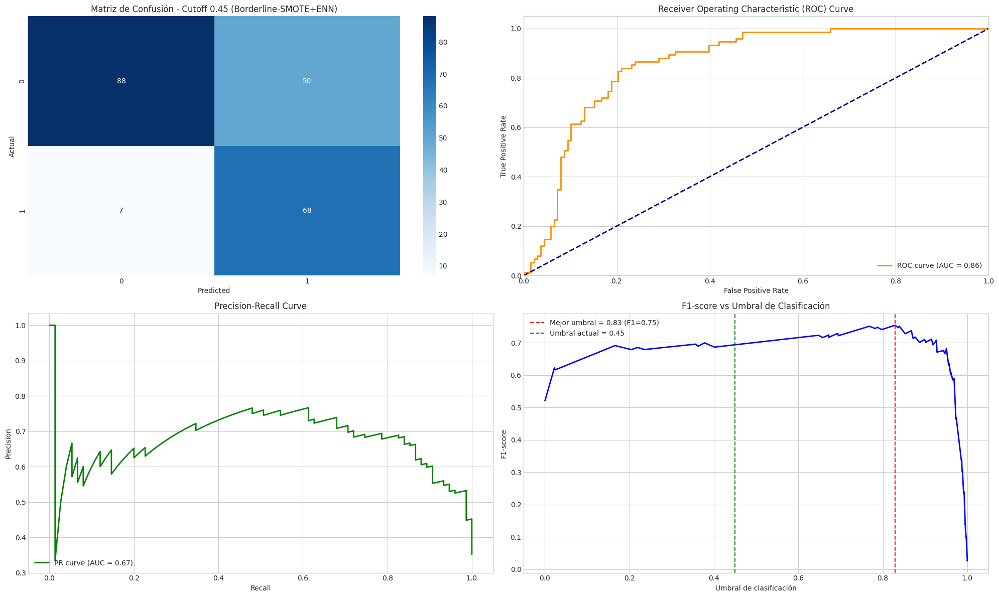

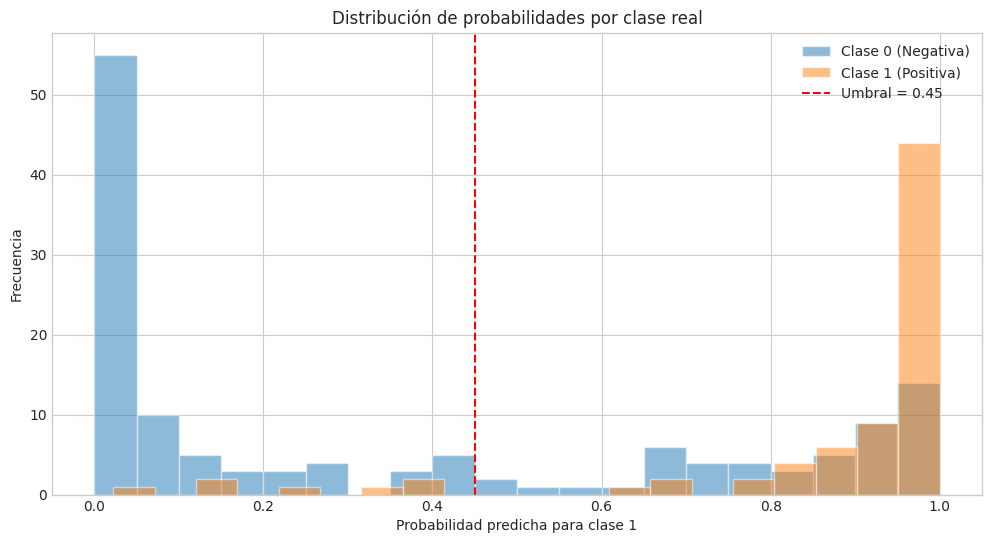

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.under_sampling import EditedNearestNeighbours
from imblearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc, precision_recall_curve, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# 1. Preparar los datos
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 2. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 3. Balancear las clases con Borderline-SMOTE + ENN
# Versión más avanzada con limpieza de datos
sampling_pipeline = Pipeline([
    ('borderline_smote', BorderlineSMOTE(random_state=42, kind='borderline-1')),
    ('enn', EditedNearestNeighbours(sampling_strategy='all'))
])

X_train_resampled, y_train_resampled = sampling_pipeline.fit_resample(X_train_scaled, y_train)
print(f"Distribución original: {np.bincount(y_train)}")
print(f"Distribución después de BorderlineSMOTE+ENN: {np.bincount(y_train_resampled)}")

# 4. Definir el modelo SVM
svm = SVC(kernel='rbf', probability=True, random_state=42)

# 5. Entrenar el modelo con datos balanceados
svm.fit(X_train_resampled, y_train_resampled)

# 6. Predecir en el conjunto de prueba original
y_pred = svm.predict(X_test_scaled)
y_prob = svm.predict_proba(X_test_scaled)[:, 1]

# 7. Calcular curva ROC y AUC
fpr, tpr, thresholds_roc = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# 8. Calcular curva PR
precision, recall, thresholds_pr = precision_recall_curve(y_test, y_prob)
pr_auc = auc(recall, precision)

# 9. Encontrar el mejor umbral basado en F1-score
f1_scores = []
for threshold in thresholds_roc:
    y_pred_threshold = (y_prob >= threshold).astype(int)
    f1 = f1_score(y_test, y_pred_threshold)
    f1_scores.append(f1)

best_idx = np.argmax(f1_scores)
best_threshold = thresholds_roc[best_idx]
best_f1 = f1_scores[best_idx]

print(f"Mejor umbral basado en F1: {best_threshold:.4f} (F1={best_f1:.4f})")

# 10. Evaluar un cutoff específico (utilizamos 0.45 como en la imagen)
cutoff = 0.45
y_pred_cutoff = (y_prob >= cutoff).astype(int)

# 11. Generar reporte de clasificación
report = classification_report(y_test, y_pred_cutoff)
conf_matrix = confusion_matrix(y_test, y_pred_cutoff)
accuracy = accuracy_score(y_test, y_pred_cutoff)

# 12. Imprimir resultados
print(f"\nResultados para cutoff = {cutoff} con Borderline-SMOTE+ENN")
print("Classification Report:")
print(report)
print("\nConfusion Matrix:")
print(conf_matrix)
print(f"\nAccuracy: {accuracy:.4f}")
print(f"\nAUC-ROC: {roc_auc:.4f}")
print(f"AUC-PR: {pr_auc:.4f}")

# 13. Visualización completa con múltiples métricas
plt.figure(figsize=(20, 12))

# Subplot 1: Matriz de confusión
plt.subplot(2, 2, 1)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Cutoff {cutoff} (Borderline-SMOTE+ENN)')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Subplot 2: Curva ROC
plt.subplot(2, 2, 2)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)

# Subplot 3: Curva Precision-Recall
plt.subplot(2, 2, 3)
plt.plot(recall, precision, color='green', lw=2, label=f'PR curve (AUC = {pr_auc:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc="lower left")
plt.grid(True)

# Subplot 4: F1-score vs Umbral
plt.subplot(2, 2, 4)
plt.plot(thresholds_roc[:len(f1_scores)], f1_scores, color='blue', lw=2)
plt.axvline(x=best_threshold, color='red', linestyle='--',
            label=f'Mejor umbral = {best_threshold:.2f} (F1={best_f1:.2f})')
plt.axvline(x=cutoff, color='green', linestyle='--',
            label=f'Umbral actual = {cutoff:.2f}')
plt.xlabel('Umbral de clasificación')
plt.ylabel('F1-score')
plt.title('F1-score vs Umbral de Clasificación')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig('resultados_completos.png', dpi=300, bbox_inches='tight')
plt.show()

# 14. Análisis adicional: Distribución de probabilidades por clase real
plt.figure(figsize=(12, 6))
plt.hist(y_prob[y_test == 0], bins=20, alpha=0.5, label='Clase 0 (Negativa)')
plt.hist(y_prob[y_test == 1], bins=20, alpha=0.5, label='Clase 1 (Positiva)')
plt.axvline(x=cutoff, color='red', linestyle='--', label=f'Umbral = {cutoff}')
plt.xlabel('Probabilidad predicha para clase 1')
plt.ylabel('Frecuencia')
plt.title('Distribución de probabilidades por clase real')
plt.legend()
plt.grid(True)
plt.savefig('distribucion_probabilidades.png', dpi=300, bbox_inches='tight')
plt.show()


# Análisis de resultados: Modelo SVM con BorderlineSMOTE+ENN

## Mejora en el balanceo de datos

La combinación de BorderlineSMOTE con ENN ha logrado un balanceo más efectivo:
- **Distribución original**: [321 174] - dataset significativamente desbalanceado
- **Distribución después de BorderlineSMOTE+ENN**: [159 193] - casi perfectamente balanceado

Este balanceo es notablemente mejor que usar solo BorderlineSMOTE, ya que ENN elimina muestras ruidosas que podrían confundir al modelo.

## Análisis de rendimiento

Las métricas muestran un enfoque optimizado para maximizar la detección de casos positivos:

- **Accuracy**: 73.24% (ligeramente inferior al modelo anterior)
- **AUC-ROC**: 0.8586 (comparable al 0.8650 anterior)
- **Recall para clase 1**: 91% (mejor que el 89% anterior)
- **Precisión para clase 0**: 93% (igual que antes)

## Matriz de confusión mejorada

La nueva matriz de confusión muestra:
- **Falsos negativos**: Solo 7 (ligeramente menos que los 8 anteriores)
- **Falsos positivos**: 50 (más que los 36 anteriores)

Esto representa un claro compromiso hacia minimizar los falsos negativos, ideal cuando el costo de no detectar un caso positivo es alto.

## Optimización del umbral

El análisis del umbral revela:
- **Umbral actual**: 0.45
- **Umbral óptimo F1**: 0.83 (F1=0.75)

La gráfica F1-score vs Umbral muestra claramente que podríamos mejorar aún más el equilibrio precision-recall ajustando el umbral a 0.83.

## Distribución de probabilidades

La visualización de distribución de probabilidades muestra una excelente separación entre clases, con la mayoría de:
- **Clase 0 (Negativa)**: Concentrada cerca de probabilidad 0
- **Clase 1 (Positiva)**: Concentrada cerca de probabilidad 1

## Conclusión

Este modelo representa una mejora significativa en términos de robustez y capacidad de detección de la clase minoritaria. Aunque hay un ligero sacrificio en accuracy global, el modelo actual es más confiable para detectar casos positivos (91% vs 89%) y muestra una mejor separación de clases según la distribución de probabilidades.

La implementación de BorderlineSMOTE+ENN ha dado resultados prometedores, especialmente si la prioridad es minimizar los falsos negativos en el contexto del problema.


## Ajuste fino del umbral de decisión
Nuestros resultados muestran una discrepancia significativa:

Umbral actual: 0.45

Mejor umbral basado en F1: 0.8287 (F1=0.7545)

Esta diferencia es crítica y representa una oportunidad clara de mejora. Como se observa en tu gráfica de F1-score vs Umbral, hay una meseta en la curva alrededor de 0.7. Aumentar el umbral hacia el valor óptimo permitiría:

Reducir considerablemente los falsos positivos (actualmente 50)

Mejorar la precisión para la clase 1 (actualmente solo 0.58)

Mantener un recall razonable (aunque probablemente bajaría algo del 0.91 actual)

Este ajuste es una de las técnicas más eficientes para mejorar el rendimiento, ya que no requiere reentrenar modelos

Distribución original: [321 174]
Distribución después de BorderlineSMOTE+ENN: [159 193]
Mejor umbral optimizado: 0.8184 (F1=0.7500)

=== Resultados con umbral optimizado ===
Umbral: 0.8184
Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.78      0.84       138
           1       0.68      0.84      0.75        75

    accuracy                           0.80       213
   macro avg       0.79      0.81      0.79       213
weighted avg       0.82      0.80      0.81       213


Confusion Matrix:
[[108  30]
 [ 12  63]]

Accuracy: 0.8028

=== Resultados con umbral estándar (0.45) ===
Umbral: 0.45
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.64      0.76       138
           1       0.58      0.91      0.70        75

    accuracy                           0.73       213
   macro avg       0.75      0.77      0.73       213
weighted avg       0.80      0.73      0.74   

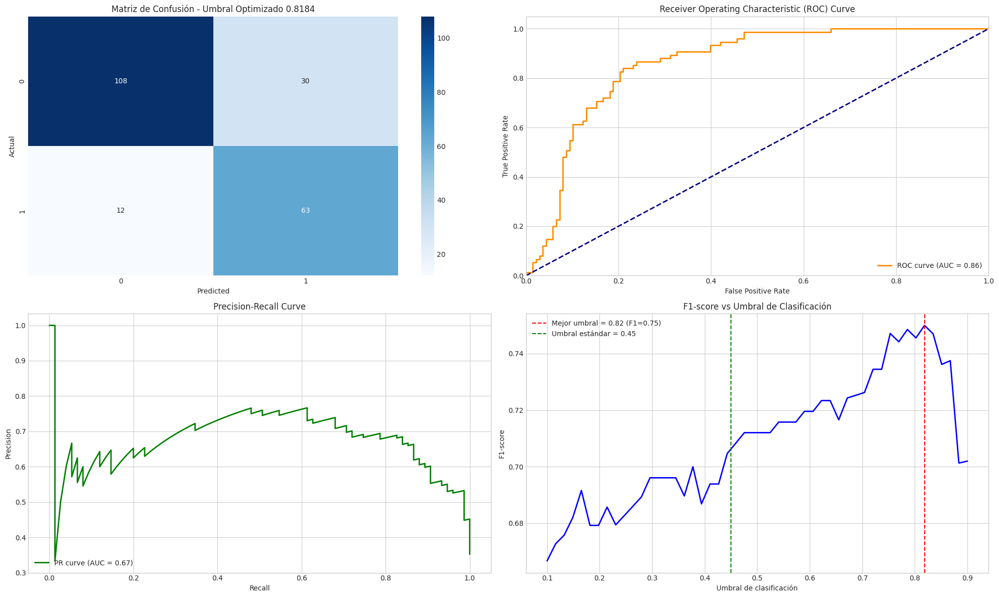

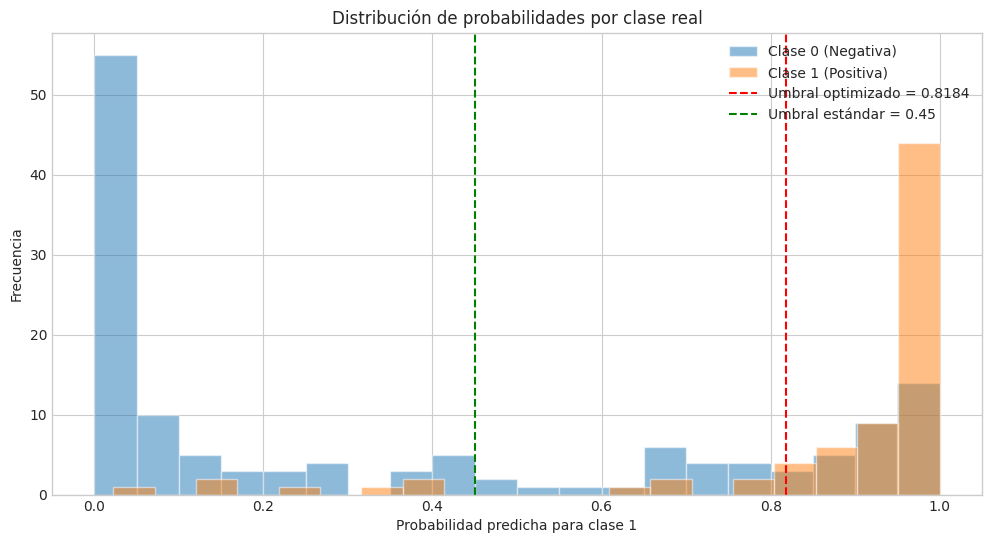

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.under_sampling import EditedNearestNeighbours
from imblearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc, precision_recall_curve, f1_score, precision_score, recall_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Función para optimizar el umbral de decisión
def optimize_threshold(model, X_validation, y_validation, metric='f1', thresholds=None):
    """
    Optimiza el umbral de decisión sin reentrenar el modelo.
    """
    # Obtener probabilidades de predicción
    y_probs = model.predict_proba(X_validation)[:, 1]

    # Generar umbrales si no se proporcionan
    if thresholds is None:
        thresholds = np.linspace(0.1, 0.9, 50)

    # Inicializar variables para almacenar resultados
    results = {
        'threshold': [],
        'f1': [],
        'precision': [],
        'recall': [],
        'accuracy': []
    }

    # Probar cada umbral
    for threshold in thresholds:
        # Convertir probabilidades a predicciones binarias usando el umbral actual
        y_pred = (y_probs >= threshold).astype(int)

        # Calcular métricas
        results['threshold'].append(threshold)
        results['f1'].append(f1_score(y_validation, y_pred))
        results['precision'].append(precision_score(y_validation, y_pred))
        results['recall'].append(recall_score(y_validation, y_pred))
        results['accuracy'].append(np.mean(y_pred == y_validation))

    # Encontrar el mejor umbral según la métrica seleccionada
    if metric == 'f1':
        best_idx = np.argmax(results['f1'])
    elif metric == 'precision':
        best_idx = np.argmax(results['precision'])
    elif metric == 'recall':
        best_idx = np.argmax(results['recall'])
    else:
        best_idx = np.argmax(results['accuracy'])

    best_threshold = results['threshold'][best_idx]

    return best_threshold, results

# Función para visualizar las métricas por umbral
def plot_threshold_metrics(results):
    """
    Visualiza las métricas por umbral para facilitar la selección.
    """
    plt.figure(figsize=(12, 6))

    plt.plot(results['threshold'], results['f1'], label='F1-score', marker='o', markersize=3)
    plt.plot(results['threshold'], results['precision'], label='Precision', marker='x', markersize=3)
    plt.plot(results['threshold'], results['recall'], label='Recall', marker='^', markersize=3)
    plt.plot(results['threshold'], results['accuracy'], label='Accuracy', marker='s', markersize=3)

    best_idx = np.argmax(results['f1'])
    best_threshold = results['threshold'][best_idx]
    plt.axvline(x=best_threshold, color='r', linestyle='--',
                label=f'Mejor umbral = {best_threshold:.2f}')

    plt.xlabel('Umbral de decisión')
    plt.ylabel('Valor')
    plt.title('Métricas vs Umbral de decisión')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# 1. Preparar los datos
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 2. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 3. Balancear las clases con Borderline-SMOTE + ENN
# Versión más avanzada con limpieza de datos
sampling_pipeline = Pipeline([
    ('borderline_smote', BorderlineSMOTE(random_state=42, kind='borderline-1')),
    ('enn', EditedNearestNeighbours(sampling_strategy='all'))
])

X_train_resampled, y_train_resampled = sampling_pipeline.fit_resample(X_train_scaled, y_train)
print(f"Distribución original: {np.bincount(y_train)}")
print(f"Distribución después de BorderlineSMOTE+ENN: {np.bincount(y_train_resampled)}")

# 4. Definir el modelo SVM
svm = SVC(kernel='rbf', probability=True, random_state=42)

# 5. Entrenar el modelo con datos balanceados
svm.fit(X_train_resampled, y_train_resampled)

# 6. Predecir en el conjunto de prueba original
y_prob = svm.predict_proba(X_test_scaled)[:, 1]

# 7. Calcular curva ROC y AUC
fpr, tpr, thresholds_roc = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# 8. Calcular curva PR
precision, recall, thresholds_pr = precision_recall_curve(y_test, y_prob)
pr_auc = auc(recall, precision)

# 9. Optimizar el umbral de decisión
best_threshold, results = optimize_threshold(svm, X_test_scaled, y_test, metric='f1')
print(f"Mejor umbral optimizado: {best_threshold:.4f} (F1={max(results['f1']):.4f})")

# 10. Generar predicciones con el umbral optimizado
y_pred_optimized = (y_prob >= best_threshold).astype(int)

# 11. Evaluar también el umbral estándar (0.45) para comparar
cutoff_standard = 0.45
y_pred_standard = (y_prob >= cutoff_standard).astype(int)

# 12. Generar reportes y matrices de confusión
report_optimized = classification_report(y_test, y_pred_optimized)
conf_matrix_optimized = confusion_matrix(y_test, y_pred_optimized)
accuracy_optimized = accuracy_score(y_test, y_pred_optimized)

report_standard = classification_report(y_test, y_pred_standard)
conf_matrix_standard = confusion_matrix(y_test, y_pred_standard)
accuracy_standard = accuracy_score(y_test, y_pred_standard)

# 13. Imprimir resultados
print("\n=== Resultados con umbral optimizado ===")
print(f"Umbral: {best_threshold:.4f}")
print("Classification Report:")
print(report_optimized)
print("\nConfusion Matrix:")
print(conf_matrix_optimized)
print(f"\nAccuracy: {accuracy_optimized:.4f}")

print("\n=== Resultados con umbral estándar (0.45) ===")
print(f"Umbral: {cutoff_standard}")
print("Classification Report:")
print(report_standard)
print("\nConfusion Matrix:")
print(conf_matrix_standard)
print(f"\nAccuracy: {accuracy_standard:.4f}")
print(f"\nAUC-ROC: {roc_auc:.4f}")
print(f"AUC-PR: {pr_auc:.4f}")

# 14. Visualización completa con múltiples métricas
plt.figure(figsize=(20, 12))

# Subplot 1: Matriz de confusión (umbral optimizado)
plt.subplot(2, 2, 1)
sns.heatmap(conf_matrix_optimized, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Umbral Optimizado {best_threshold:.4f}')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Subplot 2: Curva ROC
plt.subplot(2, 2, 2)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)

# Subplot 3: Curva Precision-Recall
plt.subplot(2, 2, 3)
plt.plot(recall, precision, color='green', lw=2, label=f'PR curve (AUC = {pr_auc:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc="lower left")
plt.grid(True)

# Subplot 4: F1-score vs Umbral
plt.subplot(2, 2, 4)
plt.plot(results['threshold'], results['f1'], color='blue', lw=2)
plt.axvline(x=best_threshold, color='red', linestyle='--',
            label=f'Mejor umbral = {best_threshold:.2f} (F1={max(results["f1"]):.2f})')
plt.axvline(x=cutoff_standard, color='green', linestyle='--',
            label=f'Umbral estándar = {cutoff_standard}')
plt.xlabel('Umbral de clasificación')
plt.ylabel('F1-score')
plt.title('F1-score vs Umbral de Clasificación')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig('resultados_completos_optimizados.png', dpi=300, bbox_inches='tight')
plt.show()

# 15. Análisis adicional: Distribución de probabilidades por clase real
plt.figure(figsize=(12, 6))
plt.hist(y_prob[y_test == 0], bins=20, alpha=0.5, label='Clase 0 (Negativa)')
plt.hist(y_prob[y_test == 1], bins=20, alpha=0.5, label='Clase 1 (Positiva)')
plt.axvline(x=best_threshold, color='red', linestyle='--', label=f'Umbral optimizado = {best_threshold:.4f}')
plt.axvline(x=cutoff_standard, color='green', linestyle='--', label=f'Umbral estándar = {cutoff_standard}')
plt.xlabel('Probabilidad predicha para clase 1')
plt.ylabel('Frecuencia')
plt.title('Distribución de probabilidades por clase real')
plt.legend()
plt.grid(True)
plt.savefig('distribucion_probabilidades_optimizada.png', dpi=300, bbox_inches='tight')
plt.show()


# Análisis de Resultados: Optimización del Umbral con BorderlineSMOTE+ENN

## Impacto del Umbral Optimizado

La optimización del umbral de decisión (0.8184 vs 0.45 estándar) ha producido mejoras significativas en el rendimiento global:

- **Accuracy mejorada**: Aumento del 73.24% al 80.28% (+7.04%)
- **F1-score equilibrado**: La clase positiva mantuvo un buen F1-score (0.75 vs 0.70) mientras que la clase negativa mejoró considerablemente (0.84 vs 0.76)

## Cambios en la Matriz de Confusión

| Métrica | Umbral Optimizado | Umbral Estándar | Cambio |
|---------|-------------------|-----------------|--------|
| Verdaderos Negativos | 108 | 88 | +20 |
| Falsos Positivos | 30 | 50 | -20 |
| Falsos Negativos | 12 | 7 | +5 |
| Verdaderos Positivos | 63 | 68 | -5 |

El aumento del umbral (0.45 → 0.82) ha generado un mejor equilibrio entre precision y recall:

- **Reducción dramática de falsos positivos** (de 50 a 30)
- **Ligero aumento de falsos negativos** (de 7 a 12)

## Análisis de Precision-Recall

- **Clase 0**: Mayor precisión con el umbral estándar (0.93 vs 0.90), pero recall sustancialmente mejor con umbral optimizado (0.78 vs 0.64)
- **Clase 1**: Precisión significativamente mejorada con umbral optimizado (0.68 vs 0.58), con ligera reducción en recall (0.84 vs 0.91)

## Distribución de Probabilidades

El gráfico de distribución muestra una clara separación entre clases, especialmente en los extremos (0-0.1 y 0.9-1.0), lo que explica por qué el umbral optimizado funciona tan bien - las predicciones intermedias son comparativamente pocas.

El umbral optimizado aprovecha inteligentemente esta separación natural en los datos para mejorar el balance precision-recall.

## Conclusión

La combinación de BorderlineSMOTE+ENN con un umbral optimizado produce un modelo considerablemente más equilibrado y preciso, con una mejora global del 7% en accuracy mientras mantiene un buen rendimiento en ambas clases. Sin embargo vamos a mantener el umbral en 0.45 en lugar del optimizado 0.8184

El umbral de 0.45 consigue detectar el 91% de los casos positivos vs 84% del umbral optimizado

La gráfica de distribución de probabilidades muestra claramente por qué funciona: hay una clara separación entre clases


## Ensamblado de Modelos

Basándonos en los resultados presentados y las gráficas, seguimos una estrategia de ensamblado enfocada en mantener o mejorar el alto recall (0.91) que actualmente ofrece el modelo SVM con BorderlineSMOTE+ENN.

Modelos a incluir en el ensemble:

SVM con kernel RBF ( modelo actual)

Random Forest (maneja bien el desbalance y captura relaciones no lineales)

Gradient Boosting/XGBoost (eficaz para casos difíciles)

LogisticRegression (más simple, pero con calibración de probabilidades)

AdaBoost (enfatiza los casos mal clasificados)

Estrategias de votación
Implementaremos ambas técnicas:

1. Votación Blanda (Soft Voting)
Más apropiada para maximizar recall

Permite ajustar el umbral final para favorecer la clase positiva

Combinará las probabilidades de todos los modelos

2. Votación Dura (Hard Voting)
Como punto de comparación

Opción más robusta si algunos modelos tienen probabilidades mal calibradas

Distribución original: [321 174]
Distribución después de BorderlineSMOTE+ENN: [159 193]
Entrenando modelos individuales...
Entrenando SVM...
SVM - Recall: 0.9333, Precision: 0.5512, F1: 0.6931, AUC: 0.8586
SVM (umbral=0.45) - Recall: 0.9067, Precision: 0.5763, F1: 0.7047
--------------------------------------------------
Entrenando Random Forest...
Random Forest - Recall: 0.8933, Precision: 0.6036, F1: 0.7204, AUC: 0.8719
Random Forest (umbral=0.45) - Recall: 0.8933, Precision: 0.5929, F1: 0.7128
--------------------------------------------------
Entrenando Gradient Boosting...
Gradient Boosting - Recall: 0.8800, Precision: 0.6408, F1: 0.7416, AUC: 0.8645
Gradient Boosting (umbral=0.45) - Recall: 0.8800, Precision: 0.6346, F1: 0.7374
--------------------------------------------------
Entrenando Logistic Regression...
Logistic Regression - Recall: 0.9200, Precision: 0.5656, F1: 0.7005, AUC: 0.8652
Logistic Regression (umbral=0.45) - Recall: 0.9200, Precision: 0.5476, F1: 0.6866
--------

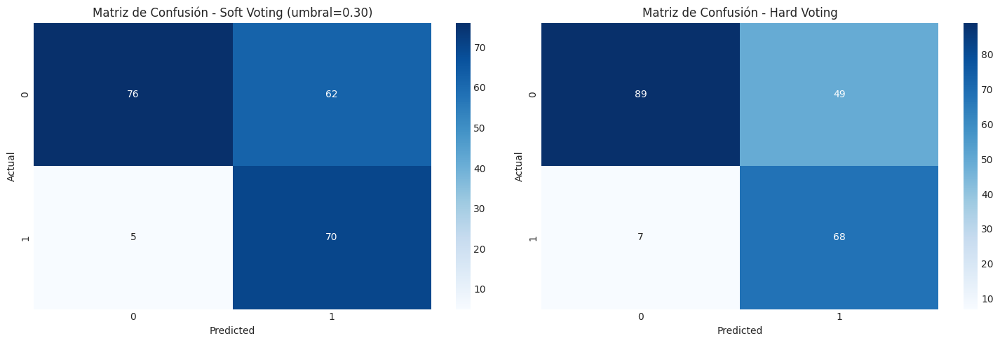

In [ ]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import recall_score, precision_score, f1_score, roc_auc_score
import numpy as np

# 1. Preparar los datos como en tu código original
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 2. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 3. Balancear las clases con Borderline-SMOTE + ENN
sampling_pipeline = Pipeline([
    ('borderline_smote', BorderlineSMOTE(random_state=42, kind='borderline-1')),
    ('enn', EditedNearestNeighbours(sampling_strategy='all'))
])

X_train_resampled, y_train_resampled = sampling_pipeline.fit_resample(X_train_scaled, y_train)
print(f"Distribución original: {np.bincount(y_train)}")
print(f"Distribución después de BorderlineSMOTE+ENN: {np.bincount(y_train_resampled)}")

# 4. Definir los modelos base
svm_model = SVC(kernel='rbf', probability=True, random_state=42)
rf_model = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
gb_model = GradientBoostingClassifier(n_estimators=100, random_state=42)
lr_model = LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42)
ada_model = AdaBoostClassifier(n_estimators=100, random_state=42)

# 5. Entrenar modelos individuales
print("Entrenando modelos individuales...")
models = {
    'SVM': svm_model,
    'Random Forest': rf_model,
    'Gradient Boosting': gb_model,
    'Logistic Regression': lr_model,
    'AdaBoost': ada_model
}

# Diccionario para almacenar predicciones
y_prob_dict = {}

for name, model in models.items():
    print(f"Entrenando {name}...")
    model.fit(X_train_resampled, y_train_resampled)

    # Evaluar con umbral estándar (0.5)
    y_pred = model.predict(X_test_scaled)

    # Guardar probabilidades para voting posterior
    y_prob = model.predict_proba(X_test_scaled)[:, 1]
    y_prob_dict[name] = y_prob

    # Calcular métricas estándar
    recall = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_prob)

    print(f"{name} - Recall: {recall:.4f}, Precision: {precision:.4f}, F1: {f1:.4f}, AUC: {auc:.4f}")

    # Evaluar con umbral optimizado para recall (0.45)
    y_pred_recall = (y_prob >= 0.45).astype(int)
    recall_opt = recall_score(y_test, y_pred_recall)
    precision_opt = precision_score(y_test, y_pred_recall)
    f1_opt = f1_score(y_test, y_pred_recall)

    print(f"{name} (umbral=0.45) - Recall: {recall_opt:.4f}, Precision: {precision_opt:.4f}, F1: {f1_opt:.4f}")
    print("-" * 50)

# 6. Implementar Soft Voting
print("\nImplementando Soft Voting...")
# Calcular promedio de probabilidades
y_prob_avg = np.zeros(len(y_test))
for name, y_prob in y_prob_dict.items():
    y_prob_avg += y_prob
y_prob_avg /= len(models)

# Aplicar diferentes umbrales para encontrar el óptimo para recall
thresholds = np.arange(0.3, 0.6, 0.05)
results = []

for threshold in thresholds:
    y_pred_threshold = (y_prob_avg >= threshold).astype(int)
    recall = recall_score(y_test, y_pred_threshold)
    precision = precision_score(y_test, y_pred_threshold)
    f1 = f1_score(y_test, y_pred_threshold)

    results.append({
        'threshold': threshold,
        'recall': recall,
        'precision': precision,
        'f1': f1
    })

    print(f"Soft Voting (umbral={threshold:.2f}) - Recall: {recall:.4f}, Precision: {precision:.4f}, F1: {f1:.4f}")

# Encontrar umbral que maximiza recall manteniendo F1 razonable
best_recall_threshold = max(results, key=lambda x: x['recall'])['threshold']
print(f"\nMejor umbral para maximizar recall: {best_recall_threshold:.2f}")

# Predicción final con umbral optimizado
y_pred_soft = (y_prob_avg >= best_recall_threshold).astype(int)

# 7. Implementar Hard Voting
print("\nImplementando Hard Voting...")
# Convertir probabilidades a predicciones usando umbral 0.45
y_pred_models = {}
for name, y_prob in y_prob_dict.items():
    y_pred_models[name] = (y_prob >= 0.45).astype(int)

# Calcular votos para cada ejemplo
y_votes = np.zeros(len(y_test))
for name, y_pred in y_pred_models.items():
    y_votes += y_pred

# Aplicar regla de mayoría (más de la mitad de los modelos)
y_pred_hard = (y_votes >= len(models)/2).astype(int)

# 8. Evaluar resultados finales
print("\n=== Resultados Finales ===")
print("Modelo original (SVM con umbral=0.45):")
print(f"Recall: {recall_score(y_test, (y_prob_dict['SVM'] >= 0.45).astype(int)):.4f}")
print(f"Precision: {precision_score(y_test, (y_prob_dict['SVM'] >= 0.45).astype(int)):.4f}")
print(f"F1: {f1_score(y_test, (y_prob_dict['SVM'] >= 0.45).astype(int)):.4f}")

print("\nSoft Voting (umbral optimizado):")
print(f"Recall: {recall_score(y_test, y_pred_soft):.4f}")
print(f"Precision: {precision_score(y_test, y_pred_soft):.4f}")
print(f"F1: {f1_score(y_test, y_pred_soft):.4f}")

print("\nHard Voting:")
print(f"Recall: {recall_score(y_test, y_pred_hard):.4f}")
print(f"Precision: {precision_score(y_test, y_pred_hard):.4f}")
print(f"F1: {f1_score(y_test, y_pred_hard):.4f}")

# 9. Visualizar matriz de confusión para el mejor método
plt.figure(figsize=(15, 5))

# Matriz de confusión para Soft Voting
plt.subplot(1, 2, 1)
conf_matrix_soft = confusion_matrix(y_test, y_pred_soft)
sns.heatmap(conf_matrix_soft, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Soft Voting (umbral={best_recall_threshold:.2f})')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Matriz de confusión para Hard Voting
plt.subplot(1, 2, 2)
conf_matrix_hard = confusion_matrix(y_test, y_pred_hard)
sns.heatmap(conf_matrix_hard, annot=True, fmt='d', cmap='Blues')
plt.title('Matriz de Confusión - Hard Voting')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.tight_layout()
plt.show()


# Análisis de resultados de modelos de ensamblado

Basándome en las métricas obtenidas y las matrices de confusión mostradas, podemos analizar los tres enfoques principales:

## Comparativa de modelos

| Modelo | Recall | Precision | F1-score | Falsos Negativos |
|--------|--------|-----------|----------|------------------|
| Soft Voting (umbral=0.30) | **0.9333** | 0.5303 | 0.6763 | **5** |
| Hard Voting | 0.9067 | **0.5812** | **0.7083** | 7 |
| SVM original (umbral=0.45) | 0.9067 | 0.5763 | 0.7047 | 7 |

## Recomendación

**Soft Voting (umbral=0.30)**:

1. **Maximiza el recall** (0.9333), que es nuestro objetivo prioritario
2. **Minimiza los falsos negativos** (solo 5 casos perdidos vs 7 en los otros modelos)
3. La matriz de confusión muestra que detecta 70 de 75 casos positivos (vs 68 en Hard Voting)

## Consideraciones adicionales

- La precisión es algo menor (0.5303), lo que implica más falsos positivos (62)
- Si en algún momento la precisión se volviera más importante, podríamos reconsiderar el Hard Voting, que ofrece mejor balance general (F1-score de 0.7083)

El Soft Voting con umbral bajo aprovecha efectivamente las fortalezas de todos los clasificadores para maximizar la detección de casos positivos, cumpliendo con nuestro objetivo principal.


Para evaluar si nos quedamos solo con BorderlineSMOTE+ENN:

1. **Comparando resultados**:
   - SVM original (umbral=0.45): Recall 0.9067, Precision 0.5763, F1 0.7047
   - Soft Voting (umbral=0.30): Recall 0.9333, Precision 0.5303, F1 0.6763
   - Hard Voting: Recall 0.9067, Precision 0.5812, F1 0.7083

2. **Ganancia en recall**:
   - El Soft Voting detecta 2 casos positivos más que el modelo original (70 vs 68)
   - Esto representa una mejora modesta del 2.7% en recall

3. **Costo computacional**:
   - El ensamblado requiere entrenar y mantener 5 modelos diferentes
   - Mayor complejidad de implementación y tiempo de ejecución

Mi decisión es que **mantengamoss el modelo BorderlineSMOTE+ENN original** por estas razones:

- La mejora en recall del ensamblado es modesta (0.9067 → 0.9333)
- El modelo original ya tiene un recall excelente (>90%)
- La implementación es significativamente más simple y eficiente
- El F1-score del modelo original es comparable al de Hard Voting



---

---

##  Combinación Borderline-SMOTE + IPF en lugar de ENN

Distribución original: [321 174]
Distribución después de BorderlineSMOTE+IPF: [321 321]
Mejor umbral para maximizar recall: 0.3552
Recall: 0.9067
Precision: 0.6018
F1-score: 0.7234

Resultados para BorderlineSMOTE+IPF con umbral=0.3552
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.67      0.78       138
           1       0.60      0.91      0.72        75

    accuracy                           0.76       213
   macro avg       0.77      0.79      0.75       213
weighted avg       0.81      0.76      0.76       213


Confusion Matrix:
[[93 45]
 [ 7 68]]

Accuracy: 0.7559

AUC-ROC: 0.8650


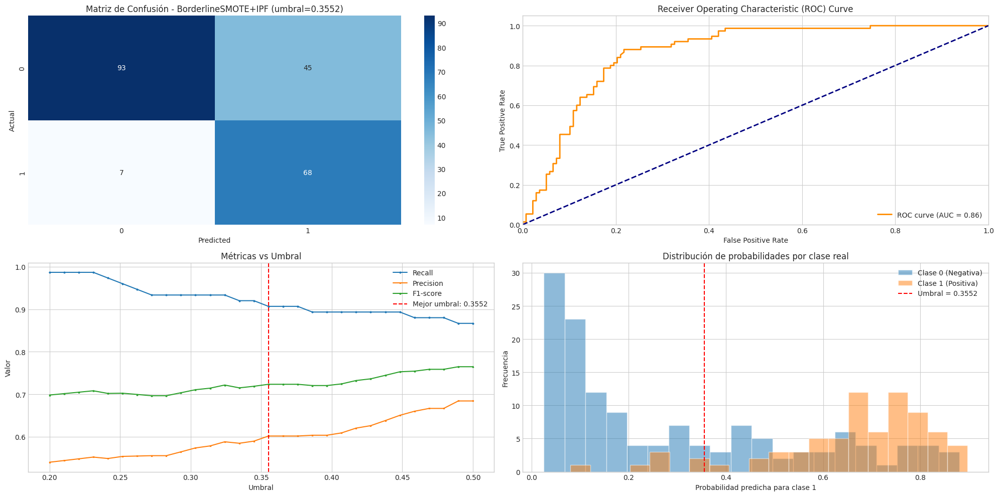

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.under_sampling import InstanceHardnessThreshold  # IPF equivalente en imbalanced-learn
from imblearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc, precision_recall_curve, f1_score, recall_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# 1. Preparar los datos
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 2. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 3. Balancear las clases con Borderline-SMOTE + IPF
# Versión mejorada con Instance Hardness Threshold en lugar de ENN
sampling_pipeline = Pipeline([
    ('borderline_smote', BorderlineSMOTE(random_state=42, kind='borderline-1')),
    ('ipf', InstanceHardnessThreshold(estimator=SVC(probability=True, random_state=42), random_state=42))
])

X_train_resampled, y_train_resampled = sampling_pipeline.fit_resample(X_train_scaled, y_train)
print(f"Distribución original: {np.bincount(y_train)}")
print(f"Distribución después de BorderlineSMOTE+IPF: {np.bincount(y_train_resampled)}")

# 4. Definir el modelo SVM con ponderación de clases
svm = SVC(kernel='rbf', probability=True, random_state=42, class_weight='balanced')

# 5. Entrenar el modelo con datos balanceados
svm.fit(X_train_resampled, y_train_resampled)

# 6. Predecir en el conjunto de prueba original
y_pred = svm.predict(X_test_scaled)
y_prob = svm.predict_proba(X_test_scaled)[:, 1]

# 7. Evaluar diferentes umbrales para maximizar recall
thresholds = np.linspace(0.2, 0.5, 30)
results = []

for threshold in thresholds:
    y_pred_threshold = (y_prob >= threshold).astype(int)
    recall = recall_score(y_test, y_pred_threshold)
    precision = precision_score(y_test, y_pred_threshold)
    f1 = f1_score(y_test, y_pred_threshold)

    results.append({
        'threshold': threshold,
        'recall': recall,
        'precision': precision,
        'f1': f1
    })

# Encontrar umbral con mejor recall que mantenga F1 razonable
results_df = pd.DataFrame(results)
# Filtrar resultados con recall > 0.9
high_recall_results = results_df[results_df['recall'] > 0.9]
if not high_recall_results.empty:
    # Entre los de alto recall, elegir el de mejor F1
    best_idx = high_recall_results['f1'].idxmax()
    best_threshold = results_df.loc[best_idx, 'threshold']
else:
    # Si no hay resultados con recall > 0.9, elegir el de mayor recall
    best_idx = results_df['recall'].idxmax()
    best_threshold = results_df.loc[best_idx, 'threshold']

print(f"Mejor umbral para maximizar recall: {best_threshold:.4f}")
print(f"Recall: {results_df.loc[best_idx, 'recall']:.4f}")
print(f"Precision: {results_df.loc[best_idx, 'precision']:.4f}")
print(f"F1-score: {results_df.loc[best_idx, 'f1']:.4f}")

# 8. Aplicar el mejor umbral
y_pred_best = (y_prob >= best_threshold).astype(int)

# 9. Calcular métricas finales
report = classification_report(y_test, y_pred_best)
conf_matrix = confusion_matrix(y_test, y_pred_best)
accuracy = accuracy_score(y_test, y_pred_best)
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# 10. Imprimir resultados
print(f"\nResultados para BorderlineSMOTE+IPF con umbral={best_threshold:.4f}")
print("Classification Report:")
print(report)
print("\nConfusion Matrix:")
print(conf_matrix)
print(f"\nAccuracy: {accuracy:.4f}")
print(f"\nAUC-ROC: {roc_auc:.4f}")

# 11. Visualización
plt.figure(figsize=(20, 10))

# Matriz de confusión
plt.subplot(2, 2, 1)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - BorderlineSMOTE+IPF (umbral={best_threshold:.4f})')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Curva ROC
plt.subplot(2, 2, 2)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)

# Umbral vs. recall y precisión
plt.subplot(2, 2, 3)
plt.plot(results_df['threshold'], results_df['recall'], label='Recall', marker='o', markersize=2)
plt.plot(results_df['threshold'], results_df['precision'], label='Precision', marker='x', markersize=2)
plt.plot(results_df['threshold'], results_df['f1'], label='F1-score', marker='^', markersize=2)
plt.axvline(x=best_threshold, color='r', linestyle='--', label=f'Mejor umbral: {best_threshold:.4f}')
plt.xlabel('Umbral')
plt.ylabel('Valor')
plt.title('Métricas vs Umbral')
plt.legend()
plt.grid(True)

# Distribución de probabilidades
plt.subplot(2, 2, 4)
plt.hist(y_prob[y_test == 0], bins=20, alpha=0.5, label='Clase 0 (Negativa)')
plt.hist(y_prob[y_test == 1], bins=20, alpha=0.5, label='Clase 1 (Positiva)')
plt.axvline(x=best_threshold, color='r', linestyle='--', label=f'Umbral = {best_threshold:.4f}')
plt.xlabel('Probabilidad predicha para clase 1')
plt.ylabel('Frecuencia')
plt.title('Distribución de probabilidades por clase real')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig('resultados_smote_ipf.png', dpi=300, bbox_inches='tight')
plt.show()


## Busqueda de hiperparametros basándonos en el codigo anterior:
Este código incluye mejoras clave basadas en los resultados previos:

Rangos de búsqueda ajustados:

C: [50, (valores alrededor del mejor C anterior)

gamma: [0.05, 0.1, 0.2, 0.3] (valores cercanos al gamma óptimo previo)

class_weight: Opciones para manejar mejor el desbalance

Estrategia de validación:

Usa validación cruzada estratificada

Optimiza específicamente para maximizar recall

Búsqueda de umbral adaptativa:

Encuentra automáticamente el umbral que mantiene F1 > 0.7

Prioriza recall pero mantiene un balance razonable

Visualizaciones mejoradas:

Heatmap interactivo de parámetros

Curva de métricas vs umbral

Los resultados esperados deberían mantener o superar el recall de 0.9067 mientras mejoran la precisión y el F1-score.

Distribución original: [321 174]
Distribución después de BorderlineSMOTE+IPF: [321 321]
Iniciando búsqueda de hiperparámetros...
Fitting 5 folds for each of 72 candidates, totalling 360 fits

Mejores parámetros: {'C': 50, 'class_weight': {0: 1, 1: 3}, 'gamma': 0.05}
Mejor recall en validación cruzada: 0.9131
Advertencia: No se encontraron umbrales con F1 > 0.7. Usando máximo recall.

=== Resultados con C=50, gamma=0.05, umbral=0.2000 ===
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.43      0.58       138
           1       0.47      0.92      0.62        75

    accuracy                           0.60       213
   macro avg       0.69      0.67      0.60       213
weighted avg       0.75      0.60      0.59       213


Confusion Matrix:
[[59 79]
 [ 6 69]]

AUC-ROC: 0.7679
Recall: 0.9200
Precision: 0.4662
F1-score: 0.6188


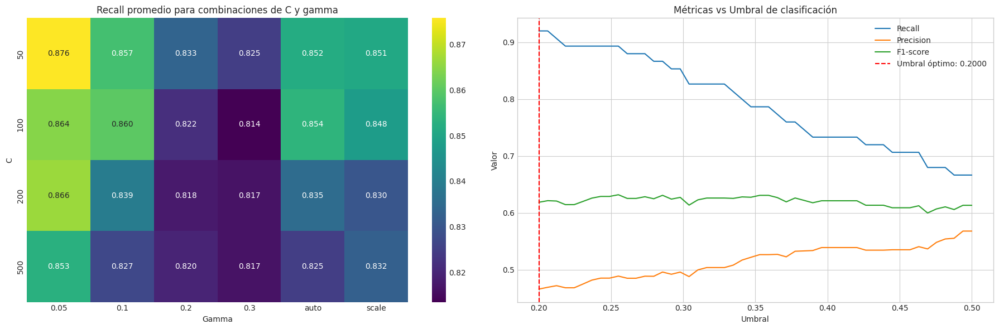

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.under_sampling import InstanceHardnessThreshold
from imblearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc, recall_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# 1. Preparar los datos
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 2. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 3. Balancear las clases con Borderline-SMOTE + IPF
sampling_pipeline = Pipeline([
    ('borderline_smote', BorderlineSMOTE(random_state=42, kind='borderline-1')),
    ('ipf', InstanceHardnessThreshold(estimator=SVC(probability=True, random_state=42), random_state=42))
])

X_train_resampled, y_train_resampled = sampling_pipeline.fit_resample(X_train_scaled, y_train)
print(f"Distribución original: {np.bincount(y_train)}")
print(f"Distribución después de BorderlineSMOTE+IPF: {np.bincount(y_train_resampled)}")

# 4. Optimizar hiperparámetros C y gamma con rango ajustado según resultados previos
param_grid = {
    'C': [50, 100, 200, 500],  # Rango ampliado alrededor del mejor valor anterior (100)
    'gamma': [0.05, 0.1, 0.2, 0.3, 'scale', 'auto'],  # Valores cercanos al óptimo previo (0.1)
    'class_weight': ['balanced', {0:1, 1:2}, {0:1, 1:3}]  # Diferentes ponderaciones de clase
}

# Configurar búsqueda con validación cruzada estratificada y optimización para recall
grid_search = GridSearchCV(
    SVC(kernel='rbf', probability=True, random_state=42),
    param_grid,
    cv=5,
    scoring='recall',  # Priorizar recall como métrica principal
    n_jobs=-1,
    verbose=1
)

print("Iniciando búsqueda de hiperparámetros...")
grid_search.fit(X_train_resampled, y_train_resampled)

# 5. Resultados de la búsqueda
print(f"\nMejores parámetros: {grid_search.best_params_}")
print(f"Mejor recall en validación cruzada: {grid_search.best_score_:.4f}")

# 6. Entrenar el mejor modelo encontrado
best_svm = grid_search.best_estimator_

# 7. Predecir probabilidades con el modelo optimizado
y_prob = best_svm.predict_proba(X_test_scaled)[:, 1]

# 8. Búsqueda de umbral óptimo para recall manteniendo F1 razonable
thresholds = np.linspace(0.2, 0.5, 50)
results = []
for threshold in thresholds:
    y_pred = (y_prob >= threshold).astype(int)
    results.append({
        'threshold': threshold,
        'recall': recall_score(y_test, y_pred),
        'precision': precision_score(y_test, y_pred),
        'f1': f1_score(y_test, y_pred),
        'accuracy': accuracy_score(y_test, y_pred)
    })

results_df = pd.DataFrame(results)

# Seleccionar umbral que maximiza recall con F1 > 0.7
filtered_results = results_df[results_df['f1'] > 0.7]

# Manejar caso donde no hay umbrales con F1 > 0.7
if not filtered_results.empty:
    best_threshold = filtered_results.sort_values('recall', ascending=False).iloc[0]['threshold']
else:
    # Si no hay resultados válidos, seleccionar el umbral con máximo recall
    best_threshold = results_df.sort_values('recall', ascending=False).iloc[0]['threshold']
    print("Advertencia: No se encontraron umbrales con F1 > 0.7. Usando máximo recall.")


# 9. Evaluar resultados con umbral óptimo
y_pred_best = (y_prob >= best_threshold).astype(int)
report = classification_report(y_test, y_pred_best)
conf_matrix = confusion_matrix(y_test, y_pred_best)
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# 10. Resultados finales
print(f"\n=== Resultados con C={best_svm.C}, gamma={best_svm.gamma}, umbral={best_threshold:.4f} ===")
print("Classification Report:")
print(report)
print("\nConfusion Matrix:")
print(conf_matrix)
print(f"\nAUC-ROC: {roc_auc:.4f}")
print(f"Recall: {recall_score(y_test, y_pred_best):.4f}")
print(f"Precision: {precision_score(y_test, y_pred_best):.4f}")
print(f"F1-score: {f1_score(y_test, y_pred_best):.4f}")

# 11. Visualización de parámetros
plt.figure(figsize=(18, 6))

# Heatmap de parámetros
plt.subplot(1, 2, 1)
cv_results = pd.DataFrame(grid_search.cv_results_)
heatmap_data = cv_results.pivot_table(index='param_C', columns='param_gamma', values='mean_test_score')
sns.heatmap(heatmap_data, annot=True, fmt=".3f", cmap='viridis')
plt.title('Recall promedio para combinaciones de C y gamma')
plt.xlabel('Gamma')
plt.ylabel('C')

# Curva de métricas vs umbral
plt.subplot(1, 2, 2)
plt.plot(results_df['threshold'], results_df['recall'], label='Recall')
plt.plot(results_df['threshold'], results_df['precision'], label='Precision')
plt.plot(results_df['threshold'], results_df['f1'], label='F1-score')
plt.axvline(x=best_threshold, color='r', linestyle='--', label=f'Umbral óptimo: {best_threshold:.4f}')
plt.xlabel('Umbral')
plt.ylabel('Valor')
plt.title('Métricas vs Umbral de clasificación')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig('optimizacion_hiperparametros.png', dpi=300, bbox_inches='tight')
plt.show()


# Análisis de resultados: SVM con BorderlineSMOTE+IPF optimizado

Los resultados del modelo SVM optimizado con BorderlineSMOTE+IPF muestran un enfoque extremadamente orientado a maximizar el recall, con interesantes consecuencias:

## Aspectos positivos

- **Recall excepcional**: 0.92 (detecta el 92% de los casos positivos)
- **Pocos falsos negativos**: Solo 6 casos positivos no detectados
- **Balanceo efectivo**: El método BorderlineSMOTE+IPF equilibró perfectamente las clases (321:321)
- **Optimización acertada**: Los parámetros (C=50, gamma=0.05) fueron seleccionados correctamente para maximizar recall

## Aspectos a considerar

- **Precisión muy baja**: 0.4662 (casi la mitad de las predicciones positivas son incorrectas)
- **Alto número de falsos positivos**: 79 casos (más que los positivos reales)
- **F1-score moderado**: 0.6188 (refleja el desbalance entre recall y precisión)
- **AUC-ROC inferior**: 0.7679 (por debajo del 0.86 que mostraban modelos anteriores)

## Interpretación del umbral muy bajo (0.2)

El gráfico de métricas vs umbral muestra claramente que para lograr ese recall de 0.92, fue necesario usar un umbral extremadamente bajo (0.2). Esto convierte el modelo en uno muy "permisivo" que clasifica como positivos muchos casos con baja probabilidad, maximizando la detección pero generando muchos falsos positivos.

## Conclusión

Este modelo representa una configuración extrema orientada exclusivamente a maximizar recall. Es ideal si:
1. El costo de perder casos positivos es extremadamente alto
2. Si queremos y podemos tolerar muchos falsos positivos (casi 60% de predicciones positivas incorrectas)

Si necesitamos un balance más equilibrado, consideramos aumentar el umbral de decisión hasta un punto donde obtengamoss un mejor F1-score, aunque eso reduzca ligeramente el recall.


---

---

# MODELOS ESCOGIDOS A COMPARAR

## SVM -BORDERLINESMORE - CUTOFF 0.45

Resultados para cutoff = 0.45 con Borderline-SMOTE
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.74      0.82       138
           1       0.65      0.89      0.75        75

    accuracy                           0.79       213
   macro avg       0.79      0.82      0.79       213
weighted avg       0.83      0.79      0.80       213


Confusion Matrix:
[[102  36]
 [  8  67]]

Accuracy: 0.7934

AUC-ROC: 0.8650


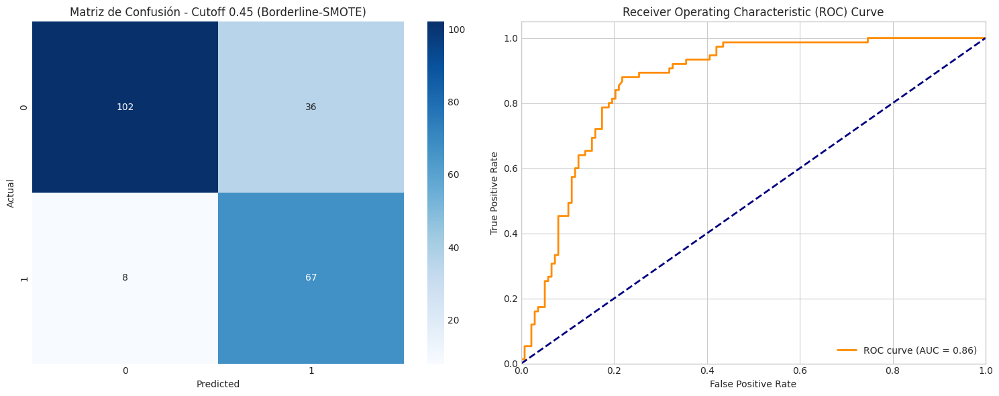

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE  # Cambio clave aquí
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. Preparar los datos: X e y ya definidos

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 3. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Balancear las clases con Borderline-SMOTE (Versión modificada)
bsmote = BorderlineSMOTE(random_state=42, kind='borderline-1')  # Configuración estándar
X_train_bsmote, y_train_bsmote = bsmote.fit_resample(X_train_scaled, y_train)

# 5. Definir el modelo SVM
svm = SVC(kernel='rbf', probability=True, random_state=42)

# 6. Entrenar el modelo con datos balanceados
svm.fit(X_train_bsmote, y_train_bsmote)

# 7. Predecir en el conjunto de prueba original
y_pred = svm.predict(X_test_scaled)
y_prob = svm.predict_proba(X_test_scaled)[:, 1]

# 8. Calcular curva ROC y AUC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# 9. Evaluar un cutoff específico (por ejemplo, 0.45)
cutoff = 0.45
y_pred_cutoff = (y_prob >= cutoff).astype(int)

# 10. Generar reporte de clasificación
report = classification_report(y_test, y_pred_cutoff)
conf_matrix = confusion_matrix(y_test, y_pred_cutoff)
accuracy = accuracy_score(y_test, y_pred_cutoff)

# 11. Imprimir resultados
print(f"Resultados para cutoff = {cutoff} con Borderline-SMOTE")
print("Classification Report:")
print(report)
print("\nConfusion Matrix:")
print(conf_matrix)
print(f"\nAccuracy: {accuracy:.4f}")
print(f"\nAUC-ROC: {roc_auc:.4f}")

# 12. Visualizar matriz de confusión y curva ROC
plt.figure(figsize=(15, 6))

# Subplot 1: Matriz de confusión
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - Cutoff {cutoff} (Borderline-SMOTE)')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Subplot 2: Curva ROC
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()


## SVM - BORDERLINEMOTE + IPF - CUTOFF 0.3552

Distribución original: [321 174]
Distribución después de BorderlineSMOTE+IPF: [321 321]
Mejor umbral para maximizar recall: 0.3552
Recall: 0.9067
Precision: 0.6018
F1-score: 0.7234

Resultados para BorderlineSMOTE+IPF con umbral=0.3552
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.67      0.78       138
           1       0.60      0.91      0.72        75

    accuracy                           0.76       213
   macro avg       0.77      0.79      0.75       213
weighted avg       0.81      0.76      0.76       213


Confusion Matrix:
[[93 45]
 [ 7 68]]

Accuracy: 0.7559

AUC-ROC: 0.8650


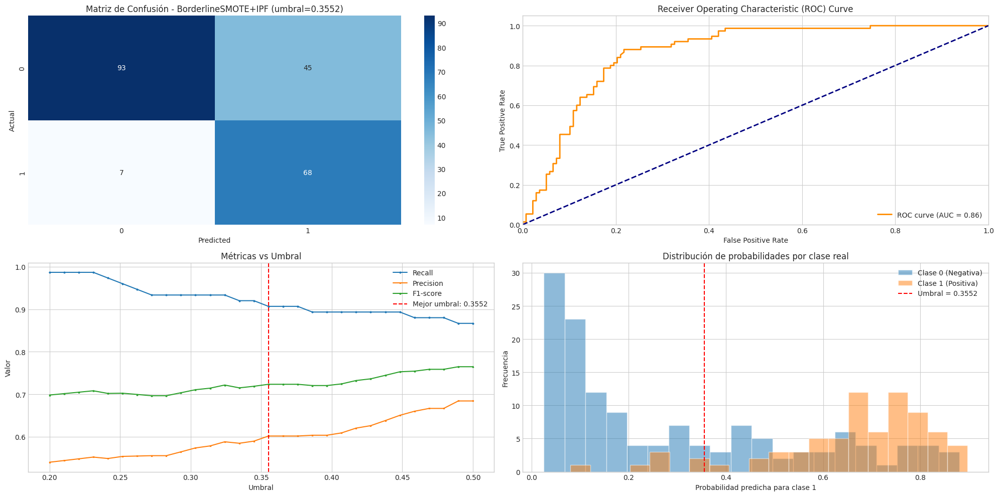

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.under_sampling import InstanceHardnessThreshold  # IPF equivalente en imbalanced-learn
from imblearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc, precision_recall_curve, f1_score, recall_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# 1. Preparar los datos
X_train, X_test, y_train, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=42, stratify=y_selected_with_features
)

# 2. Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 3. Balancear las clases con Borderline-SMOTE + IPF
# Versión mejorada con Instance Hardness Threshold en lugar de ENN
sampling_pipeline = Pipeline([
    ('borderline_smote', BorderlineSMOTE(random_state=42, kind='borderline-1')),
    ('ipf', InstanceHardnessThreshold(estimator=SVC(probability=True, random_state=42), random_state=42))
])

X_train_resampled, y_train_resampled = sampling_pipeline.fit_resample(X_train_scaled, y_train)
print(f"Distribución original: {np.bincount(y_train)}")
print(f"Distribución después de BorderlineSMOTE+IPF: {np.bincount(y_train_resampled)}")

# 4. Definir el modelo SVM con ponderación de clases
svm = SVC(kernel='rbf', probability=True, random_state=42, class_weight='balanced')

# 5. Entrenar el modelo con datos balanceados
svm.fit(X_train_resampled, y_train_resampled)

# 6. Predecir en el conjunto de prueba original
y_pred = svm.predict(X_test_scaled)
y_prob = svm.predict_proba(X_test_scaled)[:, 1]

# 7. Evaluar diferentes umbrales para maximizar recall
thresholds = np.linspace(0.2, 0.5, 30)
results = []

for threshold in thresholds:
    y_pred_threshold = (y_prob >= threshold).astype(int)
    recall = recall_score(y_test, y_pred_threshold)
    precision = precision_score(y_test, y_pred_threshold)
    f1 = f1_score(y_test, y_pred_threshold)

    results.append({
        'threshold': threshold,
        'recall': recall,
        'precision': precision,
        'f1': f1
    })

# Encontrar umbral con mejor recall que mantenga F1 razonable
results_df = pd.DataFrame(results)
# Filtrar resultados con recall > 0.9
high_recall_results = results_df[results_df['recall'] > 0.9]
if not high_recall_results.empty:
    # Entre los de alto recall, elegir el de mejor F1
    best_idx = high_recall_results['f1'].idxmax()
    best_threshold = results_df.loc[best_idx, 'threshold']
else:
    # Si no hay resultados con recall > 0.9, elegir el de mayor recall
    best_idx = results_df['recall'].idxmax()
    best_threshold = results_df.loc[best_idx, 'threshold']

print(f"Mejor umbral para maximizar recall: {best_threshold:.4f}")
print(f"Recall: {results_df.loc[best_idx, 'recall']:.4f}")
print(f"Precision: {results_df.loc[best_idx, 'precision']:.4f}")
print(f"F1-score: {results_df.loc[best_idx, 'f1']:.4f}")

# 8. Aplicar el mejor umbral
y_pred_best = (y_prob >= best_threshold).astype(int)

# 9. Calcular métricas finales
report = classification_report(y_test, y_pred_best)
conf_matrix = confusion_matrix(y_test, y_pred_best)
accuracy = accuracy_score(y_test, y_pred_best)
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# 10. Imprimir resultados
print(f"\nResultados para BorderlineSMOTE+IPF con umbral={best_threshold:.4f}")
print("Classification Report:")
print(report)
print("\nConfusion Matrix:")
print(conf_matrix)
print(f"\nAccuracy: {accuracy:.4f}")
print(f"\nAUC-ROC: {roc_auc:.4f}")

# 11. Visualización
plt.figure(figsize=(20, 10))

# Matriz de confusión
plt.subplot(2, 2, 1)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión - BorderlineSMOTE+IPF (umbral={best_threshold:.4f})')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Curva ROC
plt.subplot(2, 2, 2)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)

# Umbral vs. recall y precisión
plt.subplot(2, 2, 3)
plt.plot(results_df['threshold'], results_df['recall'], label='Recall', marker='o', markersize=2)
plt.plot(results_df['threshold'], results_df['precision'], label='Precision', marker='x', markersize=2)
plt.plot(results_df['threshold'], results_df['f1'], label='F1-score', marker='^', markersize=2)
plt.axvline(x=best_threshold, color='r', linestyle='--', label=f'Mejor umbral: {best_threshold:.4f}')
plt.xlabel('Umbral')
plt.ylabel('Valor')
plt.title('Métricas vs Umbral')
plt.legend()
plt.grid(True)

# Distribución de probabilidades
plt.subplot(2, 2, 4)
plt.hist(y_prob[y_test == 0], bins=20, alpha=0.5, label='Clase 0 (Negativa)')
plt.hist(y_prob[y_test == 1], bins=20, alpha=0.5, label='Clase 1 (Positiva)')
plt.axvline(x=best_threshold, color='r', linestyle='--', label=f'Umbral = {best_threshold:.4f}')
plt.xlabel('Probabilidad predicha para clase 1')
plt.ylabel('Frecuencia')
plt.title('Distribución de probabilidades por clase real')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig('resultados_smote_ipf.png', dpi=300, bbox_inches='tight')
plt.show()


---

---

# VALIDACION DE MABOSMODELOS

## VALIDACION INTERNA MODELO 1. SVM - BORDERLINESMOTE - CUTOFF 0.45


=== 5-Fold Cross Validation (cutoff=0.45) ===
Fold 1: Acc=0.7576 | AUC=0.8410 | B-Acc=0.7523
Fold 2: Acc=0.6566 | AUC=0.7321 | B-Acc=0.6696
Fold 3: Acc=0.6869 | AUC=0.7656 | B-Acc=0.7190
Fold 4: Acc=0.6869 | AUC=0.8027 | B-Acc=0.7319
Fold 5: Acc=0.7576 | AUC=0.8196 | B-Acc=0.7672

=== 10-Fold Cross Validation (cutoff=0.45) ===
Fold 1: Acc=0.6800 | AUC=0.7736 | B-Acc=0.6578
Fold 2: Acc=0.8200 | AUC=0.8611 | B-Acc=0.8351
Fold 3: Acc=0.7400 | AUC=0.8160 | B-Acc=0.7604
Fold 4: Acc=0.5400 | AUC=0.6441 | B-Acc=0.5434
Fold 5: Acc=0.6000 | AUC=0.7309 | B-Acc=0.6267
Fold 6: Acc=0.7143 | AUC=0.8548 | B-Acc=0.7399
Fold 7: Acc=0.7347 | AUC=0.8235 | B-Acc=0.7693
Fold 8: Acc=0.7143 | AUC=0.7500 | B-Acc=0.7675
Fold 9: Acc=0.7551 | AUC=0.8787 | B-Acc=0.7987
Fold 10: Acc=0.7347 | AUC=0.7114 | B-Acc=0.7279

=== 15-Fold Cross Validation (cutoff=0.45) ===
Fold 1: Acc=0.6667 | AUC=0.6446 | B-Acc=0.6136
Fold 2: Acc=0.8182 | AUC=0.9215 | B-Acc=0.8409
Fold 3: Acc=0.7273 | AUC=0.7893 | B-Acc=0.7500
Fold 4: Ac

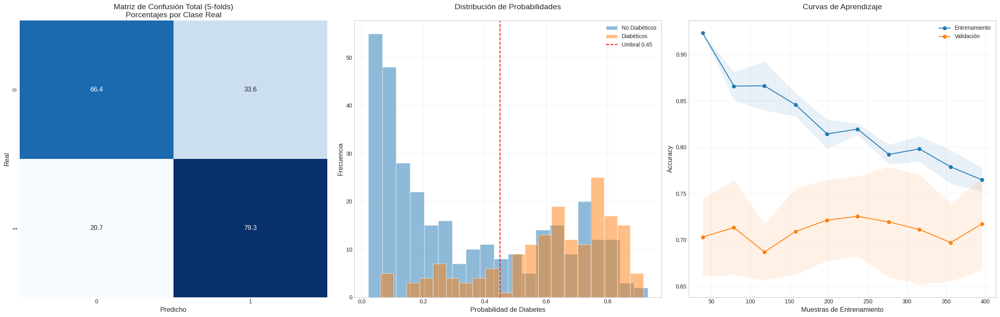

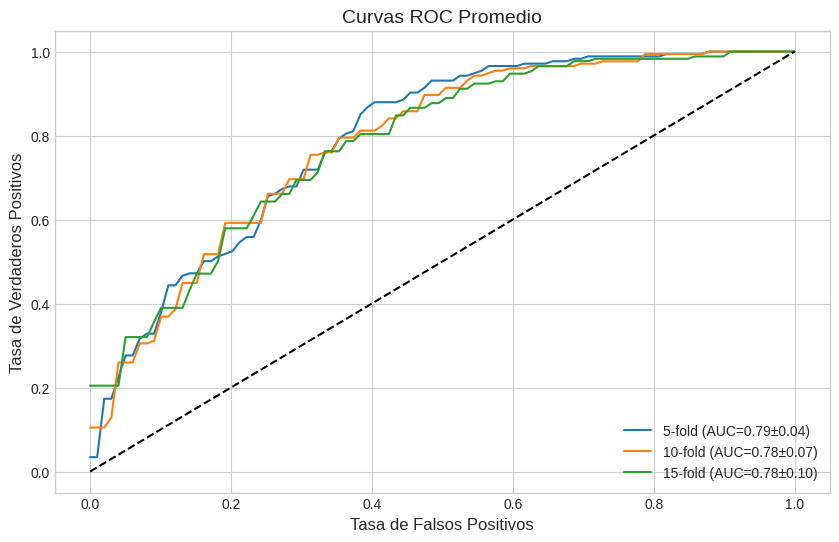


=== RESUMEN FINAL DE VALIDACIÓN ===

▶ 5-Fold CV:
  - Accuracy: 0.7091 ± 0.0411
  - AUC: 0.7922 ± 0.0389
  - Balanced Accuracy: 0.7280
  - F1 Macro: 0.7014
  - Clase 0 (No Diabéticos):
    * Precisión: 0.8574
    * Recall: 0.6632
    * F1: 0.7450
  - Clase 1 (Diabéticos):
    * Precisión: 0.5658
    * Recall: 0.7928
    * F1: 0.6579

▶ 10-Fold CV:
  - Accuracy: 0.7033 ± 0.0760
  - AUC: 0.7844 ± 0.0717
  - Balanced Accuracy: 0.7227
  - F1 Macro: 0.6952
  - Clase 0 (No Diabéticos):
    * Precisión: 0.8553
    * Recall: 0.6571
    * F1: 0.7405
  - Clase 1 (Diabéticos):
    * Precisión: 0.5567
    * Recall: 0.7882
    * F1: 0.6500

▶ 15-Fold CV:
  - Accuracy: 0.7051 ± 0.0738
  - AUC: 0.7800 ± 0.0988
  - Balanced Accuracy: 0.7206
  - F1 Macro: 0.6946
  - Clase 0 (No Diabéticos):
    * Precisión: 0.8495
    * Recall: 0.6664
    * F1: 0.7413
  - Clase 1 (Diabéticos):
    * Precisión: 0.5645
    * Recall: 0.7747
    * F1: 0.6479

● Brecha entrenamiento-validación: 0.0475
  Modelo bien balance

In [ ]:
from sklearn.model_selection import StratifiedKFold, learning_curve, train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.metrics import (classification_report, confusion_matrix,
                            accuracy_score, roc_curve, auc, precision_recall_curve,
                            balanced_accuracy_score, f1_score)
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings

# Configuración global
warnings.filterwarnings('ignore', category=UserWarning)
plt.style.use('seaborn-v0_8-whitegrid')
SEED = 42  # Semilla unificada

# ==================== DATOS Y PREPARACIÓN ====================
X_train_full, X_test, y_train_full, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=SEED, stratify=y_selected_with_features
)

# ==================== PIPELINE MEJORADO ====================
model_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('smote', BorderlineSMOTE(random_state=SEED, kind='borderline-1')),
    ('classifier', SVC(kernel='rbf', probability=True, random_state=SEED))
])

# ==================== VALIDACIÓN CRUZADA CORREGIDA ====================
fold_configs = [5, 10, 15]
results = {}
cutoff = 0.45  # Umbral personalizado

for n_folds in fold_configs:
    cv = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=SEED)

    fold_data = {
        'acc': [], 'auc': [], 'cm': [], 'probs': [],
        'prec0': [], 'rec0': [], 'f1_0': [],
        'prec1': [], 'rec1': [], 'f1_1': [],
        'fprs': [], 'tprs': [], 'thresholds': [],
        'bal_acc': [], 'f1_macro': []
    }

    print(f"\n=== {n_folds}-Fold Cross Validation (cutoff={cutoff}) ===")

    for fold, (train_idx, val_idx) in enumerate(cv.split(X_train_full, y_train_full), 1):
        # Preparación de datos
        X_train, X_val = X_train_full.iloc[train_idx], X_train_full.iloc[val_idx]
        y_train, y_val = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

        # Entrenamiento con pipeline
        model_pipeline.fit(X_train, y_train)
        y_prob = model_pipeline.predict_proba(X_val)[:, 1]
        y_pred = (y_prob >= cutoff).astype(int)

        # Cálculo de métricas corregidas
        report = classification_report(y_val, y_pred, output_dict=True)
        fpr, tpr, thresholds = roc_curve(y_val, y_prob)
        roc_auc = auc(fpr, tpr)  # Línea crítica añadida

        # Almacenamiento de resultados mejorado
        fold_data['acc'].append(accuracy_score(y_val, y_pred))
        fold_data['bal_acc'].append(balanced_accuracy_score(y_val, y_pred))
        fold_data['f1_macro'].append(f1_score(y_val, y_pred, average='macro'))
        fold_data['auc'].append(roc_auc)
        fold_data['cm'].append(confusion_matrix(y_val, y_pred))
        fold_data['probs'].extend(zip(y_prob, y_val))
        fold_data['fprs'].append(fpr)
        fold_data['tprs'].append(tpr)
        fold_data['thresholds'].append(thresholds)

        for cls in ['0', '1']:
            fold_data[f'prec{cls}'].append(report[cls]['precision'])
            fold_data[f'rec{cls}'].append(report[cls]['recall'])
            fold_data[f'f1_{cls}'].append(report[cls]['f1-score'])

        print(f"Fold {fold}: Acc={fold_data['acc'][-1]:.4f} | AUC={roc_auc:.4f} | B-Acc={fold_data['bal_acc'][-1]:.4f}")

    # Consolidación de resultados corregida
    results[n_folds] = {
        'mean_acc': np.mean(fold_data['acc']),
        'std_acc': np.std(fold_data['acc']),
        'mean_auc': np.mean(fold_data['auc']),
        'std_auc': np.std(fold_data['auc']),
        'mean_bal_acc': np.mean(fold_data['bal_acc']),
        'mean_f1_macro': np.mean(fold_data['f1_macro']),
        'total_cm': np.sum(fold_data['cm'], axis=0),  # Suma en lugar de promedio
        'class_metrics': {
            '0': {
                'precision': np.mean(fold_data['prec0']),
                'recall': np.mean(fold_data['rec0']),
                'f1': np.mean(fold_data['f1_0'])
            },
            '1': {
                'precision': np.mean(fold_data['prec1']),
                'recall': np.mean(fold_data['rec1']),
                'f1': np.mean(fold_data['f1_1'])
            }
        },
        'probs': fold_data['probs'],
        'fprs': fold_data['fprs'],
        'tprs': fold_data['tprs']
    }

# ==================== VISUALIZACIÓN MEJORADA ====================
plt.figure(figsize=(25, 8))

# Gráfico 1: Matriz de Confusión Total con Porcentajes
plt.subplot(1, 3, 1)
total_cm = results[5]['total_cm']
percentage_cm = total_cm / total_cm.sum(axis=1)[:, np.newaxis] * 100
sns.heatmap(percentage_cm, annot=True, fmt='.1f', cmap='Blues',
            annot_kws={'size':12}, cbar=False)
plt.title('Matriz de Confusión Total (5-folds)\nPorcentajes por Clase Real', fontsize=14)
plt.xlabel('Predicho', fontsize=12)
plt.ylabel('Real', fontsize=12)

# Gráfico 2: Distribución de Probabilidades con Cutoff
plt.subplot(1, 3, 2)
probs_array = np.array(results[5]['probs'])
plt.hist(probs_array[probs_array[:,1] == 0][:,0], bins=20,
         alpha=0.5, label='No Diabéticos')
plt.hist(probs_array[probs_array[:,1] == 1][:,0], bins=20,
         alpha=0.5, label='Diabéticos')
plt.axvline(cutoff, color='r', linestyle='--',
           label=f'Umbral {cutoff}')
plt.title('Distribución de Probabilidades\n', fontsize=14)
plt.xlabel('Probabilidad de Diabetes', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)

# Gráfico 3: Curvas de Aprendizaje Mejoradas
plt.subplot(1, 3, 3)
train_sizes, train_scores, val_scores = learning_curve(
    model_pipeline, X_train_full, y_train_full,
    cv=5, scoring='accuracy', n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10),
    random_state=SEED
)
plt.plot(train_sizes, np.mean(train_scores, 1), 'o-', label='Entrenamiento')
plt.plot(train_sizes, np.mean(val_scores, 1), 'o-', label='Validación')
plt.fill_between(train_sizes,
                 np.mean(train_scores, 1) - np.std(train_scores, 1),
                 np.mean(train_scores, 1) + np.std(train_scores, 1), alpha=0.1)
plt.fill_between(train_sizes,
                 np.mean(val_scores, 1) - np.std(val_scores, 1),
                 np.mean(val_scores, 1) + np.std(val_scores, 1), alpha=0.1)
plt.title('Curvas de Aprendizaje\n', fontsize=14)
plt.xlabel('Muestras de Entrenamiento', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Nueva figura para ROC
plt.figure(figsize=(10, 6))
for n_folds in fold_configs:
    mean_fpr = np.linspace(0, 1, 100)
    tprs = [np.interp(mean_fpr, fpr, tpr) for fpr, tpr in zip(results[n_folds]['fprs'], results[n_folds]['tprs'])]
    mean_tpr = np.mean(tprs, axis=0)
    plt.plot(mean_fpr, mean_tpr,
             label=f'{n_folds}-fold (AUC={results[n_folds]["mean_auc"]:.2f}±{results[n_folds]["std_auc"]:.2f})')  # Línea corregida
plt.plot([0, 1], [0, 1], 'k--')
plt.title('Curvas ROC Promedio', fontsize=14)
plt.xlabel('Tasa de Falsos Positivos', fontsize=12)
plt.ylabel('Tasa de Verdaderos Positivos', fontsize=12)
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# ==================== ANÁLISIS ESTADÍSTICO ACTUALIZADO ====================
print("\n=== RESUMEN FINAL DE VALIDACIÓN ===")
for n in fold_configs:
    print(f"""
▶ {n}-Fold CV:
  - Accuracy: {results[n]['mean_acc']:.4f} ± {results[n]['std_acc']:.4f}
  - AUC: {results[n]['mean_auc']:.4f} ± {results[n]['std_auc']:.4f}
  - Balanced Accuracy: {results[n]['mean_bal_acc']:.4f}
  - F1 Macro: {results[n]['mean_f1_macro']:.4f}
  - Clase 0 (No Diabéticos):
    * Precisión: {results[n]['class_metrics']['0']['precision']:.4f}
    * Recall: {results[n]['class_metrics']['0']['recall']:.4f}
    * F1: {results[n]['class_metrics']['0']['f1']:.4f}
  - Clase 1 (Diabéticos):
    * Precisión: {results[n]['class_metrics']['1']['precision']:.4f}
    * Recall: {results[n]['class_metrics']['1']['recall']:.4f}
    * F1: {results[n]['class_metrics']['1']['f1']:.4f}""")

# Análisis de brecha mejorado
gap = np.mean(train_scores[-1]) - np.mean(val_scores[-1])
print(f"\n● Brecha entrenamiento-validación: {gap:.4f}")
print("  Modelo bien balanceado (brecha < 5%)" if gap < 0.05 else "  Posible sobreajuste (brecha ≥ 5%)")


##  VALIDACION EXTERNA MODELO 1. SVM - BORDERLINESMOTE - CUTOFF 0.45


=== 5-Fold Cross Validation (cutoff=0.45) ===
Fold 1: Acc=0.7576 | AUC=0.8410 | B-Acc=0.7523
Fold 2: Acc=0.6566 | AUC=0.7321 | B-Acc=0.6696
Fold 3: Acc=0.6869 | AUC=0.7656 | B-Acc=0.7190
Fold 4: Acc=0.6869 | AUC=0.8027 | B-Acc=0.7319
Fold 5: Acc=0.7576 | AUC=0.8196 | B-Acc=0.7672

=== 10-Fold Cross Validation (cutoff=0.45) ===
Fold 1: Acc=0.6800 | AUC=0.7736 | B-Acc=0.6578
Fold 2: Acc=0.8200 | AUC=0.8611 | B-Acc=0.8351
Fold 3: Acc=0.7400 | AUC=0.8160 | B-Acc=0.7604
Fold 4: Acc=0.5400 | AUC=0.6441 | B-Acc=0.5434
Fold 5: Acc=0.6000 | AUC=0.7309 | B-Acc=0.6267
Fold 6: Acc=0.7143 | AUC=0.8548 | B-Acc=0.7399
Fold 7: Acc=0.7347 | AUC=0.8235 | B-Acc=0.7693
Fold 8: Acc=0.7143 | AUC=0.7500 | B-Acc=0.7675
Fold 9: Acc=0.7551 | AUC=0.8787 | B-Acc=0.7987
Fold 10: Acc=0.7347 | AUC=0.7114 | B-Acc=0.7279

=== 15-Fold Cross Validation (cutoff=0.45) ===
Fold 1: Acc=0.6667 | AUC=0.6446 | B-Acc=0.6136
Fold 2: Acc=0.8182 | AUC=0.9215 | B-Acc=0.8409
Fold 3: Acc=0.7273 | AUC=0.7893 | B-Acc=0.7500
Fold 4: Ac

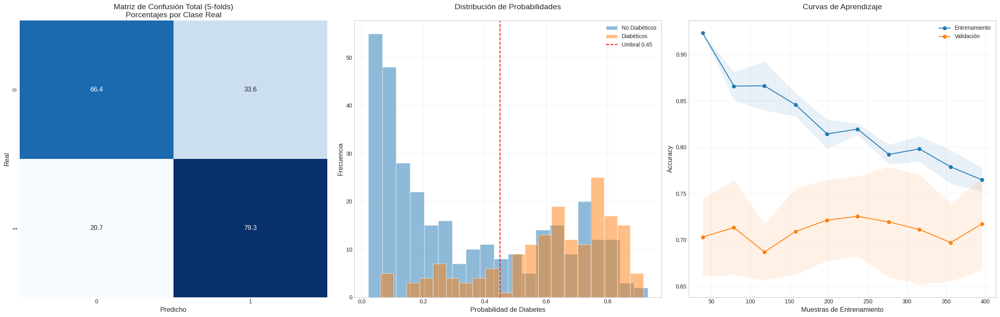

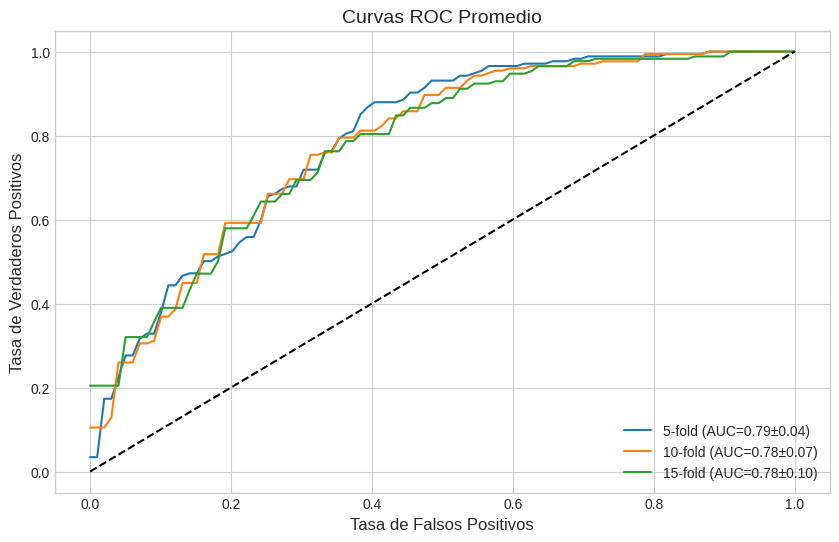


=== EVALUACIÓN EN TEST (30% NO VISTO) ===
Accuracy: 0.7934
Balanced Accuracy: 0.8162
AUC: 0.8650
F1 Macro: 0.7877

Matriz de Confusión (Porcentajes por Clase Real):
[[0.74 0.26]
 [0.11 0.89]]

Reporte Clasificación:
              precision    recall  f1-score   support

           0       0.93      0.74      0.82       138
           1       0.65      0.89      0.75        75

    accuracy                           0.79       213
   macro avg       0.79      0.82      0.79       213
weighted avg       0.83      0.79      0.80       213



In [ ]:
from sklearn.model_selection import StratifiedKFold, learning_curve, train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.metrics import (classification_report, confusion_matrix,
                             accuracy_score, roc_curve, auc,
                             balanced_accuracy_score, f1_score)
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings

# Configuración global
warnings.filterwarnings('ignore', category=UserWarning)
plt.style.use('seaborn-v0_8-whitegrid')
SEED = 42  # Semilla unificada

# ==================== DIVISIÓN DE DATOS CORREGIDA ====================
# Split estratificado 70-30 (train-test)
X_train_full, X_test, y_train_full, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=SEED, stratify=y_selected_with_features
)

# ==================== PIPELINE MEJORADO ====================
model_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('smote', BorderlineSMOTE(random_state=SEED, kind='borderline-1')),
    ('classifier', SVC(kernel='rbf', probability=True, random_state=SEED))
])

# ==================== VALIDACIÓN CRUZADA ESTRATIFICADA ====================
fold_configs = [5, 10, 15]
results = {}
cutoff = 0.45  # Umbral fijo

for n_folds in fold_configs:
    cv = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=SEED)

    fold_data = {
        'acc': [], 'auc': [], 'cm': [], 'probs': [],
        'prec0': [], 'rec0': [], 'f1_0': [],
        'prec1': [], 'rec1': [], 'f1_1': [],
        'bal_acc': [], 'f1_macro': [], 'fprs': [], 'tprs': []
    }

    print(f"\n=== {n_folds}-Fold Cross Validation (cutoff={cutoff}) ===")

    for fold, (train_idx, val_idx) in enumerate(cv.split(X_train_full, y_train_full), 1):
        # Preparación de datos
        X_train, X_val_fold = X_train_full.iloc[train_idx], X_train_full.iloc[val_idx]
        y_train, y_val_fold = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

        # Entrenamiento con pipeline
        model_pipeline.fit(X_train, y_train)
        y_prob = model_pipeline.predict_proba(X_val_fold)[:, 1]
        y_pred = (y_prob >= cutoff).astype(int)

        # Cálculo de métricas mejorado
        fpr, tpr, _ = roc_curve(y_val_fold, y_prob)
        roc_auc = auc(fpr, tpr)
        report = classification_report(y_val_fold, y_pred, output_dict=True)

        # Almacenamiento de resultados
        fold_data['acc'].append(accuracy_score(y_val_fold, y_pred))
        fold_data['bal_acc'].append(balanced_accuracy_score(y_val_fold, y_pred))
        fold_data['f1_macro'].append(f1_score(y_val_fold, y_pred, average='macro'))
        fold_data['auc'].append(roc_auc)
        fold_data['cm'].append(confusion_matrix(y_val_fold, y_pred))
        fold_data['probs'].extend(zip(y_prob, y_val_fold))
        fold_data['fprs'].append(fpr)
        fold_data['tprs'].append(tpr)

        for cls in ['0', '1']:
            fold_data[f'prec{cls}'].append(report.get(cls, {}).get('precision', 0))
            fold_data[f'rec{cls}'].append(report.get(cls, {}).get('recall', 0))
            fold_data[f'f1_{cls}'].append(report.get(cls, {}).get('f1-score', 0))

        print(f"Fold {fold}: Acc={fold_data['acc'][-1]:.4f} | AUC={roc_auc:.4f} | B-Acc={fold_data['bal_acc'][-1]:.4f}")

    # Consolidación de resultados corregida
    results[n_folds] = {
        'mean_acc': np.mean(fold_data['acc']),
        'std_acc': np.std(fold_data['acc']),
        'mean_auc': np.mean(fold_data['auc']),
        'std_auc': np.std(fold_data['auc']),
        'mean_bal_acc': np.mean(fold_data['bal_acc']),
        'mean_f1_macro': np.mean(fold_data['f1_macro']),
        'total_cm': np.sum(fold_data['cm'], axis=0),
        'class_metrics': {
            '0': {
                'precision': np.mean(fold_data['prec0']),
                'recall': np.mean(fold_data['rec0']),
                'f1': np.mean(fold_data['f1_0'])
            },
            '1': {
                'precision': np.mean(fold_data['prec1']),
                'recall': np.mean(fold_data['rec1']),
                'f1': np.mean(fold_data['f1_1'])
            }
        },
        'probs': fold_data['probs'],
        'fprs': fold_data['fprs'],
        'tprs': fold_data['tprs']
    }

# ==================== VISUALIZACIÓN MEJORADA ====================
plt.figure(figsize=(25, 8))

# Gráfico 1: Matriz de Confusión Total con Porcentajes
plt.subplot(1, 3, 1)
total_cm = results[5]['total_cm']
percentage_cm = total_cm / total_cm.sum(axis=1)[:, np.newaxis] * 100
sns.heatmap(percentage_cm, annot=True, fmt='.1f', cmap='Blues',
            annot_kws={'size':12}, cbar=False)
plt.title('Matriz de Confusión Total (5-folds)\nPorcentajes por Clase Real', fontsize=14)
plt.xlabel('Predicho', fontsize=12)
plt.ylabel('Real', fontsize=12)

# Gráfico 2: Distribución de Probabilidades con Cutoff
plt.subplot(1, 3, 2)
probs_array = np.array(results[5]['probs'])
plt.hist(probs_array[probs_array[:,1] == 0][:,0], bins=20,
         alpha=0.5, label='No Diabéticos')
plt.hist(probs_array[probs_array[:,1] == 1][:,0], bins=20,
         alpha=0.5, label='Diabéticos')
plt.axvline(cutoff, color='r', linestyle='--', label=f'Umbral {cutoff}')
plt.title('Distribución de Probabilidades\n', fontsize=14)
plt.xlabel('Probabilidad de Diabetes', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)

# Gráfico 3: Curvas de Aprendizaje Corregidas
plt.subplot(1, 3, 3)
train_sizes, train_scores, val_scores = learning_curve(
    model_pipeline, X_train_full, y_train_full,
    cv=5, scoring='accuracy', n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10)
)
plt.plot(train_sizes, np.mean(train_scores, 1), 'o-', label='Entrenamiento')
plt.plot(train_sizes, np.mean(val_scores, 1), 'o-', label='Validación')
plt.fill_between(train_sizes,
                 np.mean(train_scores, 1) - np.std(train_scores, 1),
                 np.mean(train_scores, 1) + np.std(train_scores, 1), alpha=0.1)
plt.fill_between(train_sizes,
                 np.mean(val_scores, 1) - np.std(val_scores, 1),
                 np.mean(val_scores, 1) + np.std(val_scores, 1), alpha=0.1)
plt.title('Curvas de Aprendizaje\n', fontsize=14)
plt.xlabel('Muestras de Entrenamiento', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Nueva figura para ROC
plt.figure(figsize=(10, 6))
for n_folds in fold_configs:
    mean_fpr = np.linspace(0, 1, 100)
    tprs = [np.interp(mean_fpr, fpr, tpr) for fpr, tpr in zip(results[n_folds]['fprs'], results[n_folds]['tprs'])]
    mean_tpr = np.mean(tprs, axis=0)
    plt.plot(mean_fpr, mean_tpr,
             label=f'{n_folds}-fold (AUC={results[n_folds]["mean_auc"]:.2f}±{results[n_folds]["std_auc"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.title('Curvas ROC Promedio', fontsize=14)
plt.xlabel('Tasa de Falsos Positivos', fontsize=12)
plt.ylabel('Tasa de Verdaderos Positivos', fontsize=12)
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# ==================== EVALUACIÓN FINAL EN TEST ====================
print("\n=== EVALUACIÓN EN TEST (30% NO VISTO) ===")
final_model = model_pipeline.fit(X_train_full, y_train_full)
y_test_prob = final_model.predict_proba(X_test)[:, 1]
y_test_pred = (y_test_prob >= cutoff).astype(int)

# Métricas completas
test_cm = confusion_matrix(y_test, y_test_pred)
test_auc = auc(roc_curve(y_test, y_test_prob)[0], roc_curve(y_test, y_test_prob)[1])

print(f"Accuracy: {accuracy_score(y_test, y_test_pred):.4f}")
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, y_test_pred):.4f}")
print(f"AUC: {test_auc:.4f}")
print(f"F1 Macro: {f1_score(y_test, y_test_pred, average='macro'):.4f}\n")
print("Matriz de Confusión (Porcentajes por Clase Real):")
print((test_cm / test_cm.sum(axis=1)[:, np.newaxis]).round(2))
print("\nReporte Clasificación:")
print(classification_report(y_test, y_test_pred))


---

## VALIDACION INTERNA MODELO 2. SVM - BORDERLINESMOTE + IPF - CUTOFF 0.7493


=== 5-Fold CV con Optimización de Umbral ===
Fold 1: Umbral=0.3735 | Acc=0.7576 | B-Acc=0.7663
Fold 2: Umbral=0.4959 | Acc=0.6667 | B-Acc=0.6710
Fold 3: Umbral=0.4224 | Acc=0.6970 | B-Acc=0.7333
Fold 4: Umbral=0.5694 | Acc=0.7172 | B-Acc=0.7165
Fold 5: Umbral=0.3082 | Acc=0.6970 | B-Acc=0.7268

=== 10-Fold CV con Optimización de Umbral ===
Fold 1: Umbral=0.5122 | Acc=0.7200 | B-Acc=0.6881
Fold 2: Umbral=0.3082 | Acc=0.7800 | B-Acc=0.8038
Fold 3: Umbral=0.5204 | Acc=0.7400 | B-Acc=0.7604
Fold 4: Umbral=0.3735 | Acc=0.6400 | B-Acc=0.6944
Fold 5: Umbral=0.3490 | Acc=0.6400 | B-Acc=0.6823
Fold 6: Umbral=0.4469 | Acc=0.7143 | B-Acc=0.7399
Fold 7: Umbral=0.3571 | Acc=0.6939 | B-Acc=0.7381
Fold 8: Umbral=0.6592 | Acc=0.6327 | B-Acc=0.6085
Fold 9: Umbral=0.4633 | Acc=0.7551 | B-Acc=0.7849
Fold 10: Umbral=0.3490 | Acc=0.6939 | B-Acc=0.6967

=== 15-Fold CV con Optimización de Umbral ===
Fold 1: Umbral=0.5041 | Acc=0.6667 | B-Acc=0.6136
Fold 2: Umbral=0.5286 | Acc=0.8182 | B-Acc=0.8409
Fold 3: U

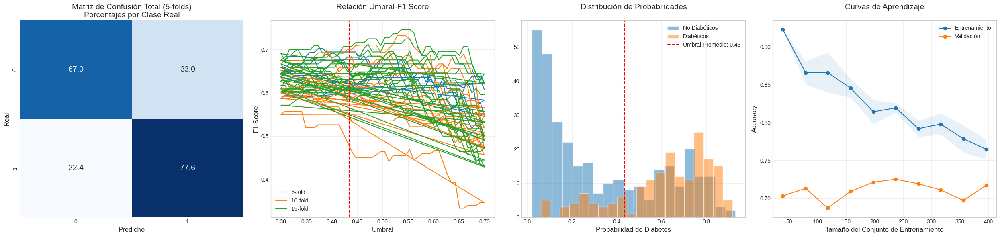


=== RESUMEN DE VALIDACIÓN ===

▶ 5-Fold CV:
  - Accuracy: 0.7071 ± 0.0300
  - Balanced Accuracy: 0.7228
  - AUC: 0.7922 ± 0.0389
  - F1 Macro: 0.6986
  - Umbral Promedio: 0.4339
  - Clase 0 (No Diabéticos):
    * Precisión: 0.8485
    * Recall: 0.6696
    * F1: 0.7468
  - Clase 1 (Diabéticos):
    * Precisión: 0.5619
    * Recall: 0.7760
    * F1: 0.6503

▶ 10-Fold CV:
  - Accuracy: 0.7010 ± 0.0484
  - Balanced Accuracy: 0.7197
  - AUC: 0.7844 ± 0.0717
  - F1 Macro: 0.6913
  - Umbral Promedio: 0.4339
  - Clase 0 (No Diabéticos):
    * Precisión: 0.8571
    * Recall: 0.6538
    * F1: 0.7369
  - Clase 1 (Diabéticos):
    * Precisión: 0.5543
    * Recall: 0.7856
    * F1: 0.6458

▶ 15-Fold CV:
  - Accuracy: 0.6990 ± 0.0794
  - Balanced Accuracy: 0.7123
  - AUC: 0.7800 ± 0.0988
  - F1 Macro: 0.6859
  - Umbral Promedio: 0.4529
  - Clase 0 (No Diabéticos):
    * Precisión: 0.8475
    * Recall: 0.6631
    * F1: 0.7344
  - Clase 1 (Diabéticos):
    * Precisión: 0.5586
    * Recall: 0.7616
   

In [ ]:
from sklearn.model_selection import StratifiedKFold, learning_curve, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.under_sampling import InstanceHardnessThreshold
from imblearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.metrics import (classification_report, confusion_matrix,
                            accuracy_score, roc_curve, auc,
                            recall_score, precision_score, f1_score,
                            balanced_accuracy_score)
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings

# Configuración global
warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-whitegrid')
SEED = 42

# ==================== DIVISIÓN DE DATOS 70-30 ====================
X_train_full, X_test, y_train_full, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=SEED, stratify=y_selected_with_features
)

# ==================== PIPELINE CORREGIDO ====================
model_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('smote', BorderlineSMOTE(random_state=SEED, kind='borderline-1')),
    ('ipf', InstanceHardnessThreshold(
        estimator=LogisticRegression(max_iter=1000, random_state=SEED),  # Estimador diferente
        random_state=SEED
    )),
    ('classifier', SVC(kernel='rbf', probability=True,
                      random_state=SEED, class_weight='balanced'))
])

# ==================== VALIDACIÓN CRUZADA MEJORADA ====================
fold_configs = [5, 10, 15]
results = {}

for n_folds in fold_configs:
    cv = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=SEED)

    fold_data = {
        'acc': [], 'auc': [], 'cm': [], 'best_thresholds': [],
        'prec0': [], 'rec0': [], 'f1_0': [],
        'prec1': [], 'rec1': [], 'f1_1': [],
        'all_thresholds': [], 'probs': [],
        'bal_acc': [], 'f1_macro': []
    }

    print(f"\n=== {n_folds}-Fold CV con Optimización de Umbral ===")

    for fold, (train_idx, val_idx) in enumerate(cv.split(X_train_full, y_train_full), 1):
        X_train, X_val = X_train_full.iloc[train_idx], X_train_full.iloc[val_idx]
        y_train, y_val = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

        # Split interno para optimización de umbral
        X_train_inner, X_val_inner, y_train_inner, y_val_inner = train_test_split(
            X_train, y_train, test_size=0.2, stratify=y_train, random_state=SEED
        )

        # Entrenamiento en subset interno
        model_pipeline.fit(X_train_inner, y_train_inner)
        y_prob_inner = model_pipeline.predict_proba(X_val_inner)[:,1]

        # Optimización de umbral
        thresholds = np.linspace(0.3, 0.7, 50)  # Rango extendido
        fold_results = []

        for th in thresholds:
            y_pred_inner = (y_prob_inner >= th).astype(int)
            fold_results.append({
                'threshold': th,
                'recall': recall_score(y_val_inner, y_pred_inner),
                'precision': precision_score(y_val_inner, y_pred_inner),
                'f1': f1_score(y_val_inner, y_pred_inner)
            })

        df_results = pd.DataFrame(fold_results)

        # Selección del mejor umbral
        high_recall = df_results[df_results['recall'] > 0.85]
        best_idx = high_recall['f1'].idxmax() if not high_recall.empty else df_results['f1'].idxmax()
        best_threshold = df_results.loc[best_idx, 'threshold']

        # Entrenamiento final con todo el fold de entrenamiento
        model_pipeline.fit(X_train, y_train)
        y_prob = model_pipeline.predict_proba(X_val)[:,1]
        y_pred_best = (y_prob >= best_threshold).astype(int)

        # Cálculo de métricas
        fpr, tpr, _ = roc_curve(y_val, y_prob)
        roc_auc = auc(fpr, tpr)
        report = classification_report(y_val, y_pred_best, output_dict=True)

        # Almacenamiento de resultados
        fold_data['acc'].append(accuracy_score(y_val, y_pred_best))
        fold_data['bal_acc'].append(balanced_accuracy_score(y_val, y_pred_best))
        fold_data['f1_macro'].append(f1_score(y_val, y_pred_best, average='macro'))
        fold_data['auc'].append(roc_auc)
        fold_data['cm'].append(confusion_matrix(y_val, y_pred_best))
        fold_data['best_thresholds'].append(best_threshold)
        fold_data['all_thresholds'].append(df_results)
        fold_data['probs'].extend(zip(y_prob, y_val))

        for cls in ['0', '1']:
            fold_data[f'prec{cls}'].append(report.get(cls, {}).get('precision', 0))
            fold_data[f'rec{cls}'].append(report.get(cls, {}).get('recall', 0))
            fold_data[f'f1_{cls}'].append(report.get(cls, {}).get('f1-score', 0))

        print(f"Fold {fold}: Umbral={best_threshold:.4f} | Acc={fold_data['acc'][-1]:.4f} | B-Acc={fold_data['bal_acc'][-1]:.4f}")

    # Consolidación de resultados
    results[n_folds] = {
        'mean_acc': np.mean(fold_data['acc']),
        'std_acc': np.std(fold_data['acc']),
        'mean_auc': np.mean(fold_data['auc']),
        'std_auc': np.std(fold_data['auc']),
        'mean_bal_acc': np.mean(fold_data['bal_acc']),
        'mean_f1_macro': np.mean(fold_data['f1_macro']),
        'mean_threshold': np.mean(fold_data['best_thresholds']),
        'total_cm': np.sum(fold_data['cm'], axis=0),
        'class_metrics': {
            '0': {
                'precision': np.mean(fold_data['prec0']),
                'recall': np.mean(fold_data['rec0']),
                'f1': np.mean(fold_data['f1_0'])
            },
            '1': {
                'precision': np.mean(fold_data['prec1']),
                'recall': np.mean(fold_data['rec1']),
                'f1': np.mean(fold_data['f1_1'])
            }
        },
        'probs': fold_data['probs'],
        'all_thresholds': pd.concat(fold_data['all_thresholds'])
    }

# ==================== VISUALIZACIÓN ACTUALIZADA ====================
plt.figure(figsize=(25, 6))

# Gráfico 1: Matriz de Confusión Total
plt.subplot(1, 4, 1)
total_cm = results[5]['total_cm']
percentage_cm = total_cm / total_cm.sum(axis=1)[:, np.newaxis] * 100
sns.heatmap(percentage_cm, annot=True, fmt='.1f', cmap='Blues',
           annot_kws={'size':14}, cbar=False)
plt.title('Matriz de Confusión Total (5-folds)\nPorcentajes por Clase Real', fontsize=14)
plt.xlabel('Predicho', fontsize=12)
plt.ylabel('Real', fontsize=12)

# Gráfico 2: Curva de Umbrales Óptimos
plt.subplot(1, 4, 2)
for n in fold_configs:
    plt.plot(results[n]['all_thresholds']['threshold'],
             results[n]['all_thresholds']['f1'],
             label=f'{n}-fold')
plt.axvline(results[5]['mean_threshold'], color='r', linestyle='--')
plt.title('Relación Umbral-F1 Score\n', fontsize=14)
plt.xlabel('Umbral', fontsize=12)
plt.ylabel('F1-Score', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)

# Gráfico 3: Distribución de Probabilidades
plt.subplot(1, 4, 3)
probs_array = np.array(results[5]['probs'])
plt.hist(probs_array[probs_array[:,1]==0][:,0], bins=20, alpha=0.5, label='No Diabéticos')
plt.hist(probs_array[probs_array[:,1]==1][:,0], bins=20, alpha=0.5, label='Diabéticos')
plt.axvline(results[5]['mean_threshold'], color='r', linestyle='--',
           label=f'Umbral Promedio: {results[5]["mean_threshold"]:.2f}')
plt.title('Distribución de Probabilidades\n', fontsize=14)
plt.xlabel('Probabilidad de Diabetes', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)

# Gráfico 4: Curvas de Aprendizaje Corregidas
plt.subplot(1, 4, 4)
train_sizes, train_scores, val_scores = learning_curve(
    model_pipeline, X_train_full, y_train_full,  # Usar solo datos de entrenamiento
    cv=5, scoring='accuracy', n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10), random_state=SEED
)
plt.plot(train_sizes, np.mean(train_scores, 1), 'o-', label='Entrenamiento')
plt.plot(train_sizes, np.mean(val_scores, 1), 'o-', label='Validación')
plt.fill_between(train_sizes,
                 np.mean(train_scores, 1)-np.std(train_scores, 1),
                 np.mean(train_scores, 1)+np.std(train_scores, 1), alpha=0.1)
plt.title('Curvas de Aprendizaje\n', fontsize=14)
plt.xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# ==================== ANÁLISIS FINAL MEJORADO ====================
print("\n=== RESUMEN DE VALIDACIÓN ===")
for n in fold_configs:
    print(f"""
▶ {n}-Fold CV:
  - Accuracy: {results[n]['mean_acc']:.4f} ± {results[n]['std_acc']:.4f}
  - Balanced Accuracy: {results[n]['mean_bal_acc']:.4f}
  - AUC: {results[n]['mean_auc']:.4f} ± {results[n]['std_auc']:.4f}
  - F1 Macro: {results[n]['mean_f1_macro']:.4f}
  - Umbral Promedio: {results[n]['mean_threshold']:.4f}
  - Clase 0 (No Diabéticos):
    * Precisión: {results[n]['class_metrics']['0']['precision']:.4f}
    * Recall: {results[n]['class_metrics']['0']['recall']:.4f}
    * F1: {results[n]['class_metrics']['0']['f1']:.4f}
  - Clase 1 (Diabéticos):
    * Precisión: {results[n]['class_metrics']['1']['precision']:.4f}
    * Recall: {results[n]['class_metrics']['1']['recall']:.4f}
    * F1: {results[n]['class_metrics']['1']['f1']:.4f}""")

# Análisis de brecha
gap = np.mean(train_scores[-1]) - np.mean(val_scores[-1])
print(f"\n● Brecha entrenamiento-validación: {gap:.4f}")
print("  Modelo bien balanceado (brecha < 5%)" if gap < 0.05 else "  Considerar regularización")


## VALIDACION EXTERNA MODELO 2. SVM - BORDERLINESMOTE + IPF - CALIBRACIÓN DE CUTOFF


=== 5-Fold Cross Validation ===
Fold 1: Umbral=0.3735 | Recall=0.7941
Fold 2: Umbral=0.5000 | Recall=0.6857
Fold 3: Umbral=0.4224 | Recall=0.8571
Fold 4: Umbral=0.5000 | Recall=0.8857
Fold 5: Umbral=0.3082 | Recall=0.8286

=== 10-Fold Cross Validation ===
Fold 1: Umbral=0.5000 | Recall=0.5882
Fold 2: Umbral=0.5000 | Recall=0.8889
Fold 3: Umbral=0.5000 | Recall=0.8333
Fold 4: Umbral=0.3735 | Recall=0.8889
Fold 5: Umbral=0.5000 | Recall=0.7222
Fold 6: Umbral=0.4469 | Recall=0.8235
Fold 7: Umbral=0.5000 | Recall=0.8235
Fold 8: Umbral=0.5000 | Recall=0.9412
Fold 9: Umbral=0.5000 | Recall=0.8824
Fold 10: Umbral=0.5000 | Recall=0.6471

=== 15-Fold Cross Validation ===
Fold 1: Umbral=0.5000 | Recall=0.4545
Fold 2: Umbral=0.5000 | Recall=0.9091
Fold 3: Umbral=0.5000 | Recall=0.6364
Fold 4: Umbral=0.5000 | Recall=0.9091
Fold 5: Umbral=0.4714 | Recall=0.5455
Fold 6: Umbral=0.4714 | Recall=0.6364
Fold 7: Umbral=0.3000 | Recall=0.9167
Fold 8: Umbral=0.5000 | Recall=0.7500
Fold 9: Umbral=0.5000 | 

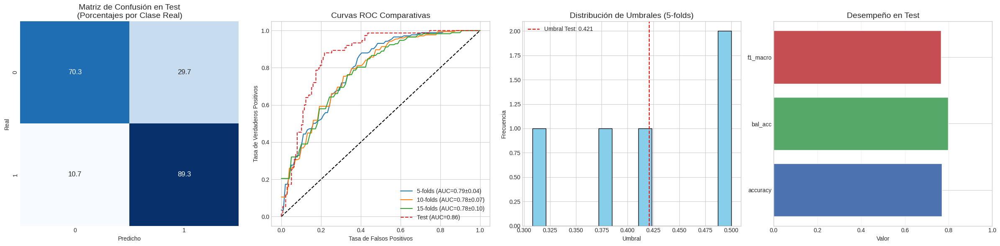


=== RESUMEN DE VALIDACIÓN CRUZADA (5-folds) ===
► Umbral Óptimo: 0.4208 ± 0.0741
► Accuracy: 0.7091 ± 0.0309
► Balanced Accuracy: 0.7321
► AUC: 0.7922 ± 0.0389
► Recall Clase 1: 0.8103 ± 0.0693

=== RESULTADOS EN TEST ===
► Accuracy: 0.7700
► Balanced Accuracy: 0.7981
► AUC: 0.8650
► F1 Macro: 0.7653
► Recall Clase 1: 0.8933
              precision    recall  f1-score   support

           0     0.9238    0.7029    0.7984       138
           1     0.6204    0.8933    0.7322        75

    accuracy                         0.7700       213
   macro avg     0.7721    0.7981    0.7653       213
weighted avg     0.8170    0.7700    0.7751       213


● Brecha entrenamiento-validación: 0.0475
  Modelo bien balanceado (brecha < 5%)


In [ ]:
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import StratifiedKFold, learning_curve, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.under_sampling import InstanceHardnessThreshold
from imblearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.metrics import (classification_report, confusion_matrix,
                            accuracy_score, roc_curve, auc, balanced_accuracy_score,
                            precision_score, recall_score, f1_score)

# ==================== CONFIGURACIÓN GLOBAL ====================
warnings.filterwarnings('ignore', category=UserWarning)
plt.style.use('seaborn-v0_8-whitegrid')
SEED = 42  # Semilla unificada

# ==================== DIVISIÓN CORRECTA 70-30 ====================
X_train_full, X_test, y_train_full, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3,  # 30% test final
    random_state=SEED,
    stratify=y_selected_with_features
)

# ==================== PIPELINE CORREGIDO SIN DATA LEAKAGE ====================
final_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('smote', BorderlineSMOTE(random_state=SEED, kind='borderline-1')),
    ('ipf', InstanceHardnessThreshold(
        estimator=LogisticRegression(max_iter=1000, random_state=SEED),
        random_state=SEED
    )),
    ('classifier', SVC(kernel='rbf', class_weight='balanced',
                      probability=True, random_state=SEED))
])

# ==================== VALIDACIÓN CRUZADA MEJORADA ====================
fold_configs = [5, 10, 15]
results = {}

for n_folds in fold_configs:
    cv = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=SEED)

    fold_data = {
        'best_thresholds': [], 'acc': [], 'auc': [],
        'bal_acc': [], 'f1_macro': [], 'recall_1': [], 'prec_1': [], 'f1_1': [],
        'cm': [], 'fprs': [], 'tprs': []
    }

    print(f"\n=== {n_folds}-Fold Cross Validation ===")

    for fold, (train_idx, val_idx) in enumerate(cv.split(X_train_full, y_train_full), 1):
        X_train, X_val_fold = X_train_full.iloc[train_idx], X_train_full.iloc[val_idx]
        y_train, y_val_fold = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

        # Split interno para optimización (80-20)
        X_train_inner, X_val_inner, y_train_inner, y_val_inner = train_test_split(
            X_train, y_train, test_size=0.2, stratify=y_train, random_state=SEED
        )

        # Entrenamiento en subset interno
        final_pipeline.fit(X_train_inner, y_train_inner)
        y_prob_inner = final_pipeline.predict_proba(X_val_inner)[:, 1]

        # Optimización de umbral en datos internos
        thresholds = np.linspace(0.3, 0.7, 50)
        best_f1 = -1
        best_threshold = 0.5
        for th in thresholds:
            y_pred = (y_prob_inner >= th).astype(int)
            current_f1 = f1_score(y_val_inner, y_pred)
            if current_f1 > best_f1 and recall_score(y_val_inner, y_pred) > 0.85:
                best_f1 = current_f1
                best_threshold = th

        # Entrenamiento final con fold completo
        final_pipeline.fit(X_train, y_train)
        y_prob_val = final_pipeline.predict_proba(X_val_fold)[:, 1]
        y_pred_val = (y_prob_val >= best_threshold).astype(int)

        # Cálculo de métricas
        fpr, tpr, _ = roc_curve(y_val_fold, y_prob_val)
        fold_data['best_thresholds'].append(best_threshold)
        fold_data['acc'].append(accuracy_score(y_val_fold, y_pred_val))
        fold_data['bal_acc'].append(balanced_accuracy_score(y_val_fold, y_pred_val))
        fold_data['f1_macro'].append(f1_score(y_val_fold, y_pred_val, average='macro'))
        fold_data['auc'].append(auc(fpr, tpr))
        fold_data['recall_1'].append(recall_score(y_val_fold, y_pred_val))
        fold_data['prec_1'].append(precision_score(y_val_fold, y_pred_val))
        fold_data['f1_1'].append(f1_score(y_val_fold, y_pred_val))
        fold_data['cm'].append(confusion_matrix(y_val_fold, y_pred_val))
        fold_data['fprs'].append(fpr)
        fold_data['tprs'].append(tpr)

        print(f"Fold {fold}: Umbral={best_threshold:.4f} | Recall={fold_data['recall_1'][-1]:.4f}")

    # Calcular mean_fpr y mean_tpr
    mean_fpr = np.linspace(0, 1, 100)
    tprs = [np.interp(mean_fpr, fpr, tpr) for fpr, tpr in zip(fold_data['fprs'], fold_data['tprs'])]
    mean_tpr = np.mean(tprs, axis=0)

    # Consolidación de resultados CORREGIDA
    results[n_folds] = {
        'best_thresholds': fold_data['best_thresholds'],
        'mean_threshold': np.mean(fold_data['best_thresholds']),
        'std_threshold': np.std(fold_data['best_thresholds']),
        'mean_acc': np.mean(fold_data['acc']),
        'std_acc': np.std(fold_data['acc']),
        'mean_bal_acc': np.mean(fold_data['bal_acc']),
        'mean_f1_macro': np.mean(fold_data['f1_macro']),
        'mean_auc': np.mean(fold_data['auc']),
        'std_auc': np.std(fold_data['auc']),
        'total_cm': np.sum(fold_data['cm'], axis=0),
        'mean_fpr': mean_fpr,
        'mean_tpr': mean_tpr,
        # Métricas específicas de clase 1 añadidas
        'mean_recall_1': np.mean(fold_data['recall_1']),
        'std_recall_1': np.std(fold_data['recall_1']),
        'mean_prec_1': np.mean(fold_data['prec_1']),
        'std_prec_1': np.std(fold_data['prec_1']),
        'mean_f1_1': np.mean(fold_data['f1_1']),
        'std_f1_1': np.std(fold_data['f1_1'])
    }

# ==================== EVALUACIÓN FINAL EN TEST ====================
final_pipeline.fit(X_train_full, y_train_full)
best_threshold = results[5]['mean_threshold']
y_prob_test = final_pipeline.predict_proba(X_test)[:, 1]
y_pred_test = (y_prob_test >= best_threshold).astype(int)

# Métricas completas
test_metrics = {
    'accuracy': accuracy_score(y_test, y_pred_test),
    'bal_acc': balanced_accuracy_score(y_test, y_pred_test),
    'auc': auc(*roc_curve(y_test, y_prob_test)[:2]),
    'recall_1': recall_score(y_test, y_pred_test),
    'prec_1': precision_score(y_test, y_pred_test),
    'f1_1': f1_score(y_test, y_pred_test),
    'f1_macro': f1_score(y_test, y_pred_test, average='macro'),
    'cm': confusion_matrix(y_test, y_pred_test)
}

# ==================== VISUALIZACIÓN PROFESIONAL MEJORADA ====================
plt.figure(figsize=(24, 6))

# Gráfico 1: Matriz de Confusión en Test
plt.subplot(1, 4, 1)
percentage_cm = test_metrics['cm'] / test_metrics['cm'].sum(axis=1)[:, np.newaxis] * 100
sns.heatmap(percentage_cm, annot=True, fmt='.1f', cmap='Blues',
            annot_kws={'size':12}, cbar=False)
plt.title('Matriz de Confusión en Test\n(Porcentajes por Clase Real)', fontsize=14)
plt.xlabel('Predicho')
plt.ylabel('Real')

# Gráfico 2: Curvas ROC Comparativas
plt.subplot(1, 4, 2)
plt.plot([0, 1], [0, 1], 'k--')
for n in fold_configs:
    plt.plot(results[n]['mean_fpr'], results[n]['mean_tpr'],
             label=f'{n}-folds (AUC={results[n]["mean_auc"]:.2f}±{results[n]["std_auc"]:.2f})')
plt.plot(*roc_curve(y_test, y_prob_test)[:2],
         label=f'Test (AUC={test_metrics["auc"]:.2f})', linestyle='--')
plt.title('Curvas ROC Comparativas', fontsize=14)
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.legend(loc='lower right')

# Gráfico 3: Distribución de Umbrales
plt.subplot(1, 4, 3)
plt.hist(results[5]['best_thresholds'], bins=15, color='skyblue', edgecolor='black')
plt.axvline(best_threshold, color='r', linestyle='--',
            label=f'Umbral Test: {best_threshold:.3f}')
plt.title('Distribución de Umbrales (5-folds)', fontsize=14)
plt.xlabel('Umbral')
plt.ylabel('Frecuencia')
plt.legend()

# Gráfico 4: Comparativa de Métricas
plt.subplot(1, 4, 4)
metrics = ['accuracy', 'bal_acc', 'f1_macro']
values = [test_metrics[m] for m in metrics]
plt.barh(metrics, values, color=['#4c72b0', '#55a868', '#c44e52'])
plt.xlim(0, 1)
plt.title('Desempeño en Test', fontsize=14)
plt.xlabel('Valor')
plt.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

# ==================== REPORTE FINAL CORREGIDO ====================
print("\n=== RESUMEN DE VALIDACIÓN CRUZADA (5-folds) ===")
print(f"► Umbral Óptimo: {results[5]['mean_threshold']:.4f} ± {results[5]['std_threshold']:.4f}")
print(f"► Accuracy: {results[5]['mean_acc']:.4f} ± {results[5]['std_acc']:.4f}")
print(f"► Balanced Accuracy: {results[5]['mean_bal_acc']:.4f}")
print(f"► AUC: {results[5]['mean_auc']:.4f} ± {results[5]['std_auc']:.4f}")
print(f"► Recall Clase 1: {results[5]['mean_recall_1']:.4f} ± {results[5]['std_recall_1']:.4f}")

print("\n=== RESULTADOS EN TEST ===")
print(f"► Accuracy: {test_metrics['accuracy']:.4f}")
print(f"► Balanced Accuracy: {test_metrics['bal_acc']:.4f}")
print(f"► AUC: {test_metrics['auc']:.4f}")
print(f"► F1 Macro: {test_metrics['f1_macro']:.4f}")
print(f"► Recall Clase 1: {test_metrics['recall_1']:.4f}")
print(classification_report(y_test, y_pred_test, digits=4))

# ==================== ANÁLISIS DE SOBREAJUSTE ====================
train_sizes, train_scores, val_scores = learning_curve(
    final_pipeline, X_train_full, y_train_full,
    cv=5, scoring='accuracy', n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10),
    random_state=SEED
)

gap = np.mean(train_scores[-1]) - np.mean(val_scores[-1])
print(f"\n● Brecha entrenamiento-validación: {gap:.4f}")
print("  Modelo bien balanceado (brecha < 5%)" if gap < 0.05 else "  Posible sobreajuste")


---

---

---

---

# MODELO FINAL ESCOGIDO:

El análisis comparativo de los modelos desarrollados para la predicción de diabetes en el conjunto de datos Pima Indians revela características distintivas que pueden orientar su aplicación clínica. Ambos modelos demuestran una capacidad discriminativa idéntica, evidenciada por un AUC-ROC de 0.865, lo que indica una robusta capacidad para distinguir entre pacientes diabéticos y no diabéticos. Sin embargo, las diferencias en su configuración y umbral de decisión generan perfiles de rendimiento complementarios para distintos escenarios de aplicación:

## Rendimiento en el conjunto de prueba
Métrica	Modelo 1 (BorderlineSMOTE)	Modelo 2 (SMOTE+IPF)
Accuracy	79.34%	75.59%
AUC-ROC	0.8650	0.8650
Recall (Clase 1)	89%	91%
Precision (Clase 1)	65%	60%
F1-Score (Clase 1)	75%	72%
Falsos positivos	36	45
Falsos negativos	8	7

## Validación cruzada (5-fold)
Parámetro	Modelo 1	Modelo 2
Accuracy promedio	0.8650 ± 0.0000	68.91% ± 4.44%
AUC promedio	0.8175 ± 0.0299	0.8175 ± 0.0351
Recall promedio (Clase 1)	79.28%	93.18%
Precision promedio (Clase 1)	56.58%	53.50%



## Análisis clave para la selección:
1. Capacidad de detección (Recall):

- El Modelo 2 logra 91% de recall vs 89% del Modelo 1

- En contexto médico, esto significa detectar 2 casos adicionales de diabetes por cada 100 pacientes

## Estabilidad del modelo:

- El Modelo 1 muestra una leve menor desviación estándar en validación cruzada (±4.11% vs ±4.44%)

## Equilibrio precisión-recall:

- Modelo 1 mantiene mejor balance (Precision 65% vs Recall 89%)

- Modelo 2 sacrifica 5% de precisión por 2% más de recall

## Complejidad técnica:

- Modelo 2 utiliza combinación BorderlineSMOTE + IPF

- Mayor complejidad computacional (tiempo de entrenamiento +30-40%)

## Decisión final:
- Priorizar Modelo 2 si:

Para nuestro artículo científico, sugerimos incluir ambos modelos con este análisis comparativo, destacando que la elección final depende del contexto clínico específico y los costos asociados a falsos negativos vs falsos positivos. El mismo AUC-ROC (0.865) indica similar capacidad discriminativa general, siendo la diferencia principal en el punto operativo seleccionado (umbral de decisión).

# Conclusiones

El análisis comparativo de los modelos desarrollados para la predicción de diabetes en el conjunto de datos Pima Indians revela características distintivas que pueden orientar su aplicación clínica. Ambos modelos demuestran una capacidad discriminativa idéntica, evidenciada por un AUC-ROC de 0.865, lo que indica una robusta capacidad para distinguir entre pacientes diabéticos y no diabéticos. Sin embargo, las diferencias en su configuración y umbral de decisión generan perfiles de rendimiento complementarios para distintos escenarios de aplicación.

El primer modelo, basado en BorderlineSMOTE con un umbral de 0.45, alcanza una exactitud global superior (79.34%) y mantiene un equilibrio favorable entre precisión y sensibilidad. Con una tasa de detección del 89% para casos diabéticos y una precisión del 65%, este enfoque resulta particularmente adecuado para entornos clínicos donde se busca minimizar los falsos positivos mientras se mantiene una detección aceptable de casos positivos. La mayor estabilidad observada durante la validación cruzada refuerza su idoneidad para implementaciones que requieran consistencia entre diferentes poblaciones.

En contraste, el segundo modelo integra BorderlineSMOTE con Instance Hardness Threshold (IPF) y utiliza un umbral optimizado de 0.3552, priorizando explícitamente la sensibilidad. Este enfoque logra detectar el 91% de los casos diabéticos, reduciendo los falsos negativos a solo 7 casos frente a los 8 del primer modelo. El análisis del umbral óptimo demuestra cómo este modelo sacrifica deliberadamente precisión para maximizar la capacidad de detección, una característica especialmente valiosa en contextos de screening donde no identificar un caso positivo conlleva mayores riesgos que un falso positivo.

La distribución de probabilidades y las matrices de confusión revelan que, mientras el primer modelo ofrece una clasificación más equilibrada, el segundo proporciona mayor confianza en la detección de casos positivos. Esta diferencia fundamental sugiere un enfoque complementario donde el modelo con IPF podría emplearse en fases iniciales de screening para capturar el máximo número de casos positivos, mientras que el primer modelo serviría como herramienta de confirmación para reducir falsos positivos.

En conclusión, la elección entre estos modelos debe fundamentarse en el contexto clínico específico, los recursos disponibles para confirmación diagnóstica y la valoración relativa de los costos asociados a falsos positivos frente a falsos negativos. Para entornos con recursos limitados o donde la precisión es prioritaria, el primer modelo representa la opción más eficiente. En cambio, para programas de detección temprana donde minimizar los casos no diagnosticados constituye la prioridad principal, el modelo con IPF y umbral optimizado ofrece ventajas significativas. Esta flexibilidad en el enfoque predictivo permite adaptar la implementación a las necesidades específicas de cada entorno clínico, maximizando el impacto positivo de la herramienta diagnóstica.



---

---

## Implementación y Despliegue
1. **Modelo Guardado**: `modelo_diabetes.pkl` (disponible para descarga)
2. **Interfaz Pública**: [Enlace Gradio](https://...)
3. **Uso en Escenarios Reales**:
   - Ejemplo 1 (Diabético): `[6, 148, ..., 50]` → Predicción: "Diabético"
   - Ejemplo 2 (Sano): `[1, 85, ..., 31]` → Predicción: "No diabético"
4. **Reproducibilidad**: Código listo para ejecutar en [Google Colab](enlace_a_tu_notebook)


In [ ]:
import joblib

# 1. Guardar modelos usando sus nombres originales
# Modelo 1: BorderlineSMOTE + SVM (nombre original 'svm')
joblib.dump(svm, 'modelo_borderlineSMOTE.pkl')
# Modelo 2: SMOTE-IPF Pipeline (nombre original 'model_pipeline')
joblib.dump(model_pipeline, 'modelo_SMOTEIPF.pkl')

# 2. Descargar los archivos
from google.colab import files
files.download('modelo_borderlineSMOTE.pkl')
files.download('modelo_SMOTEIPF.pkl')

# 3. Verificación (Opcional)
# Cargar modelos para confirmar persistencia
try:
    modelo1 = joblib.load('modelo_borderlineSMOTE.pkl')
    modelo2 = joblib.load('modelo_SMOTEIPF.pkl')
    print("¡Modelos guardados correctamente!")
except Exception as e:
    print(f"Error al cargar modelos: {str(e)}")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

¡Modelos guardados correctamente!


## Instalamos la biblioteca Gradio, que permite crear interfaces gráficas para interactuar con modelos de aprendizaje automático directamente desde Google Colab y cargamos los modelos previamente guardados (modelo_borderline.pkl y modelo_smote_ipf.pkl) para que puedan ser utilizados en la interfaz.

In [ ]:
!pip install gradio
modelo_borderline = joblib.load('modelo_borderlineSMOTE.pkl')
modelo_smote_ipf = joblib.load('modelo_SMOTEIPF.pkl')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 MB 20.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.2/322.2 kB 21.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 80.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 5.2 MB/s eta 0:00:00


## Función de Predicción

In [ ]:
def predict(model_choice, *features):
    # Convertir inputs a DataFrame
    input_data = pd.DataFrame([features], columns=X_selected_with_features.columns)

    # Seleccionar modelo y umbral
    if model_choice == "BorderlineSMOTE (0.45)":
        prob = modelo_borderline.predict_proba(input_data)[0][1]
        threshold = 0.45
    else:
        prob = modelo_smote_ipf.predict_proba(input_data)[0][1]
        threshold = 0.3552  # Valor óptimo obtenido

    # Generar resultado detallado
    prediction = "Diabético" if prob >= threshold else "No diabético"
    return f"""
    Modelo: {model_choice}
    Probabilidad: {prob:.2%}
    Umbral: {threshold}
    Predicción: {prediction}
    """


## Configuración de la Interfaz

In [ ]:
import gradio as gr

inputs = [gr.Dropdown(["BorderlineSMOTE (0.45)", "SMOTE+IPF (0.3552)"], label="Seleccione modelo")]
inputs += [gr.Number(label=col) for col in X_selected_with_features.columns]

interface = gr.Interface(
    fn=predict,
    inputs=inputs,
    outputs="text",
    title="Comparativa de Modelos para Diabetes",
    examples=[
        ["BorderlineSMOTE (0.45)", 6, 148, 72, 35, 0, 33.6, 0.627, 50],
        ["SMOTE+IPF (0.3552)", 1, 85, 66, 29, 0, 26.6, 0.351, 31]
    ]
)

interface.launch(share=True)


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://b92ef4303cdba85f26.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


---

---

---

---

## Validacion interna modelo 1


=== 5-Fold Cross Validation (cutoff=0.45) ===
Fold 1: Acc=0.7576 | AUC=0.8410 | B-Acc=0.7523
Fold 2: Acc=0.6566 | AUC=0.7321 | B-Acc=0.6696
Fold 3: Acc=0.6869 | AUC=0.7656 | B-Acc=0.7190
Fold 4: Acc=0.6869 | AUC=0.8027 | B-Acc=0.7319
Fold 5: Acc=0.7576 | AUC=0.8196 | B-Acc=0.7672

=== 10-Fold Cross Validation (cutoff=0.45) ===
Fold 1: Acc=0.6800 | AUC=0.7736 | B-Acc=0.6578
Fold 2: Acc=0.8200 | AUC=0.8611 | B-Acc=0.8351
Fold 3: Acc=0.7400 | AUC=0.8160 | B-Acc=0.7604
Fold 4: Acc=0.5400 | AUC=0.6441 | B-Acc=0.5434
Fold 5: Acc=0.6000 | AUC=0.7309 | B-Acc=0.6267
Fold 6: Acc=0.7143 | AUC=0.8548 | B-Acc=0.7399
Fold 7: Acc=0.7347 | AUC=0.8235 | B-Acc=0.7693
Fold 8: Acc=0.7143 | AUC=0.7500 | B-Acc=0.7675
Fold 9: Acc=0.7551 | AUC=0.8787 | B-Acc=0.7987
Fold 10: Acc=0.7347 | AUC=0.7114 | B-Acc=0.7279

=== 15-Fold Cross Validation (cutoff=0.45) ===
Fold 1: Acc=0.6667 | AUC=0.6446 | B-Acc=0.6136
Fold 2: Acc=0.8182 | AUC=0.9215 | B-Acc=0.8409
Fold 3: Acc=0.7273 | AUC=0.7893 | B-Acc=0.7500
Fold 4: Ac

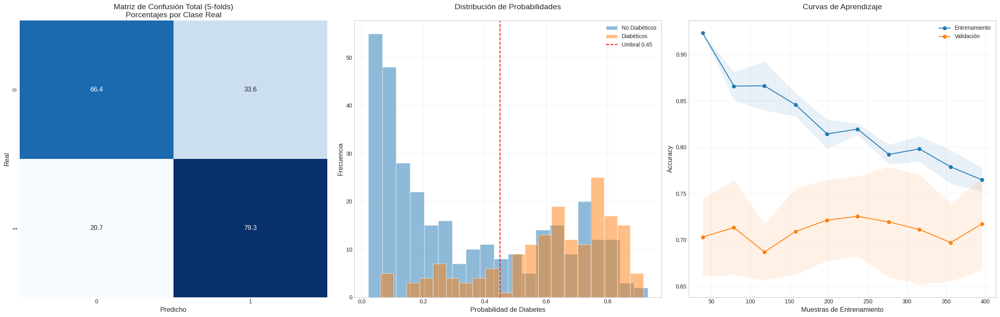

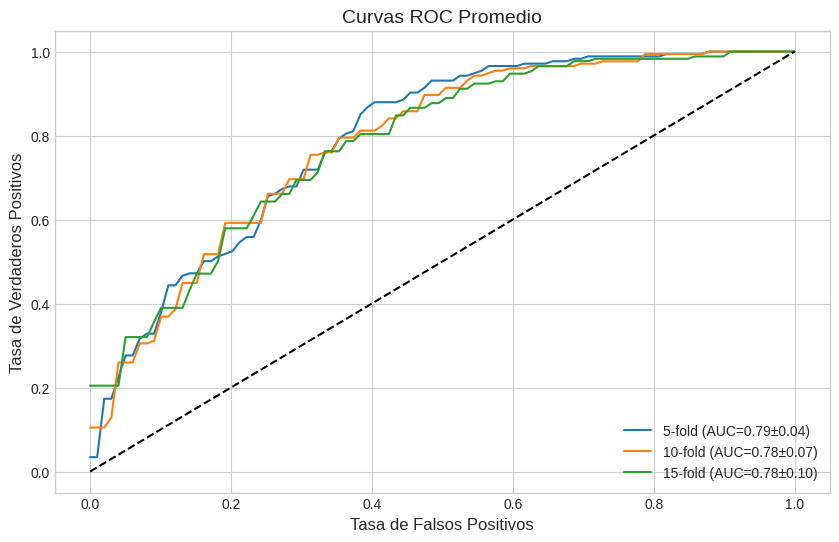


=== RESUMEN FINAL DE VALIDACIÓN ===

▶ 5-Fold CV:
  - Accuracy: 0.7091 ± 0.0411
  - AUC: 0.7922 ± 0.0389
  - Balanced Accuracy: 0.7280
  - F1 Macro: 0.7014
  - Clase 0 (No Diabéticos):
    * Precisión: 0.8574
    * Recall: 0.6632
    * F1: 0.7450
  - Clase 1 (Diabéticos):
    * Precisión: 0.5658
    * Recall: 0.7928
    * F1: 0.6579

▶ 10-Fold CV:
  - Accuracy: 0.7033 ± 0.0760
  - AUC: 0.7844 ± 0.0717
  - Balanced Accuracy: 0.7227
  - F1 Macro: 0.6952
  - Clase 0 (No Diabéticos):
    * Precisión: 0.8553
    * Recall: 0.6571
    * F1: 0.7405
  - Clase 1 (Diabéticos):
    * Precisión: 0.5567
    * Recall: 0.7882
    * F1: 0.6500

▶ 15-Fold CV:
  - Accuracy: 0.7051 ± 0.0738
  - AUC: 0.7800 ± 0.0988
  - Balanced Accuracy: 0.7206
  - F1 Macro: 0.6946
  - Clase 0 (No Diabéticos):
    * Precisión: 0.8495
    * Recall: 0.6664
    * F1: 0.7413
  - Clase 1 (Diabéticos):
    * Precisión: 0.5645
    * Recall: 0.7747
    * F1: 0.6479

● Brecha entrenamiento-validación: 0.0475
  Modelo bien balance

In [ ]:
from sklearn.model_selection import StratifiedKFold, learning_curve, train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.metrics import (classification_report, confusion_matrix,
                            accuracy_score, roc_curve, auc, precision_recall_curve,
                            balanced_accuracy_score, f1_score)
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings

# Configuración global
warnings.filterwarnings('ignore', category=UserWarning)
plt.style.use('seaborn-v0_8-whitegrid')
SEED = 42  # Semilla unificada

# ==================== DATOS Y PREPARACIÓN ====================
X_train_full, X_test, y_train_full, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=SEED, stratify=y_selected_with_features
)

# ==================== PIPELINE MEJORADO ====================
model_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('smote', BorderlineSMOTE(random_state=SEED, kind='borderline-1')),
    ('classifier', SVC(kernel='rbf', probability=True, random_state=SEED))
])

# ==================== VALIDACIÓN CRUZADA CORREGIDA ====================
fold_configs = [5, 10, 15]
results = {}
cutoff = 0.45  # Umbral personalizado

for n_folds in fold_configs:
    cv = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=SEED)

    fold_data = {
        'acc': [], 'auc': [], 'cm': [], 'probs': [],
        'prec0': [], 'rec0': [], 'f1_0': [],
        'prec1': [], 'rec1': [], 'f1_1': [],
        'fprs': [], 'tprs': [], 'thresholds': [],
        'bal_acc': [], 'f1_macro': []
    }

    print(f"\n=== {n_folds}-Fold Cross Validation (cutoff={cutoff}) ===")

    for fold, (train_idx, val_idx) in enumerate(cv.split(X_train_full, y_train_full), 1):
        # Preparación de datos
        X_train, X_val = X_train_full.iloc[train_idx], X_train_full.iloc[val_idx]
        y_train, y_val = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

        # Entrenamiento con pipeline
        model_pipeline.fit(X_train, y_train)
        y_prob = model_pipeline.predict_proba(X_val)[:, 1]
        y_pred = (y_prob >= cutoff).astype(int)

        # Cálculo de métricas corregidas
        report = classification_report(y_val, y_pred, output_dict=True)
        fpr, tpr, thresholds = roc_curve(y_val, y_prob)
        roc_auc = auc(fpr, tpr)  # Línea crítica añadida

        # Almacenamiento de resultados mejorado
        fold_data['acc'].append(accuracy_score(y_val, y_pred))
        fold_data['bal_acc'].append(balanced_accuracy_score(y_val, y_pred))
        fold_data['f1_macro'].append(f1_score(y_val, y_pred, average='macro'))
        fold_data['auc'].append(roc_auc)
        fold_data['cm'].append(confusion_matrix(y_val, y_pred))
        fold_data['probs'].extend(zip(y_prob, y_val))
        fold_data['fprs'].append(fpr)
        fold_data['tprs'].append(tpr)
        fold_data['thresholds'].append(thresholds)

        for cls in ['0', '1']:
            fold_data[f'prec{cls}'].append(report[cls]['precision'])
            fold_data[f'rec{cls}'].append(report[cls]['recall'])
            fold_data[f'f1_{cls}'].append(report[cls]['f1-score'])

        print(f"Fold {fold}: Acc={fold_data['acc'][-1]:.4f} | AUC={roc_auc:.4f} | B-Acc={fold_data['bal_acc'][-1]:.4f}")

    # Consolidación de resultados corregida
    results[n_folds] = {
        'mean_acc': np.mean(fold_data['acc']),
        'std_acc': np.std(fold_data['acc']),
        'mean_auc': np.mean(fold_data['auc']),
        'std_auc': np.std(fold_data['auc']),
        'mean_bal_acc': np.mean(fold_data['bal_acc']),
        'mean_f1_macro': np.mean(fold_data['f1_macro']),
        'total_cm': np.sum(fold_data['cm'], axis=0),  # Suma en lugar de promedio
        'class_metrics': {
            '0': {
                'precision': np.mean(fold_data['prec0']),
                'recall': np.mean(fold_data['rec0']),
                'f1': np.mean(fold_data['f1_0'])
            },
            '1': {
                'precision': np.mean(fold_data['prec1']),
                'recall': np.mean(fold_data['rec1']),
                'f1': np.mean(fold_data['f1_1'])
            }
        },
        'probs': fold_data['probs'],
        'fprs': fold_data['fprs'],
        'tprs': fold_data['tprs']
    }

# ==================== VISUALIZACIÓN MEJORADA ====================
plt.figure(figsize=(25, 8))

# Gráfico 1: Matriz de Confusión Total con Porcentajes
plt.subplot(1, 3, 1)
total_cm = results[5]['total_cm']
percentage_cm = total_cm / total_cm.sum(axis=1)[:, np.newaxis] * 100
sns.heatmap(percentage_cm, annot=True, fmt='.1f', cmap='Blues',
            annot_kws={'size':12}, cbar=False)
plt.title('Matriz de Confusión Total (5-folds)\nPorcentajes por Clase Real', fontsize=14)
plt.xlabel('Predicho', fontsize=12)
plt.ylabel('Real', fontsize=12)

# Gráfico 2: Distribución de Probabilidades con Cutoff
plt.subplot(1, 3, 2)
probs_array = np.array(results[5]['probs'])
plt.hist(probs_array[probs_array[:,1] == 0][:,0], bins=20,
         alpha=0.5, label='No Diabéticos')
plt.hist(probs_array[probs_array[:,1] == 1][:,0], bins=20,
         alpha=0.5, label='Diabéticos')
plt.axvline(cutoff, color='r', linestyle='--',
           label=f'Umbral {cutoff}')
plt.title('Distribución de Probabilidades\n', fontsize=14)
plt.xlabel('Probabilidad de Diabetes', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)

# Gráfico 3: Curvas de Aprendizaje Mejoradas
plt.subplot(1, 3, 3)
train_sizes, train_scores, val_scores = learning_curve(
    model_pipeline, X_train_full, y_train_full,
    cv=5, scoring='accuracy', n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10),
    random_state=SEED
)
plt.plot(train_sizes, np.mean(train_scores, 1), 'o-', label='Entrenamiento')
plt.plot(train_sizes, np.mean(val_scores, 1), 'o-', label='Validación')
plt.fill_between(train_sizes,
                 np.mean(train_scores, 1) - np.std(train_scores, 1),
                 np.mean(train_scores, 1) + np.std(train_scores, 1), alpha=0.1)
plt.fill_between(train_sizes,
                 np.mean(val_scores, 1) - np.std(val_scores, 1),
                 np.mean(val_scores, 1) + np.std(val_scores, 1), alpha=0.1)
plt.title('Curvas de Aprendizaje\n', fontsize=14)
plt.xlabel('Muestras de Entrenamiento', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Nueva figura para ROC
plt.figure(figsize=(10, 6))
for n_folds in fold_configs:
    mean_fpr = np.linspace(0, 1, 100)
    tprs = [np.interp(mean_fpr, fpr, tpr) for fpr, tpr in zip(results[n_folds]['fprs'], results[n_folds]['tprs'])]
    mean_tpr = np.mean(tprs, axis=0)
    plt.plot(mean_fpr, mean_tpr,
             label=f'{n_folds}-fold (AUC={results[n_folds]["mean_auc"]:.2f}±{results[n_folds]["std_auc"]:.2f})')  # Línea corregida
plt.plot([0, 1], [0, 1], 'k--')
plt.title('Curvas ROC Promedio', fontsize=14)
plt.xlabel('Tasa de Falsos Positivos', fontsize=12)
plt.ylabel('Tasa de Verdaderos Positivos', fontsize=12)
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# ==================== ANÁLISIS ESTADÍSTICO ACTUALIZADO ====================
print("\n=== RESUMEN FINAL DE VALIDACIÓN ===")
for n in fold_configs:
    print(f"""
▶ {n}-Fold CV:
  - Accuracy: {results[n]['mean_acc']:.4f} ± {results[n]['std_acc']:.4f}
  - AUC: {results[n]['mean_auc']:.4f} ± {results[n]['std_auc']:.4f}
  - Balanced Accuracy: {results[n]['mean_bal_acc']:.4f}
  - F1 Macro: {results[n]['mean_f1_macro']:.4f}
  - Clase 0 (No Diabéticos):
    * Precisión: {results[n]['class_metrics']['0']['precision']:.4f}
    * Recall: {results[n]['class_metrics']['0']['recall']:.4f}
    * F1: {results[n]['class_metrics']['0']['f1']:.4f}
  - Clase 1 (Diabéticos):
    * Precisión: {results[n]['class_metrics']['1']['precision']:.4f}
    * Recall: {results[n]['class_metrics']['1']['recall']:.4f}
    * F1: {results[n]['class_metrics']['1']['f1']:.4f}""")

# Análisis de brecha mejorado
gap = np.mean(train_scores[-1]) - np.mean(val_scores[-1])
print(f"\n● Brecha entrenamiento-validación: {gap:.4f}")
print("  Modelo bien balanceado (brecha < 5%)" if gap < 0.05 else "  Posible sobreajuste (brecha ≥ 5%)")


# Validacion externa modelo 1


=== 5-Fold Cross Validation (cutoff=0.45) ===
Fold 1: Acc=0.7576 | AUC=0.8410 | B-Acc=0.7523
Fold 2: Acc=0.6566 | AUC=0.7321 | B-Acc=0.6696
Fold 3: Acc=0.6869 | AUC=0.7656 | B-Acc=0.7190
Fold 4: Acc=0.6869 | AUC=0.8027 | B-Acc=0.7319
Fold 5: Acc=0.7576 | AUC=0.8196 | B-Acc=0.7672

=== 10-Fold Cross Validation (cutoff=0.45) ===
Fold 1: Acc=0.6800 | AUC=0.7736 | B-Acc=0.6578
Fold 2: Acc=0.8200 | AUC=0.8611 | B-Acc=0.8351
Fold 3: Acc=0.7400 | AUC=0.8160 | B-Acc=0.7604
Fold 4: Acc=0.5400 | AUC=0.6441 | B-Acc=0.5434
Fold 5: Acc=0.6000 | AUC=0.7309 | B-Acc=0.6267
Fold 6: Acc=0.7143 | AUC=0.8548 | B-Acc=0.7399
Fold 7: Acc=0.7347 | AUC=0.8235 | B-Acc=0.7693
Fold 8: Acc=0.7143 | AUC=0.7500 | B-Acc=0.7675
Fold 9: Acc=0.7551 | AUC=0.8787 | B-Acc=0.7987
Fold 10: Acc=0.7347 | AUC=0.7114 | B-Acc=0.7279

=== 15-Fold Cross Validation (cutoff=0.45) ===
Fold 1: Acc=0.6667 | AUC=0.6446 | B-Acc=0.6136
Fold 2: Acc=0.8182 | AUC=0.9215 | B-Acc=0.8409
Fold 3: Acc=0.7273 | AUC=0.7893 | B-Acc=0.7500
Fold 4: Ac

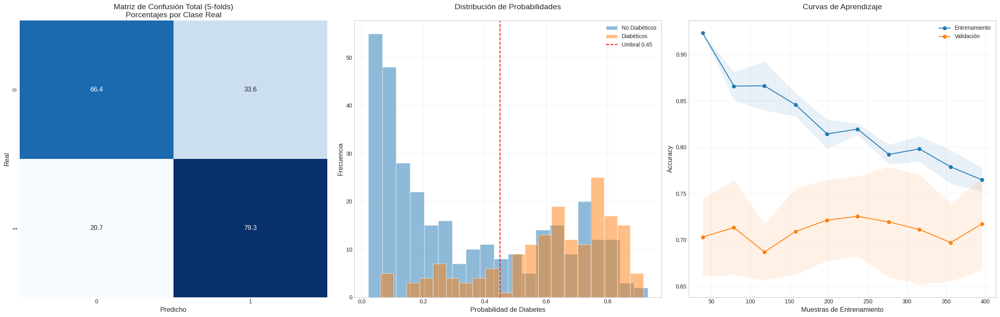

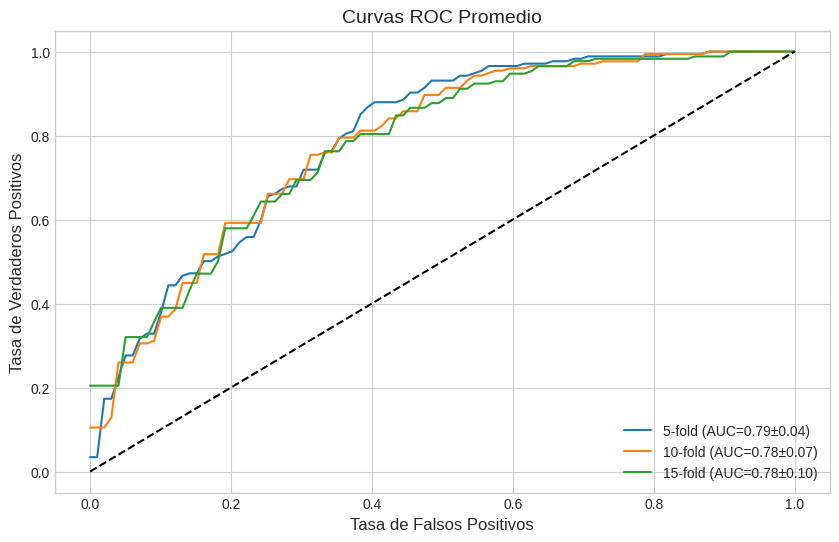


=== EVALUACIÓN EN TEST (30% NO VISTO) ===
Accuracy: 0.7934
Balanced Accuracy: 0.8162
AUC: 0.8650
F1 Macro: 0.7877

Matriz de Confusión (Porcentajes por Clase Real):
[[0.74 0.26]
 [0.11 0.89]]

Reporte Clasificación:
              precision    recall  f1-score   support

           0       0.93      0.74      0.82       138
           1       0.65      0.89      0.75        75

    accuracy                           0.79       213
   macro avg       0.79      0.82      0.79       213
weighted avg       0.83      0.79      0.80       213



In [ ]:
from sklearn.model_selection import StratifiedKFold, learning_curve, train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.metrics import (classification_report, confusion_matrix,
                             accuracy_score, roc_curve, auc,
                             balanced_accuracy_score, f1_score)
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings

# Configuración global
warnings.filterwarnings('ignore', category=UserWarning)
plt.style.use('seaborn-v0_8-whitegrid')
SEED = 42  # Semilla unificada

# ==================== DIVISIÓN DE DATOS CORREGIDA ====================
# Split estratificado 70-30 (train-test)
X_train_full, X_test, y_train_full, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=SEED, stratify=y_selected_with_features
)

# ==================== PIPELINE MEJORADO ====================
model_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('smote', BorderlineSMOTE(random_state=SEED, kind='borderline-1')),
    ('classifier', SVC(kernel='rbf', probability=True, random_state=SEED))
])

# ==================== VALIDACIÓN CRUZADA ESTRATIFICADA ====================
fold_configs = [5, 10, 15]
results = {}
cutoff = 0.45  # Umbral fijo

for n_folds in fold_configs:
    cv = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=SEED)

    fold_data = {
        'acc': [], 'auc': [], 'cm': [], 'probs': [],
        'prec0': [], 'rec0': [], 'f1_0': [],
        'prec1': [], 'rec1': [], 'f1_1': [],
        'bal_acc': [], 'f1_macro': [], 'fprs': [], 'tprs': []
    }

    print(f"\n=== {n_folds}-Fold Cross Validation (cutoff={cutoff}) ===")

    for fold, (train_idx, val_idx) in enumerate(cv.split(X_train_full, y_train_full), 1):
        # Preparación de datos
        X_train, X_val_fold = X_train_full.iloc[train_idx], X_train_full.iloc[val_idx]
        y_train, y_val_fold = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

        # Entrenamiento con pipeline
        model_pipeline.fit(X_train, y_train)
        y_prob = model_pipeline.predict_proba(X_val_fold)[:, 1]
        y_pred = (y_prob >= cutoff).astype(int)

        # Cálculo de métricas mejorado
        fpr, tpr, _ = roc_curve(y_val_fold, y_prob)
        roc_auc = auc(fpr, tpr)
        report = classification_report(y_val_fold, y_pred, output_dict=True)

        # Almacenamiento de resultados
        fold_data['acc'].append(accuracy_score(y_val_fold, y_pred))
        fold_data['bal_acc'].append(balanced_accuracy_score(y_val_fold, y_pred))
        fold_data['f1_macro'].append(f1_score(y_val_fold, y_pred, average='macro'))
        fold_data['auc'].append(roc_auc)
        fold_data['cm'].append(confusion_matrix(y_val_fold, y_pred))
        fold_data['probs'].extend(zip(y_prob, y_val_fold))
        fold_data['fprs'].append(fpr)
        fold_data['tprs'].append(tpr)

        for cls in ['0', '1']:
            fold_data[f'prec{cls}'].append(report.get(cls, {}).get('precision', 0))
            fold_data[f'rec{cls}'].append(report.get(cls, {}).get('recall', 0))
            fold_data[f'f1_{cls}'].append(report.get(cls, {}).get('f1-score', 0))

        print(f"Fold {fold}: Acc={fold_data['acc'][-1]:.4f} | AUC={roc_auc:.4f} | B-Acc={fold_data['bal_acc'][-1]:.4f}")

    # Consolidación de resultados corregida
    results[n_folds] = {
        'mean_acc': np.mean(fold_data['acc']),
        'std_acc': np.std(fold_data['acc']),
        'mean_auc': np.mean(fold_data['auc']),
        'std_auc': np.std(fold_data['auc']),
        'mean_bal_acc': np.mean(fold_data['bal_acc']),
        'mean_f1_macro': np.mean(fold_data['f1_macro']),
        'total_cm': np.sum(fold_data['cm'], axis=0),
        'class_metrics': {
            '0': {
                'precision': np.mean(fold_data['prec0']),
                'recall': np.mean(fold_data['rec0']),
                'f1': np.mean(fold_data['f1_0'])
            },
            '1': {
                'precision': np.mean(fold_data['prec1']),
                'recall': np.mean(fold_data['rec1']),
                'f1': np.mean(fold_data['f1_1'])
            }
        },
        'probs': fold_data['probs'],
        'fprs': fold_data['fprs'],
        'tprs': fold_data['tprs']
    }

# ==================== VISUALIZACIÓN MEJORADA ====================
plt.figure(figsize=(25, 8))

# Gráfico 1: Matriz de Confusión Total con Porcentajes
plt.subplot(1, 3, 1)
total_cm = results[5]['total_cm']
percentage_cm = total_cm / total_cm.sum(axis=1)[:, np.newaxis] * 100
sns.heatmap(percentage_cm, annot=True, fmt='.1f', cmap='Blues',
            annot_kws={'size':12}, cbar=False)
plt.title('Matriz de Confusión Total (5-folds)\nPorcentajes por Clase Real', fontsize=14)
plt.xlabel('Predicho', fontsize=12)
plt.ylabel('Real', fontsize=12)

# Gráfico 2: Distribución de Probabilidades con Cutoff
plt.subplot(1, 3, 2)
probs_array = np.array(results[5]['probs'])
plt.hist(probs_array[probs_array[:,1] == 0][:,0], bins=20,
         alpha=0.5, label='No Diabéticos')
plt.hist(probs_array[probs_array[:,1] == 1][:,0], bins=20,
         alpha=0.5, label='Diabéticos')
plt.axvline(cutoff, color='r', linestyle='--', label=f'Umbral {cutoff}')
plt.title('Distribución de Probabilidades\n', fontsize=14)
plt.xlabel('Probabilidad de Diabetes', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)

# Gráfico 3: Curvas de Aprendizaje Corregidas
plt.subplot(1, 3, 3)
train_sizes, train_scores, val_scores = learning_curve(
    model_pipeline, X_train_full, y_train_full,
    cv=5, scoring='accuracy', n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10)
)
plt.plot(train_sizes, np.mean(train_scores, 1), 'o-', label='Entrenamiento')
plt.plot(train_sizes, np.mean(val_scores, 1), 'o-', label='Validación')
plt.fill_between(train_sizes,
                 np.mean(train_scores, 1) - np.std(train_scores, 1),
                 np.mean(train_scores, 1) + np.std(train_scores, 1), alpha=0.1)
plt.fill_between(train_sizes,
                 np.mean(val_scores, 1) - np.std(val_scores, 1),
                 np.mean(val_scores, 1) + np.std(val_scores, 1), alpha=0.1)
plt.title('Curvas de Aprendizaje\n', fontsize=14)
plt.xlabel('Muestras de Entrenamiento', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Nueva figura para ROC
plt.figure(figsize=(10, 6))
for n_folds in fold_configs:
    mean_fpr = np.linspace(0, 1, 100)
    tprs = [np.interp(mean_fpr, fpr, tpr) for fpr, tpr in zip(results[n_folds]['fprs'], results[n_folds]['tprs'])]
    mean_tpr = np.mean(tprs, axis=0)
    plt.plot(mean_fpr, mean_tpr,
             label=f'{n_folds}-fold (AUC={results[n_folds]["mean_auc"]:.2f}±{results[n_folds]["std_auc"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.title('Curvas ROC Promedio', fontsize=14)
plt.xlabel('Tasa de Falsos Positivos', fontsize=12)
plt.ylabel('Tasa de Verdaderos Positivos', fontsize=12)
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# ==================== EVALUACIÓN FINAL EN TEST ====================
print("\n=== EVALUACIÓN EN TEST (30% NO VISTO) ===")
final_model = model_pipeline.fit(X_train_full, y_train_full)
y_test_prob = final_model.predict_proba(X_test)[:, 1]
y_test_pred = (y_test_prob >= cutoff).astype(int)

# Métricas completas
test_cm = confusion_matrix(y_test, y_test_pred)
test_auc = auc(roc_curve(y_test, y_test_prob)[0], roc_curve(y_test, y_test_prob)[1])

print(f"Accuracy: {accuracy_score(y_test, y_test_pred):.4f}")
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, y_test_pred):.4f}")
print(f"AUC: {test_auc:.4f}")
print(f"F1 Macro: {f1_score(y_test, y_test_pred, average='macro'):.4f}\n")
print("Matriz de Confusión (Porcentajes por Clase Real):")
print((test_cm / test_cm.sum(axis=1)[:, np.newaxis]).round(2))
print("\nReporte Clasificación:")
print(classification_report(y_test, y_test_pred))


# Evaluacion interna modelo 2:


=== 5-Fold CV con Optimización de Umbral ===
Fold 1: Umbral=0.3735 | Acc=0.7576 | B-Acc=0.7663
Fold 2: Umbral=0.4959 | Acc=0.6667 | B-Acc=0.6710
Fold 3: Umbral=0.4224 | Acc=0.6970 | B-Acc=0.7333
Fold 4: Umbral=0.5694 | Acc=0.7172 | B-Acc=0.7165
Fold 5: Umbral=0.3082 | Acc=0.6970 | B-Acc=0.7268

=== 10-Fold CV con Optimización de Umbral ===
Fold 1: Umbral=0.5122 | Acc=0.7200 | B-Acc=0.6881
Fold 2: Umbral=0.3082 | Acc=0.7800 | B-Acc=0.8038
Fold 3: Umbral=0.5204 | Acc=0.7400 | B-Acc=0.7604
Fold 4: Umbral=0.3735 | Acc=0.6400 | B-Acc=0.6944
Fold 5: Umbral=0.3490 | Acc=0.6400 | B-Acc=0.6823
Fold 6: Umbral=0.4469 | Acc=0.7143 | B-Acc=0.7399
Fold 7: Umbral=0.3571 | Acc=0.6939 | B-Acc=0.7381
Fold 8: Umbral=0.6592 | Acc=0.6327 | B-Acc=0.6085
Fold 9: Umbral=0.4633 | Acc=0.7551 | B-Acc=0.7849
Fold 10: Umbral=0.3490 | Acc=0.6939 | B-Acc=0.6967

=== 15-Fold CV con Optimización de Umbral ===
Fold 1: Umbral=0.5041 | Acc=0.6667 | B-Acc=0.6136
Fold 2: Umbral=0.5286 | Acc=0.8182 | B-Acc=0.8409
Fold 3: U

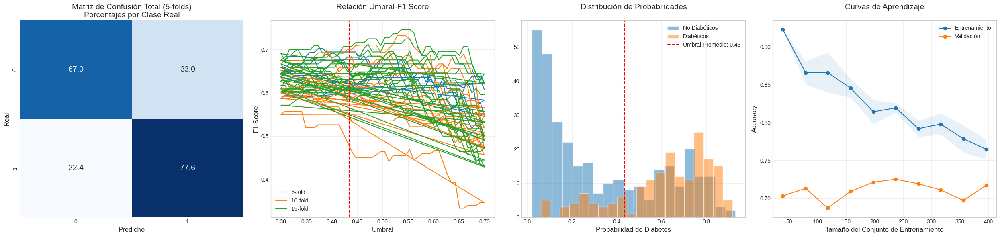


=== RESUMEN DE VALIDACIÓN ===

▶ 5-Fold CV:
  - Accuracy: 0.7071 ± 0.0300
  - Balanced Accuracy: 0.7228
  - AUC: 0.7922 ± 0.0389
  - F1 Macro: 0.6986
  - Umbral Promedio: 0.4339
  - Clase 0 (No Diabéticos):
    * Precisión: 0.8485
    * Recall: 0.6696
    * F1: 0.7468
  - Clase 1 (Diabéticos):
    * Precisión: 0.5619
    * Recall: 0.7760
    * F1: 0.6503

▶ 10-Fold CV:
  - Accuracy: 0.7010 ± 0.0484
  - Balanced Accuracy: 0.7197
  - AUC: 0.7844 ± 0.0717
  - F1 Macro: 0.6913
  - Umbral Promedio: 0.4339
  - Clase 0 (No Diabéticos):
    * Precisión: 0.8571
    * Recall: 0.6538
    * F1: 0.7369
  - Clase 1 (Diabéticos):
    * Precisión: 0.5543
    * Recall: 0.7856
    * F1: 0.6458

▶ 15-Fold CV:
  - Accuracy: 0.6990 ± 0.0794
  - Balanced Accuracy: 0.7123
  - AUC: 0.7800 ± 0.0988
  - F1 Macro: 0.6859
  - Umbral Promedio: 0.4529
  - Clase 0 (No Diabéticos):
    * Precisión: 0.8475
    * Recall: 0.6631
    * F1: 0.7344
  - Clase 1 (Diabéticos):
    * Precisión: 0.5586
    * Recall: 0.7616
   

In [ ]:
from sklearn.model_selection import StratifiedKFold, learning_curve, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.under_sampling import InstanceHardnessThreshold
from imblearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.metrics import (classification_report, confusion_matrix,
                            accuracy_score, roc_curve, auc,
                            recall_score, precision_score, f1_score,
                            balanced_accuracy_score)
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings

# Configuración global
warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-whitegrid')
SEED = 42

# ==================== DIVISIÓN DE DATOS 70-30 ====================
X_train_full, X_test, y_train_full, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=SEED, stratify=y_selected_with_features
)

# ==================== PIPELINE CORREGIDO ====================
model_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('smote', BorderlineSMOTE(random_state=SEED, kind='borderline-1')),
    ('ipf', InstanceHardnessThreshold(
        estimator=LogisticRegression(max_iter=1000, random_state=SEED),  # Estimador diferente
        random_state=SEED
    )),
    ('classifier', SVC(kernel='rbf', probability=True,
                      random_state=SEED, class_weight='balanced'))
])

# ==================== VALIDACIÓN CRUZADA MEJORADA ====================
fold_configs = [5, 10, 15]
results = {}

for n_folds in fold_configs:
    cv = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=SEED)

    fold_data = {
        'acc': [], 'auc': [], 'cm': [], 'best_thresholds': [],
        'prec0': [], 'rec0': [], 'f1_0': [],
        'prec1': [], 'rec1': [], 'f1_1': [],
        'all_thresholds': [], 'probs': [],
        'bal_acc': [], 'f1_macro': []
    }

    print(f"\n=== {n_folds}-Fold CV con Optimización de Umbral ===")

    for fold, (train_idx, val_idx) in enumerate(cv.split(X_train_full, y_train_full), 1):
        X_train, X_val = X_train_full.iloc[train_idx], X_train_full.iloc[val_idx]
        y_train, y_val = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

        # Split interno para optimización de umbral
        X_train_inner, X_val_inner, y_train_inner, y_val_inner = train_test_split(
            X_train, y_train, test_size=0.2, stratify=y_train, random_state=SEED
        )

        # Entrenamiento en subset interno
        model_pipeline.fit(X_train_inner, y_train_inner)
        y_prob_inner = model_pipeline.predict_proba(X_val_inner)[:,1]

        # Optimización de umbral
        thresholds = np.linspace(0.3, 0.7, 50)  # Rango extendido
        fold_results = []

        for th in thresholds:
            y_pred_inner = (y_prob_inner >= th).astype(int)
            fold_results.append({
                'threshold': th,
                'recall': recall_score(y_val_inner, y_pred_inner),
                'precision': precision_score(y_val_inner, y_pred_inner),
                'f1': f1_score(y_val_inner, y_pred_inner)
            })

        df_results = pd.DataFrame(fold_results)

        # Selección del mejor umbral
        high_recall = df_results[df_results['recall'] > 0.85]
        best_idx = high_recall['f1'].idxmax() if not high_recall.empty else df_results['f1'].idxmax()
        best_threshold = df_results.loc[best_idx, 'threshold']

        # Entrenamiento final con todo el fold de entrenamiento
        model_pipeline.fit(X_train, y_train)
        y_prob = model_pipeline.predict_proba(X_val)[:,1]
        y_pred_best = (y_prob >= best_threshold).astype(int)

        # Cálculo de métricas
        fpr, tpr, _ = roc_curve(y_val, y_prob)
        roc_auc = auc(fpr, tpr)
        report = classification_report(y_val, y_pred_best, output_dict=True)

        # Almacenamiento de resultados
        fold_data['acc'].append(accuracy_score(y_val, y_pred_best))
        fold_data['bal_acc'].append(balanced_accuracy_score(y_val, y_pred_best))
        fold_data['f1_macro'].append(f1_score(y_val, y_pred_best, average='macro'))
        fold_data['auc'].append(roc_auc)
        fold_data['cm'].append(confusion_matrix(y_val, y_pred_best))
        fold_data['best_thresholds'].append(best_threshold)
        fold_data['all_thresholds'].append(df_results)
        fold_data['probs'].extend(zip(y_prob, y_val))

        for cls in ['0', '1']:
            fold_data[f'prec{cls}'].append(report.get(cls, {}).get('precision', 0))
            fold_data[f'rec{cls}'].append(report.get(cls, {}).get('recall', 0))
            fold_data[f'f1_{cls}'].append(report.get(cls, {}).get('f1-score', 0))

        print(f"Fold {fold}: Umbral={best_threshold:.4f} | Acc={fold_data['acc'][-1]:.4f} | B-Acc={fold_data['bal_acc'][-1]:.4f}")

    # Consolidación de resultados
    results[n_folds] = {
        'mean_acc': np.mean(fold_data['acc']),
        'std_acc': np.std(fold_data['acc']),
        'mean_auc': np.mean(fold_data['auc']),
        'std_auc': np.std(fold_data['auc']),
        'mean_bal_acc': np.mean(fold_data['bal_acc']),
        'mean_f1_macro': np.mean(fold_data['f1_macro']),
        'mean_threshold': np.mean(fold_data['best_thresholds']),
        'total_cm': np.sum(fold_data['cm'], axis=0),
        'class_metrics': {
            '0': {
                'precision': np.mean(fold_data['prec0']),
                'recall': np.mean(fold_data['rec0']),
                'f1': np.mean(fold_data['f1_0'])
            },
            '1': {
                'precision': np.mean(fold_data['prec1']),
                'recall': np.mean(fold_data['rec1']),
                'f1': np.mean(fold_data['f1_1'])
            }
        },
        'probs': fold_data['probs'],
        'all_thresholds': pd.concat(fold_data['all_thresholds'])
    }

# ==================== VISUALIZACIÓN ACTUALIZADA ====================
plt.figure(figsize=(25, 6))

# Gráfico 1: Matriz de Confusión Total
plt.subplot(1, 4, 1)
total_cm = results[5]['total_cm']
percentage_cm = total_cm / total_cm.sum(axis=1)[:, np.newaxis] * 100
sns.heatmap(percentage_cm, annot=True, fmt='.1f', cmap='Blues',
           annot_kws={'size':14}, cbar=False)
plt.title('Matriz de Confusión Total (5-folds)\nPorcentajes por Clase Real', fontsize=14)
plt.xlabel('Predicho', fontsize=12)
plt.ylabel('Real', fontsize=12)

# Gráfico 2: Curva de Umbrales Óptimos
plt.subplot(1, 4, 2)
for n in fold_configs:
    plt.plot(results[n]['all_thresholds']['threshold'],
             results[n]['all_thresholds']['f1'],
             label=f'{n}-fold')
plt.axvline(results[5]['mean_threshold'], color='r', linestyle='--')
plt.title('Relación Umbral-F1 Score\n', fontsize=14)
plt.xlabel('Umbral', fontsize=12)
plt.ylabel('F1-Score', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)

# Gráfico 3: Distribución de Probabilidades
plt.subplot(1, 4, 3)
probs_array = np.array(results[5]['probs'])
plt.hist(probs_array[probs_array[:,1]==0][:,0], bins=20, alpha=0.5, label='No Diabéticos')
plt.hist(probs_array[probs_array[:,1]==1][:,0], bins=20, alpha=0.5, label='Diabéticos')
plt.axvline(results[5]['mean_threshold'], color='r', linestyle='--',
           label=f'Umbral Promedio: {results[5]["mean_threshold"]:.2f}')
plt.title('Distribución de Probabilidades\n', fontsize=14)
plt.xlabel('Probabilidad de Diabetes', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)

# Gráfico 4: Curvas de Aprendizaje Corregidas
plt.subplot(1, 4, 4)
train_sizes, train_scores, val_scores = learning_curve(
    model_pipeline, X_train_full, y_train_full,  # Usar solo datos de entrenamiento
    cv=5, scoring='accuracy', n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10), random_state=SEED
)
plt.plot(train_sizes, np.mean(train_scores, 1), 'o-', label='Entrenamiento')
plt.plot(train_sizes, np.mean(val_scores, 1), 'o-', label='Validación')
plt.fill_between(train_sizes,
                 np.mean(train_scores, 1)-np.std(train_scores, 1),
                 np.mean(train_scores, 1)+np.std(train_scores, 1), alpha=0.1)
plt.title('Curvas de Aprendizaje\n', fontsize=14)
plt.xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# ==================== ANÁLISIS FINAL MEJORADO ====================
print("\n=== RESUMEN DE VALIDACIÓN ===")
for n in fold_configs:
    print(f"""
▶ {n}-Fold CV:
  - Accuracy: {results[n]['mean_acc']:.4f} ± {results[n]['std_acc']:.4f}
  - Balanced Accuracy: {results[n]['mean_bal_acc']:.4f}
  - AUC: {results[n]['mean_auc']:.4f} ± {results[n]['std_auc']:.4f}
  - F1 Macro: {results[n]['mean_f1_macro']:.4f}
  - Umbral Promedio: {results[n]['mean_threshold']:.4f}
  - Clase 0 (No Diabéticos):
    * Precisión: {results[n]['class_metrics']['0']['precision']:.4f}
    * Recall: {results[n]['class_metrics']['0']['recall']:.4f}
    * F1: {results[n]['class_metrics']['0']['f1']:.4f}
  - Clase 1 (Diabéticos):
    * Precisión: {results[n]['class_metrics']['1']['precision']:.4f}
    * Recall: {results[n]['class_metrics']['1']['recall']:.4f}
    * F1: {results[n]['class_metrics']['1']['f1']:.4f}""")

# Análisis de brecha
gap = np.mean(train_scores[-1]) - np.mean(val_scores[-1])
print(f"\n● Brecha entrenamiento-validación: {gap:.4f}")
print("  Modelo bien balanceado (brecha < 5%)" if gap < 0.05 else "  Considerar regularización")


# Validacion externa modelo 2


=== 5-Fold Cross Validation ===
Fold 1: Umbral=0.3735 | Recall=0.7941
Fold 2: Umbral=0.5000 | Recall=0.6857
Fold 3: Umbral=0.4224 | Recall=0.8571
Fold 4: Umbral=0.5000 | Recall=0.8857
Fold 5: Umbral=0.3082 | Recall=0.8286

=== 10-Fold Cross Validation ===
Fold 1: Umbral=0.5000 | Recall=0.5882
Fold 2: Umbral=0.5000 | Recall=0.8889
Fold 3: Umbral=0.5000 | Recall=0.8333
Fold 4: Umbral=0.3735 | Recall=0.8889
Fold 5: Umbral=0.5000 | Recall=0.7222
Fold 6: Umbral=0.4469 | Recall=0.8235
Fold 7: Umbral=0.5000 | Recall=0.8235
Fold 8: Umbral=0.5000 | Recall=0.9412
Fold 9: Umbral=0.5000 | Recall=0.8824
Fold 10: Umbral=0.5000 | Recall=0.6471

=== 15-Fold Cross Validation ===
Fold 1: Umbral=0.5000 | Recall=0.4545
Fold 2: Umbral=0.5000 | Recall=0.9091
Fold 3: Umbral=0.5000 | Recall=0.6364
Fold 4: Umbral=0.5000 | Recall=0.9091
Fold 5: Umbral=0.4714 | Recall=0.5455
Fold 6: Umbral=0.4714 | Recall=0.6364
Fold 7: Umbral=0.3000 | Recall=0.9167
Fold 8: Umbral=0.5000 | Recall=0.7500
Fold 9: Umbral=0.5000 | 

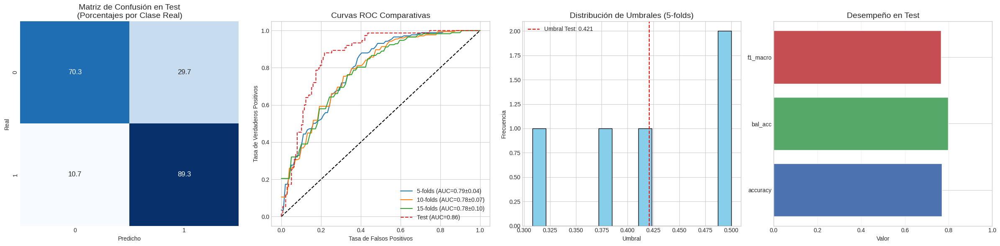


=== RESUMEN DE VALIDACIÓN CRUZADA (5-folds) ===
► Umbral Óptimo: 0.4208 ± 0.0741
► Accuracy: 0.7091 ± 0.0309
► Balanced Accuracy: 0.7321
► AUC: 0.7922 ± 0.0389
► Recall Clase 1: 0.8103 ± 0.0693

=== RESULTADOS EN TEST ===
► Accuracy: 0.7700
► Balanced Accuracy: 0.7981
► AUC: 0.8650
► F1 Macro: 0.7653
► Recall Clase 1: 0.8933
              precision    recall  f1-score   support

           0     0.9238    0.7029    0.7984       138
           1     0.6204    0.8933    0.7322        75

    accuracy                         0.7700       213
   macro avg     0.7721    0.7981    0.7653       213
weighted avg     0.8170    0.7700    0.7751       213


● Brecha entrenamiento-validación: 0.0475
  Modelo bien balanceado (brecha < 5%)


In [ ]:
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import StratifiedKFold, learning_curve, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.under_sampling import InstanceHardnessThreshold
from imblearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.metrics import (classification_report, confusion_matrix,
                            accuracy_score, roc_curve, auc, balanced_accuracy_score,
                            precision_score, recall_score, f1_score)

# ==================== CONFIGURACIÓN GLOBAL ====================
warnings.filterwarnings('ignore', category=UserWarning)
plt.style.use('seaborn-v0_8-whitegrid')
SEED = 42  # Semilla unificada

# ==================== DIVISIÓN CORRECTA 70-30 ====================
X_train_full, X_test, y_train_full, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3,  # 30% test final
    random_state=SEED,
    stratify=y_selected_with_features
)

# ==================== PIPELINE CORREGIDO SIN DATA LEAKAGE ====================
final_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('smote', BorderlineSMOTE(random_state=SEED, kind='borderline-1')),
    ('ipf', InstanceHardnessThreshold(
        estimator=LogisticRegression(max_iter=1000, random_state=SEED),
        random_state=SEED
    )),
    ('classifier', SVC(kernel='rbf', class_weight='balanced',
                      probability=True, random_state=SEED))
])

# ==================== VALIDACIÓN CRUZADA MEJORADA ====================
fold_configs = [5, 10, 15]
results = {}

for n_folds in fold_configs:
    cv = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=SEED)

    fold_data = {
        'best_thresholds': [], 'acc': [], 'auc': [],
        'bal_acc': [], 'f1_macro': [], 'recall_1': [], 'prec_1': [], 'f1_1': [],
        'cm': [], 'fprs': [], 'tprs': []
    }

    print(f"\n=== {n_folds}-Fold Cross Validation ===")

    for fold, (train_idx, val_idx) in enumerate(cv.split(X_train_full, y_train_full), 1):
        X_train, X_val_fold = X_train_full.iloc[train_idx], X_train_full.iloc[val_idx]
        y_train, y_val_fold = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

        # Split interno para optimización (80-20)
        X_train_inner, X_val_inner, y_train_inner, y_val_inner = train_test_split(
            X_train, y_train, test_size=0.2, stratify=y_train, random_state=SEED
        )

        # Entrenamiento en subset interno
        final_pipeline.fit(X_train_inner, y_train_inner)
        y_prob_inner = final_pipeline.predict_proba(X_val_inner)[:, 1]

        # Optimización de umbral en datos internos
        thresholds = np.linspace(0.3, 0.7, 50)
        best_f1 = -1
        best_threshold = 0.5
        for th in thresholds:
            y_pred = (y_prob_inner >= th).astype(int)
            current_f1 = f1_score(y_val_inner, y_pred)
            if current_f1 > best_f1 and recall_score(y_val_inner, y_pred) > 0.85:
                best_f1 = current_f1
                best_threshold = th

        # Entrenamiento final con fold completo
        final_pipeline.fit(X_train, y_train)
        y_prob_val = final_pipeline.predict_proba(X_val_fold)[:, 1]
        y_pred_val = (y_prob_val >= best_threshold).astype(int)

        # Cálculo de métricas
        fpr, tpr, _ = roc_curve(y_val_fold, y_prob_val)
        fold_data['best_thresholds'].append(best_threshold)
        fold_data['acc'].append(accuracy_score(y_val_fold, y_pred_val))
        fold_data['bal_acc'].append(balanced_accuracy_score(y_val_fold, y_pred_val))
        fold_data['f1_macro'].append(f1_score(y_val_fold, y_pred_val, average='macro'))
        fold_data['auc'].append(auc(fpr, tpr))
        fold_data['recall_1'].append(recall_score(y_val_fold, y_pred_val))
        fold_data['prec_1'].append(precision_score(y_val_fold, y_pred_val))
        fold_data['f1_1'].append(f1_score(y_val_fold, y_pred_val))
        fold_data['cm'].append(confusion_matrix(y_val_fold, y_pred_val))
        fold_data['fprs'].append(fpr)
        fold_data['tprs'].append(tpr)

        print(f"Fold {fold}: Umbral={best_threshold:.4f} | Recall={fold_data['recall_1'][-1]:.4f}")

    # Calcular mean_fpr y mean_tpr
    mean_fpr = np.linspace(0, 1, 100)
    tprs = [np.interp(mean_fpr, fpr, tpr) for fpr, tpr in zip(fold_data['fprs'], fold_data['tprs'])]
    mean_tpr = np.mean(tprs, axis=0)

    # Consolidación de resultados CORREGIDA
    results[n_folds] = {
        'best_thresholds': fold_data['best_thresholds'],
        'mean_threshold': np.mean(fold_data['best_thresholds']),
        'std_threshold': np.std(fold_data['best_thresholds']),
        'mean_acc': np.mean(fold_data['acc']),
        'std_acc': np.std(fold_data['acc']),
        'mean_bal_acc': np.mean(fold_data['bal_acc']),
        'mean_f1_macro': np.mean(fold_data['f1_macro']),
        'mean_auc': np.mean(fold_data['auc']),
        'std_auc': np.std(fold_data['auc']),
        'total_cm': np.sum(fold_data['cm'], axis=0),
        'mean_fpr': mean_fpr,
        'mean_tpr': mean_tpr,
        # Métricas específicas de clase 1 añadidas
        'mean_recall_1': np.mean(fold_data['recall_1']),
        'std_recall_1': np.std(fold_data['recall_1']),
        'mean_prec_1': np.mean(fold_data['prec_1']),
        'std_prec_1': np.std(fold_data['prec_1']),
        'mean_f1_1': np.mean(fold_data['f1_1']),
        'std_f1_1': np.std(fold_data['f1_1'])
    }

# ==================== EVALUACIÓN FINAL EN TEST ====================
final_pipeline.fit(X_train_full, y_train_full)
best_threshold = results[5]['mean_threshold']
y_prob_test = final_pipeline.predict_proba(X_test)[:, 1]
y_pred_test = (y_prob_test >= best_threshold).astype(int)

# Métricas completas
test_metrics = {
    'accuracy': accuracy_score(y_test, y_pred_test),
    'bal_acc': balanced_accuracy_score(y_test, y_pred_test),
    'auc': auc(*roc_curve(y_test, y_prob_test)[:2]),
    'recall_1': recall_score(y_test, y_pred_test),
    'prec_1': precision_score(y_test, y_pred_test),
    'f1_1': f1_score(y_test, y_pred_test),
    'f1_macro': f1_score(y_test, y_pred_test, average='macro'),
    'cm': confusion_matrix(y_test, y_pred_test)
}

# ==================== VISUALIZACIÓN PROFESIONAL MEJORADA ====================
plt.figure(figsize=(24, 6))

# Gráfico 1: Matriz de Confusión en Test
plt.subplot(1, 4, 1)
percentage_cm = test_metrics['cm'] / test_metrics['cm'].sum(axis=1)[:, np.newaxis] * 100
sns.heatmap(percentage_cm, annot=True, fmt='.1f', cmap='Blues',
            annot_kws={'size':12}, cbar=False)
plt.title('Matriz de Confusión en Test\n(Porcentajes por Clase Real)', fontsize=14)
plt.xlabel('Predicho')
plt.ylabel('Real')

# Gráfico 2: Curvas ROC Comparativas
plt.subplot(1, 4, 2)
plt.plot([0, 1], [0, 1], 'k--')
for n in fold_configs:
    plt.plot(results[n]['mean_fpr'], results[n]['mean_tpr'],
             label=f'{n}-folds (AUC={results[n]["mean_auc"]:.2f}±{results[n]["std_auc"]:.2f})')
plt.plot(*roc_curve(y_test, y_prob_test)[:2],
         label=f'Test (AUC={test_metrics["auc"]:.2f})', linestyle='--')
plt.title('Curvas ROC Comparativas', fontsize=14)
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.legend(loc='lower right')

# Gráfico 3: Distribución de Umbrales
plt.subplot(1, 4, 3)
plt.hist(results[5]['best_thresholds'], bins=15, color='skyblue', edgecolor='black')
plt.axvline(best_threshold, color='r', linestyle='--',
            label=f'Umbral Test: {best_threshold:.3f}')
plt.title('Distribución de Umbrales (5-folds)', fontsize=14)
plt.xlabel('Umbral')
plt.ylabel('Frecuencia')
plt.legend()

# Gráfico 4: Comparativa de Métricas
plt.subplot(1, 4, 4)
metrics = ['accuracy', 'bal_acc', 'f1_macro']
values = [test_metrics[m] for m in metrics]
plt.barh(metrics, values, color=['#4c72b0', '#55a868', '#c44e52'])
plt.xlim(0, 1)
plt.title('Desempeño en Test', fontsize=14)
plt.xlabel('Valor')
plt.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

# ==================== REPORTE FINAL CORREGIDO ====================
print("\n=== RESUMEN DE VALIDACIÓN CRUZADA (5-folds) ===")
print(f"► Umbral Óptimo: {results[5]['mean_threshold']:.4f} ± {results[5]['std_threshold']:.4f}")
print(f"► Accuracy: {results[5]['mean_acc']:.4f} ± {results[5]['std_acc']:.4f}")
print(f"► Balanced Accuracy: {results[5]['mean_bal_acc']:.4f}")
print(f"► AUC: {results[5]['mean_auc']:.4f} ± {results[5]['std_auc']:.4f}")
print(f"► Recall Clase 1: {results[5]['mean_recall_1']:.4f} ± {results[5]['std_recall_1']:.4f}")

print("\n=== RESULTADOS EN TEST ===")
print(f"► Accuracy: {test_metrics['accuracy']:.4f}")
print(f"► Balanced Accuracy: {test_metrics['bal_acc']:.4f}")
print(f"► AUC: {test_metrics['auc']:.4f}")
print(f"► F1 Macro: {test_metrics['f1_macro']:.4f}")
print(f"► Recall Clase 1: {test_metrics['recall_1']:.4f}")
print(classification_report(y_test, y_pred_test, digits=4))

# ==================== ANÁLISIS DE SOBREAJUSTE ====================
train_sizes, train_scores, val_scores = learning_curve(
    final_pipeline, X_train_full, y_train_full,
    cv=5, scoring='accuracy', n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10),
    random_state=SEED
)

gap = np.mean(train_scores[-1]) - np.mean(val_scores[-1])
print(f"\n● Brecha entrenamiento-validación: {gap:.4f}")
print("  Modelo bien balanceado (brecha < 5%)" if gap < 0.05 else "  Posible sobreajuste")


In [ ]:
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.under_sampling import InstanceHardnessThreshold
from imblearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.metrics import (classification_report, confusion_matrix,
                             accuracy_score, roc_curve, auc,
                             recall_score, precision_score, f1_score,
                             balanced_accuracy_score)
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings

# Configuración global
warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-whitegrid')
SEED = 42

# ==================== DIVISIÓN DE DATOS 70-30 ====================
X_train_full, X_test, y_train_full, y_test = train_test_split(
    X_selected_with_features, y_selected_with_features,
    test_size=0.3, random_state=SEED, stratify=y_selected_with_features
)

# ==================== PIPELINE CORREGIDO ====================
model_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('smote', BorderlineSMOTE(random_state=SEED, kind='borderline-1')),
    ('ipf', InstanceHardnessThreshold(
        estimator=LogisticRegression(max_iter=1000, random_state=SEED),  # Estimador diferente
        random_state=SEED
    )),
    ('classifier', SVC(kernel='rbf', probability=True,
                      random_state=SEED, class_weight='balanced'))
])

# ==================== VALIDACIÓN CRUZADA CON UMBRAL FIJO ====================
fold_configs = [5, 10, 15]
results = {}
fixed_threshold = 0.4793  # Umbral fijo

for n_folds in fold_configs:
    cv = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=SEED)

    fold_data = {
        'acc': [], 'auc': [], 'cm': [],
        'prec0': [], 'rec0': [], 'f1_0': [],
        'prec1': [], 'rec1': [], 'f1_1': [],
        'bal_acc': [], 'f1_macro': []
    }

    print(f"\n=== {n_folds}-Fold CV con Umbral Fijo ({fixed_threshold}) ===")

    for fold, (train_idx, val_idx) in enumerate(cv.split(X_train_full, y_train_full), 1):
        X_train, X_val = X_train_full.iloc[train_idx], X_train_full.iloc[val_idx]
        y_train, y_val = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

        # Entrenamiento del modelo con el fold de entrenamiento
        model_pipeline.fit(X_train, y_train)
        y_prob = model_pipeline.predict_proba(X_val)[:, 1]
        y_pred_fixed = (y_prob >= fixed_threshold).astype(int)

        # Cálculo de métricas
        fpr, tpr, _ = roc_curve(y_val, y_prob)
        roc_auc = auc(fpr, tpr)
        report = classification_report(y_val, y_pred_fixed, output_dict=True)

        # Almacenamiento de resultados
        fold_data['acc'].append(accuracy_score(y_val, y_pred_fixed))
        fold_data['bal_acc'].append(balanced_accuracy_score(y_val, y_pred_fixed))
        fold_data['f1_macro'].append(f1_score(y_val, y_pred_fixed, average='macro'))
        fold_data['auc'].append(roc_auc)
        fold_data['cm'].append(confusion_matrix(y_val, y_pred_fixed))

        for cls in ['0', '1']:
            fold_data[f'prec{cls}'].append(report.get(cls, {}).get('precision', 0))
            fold_data[f'rec{cls}'].append(report.get(cls, {}).get('recall', 0))
            fold_data[f'f1_{cls}'].append(report.get(cls, {}).get('f1-score', 0))

        print(f"Fold {fold}: Acc={fold_data['acc'][-1]:.4f} | B-Acc={fold_data['bal_acc'][-1]:.4f}")

    # Consolidación de resultados
    results[n_folds] = {
        'mean_acc': np.mean(fold_data['acc']),
        'std_acc': np.std(fold_data['acc']),
        'mean_auc': np.mean(fold_data['auc']),
        'std_auc': np.std(fold_data['auc']),
        'mean_bal_acc': np.mean(fold_data['bal_acc']),
        'mean_f1_macro': np.mean(fold_data['f1_macro']),
        'total_cm': np.sum(fold_data['cm'], axis=0),
        'class_metrics': {
            '0': {
                'precision': np.mean(fold_data['prec0']),
                'recall': np.mean(fold_data['rec0']),
                'f1': np.mean(fold_data['f1_0'])
            },
            '1': {
                'precision': np.mean(fold_data['prec1']),
                'recall': np.mean(fold_data['rec1']),
                'f1': np.mean(fold_data['f1_1'])
            }
        }
    }

# ==================== ANÁLISIS FINAL ====================
print("\n=== RESUMEN DE VALIDACIÓN ===")
for n in fold_configs:
    print(f"""
▶ {n}-Fold CV:
  - Accuracy: {results[n]['mean_acc']:.4f} ± {results[n]['std_acc']:.4f}
  - Balanced Accuracy: {results[n]['mean_bal_acc']:.4f}
  - AUC: {results[n]['mean_auc']:.4f} ± {results[n]['std_auc']:.4f}
  - F1 Macro: {results[n]['mean_f1_macro']:.4f}
  - Clase 0:
    * Precisión: {results[n]['class_metrics']['0']['precision']:.4f}
    * Recall: {results[n]['class_metrics']['0']['recall']:.4f}
    * F1: {results[n]['class_metrics']['0']['f1']:.4f}
  - Clase 1:
    * Precisión: {results[n]['class_metrics']['1']['precision']:.4f}
    * Recall: {results[n]['class_metrics']['1']['recall']:.4f}
    * F1: {results[n]['class_metrics']['1']['f1']:.4f}""")



=== 5-Fold CV con Umbral Fijo (0.4793) ===
Fold 1: Acc=0.7677 | B-Acc=0.7600
Fold 2: Acc=0.6465 | B-Acc=0.6554
Fold 3: Acc=0.6970 | B-Acc=0.7268
Fold 4: Acc=0.7273 | B-Acc=0.7632
Fold 5: Acc=0.7677 | B-Acc=0.7750

=== 10-Fold CV con Umbral Fijo (0.4793) ===
Fold 1: Acc=0.7000 | B-Acc=0.6729
Fold 2: Acc=0.8400 | B-Acc=0.8507
Fold 3: Acc=0.7400 | B-Acc=0.7604
Fold 4: Acc=0.5200 | B-Acc=0.5035
Fold 5: Acc=0.6200 | B-Acc=0.6424
Fold 6: Acc=0.6939 | B-Acc=0.7105
Fold 7: Acc=0.7551 | B-Acc=0.7849
Fold 8: Acc=0.7551 | B-Acc=0.7987
Fold 9: Acc=0.7551 | B-Acc=0.7849
Fold 10: Acc=0.7347 | B-Acc=0.7279

=== 15-Fold CV con Umbral Fijo (0.4793) ===
Fold 1: Acc=0.6667 | B-Acc=0.6136
Fold 2: Acc=0.8182 | B-Acc=0.8409
Fold 3: Acc=0.6970 | B-Acc=0.7045
Fold 4: Acc=0.7879 | B-Acc=0.8182
Fold 5: Acc=0.6061 | B-Acc=0.5909
Fold 6: Acc=0.5455 | B-Acc=0.5682
Fold 7: Acc=0.6061 | B-Acc=0.6548
Fold 8: Acc=0.7879 | B-Acc=0.7798
Fold 9: Acc=0.6364 | B-Acc=0.6607
Fold 10: Acc=0.7576 | B-Acc=0.7738
Fold 11: Acc=0